# Advanced RAG on Hugging Face documentation using LangChain

_Authored by: [Aymeric Roucher](https://huggingface.co/m-ric)_

This notebook demonstrates how you can build an advanced RAG (Retrieval Augmented Generation) for answering a user's question about a specific knowledge base (here, the HuggingFace documentation), using LangChain.



For an introduction to RAG, you can check [this other cookbook](rag_zephyr_langchain)!



RAG systems are complex, with many moving parts: here is a RAG diagram, where we noted in blue all possibilities for system enhancement:



<img src="https://huggingface.co/datasets/huggingface/cookbook-images/resolve/main/RAG_workflow.png" height="700">



> 💡 As you can see, there are many steps to tune in this architecture: tuning the system properly will yield significant performance gains.



In this notebook, we will take a look into many of these blue notes to see how to tune your RAG system and get the best performance.



__Let's dig into the model building!__ First, we install the required model dependancies.

In [1]:
!pip install -q torch transformers transformers accelerate bitsandbytes langchain sentence-transformers faiss-gpu openpyxl pacmap datasets langchain-community ragatouille

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf 24.8.3 requires cubinlinker, which is not installed.
cudf 24.8.3 requires cupy-cuda11x>=12.0.0, which is not installed.
cudf 24.8.3 requires ptxcompiler, which is not installed.
cuml 24.8.0 requires cupy-cuda11x>=12.0.0, which is not installed.
dask-cudf 24.8.3 requires cupy-cuda11x>=12.0.0, which is not installed.
cudf 24.8.3 requires cuda-python<12.0a0,>=11.7.1, but you have cuda-python 12.6.0 which is incompatible.
distributed 2024.7.1 requires dask==2024.7.1, but you have dask 2024.9.1 which is incompatible.
google-cloud-bigquery 2.34.4 requires packaging<22.0dev,>=14.3, but you have packaging 24.2 which is incompatible.
jupyterlab 4.2.5 requires jupyter-lsp>=2.0.0, but you have jupyter-lsp 1.5.1 which is incompatible.
jupyterlab-lsp 5.1.0 requires jupyter-lsp>=2.0.0, but you have jupyter-lsp 1.5.1 which 

In [2]:
from tqdm.notebook import tqdm
import pandas as pd
from typing import Optional, List, Tuple
from datasets import Dataset
import matplotlib.pyplot as plt

pd.set_option(
    "display.max_colwidth", None
)  # This will be helpful when visualizing retriever outputs

### Load your knowledge base

In [3]:
!pip install langchain langchain_community

In [4]:
from langchain_community.document_loaders.csv_loader import CSVLoader

# Specify the encoding explicitly
loader = CSVLoader('/kaggle/input/training/train (2).csv', encoding='ISO-8859-1')

docs = loader.load_and_split()

In [5]:
from langchain.docstore.document import Document as LangchainDocument

# Assuming 'docs' is a list of dictionaries with the specified structure
RAW_KNOWLEDGE_BASE = [
    LangchainDocument(
        page_content=doc.page_content,
        metadata={"source": doc.metadata["source"], "row": doc.metadata["row"]}
    )
    for doc in docs
]

# 1. Retriever - embeddings 🗂️

The __retriever acts like an internal search engine__: given the user query, it returns a few relevant snippets from your knowledge base.



These snippets will then be fed to the Reader Model to help it generate its answer.



So __our objective here is, given a user question, to find the most relevant snippets from our knowledge base to answer that question.__



This is a wide objective, it leaves open some questions. How many snippets should we retrieve? This parameter will be named `top_k`.



How long should these snippets be? This is called the `chunk size`. There's no one-size-fits-all answers, but here are a few elements:

- 🔀 Your `chunk size` is allowed to vary from one snippet to the other.

- Since there will always be some noise in your retrieval, increasing the `top_k` increases the chance to get relevant elements in your retrieved snippets. 🎯 Shooting more arrows increases your probability of hitting your target.

- Meanwhile, the summed length of your retrieved documents should not be too high: for instance, for most current models 16k tokens will probably drown your Reader model in information due to [Lost-in-the-middle phenomenon](https://huggingface.co/papers/2307.03172). 🎯 Give your reader model only the most relevant insights, not a huge pile of books!





> In this notebook, we use Langchain library since __it offers a huge variety of options for vector databases and allows us to keep document metadata throughout the processing__.

### 1.1 Split the documents into chunks



- In this part, __we split the documents from our knowledge base into smaller chunks__ which will be the snippets on which the reader LLM will base its answer.

- The goal is to prepare a collection of **semantically relevant snippets**. So their size should be adapted to precise ideas: too small will truncate ideas, and too large will dilute them.



💡 _Many options exist for text splitting: splitting on words, on sentence boundaries, recursive chunking that processes documents in a tree-like way to preserve structure information... To learn more about chunking, I recommend you read [this great notebook](https://github.com/FullStackRetrieval-com/RetrievalTutorials/blob/main/tutorials/LevelsOfTextSplitting/5_Levels_Of_Text_Splitting.ipynb) by Greg Kamradt._





- **Recursive chunking** breaks down the text into smaller parts step by step using a given list of separators sorted from the most important to the least important separator. If the first split doesn't give the right size or shape of chunks, the method repeats itself on the new chunks using a different separator. For instance with the list of separators `["\n\n", "\n", ".", ""]`:

    - The method will first break down the document wherever there is a double line break `"\n\n"`.

    - Resulting documents will be split again on simple line breaks `"\n"`, then on sentence ends `"."`.

    - Finally, if some chunks are still too big, they will be split whenever they overflow the maximum size.



- With this method, the global structure is well preserved, at the expense of getting slight variations in chunk size.



> [This space](https://huggingface.co/spaces/A-Roucher/chunk_visualizer) lets you visualize how different splitting options affect the chunks you get.



🔬 Let's experiment a bit with chunk sizes, beginning with an arbitrary size, and see how splits work. We use Langchain's implementation of recursive chunking with `RecursiveCharacterTextSplitter`.

- Parameter `chunk_size` controls the length of individual chunks: this length is counted by default as the number of characters in the chunk.

- Parameter `chunk_overlap` lets adjacent chunks get a bit of overlap on each other. This reduces the probability that an idea could be cut in half by the split between two adjacent chunks. We ~arbitrarily set this to 1/10th of the chunk size, you could try different values!

In [6]:
from langchain.text_splitter import RecursiveCharacterTextSplitter

# We use a hierarchical list of separators specifically tailored for splitting Markdown documents
# This list is taken from LangChain's MarkdownTextSplitter class
MARKDOWN_SEPARATORS = [
    "\n#{1,6} ",
    "```\n",
    "\n\\*\\*\\*+\n",
    "\n---+\n",
    "\n___+\n",
    "\n\n",
    "\n",
    " ",
    "",
]

text_splitter = RecursiveCharacterTextSplitter(
    chunk_size=500,  # The maximum number of characters in a chunk: we selected this value arbitrarily
    chunk_overlap=50,  # The number of characters to overlap between chunks
    add_start_index=True,  # If `True`, includes chunk's start index in metadata
    strip_whitespace=True,  # If `True`, strips whitespace from the start and end of every document
    separators=MARKDOWN_SEPARATORS,
)

docs_processed = []
for doc in RAW_KNOWLEDGE_BASE:
    docs_processed += text_splitter.split_documents([doc])

We also have to keep in mind that when embedding documents, we will use an embedding model that accepts a certain maximum sequence length `max_seq_length`.



So we should make sure that our chunk sizes are below this limit because any longer chunk will be truncated before processing, thus losing relevancy.

modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/4.12k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/645 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/471M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/480 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.08M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Model's maximum sequence length: 128


  0%|          | 0/2617 [00:00<?, ?it/s]

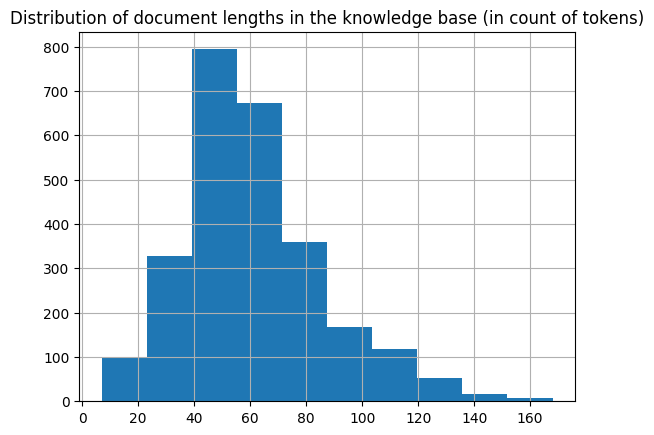

In [7]:
from sentence_transformers import SentenceTransformer
# To get the value of the max sequence_length, we will query the underlying `SentenceTransformer` object used in the RecursiveCharacterTextSplitter
print(
    f"Model's maximum sequence length: {SentenceTransformer('sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2', trust_remote_code=True).max_seq_length}"
)

# Load model directly
from transformers import AutoTokenizer, AutoModel

tokenizer = AutoTokenizer.from_pretrained("sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2")
model = AutoModel.from_pretrained("sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2")
lengths = [len(tokenizer.encode(doc.page_content)) for doc in tqdm(docs_processed)]

# Plot the distribution of document lengths, counted as the number of tokens
fig = pd.Series(lengths).hist()
plt.title("Distribution of document lengths in the knowledge base (in count of tokens)")
plt.show()

👀 As you can see, __the chunk lengths are not aligned with our limit of 512 tokens__, and some documents are above the limit, thus some part of them will be lost in truncation!

 - So we should change the `RecursiveCharacterTextSplitter` class to count length in number of tokens instead of number of characters.

 - Then we can choose a specific chunk size, here we would choose a lower threshold than 512:

    - smaller documents could allow the split to focus more on specific ideas.

    - But too small chunks would split sentences in half, thus losing meaning again: the proper tuning is a matter of balance.

  0%|          | 0/2389 [00:00<?, ?it/s]

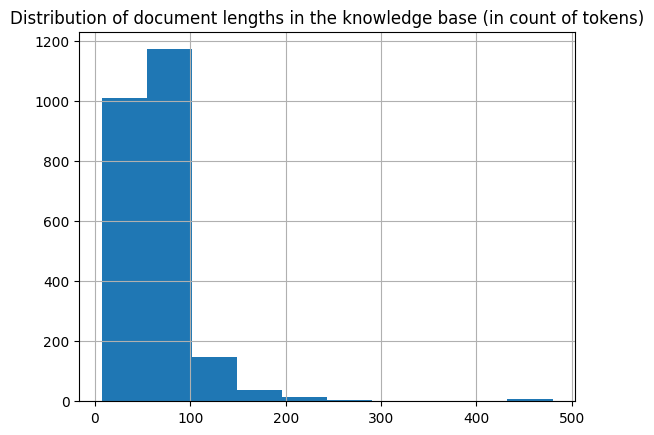

In [8]:
from langchain.text_splitter import RecursiveCharacterTextSplitter

from transformers import AutoTokenizer


EMBEDDING_MODEL_NAME = "sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2"

def split_documents(
    chunk_size: int,
    knowledge_base: List[LangchainDocument],
    tokenizer_name: Optional[str] = EMBEDDING_MODEL_NAME,
) -> List[LangchainDocument]:

    """
    Split documents into chunks of maximum size `chunk_size` tokens and return a list of documents.
    """

    text_splitter = RecursiveCharacterTextSplitter.from_huggingface_tokenizer(
        AutoTokenizer.from_pretrained(tokenizer_name),
        chunk_size=chunk_size,
        chunk_overlap=int(chunk_size / 10),
        add_start_index=True,
        strip_whitespace=True,
        separators=MARKDOWN_SEPARATORS,
    )

    docs_processed = []

    for doc in knowledge_base:
        docs_processed += text_splitter.split_documents([doc])

    # Remove duplicates
    unique_texts = {}
    docs_processed_unique = []
    for doc in docs_processed:

        if doc.page_content not in unique_texts:
            unique_texts[doc.page_content] = True
            docs_processed_unique.append(doc)
    return docs_processed_unique

docs_processed = split_documents(
    512,  # We choose a chunk size adapted to our model
    RAW_KNOWLEDGE_BASE,
    tokenizer_name=EMBEDDING_MODEL_NAME,
)

# Let's visualize the chunk sizes we would have in tokens from a common model
from transformers import AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained(EMBEDDING_MODEL_NAME)
lengths = [len(tokenizer.encode(doc.page_content)) for doc in tqdm(docs_processed)]
fig = pd.Series(lengths).hist()
plt.title("Distribution of document lengths in the knowledge base (in count of tokens)")
plt.show()

➡️ Now the chunk length distribution looks better!

### 1.2 Building the vector database



We want to compute the embeddings for all the chunks of our knowledge base: to learn more about sentence embeddings, we recommend reading [this guide](https://osanseviero.github.io/hackerllama/blog/posts/sentence_embeddings/).



#### How does retrieval work?



Once the chunks are all embedded, we store them in a vector database. When the user types in a query, it gets embedded by the same model previously used, and a similarity search returns the closest documents from the vector database.



The technical challenge is thus, given a query vector, to quickly find the nearest neighbors of this vector in the vector database. To do this, we need to choose two things: a distance, and a search algorithm to find the nearest neighbors quickly within a database of thousands of records.



##### Nearest Neighbor search algorithm



There are plentiful choices for the nearest neighbor search algorithm: we go with Facebook's [FAISS](https://github.com/facebookresearch/faiss) since FAISS is performant enough for most use cases, and it is well known and thus widely implemented.



##### Distances



Regarding distances, you can find a good guide [here](https://osanseviero.github.io/hackerllama/blog/posts/sentence_embeddings/#distance-between-embeddings). In short:



- **Cosine similarity** computes the similarity between two vectors as the cosinus of their relative angle: it allows us to compare vector directions regardless of their magnitude. Using it requires normalizing all vectors, to rescale them into unit norm.

- **Dot product** takes into account magnitude, with the sometimes undesirable effect that increasing a vector's length will make it more similar to all others.

- **Euclidean distance** is the distance between the ends of vectors.



You can try [this small exercise](https://developers.google.com/machine-learning/clustering/similarity/check-your-understanding) to check your understanding of these concepts. But once vectors are normalized, [the choice of a specific distance does not matter much](https://platform.openai.com/docs/guides/embeddings/which-distance-function-should-i-use).



Our particular model works well with cosine similarity, so choose this distance, and we set it up both in the Embedding model, and in the `distance_strategy` argument of our FAISS index. With cosine similarity, we have to normalize our embeddings.



🚨👇 The cell below takes a few minutes to run on A10G!

👀 To visualize the search for the closest documents, let's project our embeddings from 384 dimensions down to 2 dimensions using PaCMAP.



💡 _We chose PaCMAP rather than other techniques such as t-SNE or UMAP, since [it is efficient (preserves local and global structure), robust to initialization parameters and fast](https://www.nature.com/articles/s42003-022-03628-x#Abs1)._

In [9]:
from langchain.vectorstores import FAISS
from langchain_community.embeddings import HuggingFaceEmbeddings
from langchain_community.vectorstores.utils import DistanceStrategy



embedding_model = HuggingFaceEmbeddings(
    model_name=EMBEDDING_MODEL_NAME,
    multi_process=True,
    model_kwargs={"device": "cuda", "trust_remote_code": True},
    encode_kwargs={"normalize_embeddings": True},  # Set `True` for cosine similarity
)

KNOWLEDGE_VECTOR_DATABASE = FAISS.from_documents(
    docs_processed, embedding_model, distance_strategy=DistanceStrategy.COSINE
)

/tmp/ipykernel_30/4138504102.py:9: LangChainDeprecationWarning: The class `HuggingFaceEmbeddings` was deprecated in LangChain 0.2.2 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-huggingface package and should be used instead. To use it run `pip install -U :class:`~langchain-huggingface` and import as `from :class:`~langchain_huggingface import HuggingFaceEmbeddings``.
  embedding_model = HuggingFaceEmbeddings(


In [10]:
# Embed a user query in the same space
user_query = "How are Matter-specific DN attribute types encoded in X.509 ASN.1 DER format?"
query_vector = embedding_model.embed_query(user_query)

In [11]:
import pacmap
import numpy as np
import plotly.express as px

embedding_projector = pacmap.PaCMAP(
    n_components=2, n_neighbors=None, MN_ratio=0.5, FP_ratio=2.0, random_state=1
)

embeddings_2d = [
    list(KNOWLEDGE_VECTOR_DATABASE.index.reconstruct_n(idx, 1)[0])
    for idx in range(len(docs_processed))
] + [query_vector]



# Fit the data (the index of transformed data corresponds to the index of the original data)

documents_projected = embedding_projector.fit_transform(
    np.array(embeddings_2d), init="pca"
)

/opt/conda/lib/python3.10/site-packages/pacmap/pacmap.py:845: UserWarning: Warning: random state is set to 1.
  warnings.warn(f'Warning: random state is set to {_RANDOM_STATE}.')


In [13]:
print(f"\nStarting retrieval for {user_query=}...")

retrieved_docs = KNOWLEDGE_VECTOR_DATABASE.similarity_search(query=user_query, k=25)

print(

    "\n==================================Top document=================================="

)

print(retrieved_docs[0].page_content)
print("==================================Metadata==================================")
print(retrieved_docs[0].metadata)


Starting retrieval for user_query='How are Matter-specific DN attribute types encoded in X.509 ASN.1 DER format?'...

==================================Top document==================================
Query: How are Matter-specific DN attribute types encoded in Matter TLV format?
Response: When used in Matter Operational Certificate (TLV) format, Matter-specific DN attribute types are encoded as unsigned integers with the specified length.
==================================Metadata==================================
{'source': '/kaggle/input/training/train (2).csv', 'row': 222, 'start_index': 0}


# 2. Reader - LLM 💬



In this part, the __LLM Reader reads the retrieved context to formulate its answer.__



There are substeps that can all be tuned:

1. The content of the retrieved documents is aggregated together into the "context", with many processing options like _prompt compression_.

2. The context and the user query are aggregated into a prompt and then given to the LLM to generate its answer.

In [19]:
from transformers import pipeline
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM, BitsAndBytesConfig

READER_MODEL_NAME = "Qwen/Qwen2-7B-Instruct"
bnb_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_use_double_quant=True,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_compute_dtype=torch.bfloat16,
)

model = AutoModelForCausalLM.from_pretrained(
    READER_MODEL_NAME, quantization_config=bnb_config
)

tokenizer = AutoTokenizer.from_pretrained(READER_MODEL_NAME)

READER_LLM = pipeline(
    model=model,
    tokenizer=tokenizer,
    task="text-generation",
    do_sample=True,
    temperature=0.1,
    repetition_penalty=1.1,
    return_full_text=False,
    max_new_tokens=512,
)

`low_cpu_mem_usage` was None, now set to True since model is quantized.


Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/243 [00:00<?, ?B/s]

### 2.2. Prompt



The RAG prompt template below is what we will feed to the Reader LLM: it is important to have it formatted in the Reader LLM's chat template.



We give it our context and the user's question.

In [21]:
prompt_in_chat_format = [
    {
        "role": "system",
        "content": """Using the information contained in the context,
give a comprehensive answer to the question.
No need to mention references taken in the response.
Just give the answer.
Respond only to the question asked, response should be concise and relevant to the question.
If the answer cannot be deduced from the context, do not give an answer.""",
    },
    {
        "role": "user",
        "content": """Context:
{context}
---
Now here is the question you need to answer.
Question: {question}""",
    },
]

RAG_PROMPT_TEMPLATE = tokenizer.apply_chat_template(
    prompt_in_chat_format, tokenize=False, add_generation_prompt=True
)

print(RAG_PROMPT_TEMPLATE)

<|im_start|>system
Using the information contained in the context,
give a comprehensive answer to the question.
No need to mention references taken in the response.
Just give the answer.
Respond only to the question asked, response should be concise and relevant to the question.
If the answer cannot be deduced from the context, do not give an answer.<|im_end|>
<|im_start|>user
Context:
{context}
---
Now here is the question you need to answer.
Question: {question}<|im_end|>
<|im_start|>assistant



Let's test our Reader on our previously retrieved documents!

In [22]:
retrieved_docs_text = [
    doc.page_content for doc in retrieved_docs
]  # We only need the text of the documents

context = "\nExtracted documents:\n"
context += "".join(
    [f"Document {str(i)}:::\n" + doc for i, doc in enumerate(retrieved_docs_text)]
)

final_prompt = RAG_PROMPT_TEMPLATE.format(
    question="How are Matter-specific DN attribute types encoded in X.509 ASN.1 DER format?", context=context
)

# Redact an answer
answer = READER_LLM(final_prompt)[0]["generated_text"]
print(answer)

The context does not provide information on how Matter-specific DN attribute types are encoded in X.509 ASN.1 DER format.


### 2.3. Reranking



A good option for RAG is to retrieve more documents than you want in the end, then rerank the results with a more powerful retrieval model before keeping only the `top_k`.



For this, [Colbertv2](https://arxiv.org/abs/2112.01488) is a great choice: instead of a bi-encoder like our classical embedding models, it is a cross-encoder that computes more fine-grained interactions between the query tokens and each document's tokens.



It is easily usable thanks to [the RAGatouille library](https://github.com/bclavie/RAGatouille).

In [28]:
from ragatouille import RAGPretrainedModel
RERANKER = RAGPretrainedModel.from_pretrained("colbert-ir/colbertv2.0")

artifact.metadata:   0%|          | 0.00/1.63k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/405 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning:

`clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884

/opt/conda/lib/python3.10/site-packages/colbert/utils/amp.py:12: FutureWarning:

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.



# 3. Assembling it all!

In [29]:
import pandas as pd
from transformers import Pipeline
from typing import Tuple, List, Optional

# Assuming your existing function is defined here
def answer_with_rag(
    question: str,
    llm: Pipeline,
    knowledge_index: FAISS,
    reranker: Optional[RAGPretrainedModel] = None,
    num_retrieved_docs: int = 30,
    num_docs_final: int = 25,
) -> Tuple[str, List[str]]:
    # Gather documents with retriever
    print("=> Retrieving documents...")
    relevant_docs = knowledge_index.similarity_search(query=question, k=num_retrieved_docs)
    relevant_docs = [doc.page_content for doc in relevant_docs]  # Keep only the text

    # Optionally rerank results
    if reranker:
        print("=> Reranking documents...")
        relevant_docs = reranker.rerank(question, relevant_docs, k=num_docs_final)
        relevant_docs = [doc["content"] for doc in relevant_docs]

    relevant_docs = relevant_docs[:num_docs_final]

    # Build the final prompt
    context = "\nExtracted documents:\n"
    context += "".join(
        [f"Document {str(i)}:::\n" + doc for i, doc in enumerate(relevant_docs)]
    )

    final_prompt = RAG_PROMPT_TEMPLATE.format(question=question, context=context)

    # Generate an answer
    print("=> Generating answer...")
    answer = llm(final_prompt)[0]["generated_text"]

    return answer, relevant_docs


# Load queries from test.csv and generate inferences
def generate_inferences_from_csv(file_path: str, llm: Pipeline, knowledge_index: FAISS, reranker: Optional[RAGPretrainedModel] = None, output_csv: str = "results.csv"):
    # Read the CSV file
    df = pd.read_csv(file_path)  # Ensure the CSV has a column named 'query'

    results = []  # List to store results

    # Iterate through each query in the DataFrame
    for index, row in df.iterrows():
        # Skip the 484th row (index 483 because indexing is zero-based)
        if index == 483:
            print(f"Skipping query 484: {row['Query']}")
            continue

        question = row['Query']  # Access the query column
        print(f"Processing query {index + 1}: {question}")  # Print current query for tracking

        # Call the answer_with_rag function
        answer, relevant_docs = answer_with_rag(
            question, llm, knowledge_index, reranker=reranker
        )

        # Store the result along with the relevant documents
        results.append({'query': question, 'answer': answer, 'relevant_docs': relevant_docs})

        # Print results for each query
        print("==================================Answer==================================")
        print(f"{answer}")
        print("==================================Source docs==================================")
        for i, doc in enumerate(relevant_docs):
            print(f"Document {i}------------------------------------------------------------")
            print(doc)

        # Save to CSV after every 10 iterations
        if (index + 1) % 10 == 0:
            print(f"Saving progress to {output_csv} after processing {index + 1} queries...")
            intermediate_df = pd.DataFrame(results)
            intermediate_df.to_csv(output_csv, index=False)

    # Save the final results to a CSV file
    results_df = pd.DataFrame(results)
    results_df.to_csv(output_csv, index=False)
    print(f"Final results saved to {output_csv}")
    return results_df  # Return results as a DataFrame


# Example usage:
results_df = generate_inferences_from_csv('/kaggle/input/test-dataset/test.csv', READER_LLM, KNOWLEDGE_VECTOR_DATABASE, reranker=RERANKER, output_csv='inference_results.csv')
print(results_df)

Processing query 1: What qualities are defined in tables describing attributes, commands, etc.?
=> Retrieving documents...


/opt/conda/lib/python3.10/site-packages/colbert/utils/amp.py:15: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



=> Reranking documents...


100%|██████████| 1/1 [00:00<00:00,  8.42it/s]


=> Generating answer...
==================================Answer==================================
In tables describing attributes, commands, etc., several qualities are defined to characterize their behavior and usage. These include:

- Nullable: Indicates if the data field can be null.
- Non-Volatile: Specifies if the attribute's value persists even after a system reset.
- Fixed: Denotes if the value of the attribute is immutable.
- Scene: Marks if the attribute is part of a scene definition.
- Reportable: Shows if the attribute supports reporting mechanisms.
- Changes Omitted: States if changes to the data are not reported.
- Singleton: Highlights if the cluster is a singleton on the node.
-!Q: Denotes exclusions related to certain qualities.

For commands, qualities might include aspects like ID, Name, Type, Constraint, Quality, Default, and Conformance.

Attributes in classification sections often have qualities such as Hierarchy, Role, Scope, and PICS Code.

The Valid Read Attrib

100%|██████████| 1/1 [00:00<00:00,  9.51it/s]

=> Generating answer...


==================================Answer==================================
The UniqueID attribute, when present, for a Bridged Device should be updated when the Bridge is factory reset.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the RxErrInvalidSrcAddrCount attribute indicate?
Response: The RxErrInvalidSrcAddrCount attribute indicates the total number of received unique MAC frame requests that have been dropped as a result of containing an invalid source address.
Document 1------------------------------------------------------------
Query: What is the purpose of the UniqueID attribute?
Response: The UniqueID attribute, when present, for a Bridged Device should be updated when the Bridge is factory reset.
Document 2------------------------------------------------------------
Query: What does the ProductID Attribute specify?
Response: The ProductID Attribute specif

100%|██████████| 1/1 [00:00<00:00,  7.43it/s]

=> Generating answer...


==================================Answer==================================
The signature algorithm used to sign the DAC is ecdsa-with-SHA256.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the signature algorithm used to sign the DAC?
Response: The DAC is signed using the ecdsa-with-SHA256 signature algorithm.
Document 1------------------------------------------------------------
Query: What is the signature algorithm used in the DAC?
Response: The signature algorithm used in the DAC is ecdsa-with-SHA256.
Document 2------------------------------------------------------------
Query: What should the signature field of the DAC contain?
Response: The signature field must contain the identifier for the ecdsa-with-SHA256 signature algorithm.
Document 3------------------------------------------------------------
Query: What is the signature algorithm used in the PAA certifica

100%|██████████| 1/1 [00:00<00:00,  8.79it/s]

=> Generating answer...


==================================Answer==================================
The scalar fields in the nonce are encoded as specified in Table 15, “Nonce”, consisting of three octets: Security Flags, Message Counter, and Source Node ID.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the nonce formatted?
Response: The nonce is formatted as specified in Table 15, âNonceâ, which consists of three octets: Security Flags, Message Counter, and Source Node ID.
Document 1------------------------------------------------------------
Query: How is the Privacy Nonce constructed?
Response: The Privacy Nonce, used for Privacy Processing, is constructed as a concatenation of the 16-bit Session ID (in big-endian format) and the lower 11 bytes of the Message Integrity Check (MIC). It is created as a CRYPTO_AEAD_NONCE_LENGTH_BYTES-octet string. For example, if the Session ID is 42 and t

100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


=> Generating answer...
==================================Answer==================================
SRP
==================================Source docs==================================
Document 0------------------------------------------------------------
SRP: Service Registration Protocol, a protocol for registering services in DNS-SD. URL: https://tools.ietf.org/html/draft-ietf-dnssd-srp

Thread: Thread 1.3.0 Specification, a protocol for IoT (Internet of Things) network communications. URL: https://www.threadgroup.org

Verhoeff: Error detecting decimal codes, a study on error detection in coding. J. Verhoeff, 1969. URL: https://ir.cwi.nl/pub/13045

X.501: ITU X.501: Information technology - Open Systems Interconnection - The Directory: Models, part of the OSI model specifications. URL: https://www.itu.int/rec/T-REC-X.501/en

X.509: ITU X.509: Information technology - Open Systems Interconnection - The Directory: Public-key and attribute certificate frameworks, specifies standards for 

100%|██████████| 1/1 [00:00<00:00,  6.08it/s]

=> Generating answer...


==================================Answer==================================
Operational groups within a Fabric are identified through Group Identifiers, which allow for the formation of logical collections of Nodes running common applications and sharing a common security domain via a shared symmetric group key known as the Operational Group Key. These identifiers help in creating subgroups within larger operational groups by defining distinct Group Identifiers for each set of Nodes while maintaining the use of the same Operational Group Key. This facilitates secure communication and collaboration among the Nodes within the specified group context.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is an operational group, and what role does it play in a Fabric?
Response: An operational group is a logical collection of Nodes that run one or more common application clusters and

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
If the AddOrUpdateThreadNetwork command is received without an armed fail-safe context, it shall fail with a FAILSAFE_REQUIRED status code sent back to the initiator.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens if the ConnectNetwork command is received without an armed fail-safe context?
Response: If the ConnectNetwork command is received without an armed fail-safe context, then this command shall fail with a FAILSAFE_REQUIRED status code sent back to the initiator.
Document 1------------------------------------------------------------
Query: What happens if the RemoveNetwork command is received without an armed fail-safe context?
Response: If the RemoveNetwork command is received without an armed fail-safe context, then this command shall fail with a FAILSAFE_REQ

100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


=> Generating answer...
==================================Answer==================================
In the Matter protocol, Vendor IDs ranging from 0x80 to 0xFF are reserved for use by vendors to tag manufacturer-specific elements in the TLV Data section. These IDs uniquely identify the vendor of a device, facilitating its identification and differentiation in networked environments.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are manufacturer-specific elements tagged in the TLV Data section?
Response: Manufacturer-specific elements are tagged with context-specific tags defined by the vendor for use in products using their Vendor ID. These tags range from 0x80 to 0xFF.
Document 1------------------------------------------------------------
Query: What is a Vendor ID (VID)?
Response: A Vendor ID (VID) is a 16-bit number that uniquely identifies the Vendor of a Device, faci

100%|██████████| 1/1 [00:00<00:00,  5.21it/s]
You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


=> Generating answer...
==================================Answer==================================
The Bridged Device Basic Information Cluster supports the StateChanged and ActionFailed events.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Bridged Device Basic Information Cluster?
Response: The Bridged Device Basic Information Cluster serves two purposes: to indicate that the functionality on the Endpoint where it is placed (and its Parts) is bridged from a non-Matter technology, and to provide a centralized collection of attributes that the Node MAY collect to convey information regarding the Bridged Device to a user, such as vendor name, model name, or user-assigned name.
Document 1------------------------------------------------------------
Query: Where should the Bridged Device Basic Information Cluster be exposed?
Response: This cluster SHALL 

100%|██████████| 1/1 [00:00<00:00,  3.19it/s]


=> Generating answer...
==================================Answer==================================
The Status field in StatusIB indicates the status of an operation or entity, defining whether the action was successful or encountered errors.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the StatusIB represent?
Response: The StatusIB is used to respond with errors or success to actions, with the Status field indicating the status and the ClusterStatus field representing status values defined in a cluster specification.
Document 1------------------------------------------------------------
Query: What is the significance of the Status Codes mentioned in the StatusIB description?
Response: The Status Codes define valid values for the Status field in the StatusIB, indicating whether the action was successful or encountered errors.
Document 2-----------------------------

100%|██████████| 1/1 [00:00<00:00,  7.39it/s]

=> Generating answer...


==================================Answer==================================
The structure of the Packed Binary Data Structure in the QR code is based on the schema description of the specified attribute within the specified cluster.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the structure of the contents of the Data field?
Response: The contents of the Data field consist of a top-level anonymous list, with each list element including a profile-specific tag encoded in fully-qualified form.
Document 1------------------------------------------------------------
Query: How is the data structured in the AttributeDataIB?
Response: The data structure in the AttributeDataIB is based on the schema description of the specified attribute within the specified cluster.
Document 2------------------------------------------------------------
Query: What is the format of the QR code

100%|██████████| 1/1 [00:00<00:00, 11.45it/s]

=> Generating answer...


==================================Answer==================================
The ActiveCalendarType attribute represents the calendar format that the Node is currently configured to use when conveying dates.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of the ActiveCalendarType attribute?
Response: The ActiveCalendarType attribute represents the calendar format that the Node is currently configured to use when conveying dates.
Document 1------------------------------------------------------------
Query: What happens if the ActiveCalendarType attribute is null?
Response: If the ActiveCalendarType attribute is null, the calendar type is determined by any unit implied through the ActiveLocale attribute. If ActiveLocale is not present, the calendar type is unknown.
Document 2------------------------------------------------------------
Query: What does the 

100%|██████████| 1/1 [00:00<00:00, 10.23it/s]

=> Generating answer...


==================================Answer==================================
The Cluster ID of the Super Disco Ball cluster is not directly provided in the extracted documents.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What features are supported by the Super Disco Ball cluster?
Response: The Super Disco Ball cluster supports features such as Axis, Wobble, Pattern, Statistics, and Reverse.
Document 1------------------------------------------------------------
Query: What is the hierarchy role of the Super Disco Ball cluster?
Response: The hierarchy role of the Super Disco Ball cluster is Application Endpoint.
Document 2------------------------------------------------------------
Query: What is the maximum allowed length for the Name attribute?
Response: The maximum allowed length for the Name attribute in the Super Disco Ball cluster is 32.
Document 3-----------------------

100%|██████████| 1/1 [00:00<00:00,  6.39it/s]

=> Generating answer...


==================================Answer==================================
A Group ID is a 16-bit identifier for a group that is scoped to a particular fabric, also indicated by an accompanying fabric index.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a Universal Group ID (UGID)?
Response: A UGID resides in the 16-bit subrange reserved for groups common across the Matter standard, enabling multicast, groupcast, or anycast destinations known to all Nodes on any Fabric.
Document 1------------------------------------------------------------
Query: How is a Group ID defined and scoped in the Matter Specification?
Response: A Group ID is a 16-bit identifier for a group that is scoped to a particular fabric, also indicated by an accompanying fabric index.
Document 2------------------------------------------------------------
Query: How is the size of Group Session IDs opt

100%|██████████| 1/1 [00:00<00:00,  7.78it/s]

=> Generating answer...


==================================Answer==================================
The context provided does not explicitly list examples of valid encodings using the fallback method. However, it outlines the structure and requirements for encoding VendorID and ProductID using the fallback method. Valid encodings would adhere to these guidelines:

- VendorID value is encoded with substring `Mvid:` followed by exactly 4 uppercase hexadecimal characters without elision of leading zeroes.
- ProductID value is encoded with substring `Mpid:` followed by exactly 4 uppercase hexadecimal characters without elision of leading zeroes.

For instance, a valid encoding might look like this:
```
Mvid:ABCD
Mpid:EFGH
```

Where `ABCD` and `EFGH` are four-character hexadecimal strings representing the VendorID and ProductID respectively.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are examples

100%|██████████| 1/1 [00:00<00:00,  9.16it/s]

=> Generating answer...


==================================Answer==================================
The NetworkFaultChange event data contains the Current list[NetworkFaultEnum] field and the Previous list[NetworkFaultEnum] field.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information does the HardwareFaultChange event data contain?
Response: The HardwareFaultChange event data contains the current set of hardware faults detected and the set of faults detected prior to the change event.
Document 1------------------------------------------------------------
Query: What are the fields included in the NetworkFaultChange event?
Response: The NetworkFaultChange event includes the Current list[NetworkFaultEnum] field and the Previous list[NetworkFaultEnum] field.
Document 2------------------------------------------------------------
Query: What does the NetworkFaultChange event indicate?
Response: T

100%|██████████| 1/1 [00:00<00:00, 10.56it/s]

=> Generating answer...


==================================Answer==================================
A Client in the context of clusters refers to an entity that interacts with a server cluster to perform specific functions or services. This interaction involves sending requests and receiving responses through predefined commands and attributes. Essentially, a client utilizes the functionalities provided by a server cluster to achieve its intended operations, such as retrieving data, controlling devices, or performing various tasks within an IoT system.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Binding cluster?
Response: The Binding cluster represents a persistent relationship between an endpoint and one or more other local or remote endpoints, informing a client endpoint of potential interaction targets.
Document 1--------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00, 10.58it/s]

=> Generating answer...


==================================Answer==================================
The Unit Localization Cluster provides attributes for determining and configuring localization information related to units of measurement, ensuring consistency and accuracy when conveying values across different global regions.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Localization Configuration Cluster?
Response: The Localization Configuration Cluster provides attributes for determining and configuring localization information that a Node shall utilize when conveying values to a user, considering differing common languages, units of measurements, and numerical formatting standards across global regions.
Document 1------------------------------------------------------------
Query: What is the purpose of the Time Synchronization Cluster?
Response: The Time Synchronization

100%|██████████| 1/1 [00:00<00:00, 10.17it/s]

=> Generating answer...


==================================Answer==================================
The RegisterClientResponse command is generated in response to a RegisterClient command. It contains a status code indicating the outcome of the registration process.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the RegisterClient command?
Response: The RegisterClient command allows a client to register itself with the ICD to be notified when the device is available for communication.
Document 1------------------------------------------------------------
Query: What is the purpose of the CertificateChainResponse command?
Response: The CertificateChainResponse command is generated in response to a CertificateChainRequest command.
Document 2------------------------------------------------------------
Query: What is the purpose of StatusResponseMessage?
Response: StatusResponseMess

100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


=> Generating answer...
==================================Answer==================================
The determination of whether an unsynchronized message is processed immediately or stored for later processing is based on the message's Session Type. Specifically, if the message is of Unsecured Session Type, it is processed immediately without any synchronization checks. However, if the message is of Secure Unicast Session Type or Group Session Type, it requires validity checks such as ensuring the Version field is correct, checking the DSIZ field based on the session type, verifying privacy and encryption keys, performing privacy and security processing, enforcing replay protection, handling message reliability, updating timestamps, and delivering the message to further processing stages.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What steps are involved in processing a re

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


=> Generating answer...
==================================Answer==================================
The purpose of the Global Group Encrypted Data Message Counter is to generate message counters for encrypted data messages sent to a group.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Global Group Encrypted Data Message Counter?
Response: The Global Group Encrypted Data Message Counter is used to generate message counters for encrypted data messages sent to a group.
Document 1------------------------------------------------------------
Query: What is the purpose of the Global Group Encrypted Control Message Counter?
Response: The Global Group Encrypted Control Message Counter is used to generate message counters for encrypted control messages sent to a group.
Document 2------------------------------------------------------------
Query: Are Nodes requ

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


=> Generating answer...
==================================Answer==================================
In a BDX data transfer, blocks are sent in ascending and sequential block counter order. They serve as containers for the actual bulk transfer data and can have a payload length that does not exactly match the negotiated maximum block size.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Block message in a BDX data transfer?
Response: The Block message serves as the container for the actual bulk transfer data. It is sent in ascending and sequential block counter order and can have a payload length that does not exactly match the negotiated max block size.
Document 1------------------------------------------------------------
Query: What does the BlockEOF message represent in a BDX data transfer?
Response: The BlockEOF message represents the final block i

100%|██████████| 1/1 [00:00<00:00, 13.10it/s]

=> Generating answer...


==================================Answer==================================
The Read Request Action is designed to initiate the retrieval of specific attribute and event data. It specifies details such as requested attribute and event paths, their versions, event numbers, and applies fabric-scoped filtering. This action enables clients to query data models for updates or current states, facilitating communication between devices or systems in networked environments.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information is included in the Read Request Action?
Response: The Read Request Action includes fields such as AttributeRequests, DataVersionFilters, EventRequests, EventFilters, and FabricFiltered, specifying the requested attribute and event data, data versions, event numbers, and fabric-scoped filtering.
Document 1-------------------------------------------------

100%|██████████| 1/1 [00:00<00:00, 11.63it/s]

=> Generating answer...


==================================Answer==================================
In this specification, a path is used to indicate specific locations or instances within a system, such as events, commands, attributes, struct fields, or list entries. It serves as a means to precisely identify and access particular data points or operations within the system's architecture.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What do concrete paths represent within the context of this part of the specification, where path definitions are provided?
Response: Concrete paths signify individual element instances, such as events, commands, attributes, struct fields, or list entries, as described in this section.
Document 1------------------------------------------------------------
Query: What is an attribute path used for?
Response: An attribute path is used to indicate all or part of a cluster

100%|██████████| 1/1 [00:00<00:00,  9.40it/s]

=> Generating answer...


==================================Answer==================================
The ClientsSupportedPerFabric attribute specifies the number of clients that a fabric can support simultaneously.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ClientsSupportedPerFabric attribute represent?
Response: ClientsSupportedPerFabric specifies the number of clients supported per fabric.
Document 1------------------------------------------------------------
Query: What is the significance of the MaxGroupKeysPerFabric attribute?
Response: The MaxGroupKeysPerFabric attribute specifies the maximum number of group key sets that a node supports per fabric.
Document 2------------------------------------------------------------
Query: What constraints are imposed on the AccessControlEntriesPerFabric attribute?
Response: The AccessControlEntriesPerFabric attribute specifies the minimum nu

100%|██████████| 1/1 [00:00<00:00, 13.05it/s]

=> Generating answer...


==================================Answer==================================
The Path field in DataVersionFilterIB must indicate either an existent path or a concrete path.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What constraint applies to the Path field in CommandDataIB and CommandStatusIB?
Response: The Path field in CommandDataIB and CommandStatusIB must indicate a concrete path.
Document 1------------------------------------------------------------
Query: What constraint applies to the Path field in EventDataIB?
Response: The Path field in EventDataIB must indicate an existent path.
Document 2------------------------------------------------------------
Query: What constraint applies to the Path field in EventStatusIB?
Response: The Path field in EventStatusIB must indicate a concrete path.
Document 3------------------------------------------------------------
Query: W

100%|██████████| 1/1 [00:00<00:00, 10.23it/s]

=> Generating answer...


==================================Answer==================================
The RouterRoleCount attribute indicates the number of times the Node has served as a router or leader on the Thread network.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the PacketMulticastRxCount attribute indicate?
Response: The PacketMulticastRxCount attribute indicates the number of multicast packets received by the Node.
Document 1------------------------------------------------------------
Query: What does the PacketUnicastRxCount attribute indicate?
Response: The PacketUnicastRxCount attribute indicates the number of unicast packets received by the Node.
Document 2------------------------------------------------------------
Query: What does the OverrunCount attribute indicate?
Response: The OverrunCount attribute indicates the number of packets dropped either at ingress or egress, due

100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


=> Generating answer...
==================================Answer==================================
The consistency throughout the updates to NOCs and ACL entries in the examples lies in the validation processes and responses they follow. Specifically, these include:

- **Validation**: Both AddNOC and UpdateNOC commands undergo validations such as cryptographic verification of the NOC, matching the public key of the NOC with the last generated operational public key, and validation of DN Encoding Rules.

- **Error Handling**: Upon successful execution of the AddNOC command, there is immediate error response handling through the NOCResponse command, which includes the StatusCode field indicating the outcome of the operation.

- **State Preservation**: The AddNOC command ensures that all non-volatile states of the device remain unchanged even when errors occur during the operation.

- **ACL Updates**: Access Control Entries are revised by updating the ACL with new entries reflecting the r

100%|██████████| 1/1 [00:00<00:00, 12.86it/s]

=> Generating answer...


==================================Answer==================================
Revisions in the Matter specification mark changes and improvements over previous versions. They range from adding usage descriptions for TagList in Revision 2, to introducing secure session establishment protocols, group communication, and bulk data transfer in later revisions. Each revision aims to enhance security, maintainability, and compatibility across smart home devices. The modular design allows for seamless updates to cryptographic suites and protocols without altering the core specification significantly.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of Matter revision 1?
Response: - Matter revision 1 is considered equivalent to revision 16. - Subsequent releases of Matter start at revision 17.
Document 1------------------------------------------------------------
Query: 

100%|██████████| 1/1 [00:00<00:00, 10.39it/s]

=> Generating answer...


==================================Answer==================================
The TxBeaconCount attribute indicates the total number of unique MAC Beacon frame transmission requests.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the TxBeaconRequestCount attribute indicate?
Response: The TxBeaconRequestCount attribute indicates the total number of unique MAC Beacon Request frame transmission requests.
Document 1------------------------------------------------------------
Query: What does the TxErrCcaCount attribute indicate?
Response: The TxErrCcaCount attribute indicates the total number of CCA failures.
Document 2------------------------------------------------------------
Query: What does the TxOtherCount attribute indicate?
Response: The TxOtherCount attribute indicates the total number of unique MAC frame transmission requests that are not counted by any other attr

100%|██████████| 1/1 [00:00<00:00, 11.20it/s]

=> Generating answer...


==================================Answer==================================
The 'ScanNetworks' command is used to scan for available networks. It requires two arguments: SSID (Service Set Identifier) and Breadcrumb. Upon execution, it returns a 'ScanNetworksResponse' that contains the status of the last scan operation and associated scan results if the operation was successful. Additionally, the 'ScanNetworksResponse' includes details under the 'ThreadScanResults' field specifically related to Thread network scans.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the 'ScanNetworksResponse' command contain?
Response: The 'ScanNetworksResponse' command contains the status of the last scan operation and associated scan results if successful.
Document 1------------------------------------------------------------
Query: What are the arguments for the 'ScanNetworks' command?


100%|██████████| 1/1 [00:00<00:00,  7.81it/s]

=> Generating answer...


==================================Answer==================================
The BatChargeFaultEnum data type specifies five fault conditions related to battery charging: ambient temperature, battery temperature, battery absence, charger voltage, and charging safety timeout.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the BatChargeFaultEnum data type specify?
Response: The BatChargeFaultEnum data type specifies various fault conditions related to battery charging, including ambient temperature, battery temperature, battery absence, charger voltage, and charging safety timeout.
Document 1------------------------------------------------------------
Query: What are some of the types of faults described in the HardwareFaultEnum?
Response: Some of the types of faults described in the HardwareFaultEnum include Unspecified, Radio, Sensor, ResettableOverTemp, NonResettableO

100%|██████████| 1/1 [00:00<00:00, 11.00it/s]

=> Generating answer...


==================================Answer==================================
The TLV Type for CommandPathIB is List.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is CommandPathIB?
Response: CommandPathIB is a TLV structure used to specify the path to a command, including the endpoint, cluster, and command itself.
Document 1------------------------------------------------------------
Query: What is the TLV Type for AttributePathIB?
Response: The TLV Type for AttributePathIB is List.
Document 2------------------------------------------------------------
Query: What is the TLV Type for CommandDataIB?
Response: The TLV Type for CommandDataIB is Structure (Anonymous).
Document 3------------------------------------------------------------
Query: What is the TLV Type for DataVersionFilterIB?
Response: The TLV Type for DataVersionFilterIB is Structure.
Document 4-----------------

100%|██████████| 1/1 [00:00<00:00,  9.07it/s]

=> Generating answer...


==================================Answer==================================
The SourceList field in the ConfigurationStruct Type contains a list of source nodes or devices that have contributed to the configuration settings or parameters stored in the structure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Sources attribute in the Power Source Configuration Cluster contain?
Response: The Sources attribute contains the set of all power sources capable of participating in the power system of a Node, with each entry being the endpoint number of an endpoint having a Power Source cluster.
Document 1------------------------------------------------------------
Query: How many fields are included in the AccessControlTargetStruct type?
Response: The AccessControlTargetStruct type includes three fields: Cluster, Endpoint, and Device Type, allowing for specification of tar

100%|██████████| 1/1 [00:00<00:00, 10.60it/s]

=> Generating answer...


==================================Answer==================================
To set up Visual Studio Code for development in Matter, follow these recommended configurations:

1. **Editor Settings**: Configure your editor to automatically format code on save, enhancing productivity and consistency.

2. **Extension Installation**: Enable the `clang-format` extension to maintain consistent formatting across your codebase.

3. **Customization**: Explore additional settings and customization options tailored to your development workflow, optimizing the environment for working with Matter applications.

These steps streamline the development process, ensuring code quality and efficiency when working with Matter standards in Visual Studio Code.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are some recommendations for configuring Visual Studio Code in Matter?
Response: Recommenda

100%|██████████| 1/1 [00:00<00:00,  6.68it/s]

=> Generating answer...


==================================Answer==================================
In MRP, acknowledgments are conveyed in a piggybacked manner when a receiver uses the next message destined to the peer to include an acknowledgment. This can happen through either a "piggybacked" acknowledgment within the same message or a standalone acknowledgment followed by another message.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is piggyback acknowledgment processing performed in MRP?
Response: Piggyback acknowledgment processing in MRP involves determining if there is a matching pending acknowledgment for the given message and setting the A Flag on the outbound message if a match is found.
Document 1------------------------------------------------------------
Query: How does a receiver acknowledge a reliable message in MRP?
Response: A receiver acknowledges a reliable message by either 

100%|██████████| 1/1 [00:00<00:00,  7.87it/s]

=> Generating answer...


==================================Answer==================================
Matter Nodes support a number of IPv6 neighbor cache entries at least as large as the number of supported CASE sessions plus the number of supported routes.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What support is required from Matter Nodes regarding IPv6 neighbor cache entries?
Response: Matter Nodes support a number of IPv6 neighbor cache entries at least as large as the number of supported CASE sessions plus the number of supported routes.
Document 1------------------------------------------------------------
Query: What is the minimal requirement for IPv6 neighbor cache entry?
Response: Defined in Section 4.2.2, âMatter Node Behaviorâ.
Document 2------------------------------------------------------------
Query: What are the IPv6 network configuration requirements for Matter Nodes?
Respons

100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


=> Generating answer...
==================================Answer==================================
The EndpointListTypeEnum Type defines the different types of endpoint lists, such as a list of endpoints grouped by their function or characteristics, allowing for organization and management of endpoints within a system.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the DeviceTypeStruct type?
Response: The DeviceTypeStruct type indicates the device type definition, ensuring endpoint conformance to the device type definition and cluster specifications required by the device type.
Document 1------------------------------------------------------------
Query: What is the "EndpointListStruct" type used for?
Response: The "EndpointListStruct" type holds details of a single endpoint list, relating to a set of endpoints with some logical relation.
Document 2-----

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


=> Generating answer...
==================================Answer==================================
The two options for a proxy are determined by'sniffing' the Proxy Discover Response Command messages emitted by other proxies.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How can proxies select between the two options?
Response: Proxies can select between the two options by 'sniffing' the Proxy Discover Response Command messages emitted by other proxies.
Document 1------------------------------------------------------------
Query: What are the commands listed under the Proxy Discovery Cluster?
Response: There are two commands: Proxy Discover Request and Proxy Discover Response.
Document 2------------------------------------------------------------
Query: What parameters are harmonized by the proxy?
Response: The proxy harmonizes parameters such as Attribute/EventPaths, DataVer

100%|██████████| 1/1 [00:00<00:00,  2.32it/s]


=> Generating answer...
==================================Answer==================================
The OTA Software Update Provider Cluster supports BDXSynchronous, BDXAsynchronous, HTTPS, and VendorSpecific protocols for downloads.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What protocols should the OTA Provider prefer when responding to a QueryImage command?
Response: The OTA Provider should prefer BDXSynchronous or BDXAsynchronous protocols if supported by the OTA Requestor, otherwise HTTPS, and limit the usage of VendorSpecific protocol (Section Download Protocol selection).
Document 1------------------------------------------------------------
Query: What clusters are required for each node supporting the OTA Provider device type?
Response: Each node supporting the OTA Provider device type must include the OTA Software Update Requestor and OTA Software Update Provider

100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


=> Generating answer...
==================================Answer==================================
The DeviceTypeList attribute requires an endpoint to conform to all device types listed within it.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the DeviceTypeList attribute?
Response: The DeviceTypeList attribute is a list of device types and corresponding revisions that declare endpoint conformance, ensuring that an endpoint conforms to all listed device types.
Document 1------------------------------------------------------------
Query: How should an endpoint handle multiple device types listed in the DeviceTypeList attribute?
Response: An endpoint should conform to all device types listed in the DeviceTypeList attribute, supporting shared cluster instances for clusters common to multiple device types.
Document 2-----------------------------------------

100%|██████████| 1/1 [00:00<00:00,  7.95it/s]

=> Generating answer...


==================================Answer==================================
The Start Offset (STARTOFS) field is not mentioned in the provided context, so there is no information about its purpose.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the StartAction command do?
Response: The StartAction command triggers the commencement of an action on the involved endpoints, and afterward, the action's state becomes Active.
Document 1------------------------------------------------------------
Query: What does the StartActionWithDuration command do in Example 2?
Response: In Example 2, the StartActionWithDuration command triggers the server to activate a dynamic pattern with colors inspired by sunset on the associated lights for a specified duration, such as "play sunset in living room for 1 hour".
Document 2------------------------------------------------------------
Quer

100%|██████████| 1/1 [00:00<00:00, 10.17it/s]

=> Generating answer...


==================================Answer==================================
Each entry in the LabelList attribute represents a label associated with an endpoint or cluster, providing additional information or metadata.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the LabelList attribute in the context of device communication?
Response: The LabelList attribute is used to represent labels associated with endpoints or clusters, providing additional information or metadata.
Document 1------------------------------------------------------------
Query: What does each entry in the Binding attribute represent?
Response: Each entry in the Binding attribute represents a binding.
Document 2------------------------------------------------------------
Query: What does the LabelList attribute allow for each endpoint?
Response: The LabelList attribute allows each endp

100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


=> Generating answer...
==================================Answer==================================
Profile-specific tags identify elements that are unique to a particular configuration or setup within a system. They are composed of three parts: a 16-bit Vendor ID, a 16-bit profile number, and a 32-bit tag number. This allows for customization and differentiation among various profiles or configurations while maintaining compatibility within the overall system framework.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the composition of a profile-specific tag in the Matter TLV format?
Response: A profile-specific tag is a 64-bit number composed of a 16-bit Vendor ID, a 16-bit profile number, and a 32-bit tag number.
Document 1------------------------------------------------------------
Query: What do context-specific tags identify?
Response: Context-specific tags identif

100%|██████████| 1/1 [00:00<00:00, 10.64it/s]

=> Generating answer...


==================================Answer==================================
Matter ensures interoperability between Nodes in different Fabrics by using a common application layer and data model, allowing devices to communicate across multiple IP network technologies. Additionally, it employs a concept called "bridging," which enables devices implementing other home automation technologies, transports, and link layers to be made available through a data model node, thus facilitating communication and cooperation among devices from various brands and networks.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does Matter ensure interoperability?
Response: Matter ensures interoperability by allowing devices from multiple brands to work together seamlessly without requiring additional setup or configuration.
Document 1------------------------------------------------------------
Qu

100%|██████████| 1/1 [00:00<00:00,  5.89it/s]

=> Generating answer...


==================================Answer==================================
In Matter, the Elliptic Curve Diffie-Hellman (ECDH) algorithm is used to compute a shared secret between two parties. This is done using the `Crypto_ECDH_SharedSecret()` function, which takes the recipient's public key and the sender's private key as inputs. The function performs the ECDH operation, resulting in a shared secret that can be used for further cryptographic purposes, such as generating symmetric keys for encryption and decryption.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is a key pair generated in Matter's public key cryptography?
Response: A key pair is generated using the Crypto_GenerateKeyPair() function, which internally uses the ECCGenerateKeypair() method according to SEC 1 Section 3.2.1.
Document 1------------------------------------------------------------
Query: How are c

100%|██████████| 1/1 [00:00<00:00,  6.39it/s]

=> Generating answer...


==================================Answer==================================
MRP handles duplicate messages by checking the message's Message Counter against a history window. If the message counter matches any within the window or equals the maximum message counter, the message is considered a duplicate and discarded. If the message counter falls outside the valid window but was marked as previously received, specific procedures outlined in Section 4.11.5.2 ("Reliable Message Processing of Incoming Messages") are applied. Otherwise, the message updates the Message Reception State and proceeds for further processing.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does MRP handle duplicate messages requesting acknowledgment?
Response: MRP handles duplicate messages requesting acknowledgment by immediately sending a standalone acknowledgment. If the Exchange is marked as an ep

100%|██████████| 1/1 [00:00<00:00,  9.36it/s]

=> Generating answer...


==================================Answer==================================
In the context of a specification, the term "provisional" means that certain parts of the document may not be final and could be subject to change. These sections are identified before the full publication of the specification to indicate that they might evolve during the development process. This allows for flexibility and adaptation based on feedback and further analysis.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does it mean when a specification is marked as provisional?
Response: When a specification is marked as provisional, it means that there may be sections of the specification text (or smaller pieces of a section) that are not certifiable at that stage. These sections (or smaller pieces) are identified as provisional prior to publishing the specification. The specification uses well-d

100%|██████████| 1/1 [00:00<00:00,  6.07it/s]

=> Generating answer...


==================================Answer==================================
The QR code format for the Onboarding Payload includes a prefix string "MT:" followed by a Base-38-encoded string containing the required and optional TLV content.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the format of the QR code for the Onboarding Payload?
Response: The QR code format includes a prefix string "MT:" followed by a Base-38-encoded string containing the required and optional TLV content.
Document 1------------------------------------------------------------
Query: How should the Onboarding Payload be presented for ECM?
Response: The passcode and other info should be shown on a user interface if available, using either a text or QR code format. If only audio output is available, the passcode should be spoken.
Document 2---------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
A Commissioner should use active scanning using Probe Requests for Wi-Fi discovery when they need to scan all allowed 2.4 GHz Wi-Fi channels, prioritizing channels 1, 6, and 11.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How should a Commissioner perform a Wi-Fi scan to discover a device?
Response: Scan all allowed 2.4 GHz Wi-Fi channels, prioritizing channels 1, 6, and 11.
Document 1------------------------------------------------------------
Query: How can a device already on a network be discovered?
Response: If a device already has network connectivity (over Wi-Fi, Ethernet, or otherwise) a Commissioner may discover such a device using DNS-based Service Discovery (DNS-SD), conveying credentials to the device over IP.
Document 2---------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  7.45it/s]

=> Generating answer...


==================================Answer==================================
The Effective Maximum for Character String Data Type is specified by the maximum string length recommended in the Matter Specification.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: In the Matter Specification, what is the specified maximum count for an octet string and list data types?
Response: Both can have a finite count from 0 to 65534.
Document 1------------------------------------------------------------
Query: How is a Character String defined in the Matter Specification?
Response: It is derived from an octet string with UTF-8 encoding characters, recommending constraints on maximum string length.
Document 2------------------------------------------------------------
Query: How are constraints defined for various data types?
Response: Constraints for various data types, such as numeric, octet s

100%|██████████| 1/1 [00:00<00:00,  4.31it/s]


=> Generating answer...
==================================Answer==================================
Administrators use the Enhanced Commissioning Method (ECM) to open a commissioning window on a Node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of the Administrator-Assisted Commissioning Method?
Response: The Administrator-Assisted Commissioning Method ensures that Administrators can support opening a commissioning window on a Node using the mandatory method described in Section 5.6.3, "Enhanced Commissioning Method (ECM)".
Document 1------------------------------------------------------------
Query: How is user consent obtained for a Node to join another Fabric?
Response: A user provides consent by instructing an existing Administrator, who then puts the Node into commissioning mode using steps outlined in Section 5.6.4, "Open Commissioning Window".

100%|██████████| 1/1 [00:00<00:00,  7.93it/s]

=> Generating answer...


==================================Answer==================================
An open BTP (Bluetooth Transport Profile) session is exposed to the next-higher session layer through the use of BTP segments. These segments carry Matter messages and are transmitted using the GATT (Generic Attribute Profile) protocol over the BLE (Bluetooth Low Energy) connection. The BTP client and server exchange BTP segments, which contain the actual data being transferred, allowing communication between different layers in the network stack.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What role do centrals and peripherals play in establishing a BTP session over Bluetooth Low Energy (BLE)?
Response: Before a BTP session can be initiated, a central device must establish a BLE connection to a peripheral device. Once the BLE connection is formed, centrals assume the GATT client role for BTP session

100%|██████████| 1/1 [00:00<00:00, 10.20it/s]

=> Generating answer...


==================================Answer==================================
The NetworkFaultChange event data contains the Current list[NetworkFaultEnum] field and the Previous list[NetworkFaultEnum] field.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information does the HardwareFaultChange event data contain?
Response: The HardwareFaultChange event data contains the current set of hardware faults detected and the set of faults detected prior to the change event.
Document 1------------------------------------------------------------
Query: What are the fields included in the NetworkFaultChange event?
Response: The NetworkFaultChange event includes the Current list[NetworkFaultEnum] field and the Previous list[NetworkFaultEnum] field.
Document 2------------------------------------------------------------
Query: What does the NetworkFaultChange event indicate?
Response: T

100%|██████████| 1/1 [00:00<00:00,  7.81it/s]

=> Generating answer...


==================================Answer==================================
The first action of an Invoke transaction is initiated by a single node, known as the initiator.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the first transaction of an interaction initiated, and what roles do the initiator and target play?
Response: The first transaction of an interaction starts with the first action from the node known as the initiator, with the first action destination referred to as the target, which can be either a node or group. Throughout the interaction, the initiator remains constant, as described in this section.
Document 1------------------------------------------------------------
Query: What are the requirements for the first action of a transaction?
Response: The first action of a transaction must be initiated by a single node.
Document 2-------------------------

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


=> Generating answer...
==================================Answer==================================
The purpose of the Global Group Encrypted Control Message Counter is to generate message counters for encrypted control messages sent to a group.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Global Group Encrypted Control Message Counter?
Response: The Global Group Encrypted Control Message Counter is used to generate message counters for encrypted control messages sent to a group.
Document 1------------------------------------------------------------
Query: What is the purpose of the Global Group Encrypted Data Message Counter?
Response: The Global Group Encrypted Data Message Counter is used to generate message counters for encrypted data messages sent to a group.
Document 2------------------------------------------------------------
Query: Are Node

100%|██████████| 1/1 [00:00<00:00,  8.05it/s]

=> Generating answer...


==================================Answer==================================
The R Flag in MRP is used to indicate that the upper layer requests a reliable message over a UDP transport. When this flag is set on a message, it signals the necessity for an acknowledgment upon successful reception of the message.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: When should the R Flag be set on a message in MRP?
Response: The R Flag should be set on a message in MRP when the upper layer requests a reliable message over a UDP transport.
Document 1------------------------------------------------------------
Query: What happens if the R Flag is set in a received message in MRP?
Response: If the R Flag is set in a received message in MRP, and it is a Group Session Type with the C Flag = 0, the message is dropped.
Document 2------------------------------------------------------------
Query:

100%|██████████| 1/1 [00:00<00:00, 10.68it/s]

=> Generating answer...


==================================Answer==================================
In the Matter specification, blank conformance refers to elements that are not required or mandatory. These elements are typically ignored and skipped during processing. Elements must be present according to their conformance only if they are specified as mandatory. Any element that is present and conforms to the specified requirements will be processed accordingly.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are elements processed in the Matter specification?
Response: =- Unknown elements are ignored AND skipped. - elements must be present according to their conformance. - elements that are present AND conformant are processed.
Document 1------------------------------------------------------------
Query: How are expressions and optionality handled in conformance expressions?
Response: - Conforma

100%|██████████| 1/1 [00:00<00:00,  9.45it/s]

=> Generating answer...


==================================Answer==================================
The PartitionId attribute indicates the unique identifier of the Thread network partition to which a Node belongs.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the BetterPartitionAttachAttemptCount attribute indicate?
Response: The BetterPartitionAttachAttemptCount attribute indicates the number of times a Node has attempted to attach to a different Thread partition that it has determined is better than the partition it is currently attached to.
Document 1------------------------------------------------------------
Query: What does the PanId attribute indicate?
Response: The PanId attribute indicates the 16-bit identifier of the Node on the Thread network.
Document 2------------------------------------------------------------
Query: What does the SecurityPolicy attribute indicate?
Response: 

100%|██████████| 1/1 [00:00<00:00,  6.54it/s]

=> Generating answer...


==================================Answer==================================
CASE (Certificate Authenticated Session Establishment) is used as a session establishment mechanism when mutual authentication between peer nodes, generation of cryptographic keys for securing subsequent communication, and exchange of operational parameters like Session Identifier and MRP parameters are required.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: When does session establishment complete in the unicast communication protocol, according to the specification?
Response: Session establishment completes when the last CASE or PASE protocol message is sent or received and successfully processed.
Document 1------------------------------------------------------------
Query: What are the main objectives of the Certificate Authenticated Session Establishment (CASE) protocol?
Response: The main objectiv

100%|██████████| 1/1 [00:00<00:00,  9.81it/s]

=> Generating answer...


==================================Answer==================================
Device attestation verification in Matter is conducted through the use of a Device Attestation Certificate (DAC). This process ensures that a device cannot join a Matter fabric unless it has been proven genuine. Verification involves proving the authenticity of the manufacturer and certification status of the device’s hardware and software. During commissioning, this verification allows only trusted devices to enter the fabric. The commissioner validates the Device Attestation Signature (attestation_signature) field from the CSRResponse Command by performing Crypto_Verify using the public key from the DAC, the message from the NOCSR Information TBS (nocsr_tbs), and the signature from the Device Attestation Signature (attestation_signature) field. This ensures that the device meets the required compliance standards before being admitted to the Matter network.
==================================Source docs=========

100%|██████████| 1/1 [00:00<00:00,  8.86it/s]

=> Generating answer...


==================================Answer==================================
Each Matter device is identified within a Fabric through an Operational Node ID and a Node Operational Certificate (NOC). The Operational Node ID uniquely identifies an individual Node on a Fabric, required as the source and destination address for all messages, ensuring messages are unambiguously associated with Nodes. The Node Operational Certificate cryptographically binds the device's identity within the Fabric.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What identifies a Matter device within a Fabric?
Response: Each Matter device is issued an Operational Node ID and a Node Operational Certificate (NOC), which cryptographically binds the device's identity within the Fabric.
Document 1------------------------------------------------------------
Query: How are Node Identifiers (Node IDs) used?
Res

100%|██████████| 1/1 [00:00<00:00, 12.97it/s]

=> Generating answer...


==================================Answer==================================
PAA stands for Product Attestation Authority.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: In the context of Certification Declaration, what does the authorized_paa_list field contain?
Response: A list of one or more Product Attestation Authority (PAA) identified by the Subject Key Identifier (SKI) extension value of its certificate, which is authorized to sign the PAI Certificate for a product carrying this Certification Declaration.
Document 1------------------------------------------------------------
Query: acronym of  PAI
Response: Product Attestation Intermediate
Document 2------------------------------------------------------------
Query: What is the algorithm used in the subjectPublicKeyInfo?
Response: The algorithm used in the subjectPublicKeyInfo field of the PAA certificate is the object id

100%|██████████| 1/1 [00:00<00:00,  7.96it/s]

=> Generating answer...


==================================Answer==================================
The OpenCommissioningWindow command is used by a current Administrator to initiate a period during which a Node can accept commissioning requests. This command opens a window that allows devices to connect and be commissioned onto a network.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the RevokeCommissioning command?
Response: The RevokeCommissioning command is used by a current Administrator to instruct a Node to revoke any active Open Commissioning Window or Open Basic Commissioning Window command.
Document 1------------------------------------------------------------
Query: What is the purpose of the UnregisterClient command?
Response: The UnregisterClient command allows a client to unregister itself with the ICD, typically used when a client is leaving the network to preven

100%|██████████| 1/1 [00:00<00:00, 11.44it/s]

=> Generating answer...


==================================Answer==================================
The Data element in EventDataIB contains event-specific data.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the elements of the EventDataIB?
Response: The elements are Path, EventNumber, Priority, and Data.
Document 1------------------------------------------------------------
Query: What fields are present in the EventDataIB?
Response: The EventDataIB contains fields for Path, EventNumber, Priority, EpochTimeStamp, SystemTimeStamp, and Data.
Document 2------------------------------------------------------------
Query: What is EventDataIB?
Response: EventDataIB is a TLV structure used to encapsulate the data payload of an event message.
Document 3------------------------------------------------------------
Query: What is the significance of the SystemTimeStamp field in EventDataIB?
Response: T

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


=> Generating answer...
==================================Answer==================================
An unsynchronized message refers to a message whose message counter falls outside the valid message counter window, meaning it is either too high or too low compared to the expected counter based on the session's state. Upon receipt, such a message is automatically marked as a duplicate. This mechanism helps maintain consistency and prevents the processing of out-of-sequence messages, ensuring reliable communication.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What steps are involved in processing a received message?
Response: The steps involved in processing a received message are as follows: 1. Perform validity checks on the message: a. The Version field SHALL be 0. b. If the message is of Secure Unicast Session Type: i. The DSIZ field SHALL NOT indicate a Group ID is presen

100%|██████████| 1/1 [00:00<00:00,  7.81it/s]

=> Generating answer...


==================================Answer==================================
The ProductAppearance Attribute provides information about the visual characteristics of a product, including details such as its primary color and finish.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ProductAppearanceStruct provide?
Response: The ProductAppearanceStruct provides a description of the productâs appearance, including fields like Finish and PrimaryColor.
Document 1------------------------------------------------------------
Query: What does the ProductLabel Attribute specify?
Response: The ProductLabel Attribute specifies a vendor-specific human-readable product label, which may provide a more user-friendly representation compared to the ProductName Attribute. It should exclude the vendor name present in the VendorName Attribute.
Document 2--------------------------------

100%|██████████| 1/1 [00:00<00:00,  8.19it/s]

=> Generating answer...


==================================Answer==================================
The fields in an event are typically encoded using a Tag-Length-Value (TLV) format. Specifically, the event number, priority, epoch timestamp, system timestamp, and data are included within the EventDataIB block. Each field is represented as follows:

- **Path**: Identifies the object or attribute being observed.
- **EventNumber**: Represents a monotonically increasing event number scoped to the node, preserved across restarts.
- **Priority**: Indicates the importance level of the event.
- **EpochTimeStamp**: Marks the time at which the event occurred relative to a reference point.
- **SystemTimeStamp**: Specifies the time at which the event occurred according to the system's clock.

These components together form the EventDataIB structure, providing a comprehensive view of the event details.
==================================Source docs==================================
Document 0-------------------------------

100%|██████████| 1/1 [00:00<00:00, 11.40it/s]

=> Generating answer...


==================================Answer==================================
In a multiple network configuration, Stub Routers are expected to connect stub networks to an infrastructure network and provide IPv6 reachability between these two networks. They facilitate communication by managing the transition and ensuring seamless connectivity across different networks.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Stub Router in IPv6 reachability?
Response: The Stub Router connects stub networks to an infrastructure network and provides IPv6 reachability between the two networks.
Document 1------------------------------------------------------------
Query: What is a star network topology in Matter?
Response: The star network topology consists of a central hub network (typically the customerâs home Wi-Fi/Ethernet network) and multiple peripheral netwo

100%|██████████| 1/1 [00:00<00:00, 10.22it/s]

=> Generating answer...


==================================Answer==================================
The ResetCounts command resets the following attributes to 0: BeaconLostCount, BeaconRxCount, PacketMulticastRxCount, PacketMulticastTxCount, PacketUnicastRxCount, and PacketUnicastTxCount.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What attributes does the ResetCounts command reset to 0?
Response: The ResetCounts command resets the following attributes to 0: BeaconLostCount, BeaconRxCount, PacketMulticastRxCount, PacketMulticastTxCount, PacketUnicastRxCount, and PacketUnicastTxCount.
Document 1------------------------------------------------------------
Query: What does the ResetCounts command do?
Response: The ResetCounts command resets the OverrunCount attribute to 0.
Document 2------------------------------------------------------------
Query: What is the response to the ResetCounts command?
Res

100%|██████████| 1/1 [00:00<00:00,  9.86it/s]

=> Generating answer...


==================================Answer==================================
Attribute data can have several qualities beyond those mentioned in Document 0, including but not limited to:

1. **Nullable**: Indicates whether the data field can be null or not.
2. **Non-volatile**: Specifies if the attribute data is persistent across sessions or not.
3. **Fixed**: Denotes if the value of the attribute is immutable or can change.
4. **Scene**: Marks if the attribute is part of a scene or context-specific data.
5. **Reportable**: Determines if the attribute supports reporting mechanisms.
6. **Changes Omitted**: Signals if changes to the data are not reported.
7. **Singleton**: Indicates if the cluster is considered a singleton on the node.
8. **!Q**: Denotes restrictions on certain qualities.

These qualities help in defining the behavior and usage of attribute data within different contexts or systems.
==================================Source docs==================================
Document 0-

100%|██████████| 1/1 [00:00<00:00,  8.75it/s]

=> Generating answer...


==================================Answer==================================
A Fabric Index maps to a specific fabric on a node and is used for identifying the accessing fabric index of an interaction or in fabric-scoped data.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of a Fabric Index in the Matter Specification?
Response: A Fabric Index maps to a specific fabric on a node and is used for identifying the accessing fabric index of an interaction or in fabric-scoped data.
Document 1------------------------------------------------------------
Query: How is the Fabric Index derived?
Response: The Fabric Index is derived by identifying an Operational Group Key associated with the fabric through successful decryption with that key and verification of the Message Integrity Check.
Document 2------------------------------------------------------------
Query

100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


=> Generating answer...
==================================Answer==================================
The context provided does not explicitly state whether a device type can prescribe the minimum number of bindings supported on an endpoint. However, based on the information given about multiple bindings being allowed and the details on endpoint composition and device type specifications, it can be inferred that there isn't a direct statement confirming or denying if a device type can set such a limit. Therefore, without further clarification or specific rules mentioned in the context, we cannot definitively conclude whether a device type can prescribe the minimum number of bindings supported on an endpoint.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What types of bindings are supported?
Response: Bindings can be either unicast, targeting a single endpoint on a single node, o

100%|██████████| 1/1 [00:00<00:00,  8.66it/s]

=> Generating answer...


==================================Answer==================================
In the Matter Specification, Manufacturer Extensible Identifiers (MEIs) represent several data model types, including:

1. **Source Type**: Indicates whether the MEI refers to a Standard, Scoped, or a particular Manufacturer Code.

2. **Item Key**: Within the context of a specific MEI source, this part encodes the unique key of an item.

These identifiers allow for flexible and extensible referencing within the Matter protocol framework, accommodating various items and sources while maintaining clarity and uniqueness through their structured format.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is a Manufacturer Extensible Identifier (MEI) defined in the Matter Specification?
Response: An MEI identifies an item in an MEC and has no meaning beyond the context of that MEC. It consists of a prefix tha

100%|██████████| 1/1 [00:00<00:00, 12.00it/s]

=> Generating answer...


==================================Answer==================================
Threat T87: Malicious Device or party poses as valid Matter Administrative Node using operational credentials.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What threat involves a malicious Device or party posing as a valid Matter Node using operational credentials, potentially revealing group keys and sensitive data to an invalid Node?
Response: Threat T87: Malicious Device or party poses as valid Matter Node using operational credentials. [CM87]
Document 1------------------------------------------------------------
Query: What threat involves commissioning an already commissioned Node for control, potentially leading to silent control of the Node and access to sensitive Node data?
Response: Threat T1: Commission an already Commissioned Node for control that may be difficult to detect (e.g., IP Camera

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


=> Generating answer...
==================================Answer==================================
A discovering Node should use the acquired information on available Bridged Devices to allow the user to easily identify and recognize the devices, facilitating the setup/configuration process. Specifically, the Node should utilize the NodeLabel attribute in the Bridged Device Basic Information cluster to display device names. Additionally, if power source-related information is provided in the Power Source cluster, the Node should handle it similarly to how it manages power source data for Matter Nodes. When supporting the device type of a Bridged Device, the Node may add the device to its list of potential interactions or configurations. Furthermore, the Node should walk through all endpoints via the PartsList attributes and endpoints to discover the list of Bridged Devices associated with an Aggregator Node. Lastly, the Node should fill attributes in the Bridged Device Basic Informatio

100%|██████████| 1/1 [00:00<00:00, 11.62it/s]

=> Generating answer...


==================================Answer==================================
The ActiveModeInterval attribute indicates the maximum interval in seconds the server can stay in Active Mode. It should not be smaller than the IdleModeInterval.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the IdleModeInterval attribute indicate?
Response: IdleModeInterval indicates the maximum interval in seconds the server can stay in idle mode. It should not be smaller than the ActiveModeInterval.
Document 1------------------------------------------------------------
Query: What does the ActiveBatFaults Attribute indicate?
Response: It indicates the set of battery faults currently detected by the Node on this power source.
Document 2------------------------------------------------------------
Query: What does the ActiveWiredFaults Attribute indicate?
Response: It indicates the set of wi

100%|██████████| 1/1 [00:00<00:00,  6.67it/s]

=> Generating answer...


==================================Answer==================================
The fallback method applies additional rules such as encoding VendorID and ProductID within the commonName attribute type, using specific substrings like Mvid: and Mpid:. It also requires consistency within the issuer and subject fields of certificates within the DAC chain, and specifies limitations on the encoding format to avoid invalid encodings. Furthermore, it dictates that the commonName attribute should not be parsed for the fallback method if Matter-specific OIDs for VendorID or ProductID appear in the issuer or subject fields.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Why is the fallback method included?
Response: The fallback method is included to support less flexible CA infrastructure that may only allow customary RFC 5280 OIDs in the AttributeTypeAndValue entries of RelativeDistinguish

100%|██████████| 1/1 [00:00<00:00, 10.67it/s]

=> Generating answer...


==================================Answer==================================
When the fail-safe timer expires before the CommissioningComplete command is successfully invoked, the system takes the following actions:

- For the Commissioner, they can either immediately expire the fail-safe or wait for it to expire before proceeding.

- For Nodes, they must stop both commissioning and unsecured rendezvous actions after a specified time period from the beginning of the commissioning mode when commissioning has not been concluded.

- Before invoking the ConnectNetwork command in non-concurrent commissioning, the client should re-invoke the Arm Fail-Safe command with a duration that meets specific time requirements.

- The AddTrustedRootCertificate command fails under three conditions: if it is received without an armed fail-safe context, if a prior similar command was executed within the fail-safe timer period, or if validity checks on the certificate fail.

- Both commissioning and unsecure

100%|██████████| 1/1 [00:00<00:00, 10.11it/s]

=> Generating answer...


==================================Answer==================================
The ClusterStatus field in StatusIB represents status values defined in a cluster specification.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the StatusIB represent?
Response: The StatusIB is used to respond with errors or success to actions, with the Status field indicating the status and the ClusterStatus field representing status values defined in a cluster specification.
Document 1------------------------------------------------------------
Query: What is StatusIB used for?
Response: StatusIB is used to represent the status of an operation or entity, encapsulated in a TLV structure.
Document 2------------------------------------------------------------
Query: What does status code 0x92 represent?
Response: Status code 0x92 indicates that the cluster instance data version did not match th

100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


=> Generating answer...
==================================Answer==================================
The intention regarding alignment with cluster specifications in the ZCL is to facilitate cluster updates and evolution into a unified set of data models. This ensures consistency and compatibility during administrative operations, using commands like ArmFailSafe and CommissioningComplete from the General Commissioning Cluster.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the System Model Specification support cluster updates and evolution?
Response: The System Model Specification aligns with current cluster specifications in the ZCL and facilitates cluster updates and evolution into a unified set of data models.
Document 1------------------------------------------------------------
Query: How do cluster specifications ensure consistent state during administrative oper

100%|██████████| 1/1 [00:00<00:00, 12.94it/s]

=> Generating answer...


==================================Answer==================================
The context-specific tag used to identify the basic constraints extension entry in the Matter certificate extensions list is authority-key-id [5].
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Which context-specific tag is used to identify the future extension entry in the Matter certificate extensions list?
Response: The context-specific tag future-extension [6] is used to identify all future extension entries in the Matter certificate extensions list.
Document 1------------------------------------------------------------
Query: Which context-specific tag is used to identify the extended key usage extension entry in the Matter certificate extensions list?
Response: The context-specific tag extended-key-usage [3] is used to identify an extended key usage extension entry in the Matter certificate extens

100%|██████████| 1/1 [00:00<00:00,  9.32it/s]

=> Generating answer...


==================================Answer==================================
PASE (Passcode-Authenticated Session Establishment) is used as a session establishment mechanism when there is a need to establish the first session between a Commissioner and a Commissionee using a known passcode provided out-of-band. This protocol leverages an augmented Password-Authenticated Key Exchange (PAKE) in conjunction with a shared passcode to generate shared keys.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Passcode-Authenticated Session Establishment (PASE) protocol?
Response: The Passcode-Authenticated Session Establishment (PASE) protocol aims to establish the first session between a Commissioner and a Commissionee using a known passcode provided out-of-band. This protocol leverages an augmented Password-Authenticated Key Exchange (PAKE) in conjunction with a

100%|██████████| 1/1 [00:00<00:00,  2.43it/s]


=> Generating answer...
==================================Answer==================================
In the Matter TLV schema format, certificates are represented using a structured sequence of TLV-encoded fields. These fields include essential components such as the serial number, signature algorithm, issuer and subject information, public key details, various extensions like Basic Constraints, Key Usage, Subject Key Identifier, Authority Key Identifier, and the signature itself. This representation ensures that the certificates adhere to the Matter protocol's specific requirements while maintaining compatibility with traditional certificate standards.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the ICAC certificate represented in Matter TLV format?
Response: In Matter TLV format, the ICAC certificate is represented as a structured sequence of TLV-encoded fields, incl

100%|██████████| 1/1 [00:00<00:00,  7.80it/s]

=> Generating answer...


==================================Answer==================================
AttributeDataIB = { DataVersion = 1, Path = [[ Endpoint = 10, Cluster = Disco Ball, FieldID = Pattern, ListIndex = null]], Data = { /* Data fields */ } }
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Provide an example of modifying a list item.
Response: AttributeDataIB = { DataVersion = 1, Path = [[ Endpoint = 10, Cluster = Disco Ball, FieldID = Pattern, ListIndex = 1]], Data = { /* Data fields */ } }
Document 1------------------------------------------------------------
Query: Provide an example of replacing a list with a single IB.
Response: AttributeDataIB = { DataVersion = 1, Path = [[ Endpoint = 10, Cluster = Disco Ball, FieldID = Pattern]], Data = [[ /* List items */ ]] }
Document 2------------------------------------------------------------
Query: Provide an example of adding an item to a list.

100%|██████████| 1/1 [00:00<00:00,  9.84it/s]

=> Generating answer...


==================================Answer==================================
The PatternRequest command does not directly handle the Passcode field. Its primary function is to invoke patterns for operating the disco ball, not to manage or utilize passcodes.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the PatternRequest command do?
Response: The PatternRequest command is used to invoke patterns for operating the disco ball.
Document 1------------------------------------------------------------
Query: Describe the AttestationResponse Command.
Response: The AttestationResponse Command is generated in response to an AttestationRequest command. It contains AttestationElements and AttestationSignature fields. The AttestationElements field contains the serialized attestation_elements_message octet string, while the AttestationSignature field contains the necessary attestat

100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

=> Generating answer...


==================================Answer==================================
Vendors should avail themselves of the Distributed Compliance Ledger (DCL) store-and-forward functionality to control the posting of data about their products to the DCL. This allows them to manage and distribute information securely and efficiently.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What functionalities should vendors avail themselves of regarding the Distributed Compliance Ledger (DCL)?
Response: Vendors SHOULD avail themselves of the DCL store-and-forward functionality so that they can control posting of data about their products to the DCL. [CM160 for T170]
Document 1------------------------------------------------------------
Query: What are the main purposes of the Distributed Compliance Ledger project?
Response: The project aims to serve as a data store for device models' information

100%|██████████| 1/1 [00:00<00:00,  2.39it/s]


=> Generating answer...
==================================Answer==================================
The PH (Pairing Hint) key in the TXT record provides a pairing hint, indicating methods supported by the Commissionee for entering Commissioning Mode.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the pairing hint represented in the TXT record?
Response: The pairing hint is represented as a base-10 numeric value for a bitmap of methods supported by the Commissionee for entering Commissioning Mode.
Document 1------------------------------------------------------------
Query: What does the optional key PH provide?
Response: The optional key PH provides a pairing hint, indicating methods supported by the Commissionee for entering Commissioning Mode.
Document 2------------------------------------------------------------
Query: What is the purpose of the PI (Pairing Instructio

100%|██████████| 1/1 [00:00<00:00, 10.25it/s]

=> Generating answer...


==================================Answer==================================
The NetworkName attribute indicates the name of the network to which the Node is currently connected.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the 'Networks' attribute in the Network Commissioning Cluster indicate?
Response: The 'Networks' attribute indicates the network configurations usable on the network interface represented by the cluster server instance.
Document 1------------------------------------------------------------
Query: What does the 'InterfaceEnabled' attribute indicate?
Response: The 'InterfaceEnabled' attribute indicates whether the associated network interface is enabled or not.
Document 2------------------------------------------------------------
Query: What does the BSSID attribute indicate?
Response: The BSSID attribute indicates the BSSID for which the Wi-Fi net

100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


=> Generating answer...
==================================Answer==================================
The revisions mentioned in the revision history of the Extended Color Light device are: - 0 Represents device definitions prior to Zigbee 3.0 - 1 Initial Zigbee 3.0 release - 2 New data model format and notation
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What revisions are mentioned in the revision history of the Color Temperature Light device?
Response: The revisions mentioned in the revision history of the Color Temperature Light device are: - 0 Represents device definitions prior to Zigbee 3.0 - 1 Initial Zigbee 3.0 release - 2 New data model format and notation
Document 1------------------------------------------------------------
Query: What revisions are mentioned in the revision history of the On/Off Light device?
Response: The revisions mentioned in the revision histo

100%|██████████| 1/1 [00:00<00:00, 11.00it/s]

=> Generating answer...


==================================Answer==================================
The Matter TLV (Tag-Length-Value) format serves as a standardized method for encoding data in the Matter protocol. It enables efficient and flexible communication by allowing data to be organized into manageable units called elements. Each element consists of three parts: a tag, indicating the type of data; a length field, specifying the size of the value field; and the value itself, carrying the actual data. This format facilitates the exchange of information between devices, enabling them to understand and process different types of data efficiently. Additionally, it supports various structures like containers (structures, arrays, lists), allows for the inclusion of manufacturer-specific data through custom tags, and provides mechanisms for encoding complex data like certificates and access control entries. Overall, the Matter TLV format enhances interoperability and simplifies the implementation of communicat

100%|██████████| 1/1 [00:00<00:00,  9.84it/s]

=> Generating answer...


==================================Answer==================================
Any context-specific tags not listed in the associated TLV schemas for TLV-encoded PASE messages are undefined and should not be used.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the payload TLV encoding format for PASE messages?
Response: The payload TLV encoding for PASE messages is specified in Table 22, where each message has a corresponding TLV structure. For instance, PBKDFParamRequest uses pbkdfparamreq-struct, PBKDFParamResponse uses pbkdfparamresp-struct, and so on.
Document 1------------------------------------------------------------
Query: What TLV schema does the payload of the Pake1 message follow?
Response: The payload of the Pake1 message follows the pake-1-struct TLV schema.
Document 2------------------------------------------------------------
Query: What TLV schema does the

100%|██████████| 1/1 [00:00<00:00, 10.62it/s]

=> Generating answer...


==================================Answer==================================
The formula for calculating the retransmission timeout in MRP is based on the MRP_BACKOFF_THRESHOLD parameter, which creates a two-phase scheme. Initially, there is linear backoff, followed by exponential backoff when the network is congested. However, the exact formula for the retransmission timeout is not directly provided in the extracted documents. It typically involves increasing the timeout exponentially after each failed transmission until reaching the MRP_BACKOFF_THRESHOLD, where linear backoff starts.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What creates a two-phase scheme in MRP for retransmission timeouts?
Response: The MRP_BACKOFF_THRESHOLD parameter creates a two-phase scheme which begins with linear backoff and then transitions to exponential backoff to provide convergence when the n

100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


=> Generating answer...
==================================Answer==================================
The responsibility for constructing and encoding messages is situated within the Message Layer, as it is responsible for building the payload format with header fields that specify message properties and routing information, preparing the message for transmission over the transport protocol.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the function of the Message Layer in the Matter protocol?
Response: The Message Layer constructs the payload format with header fields specifying message properties and routing information, preparing it for transmission over the transport protocol.
Document 1------------------------------------------------------------
Query: What is described in Section 4.7.2?
Response: Section 4.7.2 describes the process for encrypting Matter messages fo

100%|██████████| 1/1 [00:00<00:00,  8.61it/s]

=> Generating answer...


==================================Answer==================================
The CalendarTypeEnum data type specifies the type of calendar system used, offering options such as Gregorian, Chinese, Hebrew, and others, to denote different calendar formats.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the HourFormatEnum data type?
Response: The HourFormatEnum data type provides options for specifying how time is conveyed, either with a 12-hour clock or a 24-hour clock.
Document 1------------------------------------------------------------
Query: What defines the Date data type in the Matter Specification?
Response: The Date data type is a struct with fields for Year, Month, Day, and DayOfWeek, allowing for representation of dates with various levels of specificity, from a full date to just a day of the week.
Document 2---------------------------------------

100%|██████████| 1/1 [00:00<00:00,  5.98it/s]

=> Generating answer...


==================================Answer==================================
The target host name for DNS-SD is constructed using available link-layer addresses like the 48-bit device MAC address for Ethernet and Wi-Fi, or the 64-bit MAC Extended Address for Thread. These addresses are expressed as fixed-length hexadecimal strings, typically twelve or sixteen characters long, in ASCII (UTF-8) format using capital letters. If MAC address randomization is employed for privacy, the randomized MAC address is used, updating the hostname whenever the underlying link-layer address changes.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the target host name constructed for DNS-SD in operational discovery?
Response: The target host name is constructed using available link-layer addresses such as the 48-bit device MAC address for Ethernet and Wi-Fi or the 64-bit MAC Extended Addres

100%|██████████| 1/1 [00:00<00:00, 10.22it/s]

=> Generating answer...


==================================Answer==================================
InvokeResponseIB contains responses to invoked commands.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the InvokeResponseIB?
Response: The InvokeResponseIB is used to respond to an invoked command.
Document 1------------------------------------------------------------
Query: What is the TLV Type for InvokeResponseIB?
Response: The TLV Type for InvokeResponseIB is Structure (Anonymous).
Document 2------------------------------------------------------------
Query: What is included in the InvokeRequests tag in InvokeRequestMessage?
Response: The InvokeRequests tag in InvokeRequestMessage contains an array of CommandDataIB, specifying the commands to be invoked.
Document 3------------------------------------------------------------
Query: What fields are included in the Invoke Reques

100%|██████████| 1/1 [00:00<00:00, 10.73it/s]

=> Generating answer...


==================================Answer==================================
A peer stops its send-acknowledgement timer upon receiving a valid acknowledgement for any but its most recently sent unacknowledged packet.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does each peer handle acknowledgement-received timers?
Response: Each peer maintains an acknowledgement-received timer, starting it when sending any BTP packet. It restarts the timer when a valid acknowledgement is received for any but its most recently sent unacknowledged packet. If the timer expires or an invalid acknowledgement is received, the peer closes the BTP session and reports an error.
Document 1------------------------------------------------------------
Query: What is the purpose of the send-acknowledgement timer?
Response: The send-acknowledgement timer ensures that a peer always receives acknowledgem

100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


=> Generating answer...
==================================Answer==================================
Epoch key rotation serves to enhance security by regularly refreshing the keys used for securing group communication. It is managed centrally by the key distribution Administrator, who generates new epoch keys at regular intervals and adds them to the list of existing keys within a group. The rotation rate for epoch keys is configurable, typically ranging from days to weeks.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of epoch key rotation, and how is it managed within the system?
Response: Epoch key rotation serves to enhance security by regularly refreshing the keys used for securing group communication. The key distribution Administrator generates new epoch keys at regular intervals and adds them to the list of existing keys within a group. Each new epoc

100%|██████████| 1/1 [00:00<00:00, 10.89it/s]

=> Generating answer...


==================================Answer==================================
The ExtAddress field in the NeighborTableStruct type specifies the IEEE 802.15.4 extended address for the neighboring node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ExtAddress field specify in the RouteTableStruct type?
Response: The ExtAddress field specifies the IEEE 802.15.4 extended address for the node corresponding to the route table entry.
Document 1------------------------------------------------------------
Query: What does the RxOnWhenIdle field specify in the NeighborTableStruct type?
Response: The RxOnWhenIdle field specifies if the neighboring node is capable of receiving frames while in an idle state.
Document 2------------------------------------------------------------
Query: What does the LastRssi field indicate in the NeighborTableStruct type?
Response: The LastRssi

100%|██████████| 1/1 [00:00<00:00,  7.41it/s]

=> Generating answer...


==================================Answer==================================
An 8-bit enumeration in the Matter Specification is utilized for types needing between 256 and less than 65,536 possible values.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: When is a 16-bit enumeration used according to the Matter Specification?
Response: A 16-bit enumeration is utilized for types needing more than 256 but fewer than 65,536 possible values.
Document 1------------------------------------------------------------
Query: What conventions are used in the Matter Data Model specifications?
Response: =- Enumerations, reserved values, AND bit fields have specific rules For their definitions AND use. - Number format is specified For hexadecimal, binary, AND decimal numbers.
Document 2------------------------------------------------------------
Query: What are the base data types defined in the

100%|██████████| 1/1 [00:00<00:00,  9.43it/s]

=> Generating answer...


==================================Answer==================================
When converting temperature values for display, consider the following:

1. **Resolution**: Ensure that the conversion maintains the necessary precision. Temperatures are often displayed with a certain level of accuracy (e.g., 0.01°C).

2. **Unit Conversion**: Provide conversions between units like Celsius, Fahrenheit, and Kelvin based on user preference or standard practices.

3. **Consistency**: Use sample code provided in the Matter Specification for consistent conversion across devices to avoid discrepancies.

4. **User Interface Compatibility**: Adapt the converted temperature values to fit the display capabilities and readability standards of the user interface.

5. **Accuracy**: Maintain accuracy during conversion to ensure reliable temperature readings for decision-making purposes.

These considerations help in providing accurate, readable, and universally understandable temperature displays.
===========

100%|██████████| 1/1 [00:00<00:00,  8.02it/s]

=> Generating answer...


==================================Answer==================================
Matter ensures security within a Fabric by employing several strategies. Firstly, it utilizes device attestation to verify the genuineness of devices attempting to join the Fabric, thereby enhancing security and maintaining a consistent and compliant environment. Secondly, each Matter device is assigned a unique Operational Node ID and a Node Operational Certificate (NOC) that cryptographically bind the device's identity within the Fabric, ensuring authenticity. Additionally, Matter implements a layered security approach that includes authentication and attestation during the commissioning process, protecting every message exchanged within the Fabric, and supporting secure over-the-air firmware updates. Furthermore, Matter leverages modern security practices and protocols to safeguard smart home devices and interactions. Lastly, Matter's architecture allows for agile responses to new developments and threats by 

100%|██████████| 1/1 [00:00<00:00, 10.58it/s]

=> Generating answer...


==================================Answer==================================
The Matter certificate structure includes several fields such as:

- Version Number
- Serial Number
- Signature Algorithm ID
- Issuer Name
- Validity period (Not Before, Not After)
- Subject Name
- Subject Public Key Info (Public Key Algorithm, Subject Public Key)
- Issuer Unique Identifier
- Subject Unique Identifier
- Extensions

These fields collectively form the conceptual framework of a Matter certificate, encapsulating essential information about the certificate's version, identity, validity, and additional attributes or extensions.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the signature field in the Matter certificate structure?
Response: The signature field in the Matter certificate structure is identified by the context-specific tag signature [11] and is used to enco

100%|██████████| 1/1 [00:00<00:00,  9.47it/s]

=> Generating answer...


==================================Answer==================================
A Commissionee can accept PASE requests after being factory-reset or entering commissioning mode.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: When can a Commissionee accept PASE requests after being successfully commissioned?
Response: It can accept PASE requests after being factory-reset or entering commissioning mode.
Document 1------------------------------------------------------------
Query: What must be ensured before starting a PASE session?
Response: Before starting a PASE session, it must be ensured that the initiator (Commissioner) has somehow obtained the passcode, and the responder (Commissionee) possesses the relevant Crypto_PAKEValues_Responder corresponding to the passcode.
Document 2------------------------------------------------------------
Query: What is the role of PASE in Matterâ

100%|██████████| 1/1 [00:00<00:00,  9.47it/s]

=> Generating answer...


==================================Answer==================================
The Matter Specification defines temperature as a value derived from `int16`, representing temperatures in Celsius with a resolution of 0.01°C, where the value equals the temperature in Celsius multiplied by 100. This indicates how percentage values might be interpreted within the context of temperature measurements in the Matter framework. However, there isn't explicit information about defining percentages or percentage100ths in the provided extracts. Typically, percentages would involve converting values into fractions of 100, but without further details specific to this aspect, it's unclear how exactly these concepts are handled in the Matter Specification beyond temperature conversions.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is temperature represented in the Matter Specification?
Respon

100%|██████████| 1/1 [00:00<00:00,  9.40it/s]

=> Generating answer...


==================================Answer==================================
Providing the RCAC certificate in both X.509 and Matter TLV formats allows for validation of the encoding rules specified for Matter certificates against the widely used X.509 standard, ensuring compliance, interoperability, and ease of integration into existing systems.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of providing the ICAC certificate in both formats?
Response: Providing the ICAC certificate in both X.509 and Matter TLV formats allows for validation of the encoding rules specified for Matter certificates against the widely used X.509 standard, ensuring compliance, interoperability, and ease of integration into existing systems.
Document 1------------------------------------------------------------
Query: How is the RCAC certificate represented in X.509 format?
Respons

100%|██████████| 1/1 [00:00<00:00, 11.39it/s]

=> Generating answer...


==================================Answer==================================
The RouteTable attribute indicates information about routes in a Thread network, including addresses, path cost, and link quality indicators.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the LeaderRouterId attribute indicate?
Response: The LeaderRouterId attribute indicates the 8-bit LeaderRouterId the Node shall attempt to utilize upon becoming a router or leader on the Thread network.
Document 1------------------------------------------------------------
Query: What information does the RouteTableStruct type contain?
Response: The RouteTableStruct type contains information about routes in a Thread network, including addresses, path cost, and link quality indicators.
Document 2------------------------------------------------------------
Query: What does the Reachable Attribute indicate?
Res

100%|██████████| 1/1 [00:00<00:00, 11.67it/s]

=> Generating answer...


==================================Answer==================================
Visual Studio Code (VS Code) is configured in Matter to enhance productivity and efficiency. Key configurations include formatting code automatically upon saving files, utilizing the clang-format extension for C/C++ code style consistency, and exploring additional settings and customizations tailored to the development needs in the Matter ecosystem.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are some recommendations for configuring Visual Studio Code in Matter?
Response: Recommendations include configuring the editor to format on save, enabling the clang-format extension, and exploring additional settings and customization options.
Document 1------------------------------------------------------------
Query: What is the purpose of a Status Code in the Matter Specification?
Response: A Status Co

100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


=> Generating answer...
==================================Answer==================================
The Sigma3 Key (S3K) is generated using the key derivation function (Crypto_KDF) with the SharedSecret as the input key and the salt consisting of Sigma1.initiatorRandom and ResumptionID.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the Sigma2 Key (S2K) generated?
Response: The Sigma2 key is generated by hashing a transcript and applying a key derivation function (Crypto_KDF) to derive the key. The input key is the SharedSecret, and the salt includes the IPK, Responder Random, and other values.
Document 1------------------------------------------------------------
Query: How is the Sigma1 resumption key (S1RK) generated?
Response: The Sigma1 resumption key (S1RK) is generated using Crypto_KDF with the SharedSecret, Sigma1.initiatorRandom, and ResumptionID.
Document 2----

100%|██████████| 1/1 [00:00<00:00,  8.85it/s]

=> Generating answer...


==================================Answer==================================
The FabricIndex field in the RemoveFabric command is used to specify which particular fabric needs to be removed from the system. This field helps identify the specific fabric among multiple fabrics available, ensuring that the correct fabric is targeted for deletion.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens if the FabricIndex field in the RemoveFabric command does not match any entry within the Fabrics list?
Response: If the FabricIndex field does not match any entry within the Fabrics list, the command fails with an InvalidFabricIndex status code.
Document 1------------------------------------------------------------
Query: What is the purpose of the RemoveFabric command?
Response: The RemoveFabric command is used by Administrators to remove a given Fabric and delete all associated 

100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

=> Generating answer...


==================================Answer==================================
The System Model Specification is designed to establish and manage relationships between endpoints and clusters, enabling automated data flow and control within a system. It aligns with current cluster specifications in the ZCL and facilitates updates and evolution into a unified set of data models. This specification includes components such as the Interaction Model, System Model, Cluster Library, and Device Library, which are agnostic to underlying layers. Its primary goal is to provide a framework for managing interactions and data exchanges among devices in a network, ensuring compatibility and standardization across different systems.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the main focus of the System Model Specification?
Response: The main focus of the System Model Specification is

100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


=> Generating answer...
==================================Answer==================================
The context provided does not contain information about a "Key Center."
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the Key field used for in the MonitoringRegistrationStruct?
Response: The Key field represents the shared secret between the ICD and the registered client and is used in the encryption of the Check-In payload sent to the registered client.
Document 1------------------------------------------------------------
Query: What is the purpose of the Group Key Management Cluster?
Response: The Group Key Management cluster manages group keys for the node. It maintains a list of groups supported by the node, where each group entry includes a single group ID and group key. Modifications to the group list require Administer privilege. Additionally, each group entry i

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


=> Generating answer...
==================================Answer==================================
The server verifies the received verification key in the UnregisterClient command by checking if the ISD of the command has administrator privileges for the server cluster.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the server handle receipt of the UnregisterClient command?
Response: Upon receipt of the UnregisterClient command, the server checks whether there is an entry stored for the fabric with the same CheckInNodeID, verifies permissions, checks the verification key, removes the entry from storage if conditions are met, and generates a response.
Document 1------------------------------------------------------------
Query: How does the server verify permissions for the UnregisterClient command?
Response: The server verifies permissions by checking if the ISD of t

100%|██████████| 1/1 [00:00<00:00,  6.67it/s]

=> Generating answer...


==================================Answer==================================
After generating the signature in CASE, the initiator proceeds to generate and send a Sigma3 message.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the initiator do if validation is successful in CASE?
Response: If validation is successful, the initiator proceeds to generate and send a Sigma3 message.
Document 1------------------------------------------------------------
Query: How does the initiator generate the session encryption keys in CASE?
Response: The initiator generates the session encryption keys using the method described in Section 4.13.2.6.6, âSession Encryption Keysâ.
Document 2------------------------------------------------------------
Query: What steps does the initiator take after successful verification?
Response: After successful verification, the initiator sets the Re

100%|██████████| 1/1 [00:00<00:00,  6.40it/s]

=> Generating answer...


==================================Answer==================================
Credentials required to generate operational group keys are accessible only to Nodes with a certain level of privilege, typically those considered members of the group. Access to these credentials is restricted to prevent unauthorized access, ensuring that only trusted Nodes can obtain the keys. Access to shared keys is designed to be computationally infeasible for non-trusted parties, barring software errors or compromise of a privileged Node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are credentials for generating operational group keys managed?
Response: Credentials required to generate operational group keys are accessible only to Nodes with a certain level of privilege, typically those considered members of the group. Access to these credentials is restricted to prevent unauthorized access

100%|██████████| 1/1 [00:00<00:00,  9.79it/s]

=> Generating answer...


==================================Answer==================================
A cluster command is a specific action or instruction defined within a cluster specification that enables functionalities or operations related to the interface or service provided by the cluster. These commands facilitate various tasks such as entering commissioning mode, managing access control, acquiring diagnostic metrics, and performing logical grouping actions on endpoints.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a Cluster in technological specifications?
Response: A Cluster is a specification that defines attributes, commands, behaviors, and dependencies, supporting an independent utility or application function. It can also refer to an implementation or instance of such a specification on an endpoint.
Document 1------------------------------------------------------------
Query: Wh

100%|██████████| 1/1 [00:00<00:00, 14.51it/s]

=> Generating answer...


==================================Answer==================================
Cluster data version refers to the version of the cluster instance data. When there's a mismatch between the cluster instance data version and the requested path, it results in a specific status code, such as 0x92. This indicates that the versions do not match.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a cluster?
Response: A cluster is a building block of the data model, defining an interface or service with attributes, commands, etc.
Document 1------------------------------------------------------------
Query: What is a Cluster in technological specifications?
Response: A Cluster is a specification that defines attributes, commands, behaviors, and dependencies, supporting an independent utility or application function. It can also refer to an implementation or instance of such a specificat

100%|██████████| 1/1 [00:00<00:00,  9.63it/s]

=> Generating answer...


==================================Answer==================================
The Access Control Cluster should be present only on the root node endpoint of each Node and not on any other Endpoint of any Node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Where should the Access Control Cluster be present?
Response: The Access Control Cluster should be present only on the root node endpoint of each Node and not on any other Endpoint of any Node.
Document 1------------------------------------------------------------
Query: What is the purpose of the Access Control Cluster?
Response: The Access Control Cluster provides a data model view of a Nodeâs Access Control List (ACL) to manage and enforce access control for the Nodeâs endpoints and their clusters.
Document 2------------------------------------------------------------
Query: What is the role of the Access Control Cluster

100%|██████████| 1/1 [00:00<00:00,  9.52it/s]

=> Generating answer...


==================================Answer==================================
The AccessControlEntryPrivilegeEnum data type represents various privilege levels that can be granted by the Access Control system. These levels include View (reading or subscribing to data), Proxy View (reading or subscribing to data from a Proxy), Operate (writing operational data and invoking operational commands), Manage (writing configuration data and invoking configuration commands), and Administer (writing administrative data and invoking administrative commands).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What data types are defined in the Access Control Cluster?
Response: The Access Control Cluster defines the ChangeTypeEnum, AccessControlEntryPrivilegeEnum, and AccessControlEntryAuthModeEnum data types.
Document 1------------------------------------------------------------
Query: What is t

100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


=> Generating answer...
==================================Answer==================================
A stand-alone acknowledgement packet in BTP serves as a keep-alive signal when there is no data to send. It ensures the continuity of communication by exchanging packets even when neither side has data to transmit. This helps maintain the health and operational status of the remote BTP stack, confirming that the session remains active and functional.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens when neither side of a BTP session has data to send?
Response: BTP packets will still be exchanged every send-acknowledgement interval due to acknowledgements generated by the receipt of previous data or stand-alone acknowledgement packets.
Document 1------------------------------------------------------------
Query: What is the purpose of sequence numbers and packet acknowl

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


=> Generating answer...
==================================Answer==================================
The private part of the code signing key should be strongly protected against disclosure or misuse, for example, by storing it in an Hardware Security Module (HSM) on a secure server outside the factory with very restricted access to only a small number of Device Manufacturer employees.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How should the private part of the code signing key used to sign firmware be protected?
Response: The private part of the code signing key (used to sign firmware) SHOULD be strongly protected against disclosure or misuse. For example, it could be stored in an HSM on a secure server outside the factory with very restricted access to only a small number of Device Manufacturer employees. [CM28 for T72]
Document 1------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


=> Generating answer...
==================================Answer==================================
The Range Control (RC) field in SendInit/ReceiveInit messages specifies the range of acceptable block sizes for data transfers.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the structure of the Proposed Transfer Control (PTC) field in SendInit/ReceiveInit messages?
Response: The Proposed Transfer Control (PTC) field consists of four subfields: VERSION (4 bits), SENDER_DRIVE (1 bit), RECEIVER_DRIVE (1 bit), and ASYNC (1 bit).
Document 1------------------------------------------------------------
Query: What parameters are negotiated between the Initiator and Responder in the SendInit and ReceiveInit messages?
Response: The Initiator proposes transfer parameters, block size, and other parameters in the SendInit or ReceiveInit message, and the Responder responds with a set

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


=> Generating answer...
==================================Answer==================================
The first example Certification Declaration in Appendix F includes an encoded TLV of the sample Certification Declaration, which is 54 bytes long.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does Appendix F present regarding cryptographic test vectors for some procedures?
Response: Appendix F contains worked examples of encoding a Certification Declaration, which is conveyed by the Attestation Information payload during the Device Attestation Procedure.
Document 1------------------------------------------------------------
Query: What cryptographic elements are included in the intermediate outputs section of the first example Certification Declaration?
Response: The intermediate outputs section of the first example Certification Declaration includes the encoded TLV of the

100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


=> Generating answer...
==================================Answer==================================
The Time Format Localization Cluster provides attributes for determining and configuring localization information that a Node shall utilize when conveying time-related values to a user, considering differing common languages, time formats, and regional display preferences across global regions.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Localization Configuration Cluster?
Response: The Localization Configuration Cluster provides attributes for determining and configuring localization information that a Node shall utilize when conveying values to a user, considering differing common languages, units of measurements, and numerical formatting standards across global regions.
Document 1------------------------------------------------------------
Query: 

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


=> Generating answer...
==================================Answer==================================
Connectivity Standards Alliance, Inc.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What organization holds the copyright for this specification?
Response: The copyright is held by Connectivity Standards Alliance, Inc.
Document 1------------------------------------------------------------
RFC 6920: Naming Things with Hashes, a method for naming things with cryptographic hashes. URL: https://www.rfc-editor.org/rfc/rfc6920

RFC 6960: X.509 Internet Public Key Infrastructure Online Certificate Status Protocol - OCSP, a protocol for obtaining the revocation status of an X.509 digital certificate. URL: https://www.rfc-editor.org/rfc/rfc6960

RFC 7230: Hypertext Transfer Protocol (HTTP/1.1): Message Syntax and Routing, part of the HTTP/1.1 standard. URL: https://www.rfc-editor.org/rfc

100%|██████████| 1/1 [00:00<00:00, 16.74it/s]

=> Generating answer...


==================================Answer==================================
The Path tag in EventReports serves to define the specific path or location of the event being reported. This allows for targeted reporting of events related to particular nodes, endpoints, clusters, attributes, etc., ensuring that only relevant event data is communicated efficiently.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the compression schemes used for EventReports?
Response: The compression schemes applied to EventReports include tag compression for Path, omitting EventNumber if consecutive, and using Delta tags for timestamps.
Document 1------------------------------------------------------------
Query: What is the purpose of the EventRequests parameter?
Response: The EventRequests parameter provides a list of zero or more request paths to cluster events.
Document 2----------------

100%|██████████| 1/1 [00:00<00:00,  6.43it/s]

=> Generating answer...


==================================Answer==================================
Upon Factory Data Reset, the Access Control Cluster becomes empty, containing no entries in the Access Control List (ACL).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the initial state of the Access Control Cluster upon Factory Data Reset?
Response: Upon Factory Data Reset, the Access Control Cluster is empty, meaning it contains no entries in the Access Control List (ACL).
Document 1------------------------------------------------------------
Query: What happens during a factory reset?
Response: Factory reset removes all local data and key material created during or after commissioning except data explicitly required to persist across resets.
Document 2------------------------------------------------------------
Query: In what scenarios will the Access Control Cluster fail to write and retur

100%|██████████| 1/1 [00:00<00:00,  8.63it/s]

=> Generating answer...


==================================Answer==================================
The purpose of a subscription proxy is to reduce demands on the source device by delegating all subscriptions to the proxy, thus alleviating energy and memory pressures on the source device.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of certification for proxy devices?
Response: The purpose of certification is to ensure a consistent expectation of behavior from a proxy device. Certified proxies may claim compatibility against the Subscription Proxy device type.
Document 1------------------------------------------------------------
Query: How does a subscription proxy reduce demands?
Response: By delegating all subscriptions to the proxy, it reduces energy and memory demands on the source device.
Document 2------------------------------------------------------------
Query: How is 

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


=> Generating answer...
==================================Answer==================================
The purpose of the Crypto_HMAC() function is to compute the HMAC-SHA256, utilizing the Crypto_Hash() as the underlying hash function, with the hash length specified in the hash function section.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is Crypto_HMAC() implemented in the protocol?
Response: Crypto_HMAC() uses HMAC-SHA256, computed as defined in FIPS 198-1, using Crypto_Hash() as the underlying hash function, with the hash length specified in the hash function section.
Document 1------------------------------------------------------------
Query: What is the purpose of the Crypto_DRBG() function in the protocol?
Response: Crypto_DRBG() generates random numbers used for security purposes like secret key generation, counters, and cryptographic signature generation.
Document

100%|██████████| 1/1 [00:00<00:00,  4.53it/s]


=> Generating answer...
==================================Answer==================================
The RSSI attribute indicates the Received Signal Strength Indicator, which measures the strength of a wireless signal. In networking contexts, particularly within protocols like WiFi or Bluetooth, the LastRssi field often refers to the RSSI of the most recent received frame from a neighboring node. This measurement helps in assessing the quality of the connection or the proximity of the transmitting device.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the LastRssi field indicate in the NeighborTableStruct type?
Response: The LastRssi field indicates the Received Signal Strength Indication (RSSI) of the most recently received frame from the neighboring node.
Document 1------------------------------------------------------------
Query: What does the BSSID attribute indi

100%|██████████| 1/1 [00:00<00:00, 14.56it/s]

=> Generating answer...


==================================Answer==================================
The TxIndirectMaxRetryExpiryCount attribute indicates the total number of indirect MAC retransmission attempts that have exceeded the maximum retry limit.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the TxRetryCount attribute indicate?
Response: The TxRetryCount attribute indicates the total number of MAC retransmission attempts.
Document 1------------------------------------------------------------
Query: What does the TxBroadcastCount attribute indicate?
Response: The TxBroadcastCount attribute indicates the total number of unique broadcast MAC frame transmission requests.
Document 2------------------------------------------------------------
Query: What does the TxBeaconRequestCount attribute indicate?
Response: The TxBeaconRequestCount attribute indicates the total number of unique MAC 

100%|██████████| 1/1 [00:00<00:00,  7.18it/s]

=> Generating answer...


==================================Answer==================================
The commissioning process starts with User Directed Commissioning (UDC) by the Commissionee initiating the process by sending a message to the Commissioner.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is User Directed Commissioning (UDC)?
Response: UDC is a process where the Commissionee initiates commissioning by sending a message to the Commissioner.
Document 1------------------------------------------------------------
Query: What are the steps for ECM commissioning?
Response: 1. The current Administrator tells the Node(s) to start commissioning with a new passcode and receives confirmation. If some Nodes are asleep, the Administrator can prompt the user to wake them up. 2. The Administrator presents the Onboarding Payload. 3. The new Administrator completes the commissioning process within a

100%|██████████| 1/1 [00:00<00:00,  6.42it/s]

=> Generating answer...


==================================Answer==================================
The Nullable designation for a data field signifies that null is a valid value for that field. It allows for the possibility of the absence of data without requiring a placeholder or default value. This is particularly useful in scenarios where data might not always be available or applicable, ensuring flexibility and completeness in data handling and processing.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Nullable in Range section?
Response: The purpose of the Nullable in Range section is to define rules for nullable data fields, ensuring that null is a valid value and specifying support for lengths of 0 (zero) for lists or octet strings if they are nullable.
Document 1------------------------------------------------------------
Query: How are optional or deprecated data f

100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


=> Generating answer...
==================================Answer==================================
The key CM (Commissioning Mode) in TXT records signifies the commissioning mode or state of a device. It provides information about whether the device is in a discoverable state, ready for commissioning, or has completed the commissioning process. This metadata helps in identifying the availability and status of devices for further configuration or management tasks.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the MTop key in CommissioningCustomFlowUrl signify?
Response: The MTop key in the CommissioningCustomFlowUrl indicates the passcode embedded in any onboarding payload should not be used for secure channel establishment with the device. It allows passing device identification information to the server specified in the URL.
Document 1------------------------------

100%|██████████| 1/1 [00:00<00:00, 11.39it/s]

=> Generating answer...


==================================Answer==================================
Yes, according to the Matter specification, defined elements can be reused or instantiated in different clusters. Elements such as structs, enums, and other data types can be used across various clusters to avoid redundancy and ensure consistency. This includes common types like Analog, Time, Discrete, which are derived for reuse across multiple cluster specifications. Additionally, manufacturers can extend standard clusters with new fields while maintaining consistency in the definition of structs and other elements throughout the cluster definition.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are derived data types in the Matter Specification, and how are they used?
Response: Derived data types are common types derived from base data types for reuse across multiple cluster specifications, incl

100%|██████████| 1/1 [00:00<00:00, 10.76it/s]

=> Generating answer...


==================================Answer==================================
The context-specific tag associated with the basic constraints extension in the Matter certificate structure is tag [2].
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What context-specific tag is associated with the key usage extension in the Matter certificate structure?
Response: The context-specific tag key-usage [2] is associated with the key usage extension.
Document 1------------------------------------------------------------
Query: What is the purpose of the basic constraints extension in the Matter certificate structure?
Response: The basic constraints extension identifies whether the subject of the certificate is a CA and specifies the maximum depth of valid certification paths.
Document 2------------------------------------------------------------
Query: Which context-specific tag is used to

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


=> Generating answer...
==================================Answer==================================
The purpose of the Crypto_Sign() function in Matter is to create a digital signature for a given message using a private key, ensuring the authenticity and integrity of the message. Conversely, the Crypto_Verify() function is used to check the validity of a received message's signature against a known public key, confirming that the message has not been tampered with and indeed came from the claimed sender.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Crypto_Transcript function in Matter?
Response: Crypto_Transcript computes a transcript TT as specified in SPAKE2+, which includes various cryptographic values and parameters used in the PAKE process, ensuring secure communication.
Document 1------------------------------------------------------------
Qu

100%|██████████| 1/1 [00:00<00:00,  6.68it/s]

=> Generating answer...


==================================Answer==================================
The MRP control parameters are computed based on the network conditions and congestion levels. Specifically, the MRP_BACKOFF_THRESHOLD parameter creates a two-phase scheme which begins with linear backoff and then transitions to exponential backoff to provide convergence when the network is congested.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the default values for the MRP parameters?
Response: The default values for the MRP parameters are as follows: MRP_MAX_TRANSMISSIONS: 5, MRP_BACKOFF_BASE: 1.6, MRP_BACKOFF_JITTER: 0.25, MRP_BACKOFF_MARGIN: 1.1, MRP_BACKOFF_THRESHOLD: 1, MRP_STANDALONE_ACK_TIMEOUT: 200 milliseconds.
Document 1------------------------------------------------------------
Query: What creates a two-phase scheme in MRP for retransmission timeouts?
Response: The MRP_BACKOFF_

100%|██████████| 1/1 [00:00<00:00,  8.86it/s]

=> Generating answer...


==================================Answer==================================
Matter vendors ensure the availability of their Observer Node by implementing a system that allows for dynamic discovery of Matter Nodes. This is achieved through operational discovery methods, such as DNS-SD, which enables runtime discovery of nodes instead of relying on static IP addresses and ports. This dynamic approach provides flexibility for IPv6 networks to evolve without disrupting Matter functionality, ensuring that Observer Nodes remain accessible and functional even as network configurations change over time.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does Matter ensure maintainability in terms of security updates and evolution of cryptographic suites?
Response: Matter's modular approach allows for easier maintenance by enabling platform vendors to manage updates to cryptographic sui

100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


=> Generating answer...
==================================Answer==================================
No, multiple operational groups cannot share the same operational group key. Each operational group has its own unique operational group key, which is derived independently from the epoch key.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Can multiple operational group keys be derived from the same epoch key?
Response: Yes, multiple operational group keys can be derived from the same epoch key. Each operational group key is derived independently using the epoch key as the input, along with the appropriate salt value. Therefore, different operational group keys can be generated for different groups or applications within the Fabric, all originating from the same epoch key material. This flexibility allows for the creation of distinct security domains and operational groups within

100%|██████████| 1/1 [00:00<00:00, 11.39it/s]

=> Generating answer...


==================================Answer==================================
The TxErrBusyChannelCount attribute indicates the total number of CCA (Contention Avoidance Algorithm) failures due to the channel being busy during a transmission attempt.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the TxErrCcaCount attribute indicate?
Response: The TxErrCcaCount attribute indicates the total number of CCA failures.
Document 1------------------------------------------------------------
Query: What does the TxOtherCount attribute indicate?
Response: The TxOtherCount attribute indicates the total number of unique MAC frame transmission requests that are not counted by any other attribute.
Document 2------------------------------------------------------------
Query: What does the TxErrAbortCount attribute indicate?
Response: The TxErrAbortCount attribute indicates the total 

100%|██████████| 1/1 [00:00<00:00,  9.34it/s]

=> Generating answer...


==================================Answer==================================
Certificate Authority
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a Certificate Authority (CA)?
Response: A Certificate Authority (CA) is an entity that issues digital certificates, such as a DAC or NOC, authorizing the use and authenticity of digital entities.
Document 1------------------------------------------------------------
Query: Give an example of a subject DN encoding for a Matter Root CA certificate associated with a specific Matter fabric.
Response: [[ matter-rcac-id = 0xCA0000000000001DU, matter-fabric-id = 0xFAB000000000001DU, common-name = "ROOT CA HOME 3" ]]
Document 2------------------------------------------------------------
Query: How is the uniqueness of identifiers ensured in Matter?
Response: The operational root of trust, identified by the Root CA's public key, is resp

100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


=> Generating answer...
==================================Answer==================================
In Thread mesh networks, the DNS-SD approach utilizes Unicast DNS instead of Multicast DNS for communication. It communicates information through unicast packets to and from a designated Service Registry, thereby reducing the use of multicast. Therefore, the device typically hosting the Thread mesh Service Registry is a designated service registry that facilitates the communication and discovery of services within the network.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What approach does DNS-SD take in Thread mesh networks?
Response: In Thread mesh networks, DNS-SD uses Unicast DNS instead of Multicast DNS, communicating information in unicast packets to and from a designated Service Registry, reducing the use of multicast.
Document 1------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  9.59it/s]

=> Generating answer...


==================================Answer==================================
The scope of the Matter Data Model specifications encompasses the data and verb elements that support the application's functionality, enabling device interaction through the Application layer. These specifications detail the structure and usage of data models essential for implementing applications and transport layers in the Matter protocol.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What conventions are used in the Matter Data Model specifications?
Response: =- Enumerations, reserved values, AND bit fields have specific rules For their definitions AND use. - Number format is specified For hexadecimal, binary, AND decimal numbers.
Document 1------------------------------------------------------------
Query: What is the scope of Matter specification ?
Response: Matter specification details everythi

100%|██████████| 1/1 [00:00<00:00,  8.73it/s]

=> Generating answer...


==================================Answer==================================
The Duplicate Condition is applied when sibling endpoints have overlapping application device types, necessitating disambiguation to avoid confusion.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: When is the Duplicate condition applied?
Response: The Duplicate condition is applied when sibling endpoints have overlapping application device types, necessitating disambiguation to avoid confusion.
Document 1------------------------------------------------------------
Query: What conditions trigger the use of the Duplicate condition for endpoint disambiguation?
Response: The Duplicate condition is triggered when sibling endpoints have an overlap in application device types.
Document 2------------------------------------------------------------
Query: How should clients disambiguate sibling endpoints when th

100%|██████████| 1/1 [00:00<00:00, 11.30it/s]

=> Generating answer...


==================================Answer==================================
A Commissioner / Administrator only adds Root Certificates that it trusts to a Node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the criterion for adding Root Certificates to a node?
Response: A Commissioner / Administrator only adds Root Certificates that it trusts to a node.
Document 1------------------------------------------------------------
Query: How are Trusted Root CA Certificates configured and managed?
Response: Trusted Root CA certificates are added during the commissioning process by the Commissioner or during root rotation operations by an Administrator trusted by the Node. Nodes cannot modify the TrustedRootCertificates attribute outside of processing Node Operational Credentials cluster commands.
Document 2------------------------------------------------------------
Query: Wha

100%|██████████| 1/1 [00:00<00:00, 16.85it/s]

=> Generating answer...


==================================Answer==================================
The RxErrSecCount attribute indicates the total number of received unique MAC frame requests that have been dropped due to security-related errors.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the RxErrOtherCount attribute indicate?
Response: The RxErrOtherCount attribute indicates the total number of received unique MAC frame requests that have been dropped as a result of an error that is not counted by any other attribute.
Document 1------------------------------------------------------------
Query: What does the RxErrInvalidSrcAddrCount attribute indicate?
Response: The RxErrInvalidSrcAddrCount attribute indicates the total number of received unique MAC frame requests that have been dropped as a result of containing an invalid source address.
Document 2------------------------------------

100%|██████████| 1/1 [00:00<00:00,  9.16it/s]

=> Generating answer...


==================================Answer==================================
Default values for data fields are defined through the 'Default' field in various attributes such as Binding and LabelList. These defaults provide a standard value that is used when the data field is not implemented or missing. Additionally, the default value of the Access Control Cluster is empty, containing zero elements in each list attribute. Specific examples include the MSG_COUNTER_WINDOW_SIZE constant having a default value of 32, and the BatQuantity attribute with ID 0x0019 having an unspecified default value. The Data field across different contexts generally adheres to a maximum length constraint of 128 octets. Furthermore, conventions dictate that reserved bit fields are indicated as zero when transmitted and ignored upon reception. Lastly, unsigned integer data types are defined with specific bit widths and corresponding ranges, providing clear guidelines for their usage.
============================

100%|██████████| 1/1 [00:00<00:00, 13.71it/s]

=> Generating answer...


==================================Answer==================================
The BatCapacity Attribute indicates the total amount of energy stored in the battery, typically measured in watt-hours (Wh) or ampere-hours (Ah).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the BatQuantity Attribute indicate?
Response: It indicates the quantity of individual battery cells or packs in the battery source.
Document 1------------------------------------------------------------
Query: What does the BatCommonDesignation Attribute indicate?
Response: It indicates the ID of the common or colloquial designation of the battery.
Document 2------------------------------------------------------------
Query: What does the BatPercentRemaining Attribute indicate?
Response: It indicates the estimated percentage of battery charge remaining until the battery will no longer be able to provide 

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


=> Generating answer...
==================================Answer==================================
The public key material in the Matter certificate structure is represented as a byte string representation of an uncompressed elliptic curve point, as defined in section 2.3.3 of SEC 1.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What format should the public key be represented in for the Matter certificate structure?
Response: The public key should be a byte string representation of an uncompressed elliptic curve point as defined in section 2.3.3 of SEC 1.
Document 1------------------------------------------------------------
Query: How is the Subject Key Identifier field derived in the Matter certificate structure?
Response: The Subject Key Identifier field is derived from the public key using method (1) described in section 4.2.1.2 of [RFC 5280], where it is composed of the

100%|██████████| 1/1 [00:00<00:00,  7.99it/s]

=> Generating answer...


==================================Answer==================================
Values and descriptions of ColorEnum are: 
0 - None (no specific color)
1 - Red 
2 - Green 
3 - Blue 
4 - Yellow 
5 - Magenta 
6 - Cyan 
7 - White 
8 - Black
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the data type of ColorEnum?
Response: The data type of ColorEnum is derived from enum8.
Document 1------------------------------------------------------------
Query: What are the values and descriptions of ProductFinishEnum?
Response: Values and descriptions of ProductFinishEnum are: 0 - Other (Product has some other finish not listed below), 1 - Matte (Product has a matte finish), 2 - Satin (Product has a satin finish), 3 - Polished (Product has a polished or shiny finish), 4 - Rugged (Product has a rugged finish), 5 - Fabric (Product has a fabric finish).
Document 2---------------------------

100%|██████████| 1/1 [00:00<00:00,  7.58it/s]

=> Generating answer...


==================================Answer==================================
After completing its tasks, the initiator sends the Sigma3 message with the encrypted data.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What action does the initiator take after completing the message encoding and encryption in CASE?
Response: After completing the message encoding and encryption, the initiator sends the Sigma3 message with the encrypted data.
Document 1------------------------------------------------------------
Query: What does the initiator send after generating pA?
Response: After generating pA, the initiator sends a message containing the TLV-encoded pake-1-struct Pake1 with an anonymous tag for the outermost struct.
Document 2------------------------------------------------------------
Query: How are Sigma1 messages generated and sent by the initiator?
Response: The initiator ge

100%|██████████| 1/1 [00:00<00:00,  7.81it/s]

=> Generating answer...


==================================Answer==================================
The LatestValue field should be set to NULL if resources are scarce and adequate resources are not available for it.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Under what circumstance should the LatestValue field be set to NULL?
Response: The LatestValue field should be set to NULL if resources are scarce and adequate resources are not available for it.
Document 1------------------------------------------------------------
Query: When should the AdminNodeID or AdminPasscodeID field be set?
Response: Exactly one of AdminNodeID and AdminPasscodeID should be set, depending on whether the change occurred via a CASE or PASE session; the other should be null.
Document 2------------------------------------------------------------
Query: How are optional or deprecated data fields handled?
Response: Optional

100%|██████████| 1/1 [00:00<00:00,  8.84it/s]

=> Generating answer...


==================================Answer==================================
The 'ReorderNetwork' command changes the order of network configurations in the list.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the 'ReorderNetwork' command do?
Response: The 'ReorderNetwork' command changes the order of network configurations in the list.
Document 1------------------------------------------------------------
Query: What does the NetworkIndex field contain in the ReorderNetwork command?
Response: The NetworkIndex field in the ReorderNetwork command contains the 0-based index of the new desired position of the entry in the Networks attribute.
Document 2------------------------------------------------------------
Query: What is the purpose of the UnregisterClient command?
Response: The UnregisterClient command allows a client to unregister itself with the ICD, typically use

100%|██████████| 1/1 [00:00<00:00, 12.14it/s]

=> Generating answer...


==================================Answer==================================
The HourFormat attribute offers two options: representing time with a 12-hour clock or a 24-hour clock.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of the HourFormat attribute?
Response: The HourFormat attribute specifies whether time is conveyed using a 12-hour clock or a 24-hour clock.
Document 1------------------------------------------------------------
Query: What does the HourFormat attribute represent?
Response: The HourFormat attribute represents the format that the Node is currently configured to use when conveying the hour unit of time.
Document 2------------------------------------------------------------
Query: What happens if the HourFormat attribute is null?
Response: If the HourFormat attribute is null, the hour format is determined by any unit implied through 

100%|██████████| 1/1 [00:00<00:00,  9.37it/s]

=> Generating answer...


==================================Answer==================================
A Firmware Digest represents a unique hash value generated from the firmware code of a device. It serves as a digital fingerprint to ensure the integrity and authenticity of the firmware, allowing devices to verify whether they have been tampered with or altered since their last trusted state.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: When may a device report Firmware Information containing its firmware digests?
Response: A device may report Firmware Information containing its firmware digests only if it implements a secure subsystem capable of securely collecting and reporting firmware digests through a process known as "measured boot."
Document 1------------------------------------------------------------
Query: What validation should be performed on the firmware_information field in the Attestat

100%|██████████| 1/1 [00:00<00:00, 10.23it/s]

=> Generating answer...


==================================Answer==================================
The attribute that contains a list of NetworkInterface structs in the General Diagnostics Cluster is likely "NetworkInterfaces". However, without specific documentation or further details, it's not possible to definitively state the exact attribute name.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the attributes of the Wi-Fi Network Diagnostics Cluster?
Response: The attributes of the Wi-Fi Network Diagnostics Cluster are BSSID, SecurityType, WiFiVersion, ChannelNumber, RSSI, BeaconLostCount, BeaconRxCount, PacketMulticastRxCount, PacketMulticastTxCount, PacketUnicastRxCount, PacketUnicastTxCount, CurrentMaxRate, and OverrunCount.
Document 1------------------------------------------------------------
Query: What attributes are provided in the Classification section for the Valid Proxies Clus

100%|██████████| 1/1 [00:00<00:00,  9.41it/s]

=> Generating answer...


==================================Answer==================================
Access privileges are related to permissions granted to subjects (entities) to interact with specific targets (endpoints or clusters) within a system. These privileges categorize actions into levels such as Read, Write, Invoke, Fabric-scoped, and Fabric-sensitive. The Access Control system uses Access Control Entries (ACEs) within an Access Control List (ACL) to codify these policies, specifying who can perform which actions on whom. Privileges are crucial for managing security and ensuring that only authorized entities can access sensitive resources.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are access privileges granted within the Access Control system?
Response: Access privileges are granted by explicitly codified rules within Access Control Entries (ACEs) in the Access Control List (ACL) of

100%|██████████| 1/1 [00:00<00:00,  8.47it/s]

=> Generating answer...


==================================Answer==================================
The NOCResponse command provides detailed outcomes of various operations within the Node Operational Credentials Cluster, conveying information through the NodeOperationalCertStatusEnum type.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the NodeOperationalCertStatusEnum type?
Response: The NodeOperationalCertStatusEnum type is used by the NOCResponse common response command to convey detailed outcomes of several operations within the Node Operational Credentials Cluster. It includes values such as OK, InvalidPublicKey, InvalidNodeOpId, and others.
Document 1------------------------------------------------------------
Query: What fields are present in the NOCResponse command?
Response: The NOCResponse command contains fields such as StatusCode, FabricIndex, and DebugText, providi

100%|██████████| 1/1 [00:00<00:00,  7.77it/s]

=> Generating answer...


==================================Answer==================================
The PAACert field uniquely identifies the Product Attestation Authority (PAA) certificate.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the PAASubjectKeyID field uniquely identify?
Response: The PAASubjectKeyID field uniquely identifies the PAA certificateâs Subject Key Identifier mandatory extension as defined in the PAA Certificate.
Document 1------------------------------------------------------------
Query: What does the IssuerSubjectKeyID field uniquely identify?
Response: The IssuerSubjectKeyID field uniquely identifies the PAA or PAI for which the revocation distribution point is provided, via the certificateâs SubjectKeyIdentifier mandatory extension.
Document 2------------------------------------------------------------
Query: In the context of Certification Declaration, what do

100%|██████████| 1/1 [00:00<00:00, 11.90it/s]

=> Generating answer...


==================================Answer==================================
Threat T169: DoS/DDoS of Validator Nodes.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What threat involves an attacker accessing an Observer Node or Validator Node with unauthenticated READ CLI protocol, leading to a potential DoS or DDoS attack and diminished DCL capacity?
Response: Threat T180: Attacker accesses Observer Node or Validator Node with unauthenticated READ CLI protocol. [CM163, CM166]
Document 1------------------------------------------------------------
Query: What threat involves a Denial of Service (DoS) or Distributed Denial of Service (DDoS) attack directed at Validator Nodes, potentially leading to the inability to add new blocks to the blockchain?
Response: Threat T169: DoS/DDoS of Validator Nodes. [CM163]
Document 2------------------------------------------------------------
Qu

100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


=> Generating answer...
==================================Answer==================================
The Commissioner validates the Device Attestation Signature (attestation_signature) field from CSRResponse Command by performing Crypto_Verify using the public key from DAC, the message from NOCSR Information TBS (nocsr_tbs), and the signature from the Device Attestation Signature (attestation_signature) field.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the Device Attestation Signature validated in the NOCSR Information?
Response: The Commissioner validates the Device Attestation Signature (attestation_signature) field from CSRResponse Command by performing Crypto_Verify using the public key from DAC, the message from NOCSR Information TBS (nocsr_tbs), and the signature from the Device Attestation Signature (attestation_signature) field.
Document 1---------------------

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


=> Generating answer...
==================================Answer==================================
The context provided contains information about various RFCs (Request for Comments) related to cryptographic standards and protocols, particularly concerning the Matter framework. However, none of the documents specifically address legal situations regarding the key CM (Certificate Management). Therefore, no answer can be deduced from the given context regarding the legal situations for the key CM.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Provide other Matter specifications External references documents ?
Response: RFC 5652: Cryptographic Message Syntax (CMS), a standard for cryptographically protected messages. URL: https://www.rfc-editor.org/rfc/rfc5652

RFC 5869: HMAC-based Extract-and-Expand Key Derivation Function (HKDF), a method for key derivation. URL: https://www.r

100%|██████████| 1/1 [00:00<00:00,  6.67it/s]

=> Generating answer...


==================================Answer==================================
The provided context does not contain any information about how the scoping strategy works in the Matter protocol. Therefore, I cannot provide an answer to this question based on the given context.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are actions processed in the Matter protocol?
Response: Actions are constructed using the Interaction Model, serialized into a binary format for network transmission at the Action Framing layer, then encrypted and authenticated by the Security Layer.
Document 1------------------------------------------------------------
Query: How is data managed in the Matter protocol?
Response: Data is sent to the transport protocol (TCP or Matterâs Message Reliability Protocol) for IP management, then travels up the protocol stack at the receiver's end, reversing the sen

100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


=> Generating answer...
==================================Answer==================================
The Subject ID for PASE AuthMode represents a unique identifier for subjects that are authenticated through a PASE session during the commissioning phase. These IDs are used to identify specific entities or users when applying access control rules.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the consequence of attempting to write an entry with AuthMode set to PASE?
Response: Attempting to write an entry with AuthMode set to PASE will fail with a status code of CONSTRAINT_ERROR, as the PASE AuthMode is reserved for future use.
Document 1------------------------------------------------------------
Query: How are passcodes used as Subjects in the Access Control system?
Response: Passcodes are identified by Passcode IDs and authenticated locally by a PASE session during th

100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


=> Generating answer...
==================================Answer==================================
The constraint for the attribute "Order" with ID 0x0001 is not explicitly mentioned in the provided documents.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What constraint exists regarding the order of attributes in the subject DN of a Matter certificate?
Response: The order of attributes in the subject DN of a Matter certificate can be issuer-specific and is not enforced by Matter specifications.
Document 1------------------------------------------------------------
Query: What is the default value for the attribute "BatQuantity" with ID 0x0019?
Response: The default value is unspecified.
Document 2------------------------------------------------------------
Query: What is the ID of the Binding attribute?
Response: The ID of the Binding attribute is 0x0000.
Document 3---------

100%|██████████| 1/1 [00:00<00:00,  8.56it/s]

=> Generating answer...


==================================Answer==================================
The purpose of the SubscribeRequestMessage is to initiate a subscription between a subscriber and a publisher. It includes parameters such as MaxIntervalCeiling, MinIntervalFloor, AttributeRequests, DataVersionFilters, EventRequests, EventFilters, and KeepSubscriptions, which convey subscription details to the publisher.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of ReadRequestMessage?
Response: ReadRequestMessage is used to request data, including attribute and event requests, in a TLV structure format.
Document 1------------------------------------------------------------
Query: What are the key elements of the SubscribeResponseMessage?
Response: The key elements of SubscribeResponseMessage include SubscriptionID and MaxInterval, conveying subscription parameters to the client.

100%|██████████| 1/1 [00:00<00:00,  8.80it/s]

=> Generating answer...


==================================Answer==================================
Accessing fabric refers to the fabric that a node is interacting with by accessing Data Model elements within a specific security domain. This concept allows nodes to identify themselves and communicate within the designated domain.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of a fabric in the Matter specification?
Response: =- a fabric is a set of nodes that interact by accessing Data Model elements. - It is a security domain allowing nodes to be identified AND communicate within The domain. - a Node can be on one OR more fabrics.
Document 1------------------------------------------------------------
Query: What is the AccessControlExtensionStruct type used for?
Response: The AccessControlExtensionStruct type is used to provide an extension mechanism for Access Control Entries, 

100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


=> Generating answer...
==================================Answer==================================
Nodes without synchronized clocks can participate in epoch key rotation by comparing the start times of received epoch keys and selecting the current key based on the second newest time. They use the current key for local security interactions until contact is made with the distribution Administrator again. To ensure continued communication during key updates, the Administrator should provide a sufficient set of epoch keys to these Nodes, allowing them to maintain communication with other group members while a key update is in progress. Additionally, the Administrator should update all Nodes without synchronized time before activating the new epoch key and then let Nodes with synchronized time transition to the new key at the synchronized start time. Timely distribution of keys and appropriate updates help maintain communication continuity across the fabric during key rotation.
==========

100%|██████████| 1/1 [00:00<00:00, 11.85it/s]

=> Generating answer...


==================================Answer==================================
The TransitionTime field in the InstantActionWithTransition command specifies the delay or transition duration before the action triggered by the command becomes active or changes its state.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What data fields does the InstantActionWithTransition command have?
Response: The InstantActionWithTransition command has ActionID, InvokeID, and TransitionTime as its data fields.
Document 1------------------------------------------------------------
Query: What is the purpose of the Duration field in the PauseActionWithDuration command?
Response: The Duration field specifies the duration for which the ongoing action will be paused before automatically resuming, changing the actionâs state back to Active.
Document 2----------------------------------------------------

100%|██████████| 1/1 [00:00<00:00, 10.11it/s]

=> Generating answer...


==================================Answer==================================
The order of power sources in the Sources attribute indicates the relative preference with which the Node will select these sources to provide power.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Sources attribute in the Power Source Configuration Cluster contain?
Response: The Sources attribute contains the set of all power sources capable of participating in the power system of a Node, with each entry being the endpoint number of an endpoint having a Power Source cluster.
Document 1------------------------------------------------------------
Query: What does the Order Attribute indicate?
Response: It indicates the relative preference with which the Node will select this source to provide power.
Document 2------------------------------------------------------------
Query: In the scenario

100%|██████████| 1/1 [00:00<00:00, 16.86it/s]

=> Generating answer...


==================================Answer==================================
The RxTotalCount attribute indicates the total number of received unique MAC frame requests.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the RxBeaconCount attribute indicate?
Response: The RxBeaconCount attribute indicates the total number of received unique MAC Beacon frames.
Document 1------------------------------------------------------------
Query: What does the RxDataPollCount attribute indicate?
Response: The RxDataPollCount attribute indicates the total number of received unique MAC Data Poll frames.
Document 2------------------------------------------------------------
Query: What does the RxErrOtherCount attribute indicate?
Response: The RxErrOtherCount attribute indicates the total number of received unique MAC frame requests that have been dropped as a result of an error that is

100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


=> Generating answer...
==================================Answer==================================
The Matter-specific DN attribute types listed in the table include matter-oid-vid for Vendor ID and matter-oid-pid for Product ID.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are Matter-specific Object Identifiers (OIDs) used in the DAC?
Response: - Matter-specific DN attribute types under the private arc 1.3.6.1.4.1.37244 are used in the DAC. - Matter-specific RDNs encode values normatively defined as scalars. - Matter-specific OIDs include matter-oid-vid and matter-oid-pid for Vendor ID and Product ID respectively.
Document 1------------------------------------------------------------
Query: How are ASN.1 Object Identifiers (OIDs) handled in Matter certificates?
Response: Matter certificates specify certain attribute types for relative distinguished names and cryptograp

100%|██████████| 1/1 [00:00<00:00,  9.36it/s]

=> Generating answer...


==================================Answer==================================
In Matter TLV format, the RCAC certificate is represented as a structured sequence of TLV-encoded fields, including serial number, signature algorithm, issuer and subject information, public key details, extensions such as Basic Constraints, Key Usage, Subject Key Identifier, Authority Key Identifier, and the signature.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the ICAC certificate represented in Matter TLV format?
Response: In Matter TLV format, the ICAC certificate is represented as a structured sequence of TLV-encoded fields, including serial number, signature algorithm, issuer and subject information, public key details, extensions such as Basic Constraints, Key Usage, Subject Key Identifier, Authority Key Identifier, and the signature.
Document 1-----------------------------------------

100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


=> Generating answer...
==================================Answer==================================
Upon receiving the MsgCounterSyncRsp message, the receiver verifies that the source Node ID matches the expected value and that the Response field corresponds to the Challenge field included in the previous MsgCounterSyncReq message. If these conditions are met, the receiver accepts the message and uses the provided message counter for replay protection.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens if the MsgCounterSyncRsp message fails verification?
Response: If the verification fails, the receiver silently ignores the MsgCounterSyncRsp message.
Document 1------------------------------------------------------------
Query: What steps does the sender of the MsgCounterSyncReq message take to set up the synchronization exchange?
Response: The sender sets various field

100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


=> Generating answer...
==================================Answer==================================
Matter: Administrator, HomeKit: Not applicable, Weave: Not applicable, Thread: Not applicable, Zigbee: Not applicable
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the mapping or equivalent of "Commissioner" terminology in Matter to HomeKit, Weave, Thread, and Zigbee?
Response: Matter: Commissioner, HomeKit: Admin, Weave: Fabric provisioner, Thread: Commissioner, Zigbee: Coordinator
Document 1------------------------------------------------------------
Query: What is the mapping or equivalent of "Network Manager" terminology in Matter to HomeKit, Weave, Thread, and Zigbee?
Response: Matter: Network Manager, HomeKit: Device / Controller, Weave: Nest Service, Thread: Leader, Zigbee: Network manager
Document 2------------------------------------------------------------
Quer

100%|██████████| 1/1 [00:00<00:00, 11.29it/s]

=> Generating answer...


==================================Answer==================================
The ChannelNumber attribute indicates the specific channel being used by the Node in its wireless communication.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ChannelMaskPresent field indicate in the OperationalDatasetComponents type?
Response: The ChannelMaskPresent field indicates whether the node has available a mask of available channels in its operational dataset.
Document 1------------------------------------------------------------
Query: What does the PacketMulticastRxCount attribute indicate?
Response: The PacketMulticastRxCount attribute indicates the number of multicast packets received by the Node.
Document 2------------------------------------------------------------
Query: What does the 'InterfaceEnabled' attribute indicate?
Response: The 'InterfaceEnabled' attribute indicat

100%|██████████| 1/1 [00:00<00:00, 11.00it/s]

=> Generating answer...


==================================Answer==================================
Yes, the issuer and subject fields in the PAA certificate match exactly.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Do the issuer and subject fields match exactly?
Response: Yes, the issuer and subject fields in the PAA certificate match exactly.
Document 1------------------------------------------------------------
Query: What is required in the subject field of the DAC?
Response: The subject field must be a sequence of RelativeDistinguishedNames. It must have exactly one VendorID value present, and the VendorID value in the subject field must match the one in the issuer field. It must also have exactly one ProductID value present, and if a ProductID value was present in the issuer field, it must match the one in the subject field.
Document 2---------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


=> Generating answer...
==================================Answer==================================
The proxy enforces the source's ACLs by verifying all access requests against the rules defined in Access Control Entries (ACEs) within the Node's Access Control List (ACL). This ensures that access is explicitly granted for the requested action on the specified Targets by the identified Subject.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens if the proxy is not able to view the sourceâs Access Control Cluster due to insufficient privileges?
Response: If the proxy cannot view the sourceâs Access Control Cluster due to insufficient privileges, it does not generate downstream subscription data reports. Instead, it generates a report containing UNSUPPORTED_ACCESS errors for each path in the downstream subscription and tears down the subscription.
Document 1---------

100%|██████████| 1/1 [00:00<00:00,  9.38it/s]

=> Generating answer...


==================================Answer==================================
A node should support at least 28 CASE session contexts per fabric.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are the minimal supported capabilities reported?
Response: The minimal supported capabilities, subject to the minimal constraints, are reported in the CapabilityMinima of the Basic Information cluster. For example, if a device type requires at least 4 CASE session contexts and a node supports 7 fabrics, it would support at least 28 CASE session contexts.
Document 1------------------------------------------------------------
Query: What are the group limits for a node in the Matter protocol?
Response: A node must support at least one group key per fabric, three group keys per fabric, at least four group table entries per fabric per endpoint with a Groups cluster instance, and one IPv6 mu

100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


=> Generating answer...
==================================Answer==================================
The term "Router" in Matter maps to "Leader" in Thread.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the mapping or equivalent of "Network Manager" terminology in Matter to HomeKit, Weave, Thread, and Zigbee?
Response: Matter: Network Manager, HomeKit: Device / Controller, Weave: Nest Service, Thread: Leader, Zigbee: Network manager
Document 1------------------------------------------------------------
Query: What is the mapping or equivalent of "Service Discovery" terminology in Matter to HomeKit, Weave, Thread, and Zigbee?
Response: Matter: Service Discovery, HomeKit: Service directory, Weave: Service Discovery, Thread: (Not Applicable), Zigbee: (Not Applicable)
Document 2------------------------------------------------------------
Query: What is the mapping or equiva

100%|██████████| 1/1 [00:00<00:00,  7.45it/s]

=> Generating answer...


==================================Answer==================================
Manufacturers should control the number of DACs issued under their Vendor ID.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What control should manufacturers have over the number of DACs issued under their Vendor ID?
Response: Manufacturers SHOULD control the number of DACs issued under their Vendor ID. [CM24 for T23, T34]
Document 1------------------------------------------------------------
Query: What is the purpose of a Device Attestation Certificate (DAC) in Matter?
Response: A DAC proves the authenticity of the manufacturer and certification status of the deviceâs hardware and software, used during commissioning to admit only trustworthy devices into a Fabric.
Document 2------------------------------------------------------------
Query: What are the contents of the issuer field in the DAC?
Resp

100%|██████████| 1/1 [00:00<00:00,  8.02it/s]

=> Generating answer...


==================================Answer==================================
Yes, a BTP session can open and close independently of the underlying Bluetooth LE connection. The BLE connection is closed only when there is a protocol version incompatibility or timeout issue between the server and the client during the BTP session.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are BTP sessions terminated in case of protocol version incompatibility or timeout?
Response: If the server determines that it and the client do not share a supported BTP protocol version, it closes the BLE connection to the client. Additionally, timers are started by both the client and server upon sending/receiving handshake requests. If these timers expire before receiving appropriate responses, the BTP session is closed, and an error is reported to the application.
Document 1--------------------------

100%|██████████| 1/1 [00:00<00:00, 11.03it/s]

=> Generating answer...


==================================Answer==================================
The Constraint field specifies the constraints or requirements for the LabelList attribute in the User Label Cluster.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Constraint field specify for the LabelList attribute?
Response: The Constraint field specifies the constraints or requirements for the LabelList attribute.
Document 1------------------------------------------------------------
Query: What type of data structure does the LabelList attribute use in the User Label Cluster?
Response: The LabelList attribute in the User Label Cluster uses a list of structures as its data structure.
Document 2------------------------------------------------------------
Query: What does the Default field indicate for the LabelList attribute?
Response: The Default field indicates the default value for 

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


=> Generating answer...
==================================Answer==================================
Matter uses Elliptic Curve Cryptography (ECC) for public key cryptography. Specifically, it employs the "secp256r1" curve.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is a key pair generated in Matter's public key cryptography?
Response: A key pair is generated using the Crypto_GenerateKeyPair() function, which internally uses the ECCGenerateKeypair() method according to SEC 1 Section 3.2.1.
Document 1------------------------------------------------------------
Query: Can you explain how the cryptographic protocol used in CASE resembles the [SIGMA] protocol?
Response: Certainly. The cryptographic protocol used in CASE mirrors the [SIGMA] protocol by involving the exchange of ephemeral elliptic curve public keys to generate a shared secret, exchanging certificates to prove 

100%|██████████| 1/1 [00:00<00:00,  7.37it/s]

=> Generating answer...


==================================Answer==================================
Reliability in the BDX protocol is ensured through features of the underlying message layer, with sessions being aborted if messages fail to be delivered within specified parameters. Additionally, all PASE messages must be sent reliably, which can be achieved either implicitly (e.g., using TCP) or explicitly (e.g., using MRP reliable messaging) in the underlying transport.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is reliability ensured in the BDX protocol?
Response: Reliability in the BDX protocol is ensured through features of the underlying message layer, with sessions being aborted if messages fail to be delivered within specified parameters.
Document 1------------------------------------------------------------
Query: What does the Message Reliability Protocol (MRP) provide?
Response: MRP 

100%|██████████| 1/1 [00:00<00:00, 10.30it/s]

=> Generating answer...


==================================Answer==================================
The PacketMulticastTxCount attribute indicates the number of multicast packets transmitted by the Node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the PacketMulticastRxCount attribute indicate?
Response: The PacketMulticastRxCount attribute indicates the number of multicast packets received by the Node.
Document 1------------------------------------------------------------
Query: What does the PacketUnicastTxCount attribute indicate?
Response: The PacketUnicastTxCount attribute indicates the number of unicast packets transmitted by the Node.
Document 2------------------------------------------------------------
Query: What does the PacketUnicastRxCount attribute indicate?
Response: The PacketUnicastRxCount attribute indicates the number of unicast packets received by the Node.
Document 3--

100%|██████████| 1/1 [00:00<00:00, 11.39it/s]

=> Generating answer...


==================================Answer==================================
Yes, there are different types of Report transactions. One is mentioned specifically as maintaining a subscription for the Subscribe interaction, while another is inferred to be part of a Read transaction or a Subscribe transaction based on the actions it performs.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the role of a Report transaction?
Response: A Report transaction is part of a Subscribe interaction and reports data and/or events from the publisher to the subscriber.
Document 1------------------------------------------------------------
Query: What are the transactions listed in the provided text, and what do they involve?
Response: The listed transactions include Read Transaction (request for cluster attribute and/or event data), Subscribe Transaction (creates a subscription to cluste

100%|██████████| 1/1 [00:00<00:00, 18.25it/s]

=> Generating answer...


==================================Answer==================================
The BatPresent Attribute indicates whether the battery is physically present in the system or not.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the BatQuantity Attribute indicate?
Response: It indicates the quantity of individual battery cells or packs in the battery source.
Document 1------------------------------------------------------------
Query: What does the BatReplacementNeeded Attribute indicate?
Response: It indicates if the battery needs to be replaced.
Document 2------------------------------------------------------------
Query: What does the BatPercentRemaining Attribute indicate?
Response: It indicates the estimated percentage of battery charge remaining until the battery will no longer be able to provide power.
Document 3--------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00, 11.61it/s]

=> Generating answer...


==================================Answer==================================
The PAA certificate includes Basic Constraint (critical, CA:TRUE, pathlen:1), Key Usage (critical, Certificate Sign, CRL Sign), and Subject Key Identifier extensions.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What extensions are included in the PAA certificate?
Response: The PAA certificate includes Basic Constraint (critical, CA:TRUE, pathlen:1), Key Usage (critical, Certificate Sign, CRL Sign), and Subject Key Identifier extensions.
Document 1------------------------------------------------------------
Query: What extensions are included in the PAI certificate?
Response: The PAI certificate includes Basic Constraint (critical, CA:TRUE, pathlen:0), Key Usage (critical, Certificate Sign, CRL Sign), Subject Key Identifier, and Authority Key Identifier extensions.
Document 2--------------------------

100%|██████████| 1/1 [00:00<00:00, 10.07it/s]

=> Generating answer...


==================================Answer==================================
The Application Payload field contains the actual application-specific data or commands within the Protocol Message format.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Protocol Message format include?
Response: The Protocol Message format includes fields such as Exchange Flags, Protocol Opcode, Exchange ID, Protocol Vendor ID, Protocol ID, Acknowledged Message Counter, Secured Extensions, and Application Payload. These fields identify the semantic meaning of the message, associate it with a particular exchange, provide security information, and contain the actual application-specific data or commands.
Document 1------------------------------------------------------------
Query: What information is included in the Header field?
Response: The Header field includes VendorID, ProductID, Sof

100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


=> Generating answer...
==================================Answer==================================
The TagList feature in the Descriptor cluster serves to provide an alternative mechanism for self-description using standardized tags instead of manufacturer-selected strings. This allows for disambiguation of sibling endpoints and offers additional information about an endpoint, which clients can utilize in user interfaces and logic.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is an alternative mechanism provided by the Descriptor cluster?
Response: The TagList in the Descriptor cluster provides an alternative mechanism for self-description using standardized tags instead of manufacturer-selected strings.
Document 1------------------------------------------------------------
Query: How does the Fixed Label Cluster differ from the TagList in the Descriptor cluster?
Respon

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


=> Generating answer...
==================================Answer==================================
If any of the parameters in the OperationalDataset are invalid during an addition, specifically in the context of the AddOrUpdateThreadNetwork command, the command will fail. This failure occurs because the OperationalDataset contains critical parameters such as channel, PAN ID, and Extended PAN ID, which must be valid for the operation to proceed successfully.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the OperationalDataset in the AddOrUpdateThreadNetwork command contain?
Response: The OperationalDataset in the AddOrUpdateThreadNetwork command contains the Thread Network Parameters, including channel, PAN ID, and Extended PAN ID.
Document 1------------------------------------------------------------
Query: Under what conditions does the AddTrustedRootCertificate c

100%|██████████| 1/1 [00:00<00:00,  7.78it/s]

=> Generating answer...


==================================Answer==================================
The Key Derivation Function (KDF) in Matter is used to derive operational group keys. It applies a KDF with an epoch key and a salt value as inputs, taking the epoch key as the InputKey, the Compressed Fabric Identifier as the Salt, and the string "GroupKey v1.0" as the Info. The length of the resulting operational group key is determined by CRYPTO_SYMMETRIC_KEY_LENGTH_BITS.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is an operational group key derived, and what inputs are involved in the derivation process?
Response: An operational group key is derived by applying a key derivation function (KDF) with an epoch key and a salt value as inputs. Specifically, the KDF takes the epoch key as the InputKey, the Compressed Fabric Identifier as the Salt, and the string "GroupKey v1.0" as the Info. The len

100%|██████████| 1/1 [00:00<00:00,  4.59it/s]


=> Generating answer...
==================================Answer==================================
The BDX protocol requires execution over PASE or CASE encrypted sessions for ensuring data-in-transit confidentiality. Files are treated as opaque entities without specifying their format, allowing for extensible metadata participation in transfer decisions. Constraints for OTA Software Image transfer include the use of Receiver-Drive mode, Asynchronous mode, and specific block size limitations. Reliability is ensured through features of the underlying message layer, aborting sessions if messages fail delivery within specified parameters. Messages sent over TCP or BTP over BLE transports can exceed the message size limit if both nodes support larger sizes, whereas UDP messages must adhere to a 1280-byte limit. The BDX Session facilitates a series of messages between a Sender and Receiver for bulk data transfers, starting with negotiation and ending with data acknowledgment. Protocol opcod

100%|██████████| 1/1 [00:00<00:00,  9.78it/s]

=> Generating answer...


==================================Answer==================================
The Binding cluster represents a persistent relationship between an endpoint and one or more other local or remote endpoints, informing a client endpoint of potential interaction targets.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Binding cluster?
Response: The Binding cluster represents a persistent relationship between an endpoint and one or more other local or remote endpoints, informing a client endpoint of potential interaction targets.
Document 1------------------------------------------------------------
Query: What does the Base Cluster Requirements entail?
Response: Each device type definition must include specific clusters as a minimum set, based on defined conformance. The table assumes the Zigbee conformance condition is TRUE.
Document 2------------------------

100%|██████████| 1/1 [00:00<00:00,  6.75it/s]

=> Generating answer...


==================================Answer==================================
A Group Path targets endpoints that are members of a group using a group ID instead of indicating a node and endpoint.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Define a group path.
Response: A group path targets endpoints that are members of a group using a group ID instead of indicating a node and endpoint.
Document 1------------------------------------------------------------
Query: How do group paths differ from other types of paths, and what do they target, according to this section?
Response: Group paths target endpoints belonging to specific groups using group IDs instead of node and endpoint identifiers, as explained in this section.
Document 2------------------------------------------------------------
Query: How is a Group ID defined and scoped in the Matter Specification?
Response: A Gro

100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


=> Generating answer...
==================================Answer==================================
Wi-Fi Soft-AP, BLE, and IP network discovery can be used for device discovery.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What technology should be supported for announcement?
Response: Devices SHALL announce in any order of priority on all of the networking technologies they support, including Wi-Fi Soft-AP, BLE, and on IP network discovery.
Document 1------------------------------------------------------------
Query: How can a device already on a network be discovered?
Response: If a device already has network connectivity (over Wi-Fi, Ethernet, or otherwise) a Commissioner may discover such a device using DNS-based Service Discovery (DNS-SD), conveying credentials to the device over IP.
Document 2------------------------------------------------------------
Query: What is t

100%|██████████| 1/1 [00:00<00:00, 10.20it/s]

=> Generating answer...


==================================Answer==================================
The 'ScanNetworksResponse' command contains the status of the last scan operation and associated scan results if successful.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information does the 'ThreadScanResults' field in the 'ScanNetworksResponse' command contain?
Response: The 'ThreadScanResults' field in the 'ScanNetworksResponse' command contains Thread network scan results.
Document 1------------------------------------------------------------
Query: What does the 'ScanNetworksResponse' command contain?
Response: The 'ScanNetworksResponse' command contains the status of the last scan operation and associated scan results if successful.
Document 2------------------------------------------------------------
Query: What are the arguments for the 'ScanNetworks' command?
Response: The arguments for

100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


=> Generating answer...
==================================Answer==================================
Matter: Cluster, HomeKit: Not applicable, Weave: Not applicable, Thread: Not applicable, Zigbee: Cluster
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the mapping or equivalent of "Fabric" terminology in Matter to HomeKit, Weave, Thread, and Zigbee?
Response: Matter: Fabric, HomeKit: Network, Weave: Fabric, Thread: Partition, Zigbee: Network
Document 1------------------------------------------------------------
Query: What is the mapping or equivalent of "Endpoint" terminology in Matter to HomeKit, Weave, Thread, and Zigbee?
Response: Matter: Endpoint, HomeKit: Profile, Weave: Resource, Thread: Interface, Zigbee: Endpoint
Document 2------------------------------------------------------------
Query: What is the mapping or equivalent of "Binding" terminology in Matter to H

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


=> Generating answer...
==================================Answer==================================
Vendors should protect DCL private keys in HSM-equipped servers.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How do Matter vendors protect DCL private keys?
Response: Matter vendors protect DCL private keys in HSM-equipped servers.
Document 1------------------------------------------------------------
Query: What threat involves the exfiltration of DCL Private Keys, potentially allowing the attacker to add to the blockchain on behalf of the company, manipulate OTA URLs, or prevent updates from being installed?
Response: Threat T168: DCL Private Key Exfiltration. [CM163]
Document 2------------------------------------------------------------
Query: What functionalities should vendors avail themselves of regarding the Distributed Compliance Ledger (DCL)?
Response: Vendors SHOULD 

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


=> Generating answer...
==================================Answer==================================
The payload of the PBKDFParamResponse message follows the pbkdfparamresp-struct TLV schema.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What TLV schema does the payload of the PBKDFParamRequest message follow?
Response: The payload of the PBKDFParamRequest message follows the pbkdfparamreq-struct TLV schema.
Document 1------------------------------------------------------------
Query: How does the responder send the PBKDFParamResponse message?
Response: The responder sends a message with the appropriate Protocol Id and Protocol Opcode, whose payload is the TLV-encoded pbkdfparamresp-struct PBKDFParamResponse with an anonymous tag for the outermost struct.
Document 2------------------------------------------------------------
Query: What TLV schema does the payload of the Pake1

100%|██████████| 1/1 [00:00<00:00, 10.56it/s]

=> Generating answer...


==================================Answer==================================
A Short Idle Time (SIT) ICD sets its Slow Polling Interval to a value greater than or equal to the default and advertises that value per SII. It also sets its Fast Polling Interval to a value greater than or equal to the default and advertises that value per SAI. Typical examples of SIT ICDs include devices that frequently transmit data, such as sensors monitoring environmental conditions or home automation components that require regular updates.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What requirements define a Short Idle Time (SIT) ICD?
Response: A SIT ICD sets its Slow Polling Interval to a value greater than or equal to the default and advertises that value per SII. It also sets its Fast Polling Interval to a value greater than or equal to the default and advertises that value per SAI.
Docum

100%|██████████| 1/1 [00:00<00:00,  4.67it/s]


=> Generating answer...
==================================Answer==================================
The PakeFinished message signifies the completion of the PAKE protocol in a PASE session establishment. It indicates that both parties have successfully completed the key exchange process and are ready to proceed with encrypted communication.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is required before encrypted application data can be sent in a newly established PASE session?
Response: Before encrypted application data can be sent in a newly established PASE session, the initiator must receive PakeFinished within the unencrypted session used for establishment. Until then, encrypted application data transmission is not permitted.
Document 1------------------------------------------------------------
Query: What is the purpose of the Passcode-Authenticated Session Establ

100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


=> Generating answer...
==================================Answer==================================
Key material is distributed to key holders through the Group Key Management Cluster, which provides a mechanism for managing and disseminating epoch keys and associated group session identifiers. The information exposed in the Group Key Management Cluster includes the group epoch keys and their corresponding group session identifiers. This ensures that key holders have access to the necessary cryptographic material required for secure communication within their respective groups. Additionally, key material is exposed via Attributes with ACL entries that restrict access to authorized entities, such as the key distribution Administrator, ensuring that only authorized parties can access sensitive key information.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is key material dis

100%|██████████| 1/1 [00:00<00:00, 11.56it/s]

=> Generating answer...


==================================Answer==================================
Matter incorporates privacy-preserving mechanisms in its core specification through various means. These include:

1. **Unique Random Node Identifiers**: Ensuring each node has a distinct identifier adds an element of anonymity to communications.

2. **Session Establishment with Configurable Privacy**: Allows for customizable levels of privacy during the setup of communication sessions.

3. **Non-Trackable IP Addresses**: Helps in maintaining the anonymity of devices involved in communication.

4. **Sessions with Private Message Headers**: Protects the metadata associated with messages, enhancing privacy.

Additionally, Matter optionally encrypts node identifiers within messages to further prevent identification of communicating parties by eavesdropping entities.
==================================Source docs==================================
Document 0------------------------------------------------------------


100%|██████████| 1/1 [00:00<00:00,  2.77it/s]


=> Generating answer...
==================================Answer==================================
The initialization of Message Reception State involves representing it as a pair of values: the maximum message counter received and a bitmap indicating which preceding messages have been received. This allows for efficient tracking and limiting of memory usage by compressing the state based on the sequential generation of message counters by the sender.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What initialization steps does the responder perform in CASE?
Response: The responder initializes its Local Message Counter, Message Reception State, sets the synchronized max_message_counter of the peer to 0, and sets SessionTimestamp.
Document 1------------------------------------------------------------
Query: How is message reception state compressed to limit memory usage?
Respon

100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


=> Generating answer...
==================================Answer==================================
The Axis attribute in the Disco Ball Cluster indicates the angle of the axis of rotation, or null to not change the angle.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Rotate attribute in the Disco Ball Cluster indicate?
Response: The Rotate attribute indicates the direction of rotation, either clockwise or counterclockwise.
Document 1------------------------------------------------------------
Query: What does the WobbleSpeed attribute in the Disco Ball Cluster indicate?
Response: The WobbleSpeed attribute indicates the speed of the wobble rotation in revolutions per minute.
Document 2------------------------------------------------------------
Query: What does the Name attribute in the Disco Ball Cluster indicate?
Response: The Name attribute indicates a display

100%|██████████| 1/1 [00:00<00:00, 10.58it/s]

=> Generating answer...


==================================Answer==================================
The User Label Cluster has the LabelList attribute, which allows for the tagging of an endpoint with zero or more read-only labels provided by users.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of using the Fixed Label Cluster for a bridge?
Response: The Fixed Label Cluster can be used by a bridge to indicate the grouping of bridged devices, such as identifying all devices in the same room.
Document 1------------------------------------------------------------
Query: What attribute does the User Label Cluster have?
Response: The User Label Cluster has the LabelList attribute.
Document 2------------------------------------------------------------
Query: What does the Fixed Label Cluster provide?
Response: The Fixed Label Cluster provides a feature for tagging an endpoint with zero 

100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


=> Generating answer...
==================================Answer==================================
The Disco Ball Cluster supports features such as Axis, Wobble, Pattern, Statistics, and Reverse.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What features are supported by the Super Disco Ball cluster?
Response: The Super Disco Ball cluster supports features such as Axis, Wobble, Pattern, Statistics, and Reverse.
Document 1------------------------------------------------------------
Query: What is the purpose of the Pattern attribute in the Disco Ball Cluster?
Response: The Pattern attribute is an ordered list of entries used to operate the disco ball when the Pattern Request command is invoked.
Document 2------------------------------------------------------------
Query: What does the WobbleSpeed attribute in the Disco Ball Cluster indicate?
Response: The WobbleSpeed attribut

100%|██████████| 1/1 [00:00<00:00,  9.52it/s]

=> Generating answer...


==================================Answer==================================
An Attribute ID in the Matter Specification indicates a specific attribute defined in a cluster specification and shall be a Manufacturer Extensible Identifier.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the value constraints for matter-icac-id and matter-rcac-id DN attribute types?
Response: The value of matter-icac-id and matter-rcac-id DN attribute types may be any 64-bit identifier desired by the certificateâs issuer.
Document 1------------------------------------------------------------
Query: What DN attribute type certifies the identity of a Matter Node Operational Certificate (NOC)?
Response: The matter-node-id DN attribute type certifies the identity of a Matter NOC.
Document 2------------------------------------------------------------
Query: How are ASN.1 Object Identifiers (OI

100%|██████████| 1/1 [00:00<00:00,  6.40it/s]

=> Generating answer...


==================================Answer==================================
The Rotating Device Identifier employs a key derivation algorithm that combines a monotonically increasing lifetime counter with a unique per-device identifier, ensuring security and privacy requirements.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the Rotating Device Identifier generated?
Response: The Rotating Device Identifier employs a key derivation algorithm that combines a monotonically increasing lifetime counter with a unique per-device identifier, ensuring security and privacy requirements.
Document 1------------------------------------------------------------
Query: What is the purpose of epoch key rotation, and how is it managed within the system?
Response: Epoch key rotation serves to enhance security by regularly refreshing the keys used for securing group communication. The key 

100%|██████████| 1/1 [00:00<00:00,  6.38it/s]

=> Generating answer...


==================================Answer==================================
The AdminVendorId attribute indicates the vendor ID associated with the Administrator that made changes to the Node via a specific session type, either CASE or PASE.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the AdminFabricIndex attribute indicate?
Response: The AdminFabricIndex attribute indicates the FabricIndex associated with the Fabric scoping of the Administrator that opened the commissioning window.
Document 1------------------------------------------------------------
Query: What does the LeaderRouterId attribute indicate?
Response: The LeaderRouterId attribute indicates the 8-bit LeaderRouterId the Node shall attempt to utilize upon becoming a router or leader on the Thread network.
Document 2------------------------------------------------------------
Query: What does the Status

100%|██████████| 1/1 [00:00<00:00,  7.48it/s]

=> Generating answer...


==================================Answer==================================
TestHouse roles can write test statuses in the DCL.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What roles have write access to the DCL ledger?
Response: Vendors can add new device models associated with their VendorID and update certain information such as product details and firmware. TestHouse roles can write test statuses, while ZBCertificationCenter roles can confirm or revoke compliance status.
Document 1------------------------------------------------------------
Query: Who maintains the Policies, Procedure, and Governance of DCL?
Response: The Policies, Procedure, and Governance of DCL are managed by Board-approved committees, which include the Test Certification Oversight Committee (TCOC) and the Security Advisory Group (SEC AG).
Document 2----------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  9.54it/s]

=> Generating answer...


==================================Answer==================================
The Incoming Subject Descriptor (ISD) Structure includes the following fields:

- IsCommissioning: Indicates whether commissioning is involved.
- AuthMode: Specifies the authentication mode.
- Subjects: Lists the Subject IDs to which the Access Control Entry grants access.
- FabricIndex: Identifies the fabric index associated with the ISD.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the output of the algorithm to derive the ISD from an incoming message?
Response: The output of the algorithm is the SubjectDescriptor structure, which includes fields such as IsCommissioning, AuthMode, Subjects, and FabricIndex.
Document 1------------------------------------------------------------
Query: What does the Subjects field specify?
Response: The Subjects field specifies a list of Subject IDs to which t

100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


=> Generating answer...
==================================Answer==================================
Vendor ID (VID)
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a Vendor ID (VID)?
Response: A Vendor ID (VID) is a 16-bit number that uniquely identifies the Vendor of a Device, facilitating identification and differentiation in networked environments.
Document 1------------------------------------------------------------
Query: What is the OID for the matter-oid-vid attribute type?
Response: The OID for the matter-oid-vid attribute type is 1.3.6.1.4.1.3724, and it allows UTF8String and PrintableString types in X.509 certificates.
Document 2------------------------------------------------------------
Query: How is a Manufacturer Extensible Identifier (MEI) defined in the Matter Specification?
Response: An MEI identifies an item in an MEC and has no meaning beyond the cont

100%|██████████| 1/1 [00:00<00:00,  7.36it/s]

=> Generating answer...


==================================Answer==================================
A node represents a unique, addressable resource on the network with distinct functions and capabilities.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of a node?
Response: A node represents a unique, addressable resource on the network with distinct functions and capabilities.
Document 1------------------------------------------------------------
Query: How are Node Identifiers (Node IDs) used?
Response: Node IDs are 64-bit numbers uniquely identifying Nodes on a Fabric, used for core messaging, within internal APIs, the data model, and resolving operational IPv6 addresses of Nodes.
Document 2------------------------------------------------------------
Query: What is a Group Node ID?
Response: A Group Node ID contains a particular Group ID in the lower half, identifying a set of No

100%|██████████| 1/1 [00:00<00:00,  9.38it/s]

=> Generating answer...


==================================Answer==================================
The minimal requirement for an Operational Certificate includes being an X.509v3 certificate compliant with RFC 5280 and adhering to the constraints specified in the Operational_Certificate section. It may also be encoded as a Matter Operational Certificate ("Matter Certificate"). Additionally, all certificates must not exceed 400 bytes in their TLV form when part of the NOC chain, while the DAC chain remains limited to 600 bytes in uncompressed DER format. The subject key identifier extension must be present in a Matter Node Operational Certificate (NOC). Furthermore, the basic constraints extension should be encoded with `is-ca` set to `false`, and the key usage extension should only include the `digitalSignature` flag.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the requirements for Node 

100%|██████████| 1/1 [00:00<00:00,  9.44it/s]

=> Generating answer...


==================================Answer==================================
The BatReplaceabilityEnum type indicates whether a battery is user-replaceable or not. Specifically, the value "UserReplaceable" signifies that the battery can be replaced by the user or customer.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the value "UserReplaceable" signify in the BatReplaceabilityEnum type?
Response: It signifies that the battery is replaceable by the user or customer.
Document 1------------------------------------------------------------
Query: What does the BatReplacementNeeded Attribute indicate?
Response: It indicates if the battery needs to be replaced.
Document 2------------------------------------------------------------
Query: What is the purpose of the BatFaultEnum data type?
Response: The BatFaultEnum data type is used to indicate various fault conditions on a 

100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


=> Generating answer...
==================================Answer==================================
The value associated with the public-key-algorithm tag for elliptic curve public key algorithms in the Matter certificate structure is pub-key-algo [7].
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What context-specific tag is used to identify the elliptic curve public key material field in the Matter certificate structure?
Response: The context-specific tag ec-pub-key [9] is used to identify the elliptic curve public key material field.
Document 1------------------------------------------------------------
Query: What format should the public key be represented in for the Matter certificate structure?
Response: The public key should be a byte string representation of an uncompressed elliptic curve point as defined in section 2.3.3 of SEC 1.
Document 2--------------------------

100%|██████████| 1/1 [00:00<00:00, 10.15it/s]

=> Generating answer...


==================================Answer==================================
The SerialNumber Attribute specifies a globally unique identifier assigned by the Certification Authority for the Certification Declaration in a Matter certificate.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the PartNumber Attribute specify?
Response: The PartNumber Attribute specifies a human-readable vendor-assigned part number for the Node, with the meaning and numbering scheme defined by the vendor. Multiple products may share a ProductID but have different PartNumbers, which may vary based on factors like regional packaging or product variations.
Document 1------------------------------------------------------------
Query: What does the HardwareVersion Attribute specify?
Response: The HardwareVersion Attribute specifies the version number of the hardware of the Node, with the meaning 

100%|██████████| 1/1 [00:00<00:00, 10.11it/s]

=> Generating answer...


==================================Answer==================================
The purpose of Write Response Generation is to acknowledge the successful execution of a Write Request action. If the Write Request was unicast and SuppressResponse is FALSE, a Write Response action is generated and submitted to the message layer to inform the initiator that the write operation has been completed successfully. This ensures proper communication and confirmation between the sender and receiver regarding the modification of attribute values.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Write Path Data Process?
Response: The purpose of the Write Path Data Process is to process each data field indicated by the path, ensuring it complies with the constraints defined by the cluster specification, and generating AttributeStatusIB accordingly.
Document 1-------------

100%|██████████| 1/1 [00:00<00:00, 10.50it/s]

=> Generating answer...


==================================Answer==================================
An OTA Requestor determines the availability of new Software Images by querying the OTA Provider using the QueryImage command. This allows the OTA Requestor to receive information about available OTA Software Images, including details needed to download the latest version. The OTA Image Selection Logic then decides if there is a newer Software Image available in response to the QueryImage command.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What should the algorithm consider when determining the availability of a new Software Image?
Response: The algorithm should consider all fields provided by the OTA Requestor and provide the newest matching Software Image (Section 11.19.3.3).
Document 1------------------------------------------------------------
Query: What does the OTA Image Selection Logic deter

100%|██████████| 1/1 [00:00<00:00,  7.37it/s]

=> Generating answer...


==================================Answer==================================
Enumeration types are encoded using scalars to represent context-specific values available from an enumerated set. They are nullable and require well-defined values with well-defined conformance for implementation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the Enumeration data type defined and used?
Response: The Enumeration data type uses scalars to represent context-specific values available from an enumerated set. It is nullable and requires well-defined values with well-defined conformance for implementation.
Document 1------------------------------------------------------------
Query: When is a 16-bit enumeration used according to the Matter Specification?
Response: A 16-bit enumeration is utilized for types needing more than 256 but fewer than 65,536 possible values.
Document 2--------

100%|██████████| 1/1 [00:00<00:00,  6.39it/s]

=> Generating answer...


==================================Answer==================================
The "Name" field indicates a human-readable name for the network interface.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What field indicates a human-readable name for the network interface in the NetworkInterface Type structure?
Response: The Name field indicates a human-readable name for the network interface.
Document 1------------------------------------------------------------
Query: What does the NetworkNamePresent field indicate in the OperationalDatasetComponents type?
Response: The NetworkNamePresent field indicates whether the node has the Thread network's name present in its operational dataset.
Document 2------------------------------------------------------------
Query: What determines the NamespaceID and Tag fields in a SemanticTagStruct according to the Matter Specification?
Response: T

100%|██████████| 1/1 [00:00<00:00, 10.94it/s]

=> Generating answer...


==================================Answer==================================
The Binding attribute uses a list of structures as its data structure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What type of data structure does the LabelList attribute use in the Fixed Label Cluster?
Response: The LabelList attribute in the Fixed Label Cluster uses a list of structures as its data structure.
Document 1------------------------------------------------------------
Query: What type of data structure does the LabelList attribute use in the User Label Cluster?
Response: The LabelList attribute in the User Label Cluster uses a list of structures as its data structure.
Document 2------------------------------------------------------------
Query: What is the purpose of the Binding attribute in the context of device communication?
Response: The Binding attribute is used to represent bindin

100%|██████████| 1/1 [00:00<00:00,  6.36it/s]

=> Generating answer...


==================================Answer==================================
Setting a high MinIntervalFloor limits the freedom for an ICD to synchronize its updates, potentially impacting energy usage negatively.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of the MaxIntervalCeiling parameter?
Response: The MaxIntervalCeiling parameter specifies the requested highest maximum interval value.
Document 1------------------------------------------------------------
Query: What are the implications of setting a high MinIntervalFloor?
Response: Setting a high MinIntervalFloor limits the freedom for an ICD to synchronize its updates, potentially impacting energy usage negatively.
Document 2------------------------------------------------------------
Query: What information does the MaxIntervalCeiling parameter specify?
Response: The MaxIntervalCeiling paramet

100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


=> Generating answer...
==================================Answer==================================
The Element Requirements section covers qualities and conformance that may override the cluster specification requirements for Matter devices. It lists items where blank entries indicate no change.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Element Requirements section for Matter devices cover?
Response: The Element Requirements section lists qualities and conformance that override the cluster specification requirements for Matter devices. Blank entries denote no change.
Document 1------------------------------------------------------------
Query: What is described in the Element Requirements section?
Response: The Element Requirements section lists qualities and conformance that may override the cluster specification requirements.
Document 2--------------------

100%|██████████| 1/1 [00:00<00:00, 11.29it/s]

=> Generating answer...


==================================Answer==================================
The Report Data Action is a type of action involved in a Report Interaction, specifically designed to convey data and/or events from a publisher (target) to a subscriber. It is generated in response to a Read Request action or a Subscribe Request action, and it can also initiate a new synchronized Report Transaction within a Subscribe interaction.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Report Data Action?
Response: The Report Data Action is either the first action in a Report transaction, as part of a Subscribe interaction, or a following action to a Read Request action or Subscribe Request action.
Document 1------------------------------------------------------------
Query: What information is included in the Report Data Action?
Response: The Report Data Action includ

100%|██████████| 1/1 [00:00<00:00, 11.54it/s]

=> Generating answer...


==================================Answer==================================
An OTA Requestor can apply the update after multiple retries or if no response is received for over 24 hours, as a measure of last recourse to avoid situations of critical issues affecting the update process.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Under what circumstances can an OTA Requestor apply the update after multiple retries?
Response: An OTA Requestor can apply the update after multiple retries or if no response is received for over 24 hours, as a measure of last recourse to avoid situations of critical issues affecting the update process (Section Update application process).
Document 1------------------------------------------------------------
Query: What constraints exist on querying the OTA Provider for new images?
Response: An OTA Requestor shall not query more frequently than once 

100%|██████████| 1/1 [00:00<00:00,  8.55it/s]

=> Generating answer...


==================================Answer==================================
The purpose of the WindowStatus attribute is to indicate the status of a commissioning window, typically used in contexts where nodes are being commissioned onto a network or system. This attribute helps track whether a window is open for new devices to join, closed, or in some transitional state, facilitating coordination and management of the commissioning process.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Extension attribute?
Response: The Extension attribute allows Administrators to store arbitrary data related to fabric's Access Control Entries.
Document 1------------------------------------------------------------
Query: What is the purpose of the HardwareVersionString Attribute?
Response: The HardwareVersionString Attribute provides a more user-friendly representat

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


=> Generating answer...
==================================Answer==================================
In Step 6, the AEAD generate and encrypt operation is executed according to Section 3.6.1, "Generate and encrypt". The output C from this step contains the tag of CRYPTO_AEAD_MIC_LENGTH_BITS bits (Message Integrity Check) as specified in Section 3.6.1, "Generate and encrypt". The secured outgoing message consists of the concatenation of the additional data octet string A and the output C.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What operation is executed in step 6?
Response: In step 6, the AEAD generate and encrypt operation is executed according to Section 3.6.1, "Generate and encrypt".
Document 1------------------------------------------------------------
Query: What does the output C from step 6 contain?
Response: The output C from step 6 contains the tag of CRYPTO_AEAD

100%|██████████| 1/1 [00:00<00:00, 10.10it/s]

=> Generating answer...


==================================Answer==================================
The Ethernet Network Diagnostics Cluster provides standardized diagnostics metrics to assist in diagnosing potential problems related to Ethernet connectivity. Its role is to support features like PacketCounts and ErrorCounts, enabling users and administrators to monitor and troubleshoot network performance effectively. The scope of this cluster is focused on Ethernet networks, offering insights into packet traffic and error statistics to ensure reliable data transmission.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What features are supported by the Ethernet Network Diagnostics Cluster?
Response: The cluster supports the following features: PacketCounts (PKTCNT) and ErrorCounts (ERRCNT).
Document 1------------------------------------------------------------
Query: What is the ID and name of the Ethe

100%|██████████| 1/1 [00:00<00:00,  8.34it/s]

=> Generating answer...


==================================Answer==================================
A Vendor Identifier (Vendor ID or VID) in the Matter protocol is a unique 16-bit number assigned by the vendor to identify their products. This identifier helps in distinguishing between different products from the same vendor and ensures uniqueness within a Vendor ID.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a Vendor ID (VID)?
Response: A Vendor ID (VID) is a 16-bit number that uniquely identifies the Vendor of a Device, facilitating identification and differentiation in networked environments.
Document 1------------------------------------------------------------
Query: What is a Product Identifier (PID) in the Matter protocol?
Response: A PID is a 16-bit number assigned by the vendor that uniquely identifies a product. It must be unique for each product within a Vendor ID and should not

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
Service Discovery is a method used in networking to find available services offered by devices on a network. It allows devices to automatically locate and connect to services they need without manual configuration. In the context provided, Service Discovery is discussed in relation to protocols like DNS-Based Service Discovery (DNS-SD) used in standards such as Matter, HomeKit, Weave, Thread, and Zigbee. It facilitates finding devices and their services on a network, supporting functionalities like commissioning, operation, and management.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the mapping or equivalent of "Service Discovery" terminology in Matter to HomeKit, Weave, Thread, and Zigbee?
Response: Matter: Service Discovery, HomeKit: Service directory, Weave: Service

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
The purpose of indirect proxies is not explicitly mentioned in the provided context.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of certification for proxy devices?
Response: The purpose of certification is to ensure a consistent expectation of behavior from a proxy device. Certified proxies may claim compatibility against the Subscription Proxy device type.
Document 1------------------------------------------------------------
Query: What is the purpose of the Valid Proxy List attribute in the Valid Proxies Cluster?
Response: The Valid Proxy List attribute contains the list of valid proxies that can proxy the node, with each entry in the list being fabric-scoped.
Document 2------------------------------------------------------------
Query: What is recommen

100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


=> Generating answer...
==================================Answer==================================
The examples of CASE Authenticated Tags (CATs) provided in the specification are formatted as special subjects distinguished names within the Operational Certificate shared during CASE session establishment. They function as group-like tags to distinguish access control subjects to specific PAKE keys or groups of peer nodes sharing a single CASE session, serving purposes related to access control and administration.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What makes the subject DN example with the same CASE Authenticated Tag value with two different version numbers illegal?
Response: The presence of the same CASE Authenticated Tag value with two different version numbers in the subject DN makes the example illegal.
Document 1------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  8.84it/s]

=> Generating answer...


==================================Answer==================================
The CommandPathIB contains the elements Endpoint, Cluster, and Command.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What fields are present in the EventFilterIB?
Response: The EventFilterIB contains fields for Node, EventMin, Path, and IsUrgent.
Document 1------------------------------------------------------------
Query: What fields are present in the NOCResponse command?
Response: The NOCResponse command contains fields such as StatusCode, FabricIndex, and DebugText, providing information about the operation's status.
Document 2------------------------------------------------------------
Query: What are the elements of CommandDataIB?
Response: The elements are CommandPath and CommandFields.
Document 3------------------------------------------------------------
Query: What are the elements of the Co

100%|██████████| 1/1 [00:00<00:00, 12.93it/s]

=> Generating answer...


==================================Answer==================================
Matter uses GitHub issues for problem descriptions or feature requests. All contributions to the repository in the form of pull requests (PRs) should align with existing open issues. Issues serve as a foundational basis for generating release notes.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does Matter use GitHub issues?
Response: Matter uses GitHub issues for problem descriptions or feature requests. All work contributed to the repository in the form of pull requests (PR) should be under the auspices of some open issue. Issues also help form an important basis for release notes.
Document 1------------------------------------------------------------
Query: What guidance does Matter provide to device manufacturers regarding security?
Response: Matter provides guidance to device manufacturers to 

100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


=> Generating answer...
==================================Answer==================================
The PatternStruct type indicates the pattern used for composing device types, either through a table listing device types for a tree pattern or stating support for a full-family pattern.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the FabricDescriptorStruct type?
Response: The FabricDescriptorStruct type encodes a Fabric Reference for a fabric within which a given Node is currently commissioned. It contains fields such as RootPublicKey, VendorID, FabricID, NodeID, and Label.
Document 1------------------------------------------------------------
Query: What does the ThreadMetricsStruct type represent?
Response: The ThreadMetricsStruct type represents metrics related to individual threads, including ID, name, and memory usage.
Document 2-------------------

100%|██████████| 1/1 [00:00<00:00,  8.04it/s]

=> Generating answer...


==================================Answer==================================
The Targets field in the AccessControlEntryStruct type signifies a list of AccessControlTargetStruct, defining the clusters on the Node to which the Access Control Entry grants access.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Device Type field in the AccessControlTargetStruct type signify?
Response: The Device Type field in the AccessControlTargetStruct type signifies the device type ID associated with the target device type, suggesting that access control privileges apply to all endpoints conforming to the specified device type.
Document 1------------------------------------------------------------
Query: What does the AuthMode field in the AccessControlEntryStruct type indicate?
Response: The AuthMode field in the AccessControlEntryStruct type indicates the authentication mode used

100%|██████████| 1/1 [00:00<00:00,  7.78it/s]

=> Generating answer...


==================================Answer==================================
The TargetsPerAccessControlEntry attribute specifies the minimum number of Targets per entry supported by the server. This value should not decrease across time as software updates occur.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What constraints are imposed on the SubjectsPerAccessControlEntry attribute?
Response: The SubjectsPerAccessControlEntry attribute has a minimum constraint of 4, indicating that there must be at least 4 subjects per Access Control Entry.
Document 1------------------------------------------------------------
Query: What constraints are imposed on the SubjectsPerAccessControlEntry attribute?
Response: The SubjectsPerAccessControlEntry attribute specifies the minimum number of Subjects per entry supported by the server. This value should not decrease across time as software u

100%|██████████| 1/1 [00:00<00:00,  7.77it/s]

=> Generating answer...


==================================Answer==================================
A Commissionee is a device or node that seeks to be integrated into a network or system by undergoing the commissioning process. During this process, a Commissionee discovers Commissioners on the network, obtains necessary information, and uses protocols like User Directed Commissioning to initiate integration. After successful discovery and authentication, a Commissionee can be assigned an Operational Node ID and Node Operational credentials, becoming part of the network fabric.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is Commissioner Discovery, and how can it be initiated by a Commissionee?
Response: Commissioner Discovery allows a Commissionee to discover Commissioners on the network, enabling the initiation of the commissioning process. A Commissionee may initiate Commissioner Discovery u

100%|██████████| 1/1 [00:00<00:00, 11.33it/s]

=> Generating answer...


==================================Answer==================================
DataVersionFilterIB is used to specify filters based on data version numbers in a Read Request Message.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the elements of the DataVersionFilterIB?
Response: The elements are Path and DataVersion.
Document 1------------------------------------------------------------
Query: What is the TLV Type for DataVersionFilterIB?
Response: The TLV Type for DataVersionFilterIB is Structure.
Document 2------------------------------------------------------------
Query: What is the purpose of DataVersionFilters?
Response: DataVersionFilters is used to specify filters based on data version numbers in a Read Request Message.
Document 3------------------------------------------------------------
Query: What is the purpose of the DataVersion field in AttributeDataIB?
Re

100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


=> Generating answer...
==================================Answer==================================
The context provided does not explicitly describe how unsolicited messages are processed by the Exchange Layer. Therefore, I cannot provide a definitive answer based on the given information.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What steps are involved in processing a received message?
Response: The steps involved in processing a received message are as follows: 1. Perform validity checks on the message: a. The Version field SHALL be 0. b. If the message is of Secure Unicast Session Type: i. The DSIZ field SHALL NOT indicate a Group ID is present. c. If the message is of Group Session Type: i. The DSIZ field SHALL NOT be 0. ii. The S Flag field SHALL NOT be 0. 2. If the message is NOT of Unsecured Session Type: a. Obtain the Privacy and Encryption Keys associated with t

100%|██████████| 1/1 [00:00<00:00, 10.09it/s]

=> Generating answer...


==================================Answer==================================
The Ethernet Network Diagnostics Cluster provides standardized diagnostics metrics to assist in diagnosing potential problems related to Ethernet connectivity and performance. It supports features such as PacketCounts, ErrorCounts, and others, allowing users to monitor and troubleshoot issues effectively.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What features are supported by the Ethernet Network Diagnostics Cluster?
Response: The cluster supports the following features: PacketCounts (PKTCNT) and ErrorCounts (ERRCNT).
Document 1------------------------------------------------------------
Query: What is the ID and name of the Ethernet Network Diagnostics Cluster?
Response: The ID of the cluster is 0x0037, and its name is Ethernet Network Diagnostics.
Document 2--------------------------------------

100%|██████████| 1/1 [00:00<00:00, 11.62it/s]

=> Generating answer...


==================================Answer==================================
The actions involved in an Outgoing Timed Request Action include:
1. Timed Request
2. Status Response
3. Write Request
4. Write Response
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What action does the layer take upon receipt of an Incoming Timed Request Action?
Response: Upon receipt of an Incoming Timed Request Action, the layer constructs and sends a Status Response action with SUCCESS to the initiator. Additionally, the layer expects a Write Request or Invoke Request action within Timeout milliseconds of sending the Status Response action.
Document 1------------------------------------------------------------
Query: What is the purpose of the Timed Request Action?
Response: The purpose of the Timed Request Action is to inform the receiver that another action will be sent in the same direction, wi

100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

=> Generating answer...


==================================Answer==================================
The Conceptual Access Control Privilege Granting algorithm describes the process of granting permissions within an Access Control system. It involves verifying access attempts against predefined rules encoded in Access Control Entries (ACEs) within an Access Control List (ACL). Key aspects include:

- **Implicit Grants**: Administrative access privileges are automatically granted during the commissioning phase to facilitate initial setup and configuration.
- **Explicit Grants**: Access privileges are explicitly granted through ACEs, categorizing them into different levels like View, Proxy View, Operate, Manage, and Administer.
- **Verification Process**: The system checks all access requests against the rules in the ACL to ensure they align with the specified privileges.
- **Role of ACEs**: Access Control Entries define who can access what resources under what conditions, specifying privileges, targets, subjects

100%|██████████| 1/1 [00:00<00:00, 12.36it/s]

=> Generating answer...


==================================Answer==================================
The TxNoAckRequestedCount attribute indicates the total number of unique MAC frame transmission requests that were made without requesting an acknowledgment.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the TxAckRequestedCount attribute indicate?
Response: The TxAckRequestedCount attribute indicates the total number of unique MAC frame transmission requests with requested acknowledgment.
Document 1------------------------------------------------------------
Query: What does the TxBeaconRequestCount attribute indicate?
Response: The TxBeaconRequestCount attribute indicates the total number of unique MAC Beacon Request frame transmission requests.
Document 2------------------------------------------------------------
Query: What does the TxAckedCount attribute indicate?
Response: The TxAckedCo

100%|██████████| 1/1 [00:00<00:00, 14.70it/s]

=> Generating answer...


==================================Answer==================================
The OverrunCount attribute indicates the number of packets dropped either at ingress or egress, due to lack of buffer memory to retain all packets on the network interface.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the OverrunCount attribute indicate?
Response: The OverrunCount attribute indicates the number of packets dropped either at ingress or egress, due to lack of buffer memory to retain all packets on the network interface.
Document 1------------------------------------------------------------
Query: What does the ResetCounts command do?
Response: The ResetCounts command resets the OverrunCount attribute to 0.
Document 2------------------------------------------------------------
Query: What does the RxDestAddrFilteredCount attribute indicate?
Response: The RxDestAddrFilteredCount 

100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

=> Generating answer...


==================================Answer==================================
A Manufacturer Extensible Context (MEC) is a collection of items that manufacturers can extend. Each item within a MEC has a source classification—Standard, Scoped, or Manufacturer Code (MC)—which determines its origin and scope. Items in a MEC are identified through a Manufacturer Extensible Identifier (MEI), consisting of a prefix that denotes the source and a suffix encoding the item's key relative to the MEC and its source.

To extend a MEC, manufacturers can add new items that fit within the predefined sources (Standard, Scoped, or MC). For instance, manufacturer A might extend a standard cluster by introducing additional statistics like lifetime counts and quartiles (Q1, Q2, Q3) to the SummarizedStats struct. Similarly, manufacturer B can add instances of the standard statistics struct to track summary statistics over a different timeframe or create a new version of the struct without adopting A's modifica

100%|██████████| 1/1 [00:00<00:00, 11.15it/s]

=> Generating answer...


==================================Answer==================================
Threat T16: Seller of an Device (most likely a used one) intentionally leaves malicious software or configuration on the Device to compromise future traffic.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What threat involves a malicious Device or person with local network access attempting to guess the setup code via an online brute force attack, potentially leading to control of the Device and access to sensitive Device data?
Response: Threat T101: Malicious Device or person with local network access attempts to guess setup code via online brute force attack. [CM5, CM100]
Document 1------------------------------------------------------------
Query: What threat involves malicious Devices or persons with local network access attempting to guess the setup code of many Devices via an online brute force at

100%|██████████| 1/1 [00:00<00:00, 11.58it/s]

=> Generating answer...


==================================Answer==================================
In case of time-out or error while awaiting an action from the OTA Provider, the OTA Requestor should reset its entire software updating state and revert to doing a future query at the next possible scheduled time.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What actions should the OTA Requestor take based on the Action field in the ApplyUpdateResponse command?
Response: Based on the Action field in the ApplyUpdateResponse command, the OTA Requestor can proceed with applying the update, await further action, or discontinue the update process (Section Update application process).
Document 1------------------------------------------------------------
Query: What should OTA Providers do upon receipt of the ApplyUpdateRequest command?
Response: Upon receipt of the ApplyUpdateRequest command, OTA Provider

100%|██████████| 1/1 [00:00<00:00, 13.24it/s]

=> Generating answer...


==================================Answer==================================
The ActiveTimestamp attribute indicates the time at which the last message was received by the Node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ActiveTimestampPresent field indicate in the OperationalDatasetComponents type?
Response: The ActiveTimestampPresent field indicates whether the node has an active timestamp present in its operational dataset.
Document 1------------------------------------------------------------
Query: What is the purpose of the SessionTimestamp and ActiveTimestamp in secure unicast communication?
Response: The SessionTimestamp is a timestamp indicating the time at which the last message was sent or received, and the ActiveTimestamp is a timestamp indicating the time at which the last message was received, both initialized with the time the session was created

100%|██████████| 1/1 [00:00<00:00,  8.73it/s]

=> Generating answer...


==================================Answer==================================
A BTP Server closes a BTP session by responding to the BTP handshake request from the BTP Client. Upon receiving the request, the Server confirms the client's subscription to C2 and sends a BTP handshake response to the client via a ATT_HANDLE_VALUE_IND PDU on C2. This response includes the window size, maximum BTP packet size, and the BTP protocol version selected by the server. However, there is no specific action mentioned for the server to directly close the session; typically, session closure would occur through disconnection mechanisms provided by the underlying Bluetooth Low Energy (BLE) connection, such as when the BLE connection is terminated due to protocol version incompatibility or timeouts.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are BTP sessions terminated in case of protocol ve

100%|██████████| 1/1 [00:00<00:00,  7.04it/s]

=> Generating answer...


==================================Answer==================================
Access Control Lists (ACLs) serve as the central mechanism for implementing access control policies within a system. They contain entries that define who (Subjects) has permission to interact with specific resources (Targets) under certain conditions. Each entry in an ACL specifies the privilege level granted to a Subject for accessing particular Targets on a Node. This allows for granular control over permissions, ensuring that only authorized entities can perform operations like viewing, operating, managing, or administering resources.

In practice, the Access Control system evaluates all access requests by comparing them against the rules encoded in the ACL entries. If an access request matches the criteria set out in an ACE—such as the correct subject identity, target resource, and appropriate privilege level—it is granted; otherwise, it is denied. 

Administrators manage ACLs to define and enforce policies 

100%|██████████| 1/1 [00:00<00:00,  7.74it/s]

=> Generating answer...


==================================Answer==================================
The ID of the PHYRate attribute is 0x0000, and its name is CurrentNominalUsableSpeedAtTopOfPhysicalLayer.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the PHYRate attribute indicate?
Response: The PHYRate attribute indicates the current nominal, usable speed at the top of the physical layer of the Node.
Document 1------------------------------------------------------------
Query: What is the ID and name of the FullDuplex attribute?
Response: The ID of the FullDuplex attribute is 0x0001, and its name is FullDuplex.
Document 2------------------------------------------------------------
Query: What type is the attribute "WiredNominalVoltage" with ID 0x0007?
Response: It is of type uint32.
Document 3------------------------------------------------------------
Query: What is the ID of the Binding

100%|██████████| 1/1 [00:00<00:00,  9.51it/s]

=> Generating answer...


==================================Answer==================================
A Matter certificate is encoded using the Matter TLV structured data interchange language rather than the ASN.1 Distinguished Encoding Rules (DER). It comprises several key elements:

1. **Serial Number**: Identifies the certificate uniquely within the system.

2. **Signature Algorithm**: Specifies the algorithm used for generating signatures, typically `ecdsa-with-sha256`.

3. **Issuer and Subject Information**: Includes details about who issued the certificate and who the certificate applies to.

4. **Public Key Details**: Contains the public key of the entity being certified.

5. **Extensions**: May include additional information or constraints on the use of the certificate.

6. **Signature Value**: Represents the actual signature generated over the certificate's content, encoded as an OCTET STRING.

The structure ensures compatibility with existing security standards while adding features specific to the Mat

100%|██████████| 1/1 [00:00<00:00,  9.49it/s]

=> Generating answer...


==================================Answer==================================
The IntentEnum "EndUserSupport" indicates support for end users.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the different IntentEnum types?
Response: The different IntentEnum types are EndUserSupport, NetworkDiag, and CrashLogs.
Document 1------------------------------------------------------------
Query: What does the Endpoint field in the AccessControlTargetStruct type indicate?
Response: The Endpoint field in the AccessControlTargetStruct type indicates the endpoint ID of the target endpoint, implying that access control privileges apply to the specified endpoint within the network.
Document 2------------------------------------------------------------
Query: What does an Endpoint Number indicate in Matter Specification?
Response: It indicates an instance of a device type.
Document 3----

100%|██████████| 1/1 [00:00<00:00,  7.47it/s]

=> Generating answer...


==================================Answer==================================
The criteria for selecting the window size and maximum BTP Segment Size by the BTP Server are not explicitly mentioned in the provided context. However, these selections typically depend on factors such as network conditions, available bandwidth, and the capabilities of the connected devices. The server aims to optimize performance by balancing the load on the network and ensuring efficient data transmission without causing congestion.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the Client Window Size determined in the BTP Handshake Request frame?
Response: The Client Window Size specifies the maximum receive window size supported by the server, specified in units of BTP packets. Each packet may be up to 244 bytes in length.
Document 1-----------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  8.86it/s]

=> Generating answer...


==================================Answer==================================
After 20 failed commissioning attempts, Nodes exit commissioning mode.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How many failed attempts cause the Commissionee to exit Commissioning Mode?
Response: After 20 failed attempts, the Commissionee exits Commissioning Mode.
Document 1------------------------------------------------------------
Query: Under what circumstance does a Device exit commissioning mode?
Response: A Device exits commissioning mode after 20 failed commissioning attempts.
Document 2------------------------------------------------------------
Query: What action should Nodes take if commissioning has not been concluded after a specified time period?
Response: Nodes SHALL stop both commissioning and unsecured rendezvous actions after a specified time period from the beginning of the co

100%|██████████| 1/1 [00:00<00:00,  2.65it/s]


=> Generating answer...
==================================Answer==================================
The Secure Session Message Counter history window is used to manage the sequence and uniqueness of messages in secure communications. It helps in identifying new messages, duplicates, and wrapping around scenarios, ensuring reliable and orderly message delivery.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a Secure Session Message Counter?
Response: A Secure Session Message Counter is a per-session, 32-bit, ephemeral counter used by the encoding of encrypted messages using an associated session key.
Document 1------------------------------------------------------------
Query: What is the purpose of the Local Message Counter in secure unicast communication?
Response: The Local Message Counter is the Secure Session Message Counter for outbound messages, which is initializ

100%|██████████| 1/1 [00:00<00:00, 11.66it/s]

=> Generating answer...


==================================Answer==================================
The completion of the commissioning process in Matter is indicated by the exchange of a `CommissioningCompleteMessage`. This signifies that the device has been successfully integrated into the network, assigned an Operational Node ID, and configured with necessary credentials for secure and authenticated communication.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the steps involved in device commissioning in Matter?
Response: Device commissioning involves device discovery, security setup with PASE, device attestation verification, information configuration, network joining, security setup with CASE, and commissioning complete message exchange.
Document 1------------------------------------------------------------
Query: What is the role of PASE in Matterâs commissioning process?
Response: P

100%|██████████| 1/1 [00:00<00:00,  8.72it/s]

=> Generating answer...


==================================Answer==================================
The ReachableChanged Event is generated when there is a change in the Reachable attribute of a bridged device. Its purpose is to provide an indication to interested parties that the reachability of a bridged device over the non-Matter network has changed, allowing them to take appropriate action.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the ReachableChanged event?
Response: The ReachableChanged event is generated when there is a change in the Reachable attribute of a bridged device. Its purpose is to provide an indication to interested parties that the reachability of a bridged device over the non-Matter network has changed, allowing them to take appropriate action.
Document 1------------------------------------------------------------
Query: What is the purpose of the State

100%|██████████| 1/1 [00:00<00:00,  9.14it/s]

=> Generating answer...


==================================Answer==================================
The OTA Software Image file format consists of a header followed by an opaque body.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the OTA Software Image file format consist of?
Response: The OTA Software Image file format consists of a header followed by an opaque body.
Document 1------------------------------------------------------------
Query: How should OTA Requestors interpret the ImageURI field in a QueryImageResponse with a Status of UpdateAvailable?
Response: OTA Requestors should interpret the ImageURI field as the URI from which they should download the Software Image (Section QueryImageResponse Command).
Document 2------------------------------------------------------------
Query: What should the algorithm consider when determining the availability of a new Software Image?
Response

100%|██████████| 1/1 [00:00<00:00, 11.67it/s]

=> Generating answer...


==================================Answer==================================
The version field in the PAI certificate is set to 3 (0x2).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the version field set to in the PAI certificate?
Response: The version field in the PAI certificate is set to 3 (0x2) to indicate a v3 certificate.
Document 1------------------------------------------------------------
Query: What are the contents of the subject field in the PAI?
Response: The subject field in the PAI certificate contains the information: CN = Matter Test PAI, 1.3.6.1.4.1.37244.2.1 = FFF1, 1.3.6.1.4.1.37244.2.2 = 8000.
Document 2------------------------------------------------------------
Query: What are the contents of the issuer field in the PAI?
Response: The issuer field in the PAI certificate contains the information: CN = Matter Test PAA, 1.3.6.1.4.1.37244.2.1 = FFF1.

100%|██████████| 1/1 [00:00<00:00, 10.24it/s]

=> Generating answer...


==================================Answer==================================
The Data Model specification does not define the actual implementation details, usage scenarios, or specific functionalities of devices. It focuses on establishing a standardized structure for data representation, including enumerations, reserved values, bit fields, and data types, but leaves the interpretation and application of these concepts to the implementation level. Additionally, it does not cover aspects such as security measures, communication protocols, or detailed device behaviors beyond the scope of data handling and exchange.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What conventions are used in Data Model specifications for enumerations?
Response: Undefined values or ranges of an enumeration, field, or identifier are reserved for future revisions and not available for implementation.


100%|██████████| 1/1 [00:00<00:00, 11.56it/s]

=> Generating answer...


==================================Answer==================================
Upstream subscriptions adapt by making amendments or terminations in response to the end of a downstream subscription. This ensures that the system maintains coherence and efficiency in managing subscriptions between publishers and subscribers.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a downstream subscription?
Response: A downstream subscription is when clients subscribe to the proxy.
Document 1------------------------------------------------------------
Query: What happens when a downstream subscription ends?
Response: The termination of a downstream subscription may lead to amendments or terminations in the upstream subscription.
Document 2------------------------------------------------------------
Query: How is the health of subscriptions monitored?
Response: Subscriptions provide a '

100%|██████████| 1/1 [00:00<00:00,  4.59it/s]


=> Generating answer...
==================================Answer==================================
The MoreChunkedMessages flag is set to 'true' to indicate that there are more chunked messages in a transaction.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the MoreChunkedMessages flag indicate?
Response: The MoreChunkedMessages flag is set to 'true' to indicate that there are more chunked messages in a transaction.
Document 1------------------------------------------------------------
Query: What is the AccessControlExtensionStruct type used for?
Response: The AccessControlExtensionStruct type is used to provide an extension mechanism for Access Control Entries, allowing manufacturers to store arbitrary TLV-encoded data related to a fabric's Access Control Entries.
Document 2------------------------------------------------------------
Query: What keys are used by t

100%|██████████| 1/1 [00:00<00:00, 11.65it/s]

=> Generating answer...


==================================Answer==================================
The version field in the PAA certificate is set to 2.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the version field set to in the PAI certificate?
Response: The version field in the PAI certificate is set to 3 (0x2) to indicate a v3 certificate.
Document 1------------------------------------------------------------
Query: In the context of the Device Attestation Certificate (DAC), what must the version field be set to?
Response: The version field must be set to 2 to indicate a v3 certificate.
Document 2------------------------------------------------------------
Query: What are the contents of the subject field in the PAA?
Response: The subject field in the PAA certificate contains the information: CN = Matter Test PAA, 1.3.6.1.4.1.37244.2.1 = FFF1
Document 3----------------------------------

100%|██████████| 1/1 [00:00<00:00,  6.39it/s]

=> Generating answer...


==================================Answer==================================
Message counters are initialized with a random value to ensure unpredictability and enhance security. This randomness makes it difficult for attackers to predict or manipulate message sequences, thereby preventing potential attacks like replay attacks. By starting with a random value, each message has a unique identifier that helps in detecting duplicates and managing the flow of messages efficiently without the risk of predictable patterns compromising system integrity.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are message counters initialized?
Response: All message counters are initialized with a random value using the Crypto_DRBG(len = 28) + 1 primitive.
Document 1------------------------------------------------------------
Query: What action should Nodes take on session establishment regard

100%|██████████| 1/1 [00:00<00:00, 10.66it/s]

=> Generating answer...


==================================Answer==================================
The DSTOffset attribute is used to adjust timestamps based on Daylight Saving Time rules. It helps in accounting for the time shift between standard time and daylight saving time, ensuring accurate date and time calculations in systems that need to adhere to these regulations.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the TimeZoneDatabase attribute?
Response: The TimeZoneDatabase attribute indicates whether the node has access to a time zone database, which allows it to handle time zone changes and update DSTOffset attributes as required.
Document 1------------------------------------------------------------
Query: What is the purpose of the HardwareVersionString Attribute?
Response: The HardwareVersionString Attribute provides a more user-friendly representation of the hardw

100%|██████████| 1/1 [00:00<00:00, 12.04it/s]

=> Generating answer...


==================================Answer==================================
The <event> component of an event path takes the form of an EventID within the ClusterPathIB structure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the elements of the EventDataIB?
Response: The elements are Path, EventNumber, Priority, and Data.
Document 1------------------------------------------------------------
Query: What fields are present in the EventDataIB?
Response: The EventDataIB contains fields for Path, EventNumber, Priority, EpochTimeStamp, SystemTimeStamp, and Data.
Document 2------------------------------------------------------------
Query: What are the Valid Event Paths?
Response: The Valid Event Paths table lists valid event paths, including combinations with wildcards but excluding group paths. It specifies the events requested from various combinations of nodes, endpoin

100%|██████████| 1/1 [00:00<00:00,  9.42it/s]

=> Generating answer...


==================================Answer==================================
The purpose of the Subscribe Transaction is to create a subscription between a subscriber and a publisher, allowing the subscriber to receive updates on specific attributes or events from the publisher. This transaction enables asynchronous communication where the publisher sends data or events to the subscriber according to predefined intervals or conditions specified during the subscription setup.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the role of a Report transaction?
Response: A Report transaction is part of a Subscribe interaction and reports data and/or events from the publisher to the subscriber.
Document 1------------------------------------------------------------
Query: What are the transactions listed in the provided text, and what do they involve?
Response: The listed transac

100%|██████████| 1/1 [00:00<00:00,  3.17it/s]


=> Generating answer...
==================================Answer==================================
In protocol specifications, StatusReport messages are simplified through the use of a reference format that includes the GeneralCode, ProtocolId, and ProtocolCode. This allows for concise representation of the status reason without having to detail the entire message content. Additionally, if there is any ProtocolData associated with the report, it can also be included in this compact reference form.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Can you provide examples of how StatusReport messages are presented in protocol specifications?
Response: Certainly! Here are examples of how StatusReport messages are presented in protocol specifications: - No ProtocolData present: - Example 1: StatusReport(GeneralCode: FAILURE, ProtocolId: BDX, ProtocolCode: START_OFFSET_NOT_SUPPORTED)

100%|██████████| 1/1 [00:00<00:00,  7.78it/s]

=> Generating answer...


==================================Answer==================================
The ArmFailSafeResponse Command is generated in response to an ArmFailSafe command. It includes the DebugText field, which provides additional information or debug messages related to the operation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the ArmFailSafe command?
Response: The ArmFailSafe command is used to arm or re-arm the "fail-safe timer" with an expiry time set for a duration specified in seconds.
Document 1------------------------------------------------------------
Query: What is the purpose of the DebugText field in the ArmFailSafeResponse Command?
Response: The DebugText field provides additional information or debug messages related to the operation.
Document 2------------------------------------------------------------
Query: Describe the AttestationResponse Comm

100%|██████████| 1/1 [00:00<00:00,  9.05it/s]

=> Generating answer...


==================================Answer==================================
The Cluster field in the AccessControlTargetStruct type specifies that it grants access to all clusters on any endpoint with a Descriptor containing the specified device type (if provided).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How many fields are included in the AccessControlTargetStruct type?
Response: The AccessControlTargetStruct type includes three fields: Cluster, Endpoint, and Device Type, allowing for specification of targets at different levels within the network hierarchy.
Document 1------------------------------------------------------------
Query: What does the Targets field specify?
Response: The Targets field specifies a list of AccessControlTargetStruct, defining the clusters on the Node to which the Access Control Entry grants access.
Document 2----------------------------------

100%|██████████| 1/1 [00:00<00:00, 12.87it/s]

=> Generating answer...


==================================Answer==================================
The Duration field in the EnableActionWithDuration command specifies the duration for which the action or automation will remain enabled before automatically restarting, changing the action's state back to either Inactive or Active, depending on the action.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Duration field in the PauseActionWithDuration command?
Response: The Duration field specifies the duration for which the ongoing action will be paused before automatically resuming, changing the actionâs state back to Active.
Document 1------------------------------------------------------------
Query: What is the purpose of the Duration field in the DisableActionWithDuration command?
Response: The Duration field specifies the duration for which the action or automation will 

100%|██████████| 1/1 [00:00<00:00, 10.15it/s]

=> Generating answer...


==================================Answer==================================
The command handles an update in the AddOrUpdateThreadNetwork operation by requiring SSID, Credentials, and Breadcrumb fields. Upon successful execution, it allocates a new FabricIndex, adds a reflection of the matter-fabric-id RDN within the NOC's subject, records the operational key pair associated with the incoming NOC, stores certificate values, creates an Access Control Entry, and updates the operational discovery service record.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the command handle an addition in the AddOrUpdateThreadNetwork operation?
Response: If the Networks attribute list is already full, the command shall immediately respond with NetworkConfigResponse having NetworkingStatus status field set to BoundsExceeded.
Document 1----------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
The 'WiFiScanResults' field in the 'ScanNetworksResponse' command provides information about detected Wi-Fi networks during a network scan.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information does the 'ThreadScanResults' field in the 'ScanNetworksResponse' command contain?
Response: The 'ThreadScanResults' field in the 'ScanNetworksResponse' command contains Thread network scan results.
Document 1------------------------------------------------------------
Query: How does the ConnectNetworkResponse command handle Wi-Fi association errors?
Response: The ErrorValue field in the ConnectNetworkResponse command for Wi-Fi association errors contains the Status Code value present in the last frame related to association causing the failure.
Document 2------------------------

100%|██████████| 1/1 [00:00<00:00, 15.36it/s]

=> Generating answer...


==================================Answer==================================
The RxErrUnknownNeighborCount attribute indicates the total number of received unique MAC frame requests that have been dropped as a result of an unknown neighbor address.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the RxErrInvalidSrcAddrCount attribute indicate?
Response: The RxErrInvalidSrcAddrCount attribute indicates the total number of received unique MAC frame requests that have been dropped as a result of containing an invalid source address.
Document 1------------------------------------------------------------
Query: What does the RxErrNoFrameCount attribute indicate?
Response: The RxErrNoFrameCount attribute indicates the total number of received unique MAC frame requests that have been dropped as a result of missing or malformed frame contents.
Document 2------------------------

100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


=> Generating answer...
==================================Answer==================================
The LogContent field contains no content if BDX is requested and the Status field is set to Success.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the LogContent field contain if BDX is requested and the Status field is set to Success?
Response: If BDX is requested and the Status field is set to Success, the LogContent field shall be empty.
Document 1------------------------------------------------------------
Query: What happens if the RequestedProtocol is set to BDX and the Node does not support BDX?
Response: If the RequestedProtocol is set to BDX and the Node does not support BDX, the Node shall utilize the LogContent field of the RetrieveLogsResponse command to transfer as much of the current logs as it can fit within the response, and the Status field of the Retr

100%|██████████| 1/1 [00:00<00:00, 11.66it/s]

=> Generating answer...


==================================Answer==================================
The ConnectNetwork command communicates success or failure through the ConnectNetworkResponse command. Upon success, it sends a SUCCESS status code back to the initiator. If there is a failure, it includes the Status Code value in the ErrorValue field of the ConnectNetworkResponse command, which details the cause of the failure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens if the ConnectNetwork command is received without an armed fail-safe context?
Response: If the ConnectNetwork command is received without an armed fail-safe context, then this command shall fail with a FAILSAFE_REQUIRED status code sent back to the initiator.
Document 1------------------------------------------------------------
Query: How does the ConnectNetworkResponse command handle Wi-Fi association errors?
Response

100%|██████████| 1/1 [00:00<00:00, 11.67it/s]

=> Generating answer...


==================================Answer==================================
Matter ensures confidentiality and integrity in data communications between devices by employing high-level civilian cryptographic standards for network communications, preventing unauthorized entities from eavesdropping or tampering with the data. It utilizes symmetric block ciphers with Authenticated Encryption with Associated Data (AEAD), specifically AES-CCM mode, for protecting unicast and multicast messages between nodes. Additionally, Matter incorporates device attestation and passcodes for setting up secure sessions, ensuring authenticity. It also relies on a strong cryptographic suite including AES in CCM mode with 128-bit keys for confidentiality and integrity, AES in CTR mode for identifier protection, SHA-256 for integrity checks, and ECC with the "secp256r1" curve for digital signatures and key exchanges. Furthermore, Matter supports secure over-the-air firmware updates, maintains compatibility acro

100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


=> Generating answer...
==================================Answer==================================
The algorithm described in "6.6.5.2. Overall Algorithm" takes several inputs, including:
- Fabric index matching
- Authentication mode matching
- Subject matching
- Target matching in the Access Control List entries.

It also involves computations like the ISD (SubjectDescriptor) derived from an incoming message, which requires inputs such as:
- Incoming message
- Session ID of the incoming message
- Conceptual Sessions Metadata database
- Group Key Management Cluster

Additionally, the algorithm might require other specific inputs depending on its detailed implementation, such as those mentioned in individual documents related to authentication, revocation status determination, and others.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What checks are performed on the Access Con

100%|██████████| 1/1 [00:00<00:00, 11.40it/s]

=> Generating answer...


==================================Answer==================================
The purpose of Matter's Distributed Compliance Ledger is to serve as a data store for device models' information and their compliance status, a secure distribution point for device metadata provided by vendors, and a secure distribution point for Product Attestation Authorities certificates.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the revocation information in the Distributed Compliance Ledger?
Response: It serves as the main method of delivering interoperable and universally accessible revocation information for Matter Commissioners and Administrators.
Document 1------------------------------------------------------------
Query: What are the main purposes of the Distributed Compliance Ledger project?
Response: The project aims to serve as a data store for device models' in

100%|██████████| 1/1 [00:00<00:00, 10.18it/s]

=> Generating answer...


==================================Answer==================================
The table lists several actions related to interactions in the Matter protocol, including:

- **Report Data**: This action is used to convey data to subscribers, containing specific fields like SuppressResponse, SubscriptionId, AttributeReports, and EventReports.

- **Status Response**: This action is generated to convey status information back to the interaction layer, indicating success or errors in transactions or interactions.

- **Read Request**: Initiates a read operation to retrieve cluster attribute and/or event data.

- **Subscribe Request**: Creates a subscription for receiving updates on cluster attributes and/or events.

- **Report Transaction**: Maintains subscriptions for ongoing data updates.

- **Write Request**: Used to modify cluster attributes.

- **Invoke Transaction**: Invokes cluster commands.

These actions are fundamental components of communication between devices in the Matter protocol,

100%|██████████| 1/1 [00:00<00:00,  9.50it/s]

=> Generating answer...


==================================Answer==================================
A Cluster ID represents a unique identifier for a specific cluster defined in the Matter Specification. This identifier distinguishes between different functionalities or services provided by various clusters, allowing devices to communicate effectively based on their intended applications or utilities.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is an Event ID used for in the Matter Specification?
Response: It indicates an event defined in a cluster specification and shall be a Manufacturer Extensible Identifier.
Document 1------------------------------------------------------------
Query: How is a Command ID utilized in the Matter Specification?
Response: It indicates a command defined in a cluster specification and shall be a Manufacturer Extensible Identifier.
Document 2---------------------

100%|██████████| 1/1 [00:00<00:00, 10.17it/s]

=> Generating answer...


==================================Answer==================================
Threat T165: Privilege Escalation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What threat involves privilege escalation where a Bridged Device is able to impersonate a higher privileged bridged device, potentially enabling actions like unlocking doors based on presence?
Response: Threat T165: Privilege Escalation. [CM149]
Document 1------------------------------------------------------------
Query: What threat involves factory provisioned keys being captured in factory, transit, or store, leading to control of Device and access to sensitive Device data?
Response: Threat T24: Factory provisioned keys captured in factory, transit, or store (e.g., with fault injection or other tampering). [CM23, CM113]
Document 2------------------------------------------------------------
Query: What threat involves a 

100%|██████████| 1/1 [00:00<00:00, 10.02it/s]

=> Generating answer...


==================================Answer==================================
Undefined values or ranges of an enumeration, field, or identifier are reserved for future revisions and not available for implementation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are optional or deprecated data fields handled?
Response: Optional or deprecated data fields that are not implemented and therefore do not exist should not be indicated as the null value. They should have a well-defined default value that is used when the data field is not implemented.
Document 1------------------------------------------------------------
Query: What conventions are used in Data Model specifications for enumerations?
Response: Undefined values or ranges of an enumeration, field, or identifier are reserved for future revisions and not available for implementation.
Document 2---------------------------

100%|██████████| 1/1 [00:00<00:00,  9.35it/s]

=> Generating answer...


==================================Answer==================================
Primitive types and container types in the Matter TLV format have predetermined lengths.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information may a TLV element contain regarding its length?
Response: Depending on its type, a TLV element may contain a length field that specifies the length, in octets, of the elementâs value field.
Document 1------------------------------------------------------------
Query: What is the purpose of a length field in TLV elements?
Response: A length field, present for string types, gives the length of the elementâs value field in octets.
Document 2------------------------------------------------------------
Query: How are Matter-specific DN attribute types encoded in Matter TLV format?
Response: When used in Matter Operational Certificate (TLV) format, Matter

100%|██████████| 1/1 [00:00<00:00,  8.47it/s]

=> Generating answer...


==================================Answer==================================
The data types defined within the ICD Management Cluster are not specified in the provided context.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What attributes are defined within the ICD Management Cluster?
Response: Attributes include Idle Mode Interval, Active Mode Interval, Active Mode Threshold, Registered Clients, ICD Counter, and Clients Supported Per Fabric.
Document 1------------------------------------------------------------
Query: What are the data types defined within the Group Key Management Cluster?
Response: The data types defined within the Group Key Management Cluster are: GroupKeySecurityPolicyEnum, GroupKeyMulticastPolicyEnum, GroupKeyMapStruct, GroupKeySetStruct, and GroupInfoMapStruct.
Document 2------------------------------------------------------------
Query: What commands are

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


=> Generating answer...
==================================Answer==================================
Subjects in the Access Control system are identified using authentication methods such as PASE (Passcode authenticated session), CASE (Certificate authenticated session), and Group (Group authenticated session).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are passcodes used as Subjects in the Access Control system?
Response: Passcodes are identified by Passcode IDs and authenticated locally by a PASE session during the commissioning phase. While Passcode ID 0 represents the default commissioning passcode, other Passcode IDs are reserved for future use. ACL entries with PASE authentication mode are not explicitly added to the Access Control List because an invisible implicit administrative entry is always present on the Commissionee during PASE sessions.
Document 1---------

100%|██████████| 1/1 [00:00<00:00, 10.11it/s]

=> Generating answer...


==================================Answer==================================
The NodeLabel Attribute represents a human-readable label assigned by the user to identify the Node easily. This label provides a descriptive name for the Node, enhancing its identification and management within a network.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Location Attribute represent?
Response: The Location Attribute represents an ISO 3166-1 alpha-2 code indicating the country, dependent territory, or special area where the Node is located. This attribute influences regulatory aspects, such as radio transmission power levels, and may be set during initial commissioning or later reconfigurations.
Document 1------------------------------------------------------------
Query: What does the Status Attribute indicate?
Response: It indicates the participation of this power source in

100%|██████████| 1/1 [00:00<00:00,  9.53it/s]

=> Generating answer...


==================================Answer==================================
The Access Control Cluster provides a data model view of a Node’s Access Control List (ACL) to manage and enforce access control for the Node’s endpoints and their clusters. Its primary purpose is to regulate access to a Node's Endpoint Clusters (referred to as "Targets") from other Nodes within the Matter ecosystem, ensuring that only authorized Nodes can access specific application-layer functionality exposed by the Data Model through the Interaction Model. This acts as a fundamental link between the Secure Channel and the Interaction Model, facilitating secure and controlled interactions among devices.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Access Control Cluster?
Response: The Access Control Cluster provides a data model view of a Nodeâs Access Control List (ACL)

100%|██████████| 1/1 [00:00<00:00,  8.47it/s]

=> Generating answer...


==================================Answer==================================
The Bridge handles changes to the set of Bridged Devices by monitoring modifications to specific attributes within the Descriptor cluster on both the root node endpoint and the endpoint holding the Aggregator device type. Notified attributes include DeviceTypeList, PartsList, ServerList, and ClientList. These changes indicate additions, removals, or alterations in the Bridged Devices managed by the Bridge.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the Bridge handle status/events/commands from Bridged Devices like sensors and switches?
Response: The Bridge receives value updates, events, and/or commands from Bridged Devices, representing them as attributes, events, and/or commands in the appropriate clusters on the associated endpoints of the Bridge after conversion from the native protocol

100%|██████████| 1/1 [00:00<00:00,  7.75it/s]

=> Generating answer...


==================================Answer==================================
Commissioner Discovery is a protocol that enables a Commissionee to discover Commissioners on a network. It facilitates the initiation of the commissioning process by allowing the Commissionee to gather information such as Vendor ID, Product ID, and friendly names for each Commissioner. Once discovered, the Commissionee can display these options to the user for selection. Upon selection, the Commissionee uses the User Directed Commissioning protocol with the chosen Commissioner to start the commissioning process. Essentially, Commissioner Discovery acts as a mechanism for initiating contact between a Commissionee and a Commissioner.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is Commissioner Discovery, and how can it be initiated by a Commissionee?
Response: Commissioner Discovery allows a Commi

100%|██████████| 1/1 [00:00<00:00, 10.17it/s]

=> Generating answer...


==================================Answer==================================
The AttestationRequest command is used to initiate the attestation process, typically for verifying the identity and integrity of devices in a network. It sets up the conditions and parameters required for generating an AttestationResponse, which includes details about the device's hardware and software environment.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Describe the AttestationResponse Command.
Response: The AttestationResponse Command is generated in response to an AttestationRequest command. It contains AttestationElements and AttestationSignature fields. The AttestationElements field contains the serialized attestation_elements_message octet string, while the AttestationSignature field contains the necessary attestation_signature as described in Section 11.17.4.7, âAttestation Informationâ

100%|██████████| 1/1 [00:00<00:00,  7.00it/s]

=> Generating answer...


==================================Answer==================================
Device Attestation (DAC) is a mechanism used in Matter security to ensure that a device is authentic and has been certified for compliance with Matter standards. Its purpose is to prevent unauthorized devices from joining a Matter fabric, thereby maintaining the integrity and security of the network. DAC involves verifying the manufacturer's identity and the device's hardware and software through a chain of certificates—starting from the Product Attestation Authority (PAA) root certificate down to the individual Device Attestation Certificate (DAC). This validation process confirms that the device meets the required security and compliance criteria before being admitted to the network.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of a Device Attestation Certificate (DAC) in Matter?

100%|██████████| 1/1 [00:00<00:00,  8.85it/s]

=> Generating answer...


==================================Answer==================================
The "Temp Sensor Client" example indicates functionality related to a temperature sensor client. This includes specifying a device type (type 3), associating a node ID (456789), mentioning a cluster ID (1026), and demonstrating how temperature sensor data can be communicated through a bridge to a user interface. Additionally, it showcases the inclusion of various sensor types under the "sensors" category and the use of specific attributes like TemperatureUnit for defining the measurement unit.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What device type is specified in the "Temp Sensor Client" example?
Response: The device type specified in the "Temp Sensor Client" example is 3.
Document 1------------------------------------------------------------
Query: In the "Temp Sensor Client" example, what nod

100%|██████████| 1/1 [00:00<00:00, 10.14it/s]

=> Generating answer...


==================================Answer==================================
The SetRegulatoryConfig Command includes the RegulatoryConfig Attribute, which is responsible for adding or updating the regulatory configuration.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the SetRegulatoryConfig Command responsible for?
Response: The SetRegulatoryConfig Command is responsible for adding or updating the regulatory configuration in the RegulatoryConfig Attribute.
Document 1------------------------------------------------------------
Query: What fields are included in the UnregisterClient command?
Response: The UnregisterClient command includes fields for CheckInNodeID and VerificationKey.
Document 2------------------------------------------------------------
Query: How many fields are included in the AccessControlTargetStruct type?
Response: The AccessControlTargetStruct typ

100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


=> Generating answer...
==================================Answer==================================
System Time in microseconds represents the time of the oldest log entry in the diagnostic logs being transferred, measured from the last time the Node underwent a reboot, encoded as an unsigned 64-bit scalar value.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is Epoch Time in Microseconds defined in the Matter Specification?
Response: Epoch Time in Microseconds represents an offset in microseconds from January 1, 2000 UTC, including a local time offset that may account for time zone and DST, encoded as an unsigned 64-bit scalar value.
Document 1------------------------------------------------------------
Query: How is the conversion from NTP timestamps to UTC Epoch Time in Microseconds described?
Response: Conversion involves adjusting the NTP seconds part from the NTP epoc

100%|██████████| 1/1 [00:00<00:00,  9.55it/s]

=> Generating answer...


==================================Answer==================================
Setting a high MinIntervalFloor limits the freedom for an ICD to synchronize its updates, potentially impacting energy usage negatively.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Intermittently Connected Device (ICD) operating mode in Matter?
Response: The ICD operating mode is designed to optimize network traffic, reachability, and power consumption for devices that are intermittently connected to the network due to factors like duty cycling, intermittent network availability, device mobility, or intermittent power availability.
Document 1------------------------------------------------------------
Query: What are the operational states defined for Intermittently Connected Devices (ICDs)?
Response: The operational states are Idle Mode and Active Mode.
Document 2---------

100%|██████████| 1/1 [00:00<00:00,  7.77it/s]

=> Generating answer...


==================================Answer==================================
In the PASE protocol, the Commissioner's role is to initiate the session, authenticate themselves, and manage the key exchange process. They ensure they have the correct passcode and obtain information about the Commissionee through various means, such as Commissioner Discovery. After successful authentication, the Commissioner implicitly grants administer privilege to the Commissionee.

The Commissionee's role is to respond to the Commissioner's requests, typically by providing identification details and participating in the key exchange process. They receive the AttestationNonce, sign the Attestation Information, and return this to the Commissioner. Throughout the process, the Commissionee ensures they possess the necessary Crypto_PAKEValues_Responder corresponding to the passcode provided by the Commissioner.
==================================Source docs==================================
Document 0-----------

100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


=> Generating answer...
==================================Answer==================================
Crypto_Hash() computes the cryptographic hash of a message, returning the hash digest using SHA-256 as defined in FIPS 180-4.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does Crypto_Hash() function in the protocol?
Response: Crypto_Hash() computes the cryptographic hash of a message, returning the hash digest using SHA-256 as defined in FIPS 180-4.
Document 1------------------------------------------------------------
Query: How is Crypto_HMAC() implemented in the protocol?
Response: Crypto_HMAC() uses HMAC-SHA256, computed as defined in FIPS 198-1, using Crypto_Hash() as the underlying hash function, with the hash length specified in the hash function section.
Document 2------------------------------------------------------------
Query: Provide other Matter specifications

100%|██████████| 1/1 [00:00<00:00,  7.93it/s]

=> Generating answer...


==================================Answer==================================
Example 6 supports the EnableAction and DisableAction commands.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the supported commands in Example 3?
Response: Example 3 demonstrates an automation scenario where a motion sensor controls the lights in a room. The supported commands include EnableAction, DisableAction, PauseAction, PauseActionWithDuration, and ResumeAction.
Document 1------------------------------------------------------------
Query: How can a user arm the alarm system in Example 6?
Response: In Example 6, the user can arm the alarm system by using the EnableAction command.
Document 2------------------------------------------------------------
Query: What is Example 6 about?
Response: Example 6 describes an alarm system where a user can arm or disarm the system using voice commands

100%|██████████| 1/1 [00:00<00:00, 11.74it/s]

=> Generating answer...


==================================Answer==================================
The context-specific tag used to identify the extensions field in the Matter certificate structure is not explicitly mentioned in the provided documents.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Which context-specific tag is used to identify the future extension entry in the Matter certificate extensions list?
Response: The context-specific tag future-extension [6] is used to identify all future extension entries in the Matter certificate extensions list.
Document 1------------------------------------------------------------
Query: Which context-specific tag is used to identify the authority key identifier extension entry in the Matter certificate extensions list?
Response: The context-specific tag authority-key-id [5] is used to identify an authority key identifier extension entry in the Matter c

100%|██████████| 1/1 [00:00<00:00,  8.78it/s]

=> Generating answer...


==================================Answer==================================
The purpose of the KeepSubscriptions parameter is to determine whether existing or pending subscriptions on the publisher for a specific subscriber should be terminated if set to FALSE.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What parameters does the Subscribe Request Action include?
Response: The Subscribe Request Action includes parameters such as KeepSubscriptions, MinIntervalFloor, MaxIntervalCeiling, AttributeRequests, DataVersionFilters, EventRequests, EventFilters, and FabricFiltered.
Document 1------------------------------------------------------------
Query: How should the Subscribe Request Action be processed if KeepSubscriptions is FALSE?
Response: If KeepSubscriptions is FALSE, all existing or pending subscriptions on the publisher for this subscriber must be terminated.
Document 2--

100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


=> Generating answer...
==================================Answer==================================
In the context provided, the components of the Matter protocol that are considered provisional include:

1. "Provisional" items within the Matter protocol, which refer to features or components that are not yet finalized and may be subject to change during testing, feedback, and further development.

2. Sections of a published specification marked as provisional, indicating that there might be parts of the text that are not certifiable at that stage. These sections are identified using specific notation like "Provisional Conformance".

3. Long Idle Time Interface Control Descriptions (ICDs) are also mentioned as being provisional, implying they are undergoing review and may undergo changes based on testing and feedback.

The terms used to denote provisional status highlight areas that are still under development or evaluation, allowing for adjustments before final implementation or certif

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
Matter Commissionable Node Discovery is performed through Service Advertising and Discovery, where a commissionable Node makes itself discoverable on IP-bearing networks by using the DNS-SD service (_matterc._udp) and ensuring a unique DNS-SD instance name within the local network namespace. This allows the Node to advertise its Commissionable Node Discovery service records for longer periods, potentially permanently, even when not in Commissioning Mode. The Commissioner discovers these commissionable devices on network interfaces and obtains an out-of-band secret for secure session establishment. Support for protocols like UDP and TCP enables discovery of both existing commissionable devices on the customer’s IP network and those in conjunction with Wi-Fi Soft-AP.
==================================Source docs==================================
Document 0-----------------------------------

100%|██████████| 1/1 [00:00<00:00,  6.08it/s]

=> Generating answer...


==================================Answer==================================
The MinIntervalFloor parameter specifies the requested minimum interval boundary floor in seconds.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information does the MaxIntervalCeiling parameter specify?
Response: The MaxIntervalCeiling parameter specifies the requested maximum interval boundary ceiling in seconds.
Document 1------------------------------------------------------------
Query: What are the implications of setting a high MinIntervalFloor?
Response: Setting a high MinIntervalFloor limits the freedom for an ICD to synchronize its updates, potentially impacting energy usage negatively.
Document 2------------------------------------------------------------
Query: What does the RxOnWhenIdle field specify in the NeighborTableStruct type?
Response: The RxOnWhenIdle field specifies if the ne

100%|██████████| 1/1 [00:00<00:00,  8.81it/s]

=> Generating answer...


==================================Answer==================================
Fabric-scoped IDs refer to identifiers that are associated with a specific fabric within the Matter protocol. These IDs are designed to be scoped to a particular fabric, meaning their validity and usage are confined to that fabric. Examples of fabric-scoped IDs include:

- **Group ID**: A 16-bit identifier for a group that is scoped to a particular fabric, accompanied by an accompanying fabric index.

- **Fabric Index**: Used for fabric-scoped data, it maps to a specific fabric on a node, indicating the accessing fabric index of an interaction or in fabric-scoped data.

- **Node ID**: A 64-bit number uniquely identifying Nodes on a Fabric, essential for core messaging, internal APIs, the data model, and resolving operational IPv6 addresses of Nodes.

These IDs enable secure communication and coordination among devices within the same fabric while maintaining isolation from other fabrics in the network.
=========

100%|██████████| 1/1 [00:00<00:00,  7.82it/s]

=> Generating answer...


==================================Answer==================================
The TargetsPerAccessControlEntry attribute specifies the minimum number of Targets per entry supported by the server. This value should not decrease across time as software updates occur.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What constraints are imposed on the SubjectsPerAccessControlEntry attribute?
Response: The SubjectsPerAccessControlEntry attribute has a minimum constraint of 4, indicating that there must be at least 4 subjects per Access Control Entry.
Document 1------------------------------------------------------------
Query: What constraints are imposed on the SubjectsPerAccessControlEntry attribute?
Response: The SubjectsPerAccessControlEntry attribute specifies the minimum number of Subjects per entry supported by the server. This value should not decrease across time as software u

100%|██████████| 1/1 [00:00<00:00,  5.98it/s]

=> Generating answer...


==================================Answer==================================
The Local Session Identifier is used to uniquely identify a session on the local side. It is included in every outgoing message associated with the session, allowing the remote peer to interpret it as the Local Session Identifier.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the Peer Session Identifier used in secure unicast communication?
Response: The Peer Session Identifier is assigned by the peer during session establishment and is used in the Session ID field of every outgoing message associated with the session, so that it can be interpreted as the Local Session Identifier by the remote peer.
Document 1------------------------------------------------------------
Query: What is the purpose of the Local Message Counter in secure unicast communication?
Response: The Local Message Counter is 

100%|██████████| 1/1 [00:00<00:00, 13.27it/s]

=> Generating answer...


==================================Answer==================================
The BatTimeToFullCharge Attribute indicates the estimated time in seconds it will take to fully charge the battery.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the BatTimeRemaining Attribute indicate?
Response: It indicates the estimated time in seconds before the battery will no longer be able to provide power.
Document 1------------------------------------------------------------
Query: What does the BatQuantity Attribute indicate?
Response: It indicates the quantity of individual battery cells or packs in the battery source.
Document 2------------------------------------------------------------
Query: What does the BatApprovedChemistry Attribute indicate?
Response: It indicates the ID of the preferred chemistry of the battery source.
Document 3--------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


=> Generating answer...
==================================Answer==================================
Answer: Advanced Encryption Standard
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: acronym of  AEAD ?
Response: Authenticated Encryption with Associated Data
Document 1------------------------------------------------------------
Query: How is AES-CTR decryption implemented in Matter?
Response: AES-CTR decryption is implemented as described in Section 6.5 of NIST 800-38A, with counter generation following the function in Appendix A.3 of NIST 800-38C, using a nonce and q = 2 value.
Document 2------------------------------------------------------------
Query: How is AES-CCM-DecryptVerify implemented according to Matter?
Response: AES-CCM-DecryptVerify follows the guidelines in Section 6.2 of NIST 800-38C, including counter generation and formatting functions, to decrypt the payload

100%|██████████| 1/1 [00:00<00:00,  3.19it/s]


=> Generating answer...
==================================Answer==================================
The ProtocolCode field in a StatusReport message encodes the specific status code within the protocol being reported. Its value determines the nature of the failure or rejection reason detailed in the message.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the ProtocolId encoded in a StatusReport message?
Response: The ProtocolId is encoded as a 32-bit value, consisting of the Protocol Vendor ID in the upper 16 bits and the Protocol ID under that Protocol Vendor ID in the lower 16 bits. This encoding is similar to how message Protocol ID and Protocol Vendor ID are encoded in the Protocol Header.
Document 1------------------------------------------------------------
Query: What does the ProtocolData portion of a StatusReport message contain?
Response: The ProtocolData porti

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


=> Generating answer...
==================================Answer==================================
The AnnouncementReasonEnum data type includes reasons for announcing changes during the update process, encompassing Success, Failure, TimeOut, and DelayByProvider.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ChangeReasonEnum data type signify?
Response: The ChangeReasonEnum data type signifies reasons for a state change during the update process, including Success, Failure, TimeOut, and DelayByProvider.
Document 1------------------------------------------------------------
Query: What does the GroupKeySecurityPolicyEnum data type represent?
Response: The GroupKeySecurityPolicyEnum data type represents the security policy for operational group keys, with values indicating trust-first or cache-and-sync synchronization methods.
Document 2---------------------------

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


=> Generating answer...
==================================Answer==================================
The list entries in the DSTOffset attribute should be sorted by their ValidStarting time. If a list entry has a ValidStarting time smaller than the ValidUntil time of the previous entry, it violates the sorting order and could lead to incorrect application of Daylight Saving Time rules. This situation might cause the system to incorrectly apply the DST offset before its supposed start time or continue using the DST offset after it should have been deactivated. To maintain proper functionality, such entries would need to be corrected or removed according to the specified sorting rule.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: When is the DSTTableEmpty event generated?
Response: The DSTTableEmpty event is generated when the node stops applying the current DSTOffset and there a

100%|██████████| 1/1 [00:00<00:00,  6.69it/s]

=> Generating answer...


==================================Answer==================================
Upon receiving Pake3, the responder verifies Pake3.cA against cA and sets the SessionTimestamp.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the responder do upon receiving Pake1?
Response: Upon receiving Pake1, the responder computes pB, then computes TT, (cA, cB, Ke), and sends Pake2 with pB and cB.
Document 1------------------------------------------------------------
Query: What does the initiator do upon receiving Pake2?
Response: Upon receiving Pake2, the initiator computes TT, (cA, cB, Ke), verifies Pake2.cB against cB, sends Pake3 with cA, and waits for PakeFinished from the responder.
Document 2------------------------------------------------------------
Query: What does the initiator do upon receiving Pake3?
Response: Upon receiving Pake3, the initiator verifies Pake3.cA against cA

100%|██████████| 1/1 [00:00<00:00,  2.65it/s]


=> Generating answer...
==================================Answer==================================
The Global Unencrypted Message Counter is used to generate counters for unencrypted messages.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Global Unencrypted Message Counter?
Response: The Global Unencrypted Message Counter is used to generate counters for unencrypted messages.
Document 1------------------------------------------------------------
Query: Where is the Global Unencrypted Message Counter typically stored?
Response: Typically, the Global Unencrypted Message Counter is stored in RAM, making it subject to loss whenever the system reboots or loses its state.
Document 2------------------------------------------------------------
Query: What action is taken if the Global Unencrypted Message Counter is lost?
Response: If the Global Unencrypted 

100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


=> Generating answer...
==================================Answer==================================
Upon successful verification of the MsgCounterSyncRsp message, the receiver silently ignores the message.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens if the MsgCounterSyncRsp message fails verification?
Response: If the verification fails, the receiver silently ignores the MsgCounterSyncRsp message.
Document 1------------------------------------------------------------
Query: How does the sender ensure that the synchronization response is received within a specified timeout period?
Response: The sender stops the timer upon receiving an authenticated MsgCounterSyncRsp message that matches certain criteria, including the Source Node ID and the Response field corresponding to the Challenge field of the MsgCounterSyncReq message.
Document 2----------------------------

100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


=> Generating answer...
==================================Answer==================================
The Matter protocol supports various message transports including UDP, TCP, and Bluetooth Transport Protocol (BTP) for secured messages, and UDP with a basic reliability protocol (MRP) or TCP for unsecured messages. Additionally, it utilizes Bluetooth Low Energy (BLE) transports with capabilities for handling larger message sizes when both nodes support them.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are secured and unsecured messages transported in the Matter protocol?
Response: Secured messages are transported over UDP, TCP, or BTP (Bluetooth Transport Protocol) with security features, while unsecured messages are transported separately and may use specific protocols like UDP with a basic reliability protocol (MRP) or TCP.
Document 1------------------------------------

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


=> Generating answer...
==================================Answer==================================
In the Matter protocol, cryptographic primitives are defined in Chapter 3 of the documentation. This chapter introduces the necessary cryptographic primitives, algorithms, and protocol building blocks used in the protocol. It provides a functional abstraction for reference throughout the specification and maps these primitives to specific instances. Additionally, it offers guidance on how to use these primitives for compliant implementation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the functional mapping of cryptographic primitives in the Matter protocol considered?
Response: The functional mapping is normative with respect to the values computed by the functions but informative regarding how the functions are interfaced within implementations. Implementations can va

100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


=> Generating answer...
==================================Answer==================================
The Overview section covers conventions and conformance by defining common conformance for all device types, including certification programs, underlying protocol stacks, regional regulations, interfaces, scale considerations, and common limitations or capabilities.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What aspects does the Overview section cover?
Response: The Overview section defines common conformance for all device types, including but not limited to: - Certification programs (e.g., Zigbee, Matter) - Underlying protocol stack (e.g., 802.15.4, Wi-Fi, Thread) - Regional regulations - Interfaces (UI, cloud, etc.) - Scale (e.g., residential vs commercial) - Other common limitations or capabilities (e.g., battery-powered or sleepy nodes)
Document 1-----------------------

100%|██████████| 1/1 [00:00<00:00,  7.49it/s]

=> Generating answer...


==================================Answer==================================
The format_version field in a Certification Declaration should contain the value 3, indicating adherence to the CMS version v3 format.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the format of a Certification Declaration according to the section 6.3.1?
Response: It is a CMS (RFC5652)-encoded single-signature envelope whose message is a TLV-encoded certification-elements structure with an anonymous tag.
Document 1------------------------------------------------------------
Query: What version of CMS does the Certification Declaration encoding format support?
Response: It only supports CMS version v3.
Document 2------------------------------------------------------------
Query: What type does the eContentType field use in the Certification Declaration encoding format?
Response: It uses the pkcs

100%|██████████| 1/1 [00:00<00:00,  6.39it/s]

=> Generating answer...


==================================Answer==================================
In the event of a collision in selecting the DNS-SD instance name, the system ensures uniqueness through the selection of unique fabric and node identifiers. Each instance name is constructed uniquely by combining these identifiers, ensuring that each name is distinct within the local network namespace. This mechanism prevents collisions by guaranteeing that every device has a unique instance name.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the requirements and characteristics of the DNS-SD instance name and service type for Commissioner Discovery?
Response: The DNS-SD instance name for Commissioner Discovery is generated similarly to Commissionable Node Discovery and must adhere to the same requirements, including uniqueness on the local network and collision detection and recovery mechani

100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


=> Generating answer...
==================================Answer==================================
The Matter reference implementation supports examples and platforms including Controller/Admin and Node, with specific examples like chip-tool (Linux/Mac) and all-clusters-app on platforms such as M5Stack (ESP) and Linux simulation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What Wi-Fi nodes are supported in the Matter reference implementation?
Response: Wi-Fi nodes supported include Controller/Admin and Node, with examples such as chip-tool (Linux/Mac) and all-clusters-app on platforms like M5Stack (ESP) and Linux simulation.
Document 1------------------------------------------------------------
Query: How is Matter security designed to be easy to use?
Response: Matter security is designed to be easy to use by providing examples, test vectors, and modularly defined software 

100%|██████████| 1/1 [00:00<00:00,  7.19it/s]

=> Generating answer...


==================================Answer==================================
The AccessControlEntriesPerFabric attribute specifies the minimum number of ACL Entries per fabric supported by the server. This value should not decrease across time as software updates occur.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What constraints are imposed on the AccessControlEntriesPerFabric attribute?
Response: The AccessControlEntriesPerFabric attribute specifies the minimum number of ACL Entries per fabric supported by the server. This value should not decrease across time as software updates occur.
Document 1------------------------------------------------------------
Query: What constraints are imposed on the SubjectsPerAccessControlEntry attribute?
Response: The SubjectsPerAccessControlEntry attribute has a minimum constraint of 4, indicating that there must be at least 4 subjects pe

100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


=> Generating answer...
==================================Answer==================================
The purpose of using a key value of 2 for CM (Commissioning Method) is to indicate that the device supports both press-and-hold and press-and-release commissioning methods. This allows devices to be easily configured by users through physical button presses, enhancing user-friendliness and simplifying the setup process without requiring complex pairing procedures.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the key usage extension in the Matter certificate structure?
Response: The key usage extension defines the purpose of the key contained in the certificate.
Document 1------------------------------------------------------------
Query: What is the purpose of the hard-coded group security info in the derivation of operational group keys?
Response: The ha

100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


=> Generating answer...
==================================Answer==================================
The context does not mention anything about the use of Avahi in the provided scenario.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What additional note is provided regarding Access Control in the Interaction Model?
Response: The Interaction Model may allow the action for some request paths while denying it for others within the same action. Additionally, Access Control is just one of the checks used by the Interaction Model, and an action allowed by Access Control may fail for other reasons.
Document 1------------------------------------------------------------
Query: What does the Interaction Model specify regarding privileges and actions?
Response: The Interaction Model specifies which privilege is required for each data element and how each action is processed, both for req

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


=> Generating answer...
==================================Answer==================================
The sender sets the current data message counter for the node sending the response in the MsgCounterSyncRsp message and includes the same 64-bit value sent in the Challenge field of the corresponding MsgCounterSyncReq message. This ensures that the synchronization response accurately reflects the state of the node's message counter and allows for proper reconciliation between nodes.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What steps does the sender of the MsgCounterSyncReq message take to set up the synchronization exchange?
Response: The sender sets various fields in the Message Header as specified, creates a new synchronization exchange, sets a challenge field value using Crypto_DRBG, arms a timer for synchronization response, and sends the request message over UDP to th

100%|██████████| 1/1 [00:00<00:00,  7.12it/s]

=> Generating answer...


==================================Answer==================================
In Example 3, a user can temporarily disable the motion sensor automation by using the DisableActionWithDuration command.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the supported commands in Example 3?
Response: Example 3 demonstrates an automation scenario where a motion sensor controls the lights in a room. The supported commands include EnableAction, DisableAction, PauseAction, PauseActionWithDuration, and ResumeAction.
Document 1------------------------------------------------------------
Query: How can a user disarm the alarm system in Example 6?
Response: In Example 6, the user can disarm the alarm system by using the DisableAction command, or they can temporarily disarm it for a period using the DisableActionWithDuration command.
Document 2--------------------------------------------

100%|██████████| 1/1 [00:00<00:00, 10.20it/s]

=> Generating answer...


==================================Answer==================================
Matter provides a comprehensive, strong, easy, and resilient architecture as a baseline for building secure IoT devices.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What role does Matter play in addressing security and privacy concerns in IoT devices?
Response: Matter provides a baseline for building secure IoT devices through a comprehensive, strong, easy, and resilient architecture.
Document 1------------------------------------------------------------
Query: What are some best practices for IoT security?
Response: Best practices for IoT security include ensuring proven device identity/authenticity, secure communication, and access control.
Document 2------------------------------------------------------------
Query: What is the conclusion regarding Matter's impact on smart homes and IoT ecosystems

100%|██████████| 1/1 [00:00<00:00, 10.14it/s]

=> Generating answer...


==================================Answer==================================
The StartRequest command includes fields for ActionID, InvokeID, and Duration.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What fields are included in the Invoke Request Action Information?
Response: The fields included in the Invoke Request Action Information are SuppressResponse, TimedRequest, and InvokeRequests.
Document 1------------------------------------------------------------
Query: What fields are included in the UnregisterClient command?
Response: The UnregisterClient command includes fields for CheckInNodeID and VerificationKey.
Document 2------------------------------------------------------------
Query: Describe the AttestationResponse Command.
Response: The AttestationResponse Command is generated in response to an AttestationRequest command. It contains AttestationElements and Attesta

100%|██████████| 1/1 [00:00<00:00,  6.69it/s]

=> Generating answer...


==================================Answer==================================
The StatsResponse command provides statistical information or results related to the request made through the StatsRequest command. This typically includes various metrics or counts associated with system resources, performance, or usage data.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What command generates a StatsResponse command?
Response: The StatsRequest command generates a StatsResponse command.
Document 1------------------------------------------------------------
Query: What information does the 'ThreadScanResults' field in the 'ScanNetworksResponse' command contain?
Response: The 'ThreadScanResults' field in the 'ScanNetworksResponse' command contains Thread network scan results.
Document 2------------------------------------------------------------
Query: What information is included in th

100%|██████████| 1/1 [00:00<00:00, 12.00it/s]

=> Generating answer...


==================================Answer==================================
A concrete path signifies an individual element instance, such as an event, command, attribute, struct field, or list entry.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What do concrete paths represent within the context of this part of the specification, where path definitions are provided?
Response: Concrete paths signify individual element instances, such as events, commands, attributes, struct fields, or list entries, as described in this section.
Document 1------------------------------------------------------------
Query: What is an existent path?
Response: An existent path is a concrete path that indicates a single existing instance on the node indicated in the path.
Document 2------------------------------------------------------------
Query: What distinguishes an existent path from other typ

100%|██████████| 1/1 [00:00<00:00,  4.67it/s]


=> Generating answer...
==================================Answer==================================
The DAC includes the following extensions:
- Basic Constraint (critical, CA:FALSE)
- Key Usage (critical, Digital Signature, Non Repudiation, Key Encipherment, Data Encipherment)
- Subject Key Identifier
- Issuer Serial Number
- Issuer Name
- Version Number
- Certification Type
- DAC Origin Vendor ID (optional)
- DAC Origin Product ID (optional)
- Authorized PAA List (optional)
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens if a DAC, PAI, or PAA certificate contains the cRLDistributionPoints extension?
Response: It shall be ignored since the Device Attestation PKI Revocation Distribution Points Schema in the Distributed Compliance Ledger is the only supported method of determining up-to-date revocation status.
Document 1-----------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


=> Generating answer...
==================================Answer==================================
In MRP, each reliable message context record in the retransmission table includes the following fields:

- Acknowledgement Message Counter: This field holds the counter value of the message awaiting acknowledgment.
- Send Count: Tracks how many times the message has been sent.
- Last Send Time: Records the timestamp of the last attempt to send the message.
- Timeout Time: Specifies the expiration time for the message, beyond which it will be considered lost.
- Exchange ID: Identifies the specific exchange to which the message belongs.
- Reliable Flags: Indicate whether the message requires reliability features such as sequencing or acknowledgment.

These fields enable MRP to manage the retransmission of messages efficiently, ensuring reliable communication even under network congestion or packet loss scenarios.
==================================Source docs=================================

100%|██████████| 1/1 [00:00<00:00,  3.19it/s]


=> Generating answer...
==================================Answer==================================
The GENERAL CODE field in a Status Report message provides a general status code indicating the outcome of an operation. This includes predefined codes such as SUCCESS, FAILURE, BAD_PRECONDITION, OUT_OF_RANGE, BAD_REQUEST, UNSUPPORTED, UNEXPECTED, RESOURCE_EXHAUSTED, BUSY, TIMEOUT, CONTINUE, ABORTED, INVALID_ARGUMENT, NOT_FOUND, ALREADY_EXISTS, PERMISSION_DENIED, DATA_LOSS, and others. These codes help in quickly understanding if the operation was successful or encountered various types of errors without needing detailed protocol-specific information.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the general status codes conveyed in the GeneralCode field of a Status Report message?
Response: The following general status codes are defined: SUCCESS (0): Operation complete

100%|██████████| 1/1 [00:00<00:00,  4.69it/s]


=> Generating answer...
==================================Answer==================================
The context-specific tag key-usage [2] is used to identify the key usage extension entry in the Matter certificate extensions list.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Which context-specific tag is used to identify the extended key usage extension entry in the Matter certificate extensions list?
Response: The context-specific tag extended-key-usage [3] is used to identify an extended key usage extension entry in the Matter certificate extensions list.
Document 1------------------------------------------------------------
Query: Which context-specific tag is used to identify the authority key identifier extension entry in the Matter certificate extensions list?
Response: The context-specific tag authority-key-id [5] is used to identify an authority key identifier extens

100%|██████████| 1/1 [00:00<00:00,  6.41it/s]

=> Generating answer...


==================================Answer==================================
A user can temporarily pause the wake-up routine in Example 4 by using the PauseAction command.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How can a user disable the wake-up routine for the weekend in Example 4?
Response: In Example 4, a user can disable the wake-up routine for the weekend by using the DisableActionWithDuration command, for example, to disable the sequence for 2 days (172,800 seconds), which is equivalent to "22460*60 s".
Document 1------------------------------------------------------------
Query: What commands are used to control the wake-up routine in Example 4?
Response: Example 4 involves the use of EnableAction, DisableAction, DisableActionWithDuration, PauseAction, and PauseActionWithDuration commands to control the wake-up routine.
Document 2---------------------------------

100%|██████████| 1/1 [00:00<00:00, 11.00it/s]

=> Generating answer...


==================================Answer==================================
The Constraint field specifies the constraints or requirements for the LabelList attribute in the User Label Cluster.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Constraint field specify for the LabelList attribute?
Response: The Constraint field specifies the constraints or requirements for the LabelList attribute.
Document 1------------------------------------------------------------
Query: What type of data structure does the LabelList attribute use in the User Label Cluster?
Response: The LabelList attribute in the User Label Cluster uses a list of structures as its data structure.
Document 2------------------------------------------------------------
Query: What attribute does the User Label Cluster have?
Response: The User Label Cluster has the LabelList attribute.
Document 3-----

100%|██████████| 1/1 [00:00<00:00, 10.07it/s]

=> Generating answer...


==================================Answer==================================
Example 5 supports the EnableAction command to re-enable the automation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the supported commands in Example 3?
Response: Example 3 demonstrates an automation scenario where a motion sensor controls the lights in a room. The supported commands include EnableAction, DisableAction, PauseAction, PauseActionWithDuration, and ResumeAction.
Document 1------------------------------------------------------------
Query: How can the automation be re-enabled in Example 5?
Response: In Example 5, the user can re-enable the automation by using the EnableAction command.
Document 2------------------------------------------------------------
Query: How can a user prevent automated steps from occurring in Example 5?
Response: In Example 5, the user can prevent the au

100%|██████████| 1/1 [00:00<00:00,  7.80it/s]

=> Generating answer...


==================================Answer==================================
The interaction in an Incoming Invoke Request Action terminates under the following conditions:

- If the Status Response Action is generated with an error status, specifically as a result of the immediate previous received action in the current transaction.

This indicates that an issue has occurred that prevents the successful completion of the requested action, leading to the termination of the current transaction and interaction.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens if an Incoming Write Request action cannot be executed due to the maximum supported number of Write interactions being in progress?
Response: If an Incoming Write Request action cannot be executed due to the maximum supported number of Write interactions already in progress, a Status Response action with the BUSY S

100%|██████████| 1/1 [00:00<00:00, 10.98it/s]

=> Generating answer...


==================================Answer==================================
The Duration field in the StartActionWithDuration command specifies the time for which the action will be activated before reverting to its Active state.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Duration field in the PauseActionWithDuration command?
Response: The Duration field specifies the duration for which the ongoing action will be paused before automatically resuming, changing the actionâs state back to Active.
Document 1------------------------------------------------------------
Query: What is the purpose of the Duration field in the DisableActionWithDuration command?
Response: The Duration field specifies the duration for which the action or automation will remain disabled before automatically re-starting, changing the actionâs state back to either Inactive 

100%|██████████| 1/1 [00:00<00:00,  2.32it/s]


=> Generating answer...
==================================Answer==================================
The provided context includes multiple responses listing various external references documents related to Matter specifications. These documents cover areas such as advertising proxy, ANSI standards, Bluetooth specifications, FIPS publications, and Internet Engineering Task Force (IETF) RFCs. Each document serves as an external reference that expands upon or complements the core Matter specifications.

To summarize the external references mentioned:

1. **AdProx**: Advertising Proxy for DNS-SD SRP (draft-sctl-advertising-proxy)
2. **ANSI C18 Standards**: Portable Cells and Batteries (ansi.org)
3. **Bluetooth Core Specifications**: Versions 4.2 and Supplement 11 (bluetooth.org)
4. **FIPS Publications**: 
   - FIPS 180-4 Secure Hash Standard (nist.gov)
   - FIPS 186-4 Digital Signature Standard (nist.gov)
   - FIPS 197 Advanced Encryption Standard (nist.gov)
   - FIPS 198-1 Keyed-Hash Messa

100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


=> Generating answer...
==================================Answer==================================
The context provided contains detailed information about various aspects of protocol messaging, including fields, sections, and specific protocols like BDX, Matter, and others. However, it does not explicitly list "Protocol Conditions." Therefore, I cannot provide a direct answer to the question asking for a list of Protocol Conditions based on the given context.

To summarize, the context covers topics such as Protocol Message formats, Status Report messages, ProtocolData sections, constraints in lower protocol layers, and specific protocols like Matter and BDX. But it lacks explicit information on what constitutes "Protocol Conditions."
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Protocol Message format include?
Response: The Protocol Message format includes fi

100%|██████████| 1/1 [00:00<00:00, 12.04it/s]

=> Generating answer...


==================================Answer==================================
Crypto_AEAD_DecryptVerify() in Matter decrypts encrypted content using a symmetric key and a nonce, then verifies the authenticity of the decrypted message by checking the tag against the expected value. If the decryption and verification are successful, it returns the decrypted message; otherwise, it indicates failure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the function of Crypto_AEAD_GenerateEncrypt() in Matter?
Response: It performs the generate and encrypt computation on a payload and associated data using a symmetric key and nonce, outputting the ciphertext and tag truncated to the specified MIC length.
Document 1------------------------------------------------------------
Query: What is the role of the Crypto_Privacy_Decrypt() function?
Response: Crypto_Privacy_Decrypt() decrypts e

100%|██████████| 1/1 [00:00<00:00,  8.65it/s]

=> Generating answer...


==================================Answer==================================
The term "Wildcardable" refers to the capability to grant a privilege to multiple subjects or targets within Access Control Entries (ACEs) without explicitly listing them. This allows for flexible access control policies, particularly for common view/read/discover access based on Authentication Mode.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of "Wildcards" in the context of Access Control Entries (ACEs)?
Response: In the context of Access Control Entries (ACEs), "Wildcards" refer to the capability to grant a given privilege to multiple Subjects or Targets within the ACEs. An empty Subjects list signifies that every possible Subject using the stated Authentication Mode is granted the privilege over the Targets. Similarly, an empty Targets list means that every Cluster on every En

100%|██████████| 1/1 [00:00<00:00, 11.20it/s]

=> Generating answer...


==================================Answer==================================
The Fixed Label Cluster can be utilized in various ways to enhance endpoint identification and management. Here are some examples:

1. **Orientation Indication**: A manufacturer can use the Fixed Label Cluster to specify the orientation of a luminaire's endpoints. This could help in accurately locating and managing lighting fixtures in large spaces.

2. **Device Room Identification**: By applying the Fixed Label Cluster, a bridge can indicate the grouping of bridged devices, such as identifying all devices located in the same room. This aids in network segmentation and resource allocation.

3. **Endpoint Tagging**: The Fixed Label Cluster provides a feature for tagging an endpoint with zero or more read-only labels. These labels can contain descriptive information about the endpoint, such as its role in the system or specific functionalities it offers.

4. **Standardization of Tags**: Unlike the TagList in the D

100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


=> Generating answer...
==================================Answer==================================
The output of the algorithm described in "6.6.5.2. Overall Algorithm" is the SubjectDescriptor structure, which includes fields such as IsCommissioning, AuthMode, Subjects, and FabricIndex.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What checks are performed on the Access Control List entries in the algorithm described in "6.6.5.2. Overall Algorithm"?
Response: The algorithm checks for fabric index matching, authentication mode matching, subject matching, and target matching in the Access Control List entries.
Document 1------------------------------------------------------------
Query: How are granted privileges determined in the algorithm outlined in "6.6.5.2. Overall Algorithm"?
Response: Granted privileges are determined by iterating through the Access Control List and ch

100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


=> Generating answer...
==================================Answer==================================
The Message Reception State for incoming messages is determined by querying the state to check if the message is new or a duplicate. If the arriving message counter exceeds the current maximum counter for that peer, the maximum counter value is updated, and the bitmap is adjusted accordingly.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the message reception state updated upon message arrival?
Response: Upon message arrival, the message reception state is queried to determine if the message is new or a duplicate. If new, the state is updated to reflect the arrival of the message. If the arriving message counter is greater than the current maximum counter for that peer, the maximum counter value is updated and the bitmap is shifted accordingly.
Document 1-----------------

100%|██████████| 1/1 [00:00<00:00,  2.89it/s]


=> Generating answer...
==================================Answer==================================
If the message layer receives an invalid message for an action, it marks the message as a duplicate and processes it accordingly, ensuring that all information or errors are submitted to the interaction layer.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What action is generated if a failed action is not a Status Response action?
Response: If the failed action is not a Status Response action, the interaction layer should, if possible, submit a Status Response action to the message layer, with a status code of FAILURE and the same Transaction ID.
Document 1------------------------------------------------------------
Query: What happens if a Write Request action is unicast and SuppressResponse is FALSE?
Response: If this action was unicast and SuppressResponse is FALSE, a Write R

100%|██████████| 1/1 [00:00<00:00, 11.38it/s]

=> Generating answer...


==================================Answer==================================
The root node endpoint in the Matter data model serves as a "read me first" endpoint that describes itself and any other endpoints that make up the node. Its purpose is to provide information about the node and its components, conforming to the guidelines set for a root node endpoint. Specifically, it includes the Descriptor cluster PartsList attribute, which must contain a list of all other endpoints on the node, following the full-family pattern defined in the System Model specification.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the requirement regarding the Descriptor cluster for a Root Node endpoint?
Response: A Root Node endpointâs Descriptor cluster PartsList attribute must contain a list of all other endpoints on the node, following the full-family pattern defined in the System Mod

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


=> Generating answer...
==================================Answer==================================
A Matter controller can discover the current IPv6 address and port for a known commissioned Matter Node by utilizing DNS-SD records set up through the `dns-sd` and `avahi` command-line test tools. Specifically, the controller accesses the host name of the device on Wi-Fi, represented by its 48-bit device MAC address, to find the necessary details for connection.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the DNS-SD examples provided for operational discovery of a commissioned Matter Node?
Response: The example demonstrates how a commissioned Matter Node advertises its availability for control via the Matter protocol. DNS-SD records are set up using both the dns-sd and avahi command-line test tools. The example includes the host name of the device on Wi-Fi, which is r

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


=> Generating answer...
==================================Answer==================================
The Valid Proxies Cluster includes the following commands:
- ProxyDiscoverRequest
- ProxyDiscoverResponse
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What attributes are provided in the Classification section for the Valid Proxies Cluster?
Response: The attributes provided are Hierarchy, Role, Context, and PICS Code.
Document 1------------------------------------------------------------
Query: What does the ProxyNodeList field contain in the Get Valid Proxies Response Command?
Response: The ProxyNodeList field contains the list of node IDs stored in the ValidProxyList whose associated fabric matches the accessing fabric.
Document 2------------------------------------------------------------
Query: What is the Cluster ID for the Valid Proxies Cluster?
Response: The Cluster ID i

100%|██████████| 1/1 [00:00<00:00, 10.57it/s]

=> Generating answer...


==================================Answer==================================
An interaction is defined as occurring within a fabric context if it involves nodes accessing Data Model elements within a specified fabric. Conversely, an interaction is considered to occur in a no fabric context if it does not specifically reference any fabric. This distinction is clearly outlined in this section, defining the criteria for both fabric and no fabric contexts within interactions.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is an interaction defined in this section, and what are its characteristics?
Response: An interaction is defined as a sequence of one or more transactions between nodes, occurring within the context of an accessing fabric or no fabric, in this section.
Document 1------------------------------------------------------------
Query: Describe the process during a wr

100%|██████████| 1/1 [00:00<00:00, 10.43it/s]

=> Generating answer...


==================================Answer==================================
Matter's architecture is designed comprehensively to address security and privacy concerns effectively. It features a layered structure that separates different responsibilities among its protocol stack components, ensuring an efficient interaction flow. This architecture is rooted in the Dotdot Architecture Model and incorporates essential sections from the Zigbee Cluster Library specification to enhance and clarify the data model without disrupting existing cluster specifications. As a unified, open-source application-layer connectivity standard, Matter simplifies connections and development processes for smart home devices and ecosystems, aiming for reliability, compatibility, and robust security measures. Its design emphasizes security and privacy as foundational elements, making it accessible and straightforward for developers while integrating seamlessly with various smart home infrastructures.
===========

100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


=> Generating answer...
==================================Answer==================================
The context does not provide information about common TXT key/value pairs for Matter discovery.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the ICD key/value pair in Matter discovery?
Response: The ICD key/value pair indicates whether the Node supports the ICD Long Idle Time operating mode. It has two valid values: '0' for "ICD Long Idle Time operating mode not supported" and '1' for "ICD Long Idle Time operating mode supported". This key/value pair ensures efficient network communication by specifying the Node's support for a particular idle time operating mode.
Document 1------------------------------------------------------------
Query: What are the value constraints for matter-icac-id and matter-rcac-id DN attribute types?
Response: The value of matt

100%|██████████| 1/1 [00:00<00:00,  7.43it/s]

=> Generating answer...


==================================Answer==================================
Validations on the Certification Declaration include:

1. Checking if the VendorID Value from the subject DN in the DAC matches the vendor_id field.
2. Ensuring the VendorID Value from the subject DN in the PAI matches the vendor_id field.
3. Verifying the ProductID Value from the subject DN in the DAC against the product_id_array field.
4. Confirming the ProductID Value from the subject DN in the PAI matches one of the values in the product_id_array field when present.

For a Certification Declaration containing the authorized_paa_list field:

- The SKI extension value of the PAA certificate should be present in the authorized_paa_list field.

The signature of the Certification Declaration should be validated using the Crypto_Verify() function and the public key from the CSA’s Certificate Authority Certificate.

In the case of the CRL validations:

- The CRL should be verified using the certificate specified in

100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


=> Generating answer...
==================================Answer==================================
In the provided examples, DNS-SD records for a commissioned Matter Node are set up using commands like `dns-sd -R` or `avahi-publish-service`. The records include details such as the device's host name represented by its 48-bit device MAC address, the instance name, service type, port number, and optional information like Vendor ID, Product ID, device type, and device name.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the DNS-SD examples provided for operational discovery of a commissioned Matter Node?
Response: The example demonstrates how a commissioned Matter Node advertises its availability for control via the Matter protocol. DNS-SD records are set up using both the dns-sd and avahi command-line test tools. The example includes the host name of the device on Wi-Fi

100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


=> Generating answer...
==================================Answer==================================
The highest revision number in the revision history of the Ethernet Network Diagnostics Cluster is 7.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the highest revision number for the cluster?
Response: The highest revision number is 7, as indicated in the Revision History table.
Document 1------------------------------------------------------------
Query: What is the ID and name of the Ethernet Network Diagnostics Cluster?
Response: The ID of the cluster is 0x0037, and its name is Ethernet Network Diagnostics.
Document 2------------------------------------------------------------
Query: What does the Revision History in the Thread Network Diagnostics Cluster indicate?
Response: The Revision History in the Thread Network Diagnostics Cluster indicates the evolution of the

100%|██████████| 1/1 [00:00<00:00, 10.99it/s]

=> Generating answer...


==================================Answer==================================
The purpose of the PBKDFParamRequest message is to initiate a request for PBKDF parameters from the responder. This message is sent by the initiator to obtain the necessary parameters such as salt and iteration count required for the Password-Based Key Derivation Function (PBKDF) process.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the PBKDFParamResponse message?
Response: The PBKDFParamResponse message serves to respond to the PBKDF parameters request initiated by the PBKDFParamRequest message.
Document 1------------------------------------------------------------
Query: How does the initiator send the PBKDFParamRequest message?
Response: The initiator sends a message with the appropriate Protocol Id and Protocol Opcode from the Secure Channel Protocol Opcodes table, whose pay

100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


=> Generating answer...
==================================Answer==================================
In the Matter TLV schema format, certificates are represented using a structured sequence of TLV-encoded fields. These fields include essential components such as the serial number, signature algorithm, issuer and subject information, public key details, various extensions like Basic Constraints, Key Usage, Subject Key Identifier, Authority Key Identifier, and the signature itself. This representation ensures that the certificates adhere to the Matter protocol's specific requirements while maintaining compatibility with traditional X.509 standards.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the ICAC certificate represented in Matter TLV format?
Response: In Matter TLV format, the ICAC certificate is represented as a structured sequence of TLV-encoded fields, including 

100%|██████████| 1/1 [00:00<00:00,  3.11it/s]


=> Generating answer...
==================================Answer==================================
The meaning of status code 0xC3 is not specified in the provided context.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the meaning of status code 0x7F?
Response: Status code 0x7F signifies that the endpoint indicated is unsupported on the node.
Document 1------------------------------------------------------------
Query: What is the significance of status code 0x89?
Response: Status code 0x89 indicates that an action or operation failed due to insufficient available resources.
Document 2------------------------------------------------------------
Query: What does a status code of 0x81 represent?
Response: A status code of 0x81 indicates that the indicated command ID is not supported on the cluster instance, resulting in the command not being carried out.
Document 3-----

100%|██████████| 1/1 [00:00<00:00,  8.73it/s]

=> Generating answer...


==================================Answer==================================
A Dimmable Light is a lighting device capable of being switched on or off, adjusting the intensity of its light, and adjusting its color. The adjustments can be made using a bound controller device such as a Color Dimmer Switch or Control Bridge.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a Dimmable Plug-In Unit?
Response: A Dimmable Plug-In Unit is a device capable of being switched on or off and having its level adjusted by means of a bound controller device such as a Dimmer Switch or a Color Dimmer Switch. It is typically used to control a conventional non-communicating light through its mains connection using phase cutting.
Document 1------------------------------------------------------------
Query: What revisions are mentioned in the revision history of the Dimmable Light device?
Respo

100%|██████████| 1/1 [00:00<00:00,  7.46it/s]

=> Generating answer...


==================================Answer==================================
In Idle Mode, an ICD is unreachable due to not receiving messages for a specific period, determined by the Idle Mode Interval. During this state, the device configures its network interface for Slow Polling.

In Active Mode, the ICD is reachable on the network and responds promptly. The device remains in this mode for at least an Active Mode Interval, configuring its network interface for Fast Polling.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the operational states defined for Intermittently Connected Devices (ICDs)?
Response: The operational states are Idle Mode and Active Mode.
Document 1------------------------------------------------------------
Query: How does an ICD determine its operational mode?
Response: An ICD typically determines its mode based on the presence of active Exchang

100%|██████████| 1/1 [00:00<00:00,  6.68it/s]

=> Generating answer...


==================================Answer==================================
The RadioFaultChange event data indicates a change in the set of radio faults currently detected by the Node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information does the HardwareFaultChange event data contain?
Response: The HardwareFaultChange event data contains the current set of hardware faults detected and the set of faults detected prior to the change event.
Document 1------------------------------------------------------------
Query: What does the RadioFaultChange event indicate?
Response: The RadioFaultChange event indicates a change in the set of radio faults currently detected by the Node.
Document 2------------------------------------------------------------
Query: What information does the SoftwareFault Event provide?
Response: The SoftwareFault Event provides data such as the ID

100%|██████████| 1/1 [00:00<00:00,  6.18it/s]

=> Generating answer...


==================================Answer==================================
The initiator verifies TBEData2.signature by decrypting it using Crypto_AEAD_DecryptVerify with the S2RK key and specific nonce and additional data values.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the responder verify TBEData3.initiatorNOC in CASE?
Response: The responder verifies TBEData3.initiatorNOC using the Crypto_VerifyChain function with the appropriate certificates, depending on the presence of initiatorICAC.
Document 1------------------------------------------------------------
Query: What does the initiator do if any of the validations during the verification process of TBEData2 fail in CASE?
Response: If any of the validations fail, the initiator sends a status report indicating an invalid parameter and performs no further processing.
Document 2---------------------------------

100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


=> Generating answer...
==================================Answer==================================
DNS-SD records for a device in commissioning mode are set up using commands like `dns-sd -R` or `avahi-publish-service`. The example includes the device's host name represented by its 48-bit device MAC address. The records contain details such as the instance name, service type, port number, and optionally Vendor ID, Product ID, device type, and device name.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information is conveyed by the DNS-SD records in the examples?
Response: The DNS-SD records convey various information about the device, including the service instance name, service type, discriminator (short and long), vendor ID, product ID, commissioning mode status, device type, device name, pairing hint, and pairing instruction. Additionally, the records provide details 

100%|██████████| 1/1 [00:00<00:00,  6.40it/s]

=> Generating answer...


==================================Answer==================================
If a device receives an AddNOC command without an armed fail-safe context, the command shall fail with a FAILSAFE_REQUIRED status code sent back to the initiator.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Under what conditions does the AddTrustedRootCertificate command fail?
Response: The command fails if it is received without an armed fail-safe context, if a prior similar command was executed within the fail-safe timer period, or if validity checks on the certificate fail.
Document 1------------------------------------------------------------
Query: What happens if the ConnectNetwork command is received without an armed fail-safe context?
Response: If the ConnectNetwork command is received without an armed fail-safe context, then this command shall fail with a FAILSAFE_REQUIRED status code sent b

100%|██████████| 1/1 [00:00<00:00,  8.81it/s]

=> Generating answer...


==================================Answer==================================
The ReorderNetwork command handles cases where the NetworkIndex is out of range by immediately responding with a NetworkConfigResponse having a NetworkingStatus status field set to BoundsExceeded.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the NetworkIndex field contain in the ReorderNetwork command?
Response: The NetworkIndex field in the ReorderNetwork command contains the 0-based index of the new desired position of the entry in the Networks attribute.
Document 1------------------------------------------------------------
Query: What does the 'ReorderNetwork' command do?
Response: The 'ReorderNetwork' command changes the order of network configurations in the list.
Document 2------------------------------------------------------------
Query: How does the command handle an addition in th

100%|██████████| 1/1 [00:00<00:00,  7.96it/s]

=> Generating answer...


==================================Answer==================================
CASE Authenticated Tags (CATs) are encoded as a special subject distinguished name within the Operational Certificate shared during CASE session establishment. They function as a group-like tag, distinguishing specific groups of peer nodes sharing a single CASE session for access control and administrative purposes. In Access Control Entries (ACEs), CATs are represented alongside Node IDs to grant permissions to specific groups of nodes rather than individual nodes.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are PAKE key identifiers and CASE Authenticated Tags used?
Response: These subranges of Node ID assign access control subjects to specific PAKE keys or groups of peer nodes sharing a single CASE session, respectively, for access control and administrative purposes.
Document 1----------------

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


=> Generating answer...
==================================Answer==================================
The context provided does not explicitly define BTP_CONN_RSP_TIMEOUT. Therefore, I cannot provide a specific answer to what BTP_CONN_RSP_TIMEOUT refers to based on the given information.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is BTP_CONN_IDLE_TIMEOUT?
Response: BTP_CONN_IDLE_TIMEOUT is the maximum amount of time no unique data has been sent over a BTP session before the Central Device must close the BTP session. Default: 30 seconds.
Document 1------------------------------------------------------------
Query: What is BTP_ACK_TIMEOUT?
Response: BTP_ACK_TIMEOUT is the maximum amount of time after receipt of a segment before a stand-alone ACK must be sent. Default: 15 seconds.
Document 2------------------------------------------------------------
Query: How are BTP sess

100%|██████████| 1/1 [00:00<00:00, 13.16it/s]

=> Generating answer...


==================================Answer==================================
Matter minimizes data shared within its interactions by sharing only the minimum required data for proper and robust operations, thereby reducing the risk of inadvertent exposure of sensitive information. This approach ensures that data is transmitted efficiently and securely, limiting the amount of information exposed during interactions between devices.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What measures does Matter take to minimize potential information leakage?
Response: Matter minimizes potential information leakage by sharing only the minimum required data for proper and robust operations, thereby reducing the risk of inadvertent exposure of sensitive information.
Document 1------------------------------------------------------------
Query: How does Matter minimize the potential for inadv

100%|██████████| 1/1 [00:00<00:00,  8.84it/s]

=> Generating answer...


==================================Answer==================================
The RegisterClient command includes fields for CheckInNodeID and VerificationKey.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the CheckInNodeID field used for in the RegisterClient command?
Response: The CheckInNodeID field provides the NodeID to which a Check-In message will be sent if there are no active subscriptions matching MonitoredSubject.
Document 1------------------------------------------------------------
Query: What fields are included in the UnregisterClient command?
Response: The UnregisterClient command includes fields for CheckInNodeID and VerificationKey.
Document 2------------------------------------------------------------
Query: How is the VerificationKey field utilized in the RegisterClient command?
Response: The VerificationKey field provides a verification key that is u

100%|██████████| 1/1 [00:00<00:00,  7.05it/s]

=> Generating answer...


==================================Answer==================================
The SESSION_IDLE_INTERVAL key/value pair allows a Node to override the default MRP parameter value for the interval when the node is idle. Expressed in milliseconds, it ensures efficient network communication by defining the interval for retrying communication when the node is not active.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the SESSION_ACTIVE_INTERVAL key/value pair encoded?
Response: The SESSION_ACTIVE_INTERVAL (SAI) key/value pair allows a Node to override the default MRP parameter value for the interval when the node is active. Expressed in milliseconds, it ensures efficient network communication by defining the interval for retrying communication when the node is active.
Document 1------------------------------------------------------------
Query: What does the SAT key/value pair r

100%|██████████| 1/1 [00:00<00:00, 16.98it/s]

=> Generating answer...


==================================Answer==================================
The RxOtherCount attribute indicates the total number of received unique MAC frame requests that have been dropped as a result of errors not covered by other attributes.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the RxErrOtherCount attribute indicate?
Response: The RxErrOtherCount attribute indicates the total number of received unique MAC frame requests that have been dropped as a result of an error that is not counted by any other attribute.
Document 1------------------------------------------------------------
Query: What does the RxErrNoFrameCount attribute indicate?
Response: The RxErrNoFrameCount attribute indicates the total number of received unique MAC frame requests that have been dropped as a result of missing or malformed frame contents.
Document 2-----------------------------

100%|██████████| 1/1 [00:00<00:00,  9.50it/s]

=> Generating answer...


==================================Answer==================================
Endpoint addresses for dynamic nodes are allocated sequentially starting from the highest available address until all addresses are exhausted. Once all addresses are used, the system wraps around to the lowest unused address to continue allocation. Previously used addresses are not reused to avoid confusion.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens if all endpoint addresses are exhausted?
Response: If all addresses are exhausted, the node may wrap around to the lowest unused address, but addresses previously used for exposed entities won't be reused to prevent confusion.
Document 1------------------------------------------------------------
Query: What is an Endpoint?
Response: An Endpoint is a component within a Node that is individually addressable, representing a specific functiona

100%|██████████| 1/1 [00:00<00:00,  7.80it/s]

=> Generating answer...


==================================Answer==================================
RequestCommandElement = { CommandPath = [[ Endpoint = 10, Cluster = Disco Ball, Command = Stop Request ]]}
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Provide an example of an empty request.
Response: RequestCommandElement = { CommandPath = [[ Endpoint = 10, Cluster = Disco Ball, Command = Stop Request ]] }
Document 1------------------------------------------------------------
Query: Provide an example of a ResponseCommandElement.
Response: ResponseCommandElement = { CommandPath = [[ Endpoint = 10, Cluster = Disco Ball, Command = Stats Response ]], CommandData = { LastRun = 100, Patterns = 1 } }
Document 2------------------------------------------------------------
Query: Provide examples of such constraints.
Response: Examples include a client choosing Read interactions instead of Subscribe interact

100%|██████████| 1/1 [00:00<00:00, 13.66it/s]

=> Generating answer...


==================================Answer==================================
The context does not provide specific information about the fields that are optional in the QueryImage command and their usage. Therefore, I cannot provide an answer to this question based on the given information.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are optional or deprecated data fields handled?
Response: Optional or deprecated data fields that are not implemented and therefore do not exist should not be indicated as the null value. They should have a well-defined default value that is used when the data field is not implemented.
Document 1------------------------------------------------------------
Query: What fields are included in the UnregisterClient command?
Response: The UnregisterClient command includes fields for CheckInNodeID and VerificationKey.
Document 2---------------------

100%|██████████| 1/1 [00:00<00:00, 10.10it/s]

=> Generating answer...


==================================Answer==================================
The major difference distinguishing Bulk Data Transfers (BDX) from Trivial File Transfer Protocol (TFTP) lies in their approach to file transfer. BDX facilitates the transfer of files by modeling them as collections of bytes with attached metadata, focusing on efficiency and flexibility in handling large volumes of data. Conversely, TFTP is designed for transferring small files efficiently over unreliable networks, primarily through simple, direct file read and write operations without extensive metadata or complex negotiation processes.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Bulk Data Exchange (BDX) protocol?
Response: The purpose of the Bulk Data Exchange (BDX) protocol is to facilitate the transfer of files between nodes by modeling files as collections of bytes wit

100%|██████████| 1/1 [00:00<00:00, 10.25it/s]

=> Generating answer...


==================================Answer==================================
The NetworkFaultChange event indicates a change in the set of network faults currently detected by the Node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the NetworkFaultChange event indicate?
Response: The NetworkFaultChange event indicates a change in the set of network faults currently detected by the Node.
Document 1------------------------------------------------------------
Query: What is the ID and name of the event that indicates a change in network faults?
Response: The ID of the event is 0x01, and its name is NetworkFaultChange.
Document 2------------------------------------------------------------
Query: What does the HardwareFaultChange event indicate?
Response: The HardwareFaultChange event indicates a change in the set of hardware faults currently detected by the Node.
Document

100%|██████████| 1/1 [00:00<00:00,  9.53it/s]

=> Generating answer...


==================================Answer==================================
Matter offers users robust security features, ensuring the safety and privacy of their data. It provides a unified, open-source application-layer connectivity standard that facilitates the connection and development of reliable, secure ecosystems among smart home devices. With Matter, users benefit from simplified experiences, enhanced compatibility, and improved security, making it easier to integrate and use smart home devices across various brands. Additionally, Matter ensures interoperability, allowing devices from multiple brands to work together seamlessly without requiring additional setup or configuration.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What security measures does Matter offer?
Response: Matter offers robust and streamlined security features, providing protection against cyber th

100%|██████████| 1/1 [00:00<00:00,  2.89it/s]


=> Generating answer...
==================================Answer==================================
Messages from sources that cannot be tracked by the Groupcast Session Context are not processed or acknowledged. Since the Groupcast Session Context relies on the source IP address and port to enable unicast responses to group communication peers, missing these details means the system lacks necessary information to route or respond to the message appropriately. Consequently, such messages are effectively ignored or discarded, failing to reach their intended recipients.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Why are the source IP address and port included in the Groupcast Session Context?
Response: The source IP address and port are included in the Groupcast Session Context to enable unicast responses to group communication peers, as required for the Message Counter Synch

100%|██████████| 1/1 [00:00<00:00, 11.02it/s]

=> Generating answer...


==================================Answer==================================
The UpdateStateEnum data type represents states during the update process, including Success, Failure, TimeOut, and DelayByProvider.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ChangeReasonEnum data type signify?
Response: The ChangeReasonEnum data type signifies reasons for a state change during the update process, including Success, Failure, TimeOut, and DelayByProvider.
Document 1------------------------------------------------------------
Query: What does the 'NetworkCommissioningStatusEnum' data type describe?
Response: The 'NetworkCommissioningStatusEnum' data type describes various status values related to network commissioning.
Document 2------------------------------------------------------------
Query: What is the purpose of the UpdateToken field?
Response: The UpdateToken fie

100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


=> Generating answer...
==================================Answer==================================
The session encryption keys are computed by concatenating the shared key (Ke), an empty salt, and the SEKeys_Info as input to the key derivation function (Crypto_KDF).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are the session encryption keys computed after verification of Pake3?
Response: The session encryption keys are computed by performing a key derivation function (Crypto_KDF) using the shared key (Ke), an empty salt, and the SEKeys_Info as input.
Document 1------------------------------------------------------------
Query: How are the resumption session encryption keys generated?
Response: The resumption session encryption keys are generated using a key derivation function (Crypto_KDF) applied to the SharedSecret. The input key is SharedSecret, and the salt includes

100%|██████████| 1/1 [00:00<00:00,  9.57it/s]

=> Generating answer...


==================================Answer==================================
Examples of methods represented by the bitmap in the pairing hint include power cycling, using the device manual, pressing reset or setup buttons, and custom instructions.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are some examples of methods represented by the pairing hint?
Response: Examples of methods represented by the pairing hint include power cycling, using the device manual, pressing reset or setup buttons, and custom instructions.
Document 1------------------------------------------------------------
Query: How is the pairing hint represented in the TXT record?
Response: The pairing hint is represented as a base-10 numeric value for a bitmap of methods supported by the Commissionee for entering Commissioning Mode.
Document 2------------------------------------------------------------


100%|██████████| 1/1 [00:00<00:00,  9.18it/s]

=> Generating answer...


==================================Answer==================================
The StayActiveRequest command allows a client to extend the remaining time in an active mode by increasing it by one ActiveModeThreshold upon being received by the server.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the effect of the StayActiveRequest command on the server upon receipt?
Response: Upon receipt of the StayActiveRequest command, the server increases the remaining time in active mode by one ActiveModeThreshold.
Document 1------------------------------------------------------------
Query: What happens when the StayActiveRequest command is received by the server?
Response: Upon receipt of the StayActiveRequest command, the server increases the remaining time in active mode by one ActiveModeThreshold.
Document 2------------------------------------------------------------
Query: What

100%|██████████| 1/1 [00:00<00:00,  6.40it/s]

=> Generating answer...


==================================Answer==================================
Administrators should only grant privileges to a Bridge or Bridged Device that the User is comfortable implicitly granting to all other Bridged Devices exposed by that Bridge.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What precautions should be taken when granting privileges to a Bridge or Bridged Device?
Response: Admins SHOULD only grant privileges to a Bridge or Bridged Device (sending commands from that Bridged Device towards a Matter node) that the User is comfortable implicitly granting to all other Bridged Devices exposed by that Bridge. Background: Matterâs ACL mechanism does not provide a way to grant privileges to only a single endpoint (Bridged Device) from a node (the Bridge). [CM149 for T162, T165, and T167]
Document 1------------------------------------------------------------
Query

100%|██████████| 1/1 [00:00<00:00,  8.87it/s]

=> Generating answer...


==================================Answer==================================
The context does not specify which version of Matter I am trained on.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the current status of Matter's development?
Response: Matter's development process is open and transparent, with the GitHub repository containing implementations of security foundations, message framing, interaction model, and data model, supporting multiple transports like Wi-Fi and Thread.
Document 1------------------------------------------------------------
Query: How is Matter security designed to be easy to use?
Response: Matter security is designed to be easy to use by providing examples, test vectors, and modularly defined software implementations in the Matter core specification and reference implementations. Security assets are well defined, and customers purchasing Matt

100%|██████████| 1/1 [00:00<00:00,  7.78it/s]

=> Generating answer...


==================================Answer==================================
Message counters serve several critical functions in encryption and communication protocols:

1. **Encryption Nonces**: They ensure each encrypted message is uniquely encrypted, providing security against replay attacks.

2. **Duplicate Message Detection**: By maintaining a history of received message counters, nodes can detect and discard duplicate messages before they reach the application layer.

3. **Replay Prevention**: Message counters help prevent unauthorized replay of messages by incrementing monotonically for each unique message sent.

4. **Acknowledgement Tracking**: They enable acknowledgments of received messages, helping to manage reliable delivery mechanisms like the Message Reliability Protocol (MRP).

5. **Session Management**: They assist in managing sessions by uniquely identifying messages within a session, facilitating secure unicast and group communications.

In essence, message counters en

100%|██████████| 1/1 [00:00<00:00,  9.69it/s]

=> Generating answer...


==================================Answer==================================
The key design principles of Matter include security and privacy. Additionally, Matter emphasizes simplicity, ease of use, interoperability, reliability, and security for both developers and users. It ensures maintainability through a modular approach, allowing for updates to cryptographic suites and robustness requirements. Matter also promotes transparency and validation of protocol and security controls due to its status as an open standard.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the key design tenets of Matter?
Response: Matter was created with security and privacy as key design tenets.
Document 1------------------------------------------------------------
Query: What are the key considerations for the onboarding material of Matter products?
Response: The representations of the onbo

100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


=> Generating answer...
==================================Answer==================================
The authority key identifier extension shall be treated as non-critical and marked as non-critical in the corresponding X.509 certificate, but the critical field shall not be encoded in the Matter certificate structure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the requirements for the subject key identifier extension in a Matter ICA Certificate and Matter Root CA Certificate?
Response: The subject key identifier extension shall be present.
Document 1------------------------------------------------------------
Query: What are the encoding rules for the key usage extension in a Matter ICA Certificate and Matter Root CA Certificate?
Response: The key usage extension shall be encoded with exactly two flags: keyCertSign and CRLSign.
Document 2---------------------------

100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


=> Generating answer...
==================================Answer==================================
The Group Key Set ID is significant as it uniquely identifies a group key set within the system. It is utilized to associate specific group key sets with Nodes, thereby controlling access to operational group keys based on the functionality and privileges of those Nodes. Each group key set restricts the key derivation process to Nodes within the respective operational groups, ensuring that only authorized Nodes have the capability to derive and utilize operational group keys for group communication.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the role of the group key set in limiting access to operational group keys?
Response: A group key set restricts the key derivation process to Nodes within the respective operational groups, limiting access to operational group key

100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


=> Generating answer...
==================================Answer==================================
The HardwareFaultChange event data contains the current set of hardware faults detected and the set of faults detected prior to the change event.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information does the HardwareFaultChange event data contain?
Response: The HardwareFaultChange event data contains the current set of hardware faults detected and the set of faults detected prior to the change event.
Document 1------------------------------------------------------------
Query: What does the HardwareFaultChange event indicate?
Response: The HardwareFaultChange event indicates a change in the set of hardware faults currently detected by the Node.
Document 2------------------------------------------------------------
Query: What information does the SoftwareFault Event pr

100%|██████████| 1/1 [00:00<00:00,  7.81it/s]

=> Generating answer...


==================================Answer==================================
Commissioners and Administrators should validate firmware information by referring to canonical databases like the Distributed Compliance Ledger to ensure that the reported firmware information matches what is expected for an authorized Software Image associated with a given Certification Declaration. They should validate the authenticity and integrity of the firmware prior to installation, such as through cryptographic means. If there is no access to the revocation set, they should notify the user that commissioning could succeed for some non-genuine devices. If validations during the verification process of TBEData2 fail, the initiator should send a status report indicating an invalid parameter and perform no further processing. If the firmware_information field is present, it should match the content of an entry in the Distributed Compliance Ledger for the specific device. Administrators should carefully cons

100%|██████████| 1/1 [00:00<00:00, 10.12it/s]

=> Generating answer...


==================================Answer==================================
An OTA Provider device is responsible for distributing software updates to devices within a network. It implements the OTA Software Update Provider role, providing mechanisms for informing OTA Requestors about available updates, acquiring information about available software images, obtaining images through a local proxy, supporting legacy update methods, allowing deferred installation, obtaining user consent before offering software images, and validating the authenticity and integrity of firmware before installation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Who is an OTA Provider?
Response: An OTA Provider is a Node that implements the OTA Software Update Provider role, responsible for distributing software updates to devices within a network.
Document 1------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


=> Generating answer...
==================================Answer==================================
The revisions mentioned in the revision history of the On/Off Light Switch device are: - 0 Represents device definitions prior to Zigbee 3.0 - 1 Initial Zigbee 3.0 release - 2 New data model format and notation
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What revisions are mentioned in the revision history of the On/Off Light device?
Response: The revisions mentioned in the revision history of the On/Off Light device are: - 0 Represents device definitions prior to Zigbee 3.0 - 1 Initial Zigbee 3.0 release - 2 New data model format and notation
Document 1------------------------------------------------------------
Query: What revisions are mentioned in the revision history of the On/Off Plug-in Unit device?
Response: The revisions mentioned in the revision history of the On/Off

100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


=> Generating answer...
==================================Answer==================================
Protocol layers below the current layer may have constraints that only support a subset of the functionality described in higher layers. Additionally, unsecured communication is limited to certain functionalities like Discovery, User Directed Commissioning (UDC), and Session establishment. The ProtocolData section in a Status Report message is optional and may include any additional information required by individual protocols. There are no strict rules about the structure of the ProtocolData section; each protocol defines its content and handling. The AccessControlEntriesPerFabric attribute specifies the minimum number of ACL entries supported by the server, which should not decrease over time. The Secure Channel and Message Layer provides a consistent networking service substrate for secure communication between Nodes in the Matter protocol. The encoding of the ProtocolData portion of t

100%|██████████| 1/1 [00:00<00:00,  9.08it/s]

=> Generating answer...


==================================Answer==================================
An Existent Path is a concrete path that indicates a single existing instance on the node indicated in the path.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What distinguishes an existent path from other types of paths, according to this part of the specification?
Response: Existent paths are concrete paths indicating single, existing instances on specified nodes, as distinguished in this section.
Document 1------------------------------------------------------------
Query: What is an existent path?
Response: An existent path is a concrete path that indicates a single existing instance on the node indicated in the path.
Document 2------------------------------------------------------------
Query: What constraint applies to the Path field in EventDataIB?
Response: The Path field in EventDataIB must in

100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


=> Generating answer...
==================================Answer==================================
The Device Attestation Certificate (DAC) must carry the following extensions:

1. **Basic Constraints** (critical, CA:TRUE, pathlen:1)
2. **Key Usage** (critical, Certificate Sign, CRL Sign)
3. **Subject Key Identifier**
4. **Authority Key Identifier**

These extensions ensure that the certificate's validity, key usage permissions, and identity verification mechanisms are properly established.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: In the context of the Device Attestation Certificate (DAC), what must the version field be set to?
Response: The version field must be set to 2 to indicate a v3 certificate.
Document 1------------------------------------------------------------
Query: What should the signature field of the DAC contain?
Response: The signature field must contain

100%|██████████| 1/1 [00:00<00:00, 11.66it/s]

=> Generating answer...


==================================Answer==================================
Based on the Action field in the ApplyUpdateResponse command, the OTA Requestor can proceed with applying the update, await further action, or discontinue the update process.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What actions should the OTA Requestor take based on the Action field in the ApplyUpdateResponse command?
Response: Based on the Action field in the ApplyUpdateResponse command, the OTA Requestor can proceed with applying the update, await further action, or discontinue the update process (Section Update application process).
Document 1------------------------------------------------------------
Query: What is the purpose of the Action field in the ApplyUpdateResponse command?
Response: The Action field in the ApplyUpdateResponse command expresses the action that the OTA Provider reques

100%|██████████| 1/1 [00:00<00:00, 10.66it/s]

=> Generating answer...


==================================Answer==================================
Milestones in Matter refer to larger efforts that do not fit into smaller issue tracking or involve multiple subsystems. They are utilized to manage and track significant projects that might span across several milestones within the project timeline. Additionally, milestones help in monitoring the progress and allocation of resources towards broader initiatives that lack a precise end date.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does Matter use GitHub projects?
Response: Projects in Matter are used to track larger efforts that don't fit in issues, have multiple subsystems involved, or may span multiple milestones. They are also used to track burn down on larger tasks and categorize broader efforts without a definite time scope.
Document 1------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  6.03it/s]

=> Generating answer...


==================================Answer==================================
The Administrator Commissioning Cluster exposes commands such as:
- Hosts commands enabling entry into commissioning mode for a prescribed time over a CASE secure channel.
- Allows triggering a Node to permit a new Administrator to commission it, defining Attributes, Commands, and Responses for this purpose.
- Enables setting multiple Nodes for commissioning with a new Administrator using a new setup passcode within a specified time window.
- Automatically creates an Access Control Entry granting Administer privilege for the entire Node to the appropriate CASE authenticated Subject upon commissioning.
- Includes commands like Register Client, Register Client Response, Unregister Client, and Stay Active Request in the ICD Management Cluster.
- Ensures consistent state during administrative operations through the use of ArmFailSafe and CommissioningComplete commands of the General Commissioning Cluster.
==========

100%|██████████| 1/1 [00:00<00:00,  6.40it/s]

=> Generating answer...


==================================Answer==================================
The ID of the event is 0x00, and its name is ConnectionStatus.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the ID and name of the event that indicates a change in connection status?
Response: The ID of the event is 0x00, and its name is ConnectionStatus.
Document 1------------------------------------------------------------
Query: What does the ConnectionStatus event indicate?
Response: The ConnectionStatus event indicates that a Nodeâs connection status to a Wi-Fi network has changed, indicating whether it is connected or not.
Document 2------------------------------------------------------------
Query: What is the ID and name of the event that indicates a change in network faults?
Response: The ID of the event is 0x01, and its name is NetworkFaultChange.
Document 3------------------------

100%|██████████| 1/1 [00:00<00:00, 11.66it/s]

=> Generating answer...


==================================Answer==================================
The Commissionee's responsibility regarding the Certificate Chain involves returning the signed Attestation Information to the Commissioner using AttestationResponse.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What must be validated to consider a Commissionee successfully attested?
Response: =- Presence of PAA In The Commissionerâs trusted root store. - Validity of DAC certificate chain using Crypto_VerifyChainDER() function. - Matching VendorID values between DAC AND PAI certificate. - Validation of Device Attestation Signature. - Matching AttestationNonce.
Document 1------------------------------------------------------------
Query: What are the prerequisites for validating Attestation Information?
Response: The Commissioner should have previously obtained the Device Attestation Certificate chai

100%|██████████| 1/1 [00:00<00:00,  8.21it/s]

=> Generating answer...


==================================Answer==================================
The full-family pattern is used to define endpoint composition by indicating that the device type supports this pattern, and the PartsList attribute of the Descriptor cluster contains all descendant endpoints.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the two patterns for endpoint composition?
Response: The two patterns for endpoint composition are the tree pattern and the full-family pattern.
Document 1------------------------------------------------------------
Query: How is endpoint composition defined in a device type specification?
Response: Endpoint composition is defined by specifying one of two patterns: the tree pattern or the full-family pattern. The tree pattern is defined by listing device types in a table, each of which is represented by one or more endpoints in the PartsList 

100%|██████████| 1/1 [00:00<00:00,  9.54it/s]

=> Generating answer...


==================================Answer==================================
An Endpoint Address is a unique identifier assigned to a specific functional element or service within a device, enabling individual addressing and differentiation among various components of the device.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is an Endpoint?
Response: An Endpoint is a component within a Node that is individually addressable, representing a specific functional element of the Device.
Document 1------------------------------------------------------------
Query: What is an endpoint?
Response: An endpoint is a part of a node representing a service or virtual device, conforming to device type definitions.
Document 2------------------------------------------------------------
Query: What is endpoint composition?
Response: Endpoint composition is the indication of how endpoints are

100%|██████████| 1/1 [00:00<00:00,  8.76it/s]

=> Generating answer...


==================================Answer==================================
An entry granting privileges to the On/Off Cluster with the Color Light Bulb Device Type will grant privileges to the On/Off Cluster specifically on any endpoint that contains the Color Light Bulb device type, without affecting other clusters or devices on the same or different endpoints.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Provide an example illustrating the granting of privileges to the Color Light Bulb Device Type.
Response: An entry granting privileges to the Color Light Bulb Device Type will grant privileges to any cluster on any endpoint that contains the Color Light Bulb device type, and will not grant privileges to any other cluster on any other endpoint.
Document 1------------------------------------------------------------
Query: What privileges are granted by an entry to the On/Off

100%|██████████| 1/1 [00:00<00:00,  8.83it/s]

=> Generating answer...


==================================Answer==================================
The purpose of the FabricFiltered parameter is to filter the view of a fabric-scoped list for read and write interactions, ensuring that only entries associated with the accessing fabric are displayed.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of a fabric in the Matter specification?
Response: =- a fabric is a set of nodes that interact by accessing Data Model elements. - It is a security domain allowing nodes to be identified AND communicate within The domain. - a Node can be on one OR more fabrics.
Document 1------------------------------------------------------------
Query: What is the purpose of the RemoveFabric command?
Response: The RemoveFabric command is used by Administrators to remove a given Fabric and delete all associated fabric-scoped data.
Document 2--------------

100%|██████████| 1/1 [00:00<00:00, 13.28it/s]

=> Generating answer...


==================================Answer==================================
The Constraint column specifies the constraints or requirements for a data field, detailing aspects such as value ranges, sizes, or other limitations applicable to the field.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the List and String Constraint section?
Response: The List and String Constraint section defines constraints for lists and strings, specifying the minimum and maximum number of entries or size of strings supported.
Document 1------------------------------------------------------------
Query: What constraints are imposed on the Data field?
Response: The Data field has a constraint of a maximum length of 128 octets.
Document 2------------------------------------------------------------
Query: What does the Constraint field specify for the Binding attribute?
Respons

100%|██████████| 1/1 [00:00<00:00,  4.53it/s]


=> Generating answer...
==================================Answer==================================
Unicast DNS
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What approach does DNS-SD take in Thread mesh networks?
Response: In Thread mesh networks, DNS-SD uses Unicast DNS instead of Multicast DNS, communicating information in unicast packets to and from a designated Service Registry, reducing the use of multicast.
Document 1------------------------------------------------------------
Query: What is Thread?
Response: Thread is a low-power, IEEE 802.15.4-based IPv6 mesh networking technology designed for home and commercial IoT environments, facilitating reliable, secure, and scalable networking.
Document 2------------------------------------------------------------
Query: How are changes to the set of discovered services notified in Thread mesh networks?
Response: DNS Push Noti

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
TCP support is indicated through the ICD key/value pair in Matter discovery, which specifies whether the Node supports the ICD Long Idle Time operating mode. The valid values are '0' for "ICD Long Idle Time operating mode not supported" and '1' for "ICD Long Idle Time operating mode supported".
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What protocols does Matter support for Commissionable Node Discovery?
Response: Matter supports UDP and TCP for Commissionable Node Discovery, both for Commissionees already on the customerâs IP network and for Commissionees in conjunction with Wi-Fi Soft-AP.
Document 1------------------------------------------------------------
Query: What DNS-SD service type and subtypes are defined for Matter operational discovery?
Response: The DNS-SD se

100%|██████████| 1/1 [00:00<00:00,  8.74it/s]

=> Generating answer...


==================================Answer==================================
If the decryption is successful, the responder proceeds with the intended operations on the decrypted message as specified in the respective document flow or protocol logic. This could involve verifying the message's integrity, extracting necessary information, or executing actions based on the content of the message. However, since the exact details depend on the specific context or protocol mentioned in the extracted documents, there isn't a universally defined action stated here.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the responder do if the decryption fails in CASE?
Response: If the decryption fails (Success = FALSE), the responder sends a status report indicating an invalid parameter and performs no further processing.
Document 1----------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  8.01it/s]

=> Generating answer...


==================================Answer==================================
The setup flow for a Bridge and its Bridged Devices onto a Fabric typically involves several steps:

1. **Bridge Commissioning**: First, the Bridge must be commissioned onto the Fabric. This involves connecting the Bridge to the Fabric's root of trust and establishing a shared distributed configuration state.

2. **Discovery of Bridged Devices**: Once the Bridge is commissioned, it discovers the non-Matter devices connected to these devices. This discovery allows the Bridge to identify which devices can be represented on the Fabric.

3. **Device Selection and Exposure**: The Bridge manufacturer chooses which Matter device types to support and decides which non-Matter devices to expose on the Fabric. This decision might be based on compatibility, interoperability, or user preference.

4. **Configuration of Bridged Devices**: For each selected device, the Bridge sets up configurations necessary for communication w

100%|██████████| 1/1 [00:00<00:00,  7.22it/s]

=> Generating answer...


==================================Answer==================================
The Device Type specification defines patterns for composing devices, including either a table listing device types for tree pattern or supporting a full-family pattern. A Device Type ID specifies conformity to a device type and is a Manufacturer Extensible Identifier. The Overview section covers common conformance across all device types, encompassing certification programs, underlying protocols, regional regulations, interfaces, scale considerations, and common limitations/capabilities. Rules regarding endpoint composition specify that an endpoint should not include itself in its PartsList attribute, avoid cycles where an endpoint is an ancestor of itself, and ensure a root Node Device type is a singleton on the root Node endpoint, listing all endpoints except the root Node endpoint. The DeviceTypeStruct type indicates device type definitions, ensuring endpoint conformance to the device type definition and clu

100%|██████████| 1/1 [00:00<00:00,  9.59it/s]

=> Generating answer...


==================================Answer==================================
The cluster ID for the General Commissioning Cluster is 0x002B.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the General Commissioning Cluster?
Response: The General Commissioning Cluster manages basic commissioning lifecycle and hosts functionalities that donât fit well in other commissioning clusters.
Document 1------------------------------------------------------------
Query: How do cluster specifications ensure consistent state during administrative operations?
Response: They use the ArmFailSafe and CommissioningComplete commands of the General Commissioning Cluster.
Document 2------------------------------------------------------------
Query: What is the Cluster ID for the General Diagnostics Cluster?
Response: The Cluster ID for the General Diagnostics Cluster is 0x0033

100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


=> Generating answer...
==================================Answer==================================
The IsChild field in the NeighborTableStruct type indicates whether the neighboring node is considered a child node in the network hierarchy.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the LastRssi field indicate in the NeighborTableStruct type?
Response: The LastRssi field indicates the Received Signal Strength Indication (RSSI) of the most recently received frame from the neighboring node.
Document 1------------------------------------------------------------
Query: What does the RxOnWhenIdle field specify in the NeighborTableStruct type?
Response: The RxOnWhenIdle field specifies if the neighboring node is capable of receiving frames while in an idle state.
Document 2------------------------------------------------------------
Query: What information does the Nei

100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


=> Generating answer...
==================================Answer==================================
The purpose of the extended key usage extension in the Matter certificate structure is to define the additional purposes for the certified public key beyond the standard uses specified by the key usage extension. This allows for more specific control over how the key can be utilized within the Matter framework.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the key usage extension in the Matter certificate structure?
Response: The key usage extension defines the purpose of the key contained in the certificate.
Document 1------------------------------------------------------------
Query: What fields are included in the extended key usage extension structure in the Matter certificate structure?
Response: The extended key usage extension structure includes the

100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


=> Generating answer...
==================================Answer==================================
SHA
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the ASN.1 OID for the ECDSA with SHA256 algorithm?
Response: The ASN.1 OID for the ECDSA with SHA256 algorithm is iso(1) member-body(2) us(840) ansi-x962(10045) signatures(4) ecdsa-with-SHA2(3) ecdsa-with-SHA256(2).
Document 1------------------------------------------------------------
Query: What is the signature algorithm used in the DAC?
Response: The signature algorithm used in the DAC is ecdsa-with-SHA256.
Document 2------------------------------------------------------------
Query: What is the signature algorithm used in the PAI certificate?
Response: The signature algorithm used in the PAI certificate is ecdsa-with-SHA256.
Document 3------------------------------------------------------------
Query: How is the Subj

100%|██████████| 1/1 [00:00<00:00,  9.64it/s]

=> Generating answer...


==================================Answer==================================
The Invoke Interaction limits in Matter are defined by the requirement that a server must ensure it can handle a single Read Interaction from a client on each fabric containing up to 9 paths, with allowances for Read Interactions without an accessing fabric under certain conditions.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the Subscribe Interaction limits in the Matter protocol?
Response: A publisher must ensure each fabric can support at least three Subscribe Interactions to the publisher, each subscription supporting at least 3 attribute/event paths, with provisions for larger numbers of subscriptions or paths based on device type specifications.
Document 1------------------------------------------------------------
Query: What are the interaction model limits for Read Interactions in M

100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


=> Generating answer...
==================================Answer==================================
The purpose of the Public Key (ec-pub-key) is to identify the elliptic curve public key material field in the Matter certificate structure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What context-specific tag is used to identify the elliptic curve public key material field in the Matter certificate structure?
Response: The context-specific tag ec-pub-key [9] is used to identify the elliptic curve public key material field.
Document 1------------------------------------------------------------
Query: Which context-specific tag is used to identify the public key algorithm field in the Matter certificate structure?
Response: The context-specific tag pub-key-algo [7] is used to identify the public key algorithm field.
Document 2----------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


=> Generating answer...
==================================Answer==================================
If any of the validations fail, the responder sends a status report indicating an invalid parameter and performs no further processing.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the initiator do if any of the validations during the verification process of TBEData2 fail in CASE?
Response: If any of the validations fail, the initiator sends a status report indicating an invalid parameter and performs no further processing.
Document 1------------------------------------------------------------
Query: What action does the initiator take if the verification fails?
Response: If the verification fails (Success = FALSE), the initiator sends a status report indicating the failure and performs no further processing.
Document 2-------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


=> Generating answer...
==================================Answer==================================
The additional data octet string A used in the AEAD operation contains the Message Header contents, using little-endian byte order for all scalars, exactly as they appear in the message segments from which they originate. Optional fields are appended according to the Message Flags.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the steps involved in executing the AEAD generate and encrypt operation?
Response: The steps for executing the AEAD generate and encrypt operation are as follows: 1. The bit string key K is set to the Encryption Key obtained from step 1. 2. The nonce N is set to the CRYPTO_AEAD_NONCE_LENGTH_BYTES-octet string constructed according to Table 15, "Nonce". 3. The parameter P is set to the Message Payload. 4. The additional data octet string A is set t

100%|██████████| 1/1 [00:00<00:00, 15.24it/s]

=> Generating answer...


==================================Answer==================================
The RxUnicastCount attribute indicates the total number of received unique unicast MAC frames.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the RxBroadcastCount attribute indicate?
Response: The RxBroadcastCount attribute indicates the total number of received unique broadcast MAC frames.
Document 1------------------------------------------------------------
Query: What does the RxErrNoFrameCount attribute indicate?
Response: The RxErrNoFrameCount attribute indicates the total number of received unique MAC frame requests that have been dropped as a result of missing or malformed frame contents.
Document 2------------------------------------------------------------
Query: What does the RxBeaconRequestCount attribute indicate?
Response: The RxBeaconRequestCount attribute indicates the total nu

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


=> Generating answer...
==================================Answer==================================
When the receivers receive the MsgCounterSyncRsp message, they verify its authenticity and integrity. If the verification succeeds, they update their internal message counter with the value provided in the response. This ensures that future messages can be correctly sequenced and prevents replay attacks. However, if the verification fails, the receiver silently ignores the message, ensuring security by discarding any potentially corrupted or unauthorized synchronization responses.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens if the MsgCounterSyncRsp message fails verification?
Response: If the verification fails, the receiver silently ignores the MsgCounterSyncRsp message.
Document 1------------------------------------------------------------
Query: How does the se

100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


=> Generating answer...
==================================Answer==================================
The WiredCurrentTypeEnum is derived from enum16.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the value "DC" represent in the WiredCurrentTypeEnum type?
Response: It indicates DC current.
Document 1------------------------------------------------------------
Query: What does the WiredCurrentType Attribute indicate?
Response: It indicates the type of current the Node expects to be provided by the hard-wired source.
Document 2------------------------------------------------------------
Query: What is the significance of the WiredFaultEnum data type?
Response: The WiredFaultEnum data type is used to indicate various fault conditions on a wired power source, such as unspecified faults, overvoltage, and undervoltage.
Document 3----------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


=> Generating answer...
==================================Answer==================================
A commissionable device SHOULD NOT announce for a duration longer than 15 minutes after announcement commences.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How long should a commissionable device announce for?
Response: In order to minimize unnecessary pollution of the crowded 2.4 GHz wireless spectrum, a commissionable device SHALL NOT announce for a duration longer than 15 minutes after announcement commences.
Document 1------------------------------------------------------------
Query: How can announcement be re-initiated after it ceases?
Response: Announcement can be re-initiated via a device-specific user interaction such as a button press or other action defined by the manufacturer.
Document 2------------------------------------------------------------
Query: What techno

100%|██████████| 1/1 [00:00<00:00,  8.20it/s]

=> Generating answer...


==================================Answer==================================
When handling concatenated Onboarding Payloads in a QR Code, Commissioners should recognize that a single QR code consolidates payloads for multiple devices. This simplifies the onboarding process, particularly for packaging containing several devices. The QR code encodes the combined payloads allowing for streamlined setup procedures without needing separate codes for each device.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of concatenating multiple Onboarding Payloads into a single QR Code?
Response: Concatenating multiple Onboarding Payloads allows a single QR code to provide the onboarding payload for a number of devices. This can simplify the onboarding process, especially for multi-device packaging.
Document 1------------------------------------------------------------
Query

100%|██████████| 1/1 [00:00<00:00, 10.22it/s]

=> Generating answer...


==================================Answer==================================
The ID of the Thread Network Diagnostics Cluster is 0x0035.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the ID and name of the Ethernet Network Diagnostics Cluster?
Response: The ID of the cluster is 0x0037, and its name is Ethernet Network Diagnostics.
Document 1------------------------------------------------------------
Query: What is the purpose of the Thread Network Diagnostics Cluster?
Response: The Thread Network Diagnostics Cluster provides standardized diagnostics metrics to assist in diagnosing potential problems.
Document 2------------------------------------------------------------
Query: What features does the Thread Network Diagnostics Cluster support?
Response: The Thread Network Diagnostics Cluster supports features such as PacketCounts, ErrorCounts, MLECounts, and MACCounts.


100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


=> Generating answer...
==================================Answer==================================
The SuppressResponse flag in WriteRequestMessage is set to 'true' when the action is part of a Read transaction.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: When is the SuppressResponse set to TRUE in a Report Data action?
Response: SuppressResponse is set to TRUE in a Report Data action when reporting with no data or events from the target to the initiator.
Document 1------------------------------------------------------------
Query: What is the significance of SuppressResponse in the Report Data Action?
Response: SuppressResponse may be set to TRUE for a Report Data action that initiates a Report transaction conveying an empty list of AttributeReports and EventReports. Otherwise, it shall be set to TRUE for a Report Data action that is part of a Read transaction and set to F

100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

=> Generating answer...


==================================Answer==================================
An Information Element is a component that applies to multiple message types and is defined uniformly to facilitate reusability as a definition.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are Information Blocks?
Response: Information Blocks are elements that may apply to multiple message types and are defined in a common way to allow reuse as a definition.
Document 1------------------------------------------------------------
Query: What is the purpose of the NOCSR Elements and NOCSR Information?
Response: The NOCSR Elements contain metadata related to NOCSR, encoded in Matter TLV, while the NOCSR Information is the combination of a Matter TLV payload containing the NOCSR Elements and a signature over an nocsr_tbs message containing the in-band-transmitted nocsr_elements_message and a secret ou

100%|██████████| 1/1 [00:00<00:00,  2.23it/s]


=> Generating answer...
==================================Answer==================================
An upstream subscription refers to a situation where a proxy subscribes to another source or publisher for data or updates. This concept is often discussed in contexts involving network protocols or systems where entities subscribe to receive information from other nodes or sources.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a downstream subscription?
Response: A downstream subscription is when clients subscribe to the proxy.
Document 1------------------------------------------------------------
Query: What happens when a downstream subscription ends?
Response: The termination of a downstream subscription may lead to amendments or terminations in the upstream subscription.
Document 2------------------------------------------------------------
Query: How is the health 

100%|██████████| 1/1 [00:00<00:00, 11.97it/s]

=> Generating answer...


==================================Answer==================================
There is no specific threat mentioned in the provided documents that directly matches the scenario described in the question about a long-range camera capturing a QR code during Commissioning time. The closest related threats involve microphone interception, brute force attacks, and offline brute force attacks on setup codes, which could potentially lead to unauthorized connections if sensitive information is compromised. However, none of these directly address the situation of a camera capturing a QR code.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What threat involves a microphone in the house capturing a person speaking the setup code and using that to MITM Commissioning, potentially allowing the attacker to connect the Node to their gateway or account?
Response: Threat T92: Microphone in the hou

100%|██████████| 1/1 [00:00<00:00,  7.45it/s]

=> Generating answer...


==================================Answer==================================
The signature algorithm used in the DAC is ecdsa-with-SHA256.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the signature algorithm used in the DAC?
Response: The signature algorithm used in the DAC is ecdsa-with-SHA256.
Document 1------------------------------------------------------------
Query: What is the signature algorithm used to sign the DAC?
Response: The DAC is signed using the ecdsa-with-SHA256 signature algorithm.
Document 2------------------------------------------------------------
Query: What should the signature field of the DAC contain?
Response: The signature field must contain the identifier for the ecdsa-with-SHA256 signature algorithm.
Document 3------------------------------------------------------------
Query: What is the signature algorithm used in the PAA certificate?
R

100%|██████████| 1/1 [00:00<00:00,  7.78it/s]

=> Generating answer...


==================================Answer==================================
The minimal requirement for a CASE (Certificate Authenticated Session Establishment) session includes mutual authentication between peer nodes, generation of cryptographic keys for securing subsequent communication, and exchange of operational parameters such as the Session Identifier and Multicast Router Parameters (MRP).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are the minimal supported capabilities reported?
Response: The minimal supported capabilities, subject to the minimal constraints, are reported in the CapabilityMinima of the Basic Information cluster. For example, if a device type requires at least 4 CASE session contexts and a node supports 7 fabrics, it would support at least 28 CASE session contexts.
Document 1------------------------------------------------------------
Query: Wha

100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


=> Generating answer...
==================================Answer==================================
Nodes should maintain attributes such as Granularity, TimeZone, NTPClient, NTPServer, TimeSyncClient, UTCTime, TrustedTimeSource, DefaultNTP, TimeZone, DSTOffsets, and possibly a time zone database indicated by the TimeZoneDatabase attribute. They also need to keep track of the LocalTime and UpTime. For advanced synchronization, nodes might utilize the MSG_COUNTER_SYNC_TIMEOUT and MSG_COUNTER_SYNC_REQ_JITTER constants. Additionally, nodes should periodically check their ability to synchronize time using the SetTimeZone command and ensure they have a mechanism to adjust the Last Known Good UTC Time when necessary.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How should nodes adjust their Granularity attribute based on time synchronization error?
Response: Nodes should adjust the

100%|██████████| 1/1 [00:00<00:00,  9.37it/s]

=> Generating answer...


==================================Answer==================================
The Disco Ball Cluster is designed to control and manage various aspects of a disco ball light fixture, including its movement, patterns, statistics, and synchronization. It supports features like Axis, Wobble, Pattern, Statistics, and Reverse operations. Key attributes include the Pattern attribute, which operates the disco ball based on predefined sequences; WobbleSpeed, indicating the speed of wobble rotation; Rotate, showing the direction of rotation; Name, providing a display name for the disco ball; and Time Synchronization, allowing for accurate timing adjustments. Additionally, it includes commands such as PatternRequest to execute patterns and StartRequest to initiate rotation. This cluster enables users to customize and control the lighting effects of a disco ball through software interfaces.
==================================Source docs==================================
Document 0---------------------

100%|██████████| 1/1 [00:00<00:00,  7.78it/s]

=> Generating answer...


==================================Answer==================================
The Device Attestation section is for ensuring that a Matter device cannot join a Matter fabric unless proven genuine, thus enhancing security and maintaining a uniform and compliant ecosystem.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What should be done after executing the device attestation procedure?
Response: The Attestation Information should be validated using the checks described in Section 6.2.3.1, âAttestation Information Validationâ.
Document 1------------------------------------------------------------
Query: What is the purpose of a Device Attestation Certificate (DAC) in Matter?
Response: A DAC proves the authenticity of the manufacturer and certification status of the deviceâs hardware and software, used during commissioning to admit only trustworthy devices into a Fabric.
Docu

100%|██████████| 1/1 [00:00<00:00,  8.13it/s]

=> Generating answer...


==================================Answer==================================
If the received NewRegulatoryConfig value does not match either Indoor or Outdoor fixed values in LocationCapability, a Status Response with the INVALID_ACTION Status Code is generated, and the interaction and process are terminated without generating a Report Data action.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What field does the Disconnection event include, and what does it contain?
Response: The Disconnection event includes the ReasonCode field, which contains the Reason Code field value for the Disassociation or Deauthentication event that caused the disconnection. The value aligns with Table 9-49 "Reason codes" of IEEE 802.11-2020.
Document 1------------------------------------------------------------
Query: How does the responder validate the destinationId in Sigma1 messages?
Response: The

100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


=> Generating answer...
==================================Answer==================================
The PatternStruct type includes two fields: TreePattern and FullFamilyPattern, which define the composition patterns for device types in the Matter Specification.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How many fields are included in the AccessControlTargetStruct type?
Response: The AccessControlTargetStruct type includes three fields: Cluster, Endpoint, and Device Type, allowing for specification of targets at different levels within the network hierarchy.
Document 1------------------------------------------------------------
Query: How many fields are included in the AccessControlEntryStruct type?
Response: The AccessControlEntryStruct type includes four fields: Privilege, AuthMode, Subjects, and Targets, providing comprehensive information for defining access control r

100%|██████████| 1/1 [00:00<00:00,  6.32it/s]

=> Generating answer...


==================================Answer==================================
During message counter synchronization, nodes maintain several pieces of session context information. This includes details like the Session Role, Local Session Identifier, Peer Session Identifier, I2RKey, R2IKey, SharedSecret, Local Message Counter, Message Reception State, Local Fabric Index, Peer Node ID, Resumption ID, SessionTimestamp, ActiveTimestamp, SESSION_IDLE_INTERVAL, SESSION_ACTIVE_INTERVAL, SESSION_ACTIVE_THRESHOLD, and PeerActiveMode. These elements help in associating messages correctly and recovering context during secure unicast communication.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What role does the Role field serve in the session context?
Response: The Role field records whether the node is the initiator of or responder to message counter synchronization, forming a unique key

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


=> Generating answer...
==================================Answer==================================
The optional key RI provides a randomization hint, indicating methods supported by the Commissionee for entering Commissioning Mode.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the optional key PH provide?
Response: The optional key PH provides a pairing hint, indicating methods supported by the Commissionee for entering Commissioning Mode.
Document 1------------------------------------------------------------
Query: What are the required bits set in the Key Usage extension?
Response: In the Key Usage extension, both the Certificate Sign and CRL Sign bits are set, indicating that the certificate can be used for signing certificates and CRLs.
Document 2------------------------------------------------------------
Query: What is the Identity Protection Key (IPK) used fo

100%|██████████| 1/1 [00:00<00:00,  4.67it/s]


=> Generating answer...
==================================Answer==================================
When the Duplicate condition applies to sibling endpoints, clients should utilize metadata such as the NodeLabel attribute of the bridged Device Basic Information cluster, the ApplicationName attribute of the Application Basic cluster on each endpoint (for Content App Device types), or the TagList attribute with distinct tags for each affected endpoint. This ensures clear differentiation among sibling endpoints with overlapping application device types.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How should clients disambiguate sibling endpoints when the Duplicate condition applies?
Response: =- If The Duplicate condition applies to child endpoints of an Aggregator representing multiple independent bridged devices, The endpoints should make metadata available, such as The Node

100%|██████████| 1/1 [00:00<00:00,  6.39it/s]

=> Generating answer...


==================================Answer==================================
The AdminNodeID field represents the Node ID of the Administrator that made the change, if the change occurred via a CASE session.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the AdminNodeID field?
Response: The AdminNodeID field represents the Node ID of the Administrator that made the change, if the change occurred via a CASE session.
Document 1------------------------------------------------------------
Query: What is the purpose of the AdminPasscodeID field?
Response: The AdminPasscodeID field represents the Passcode ID of the Administrator that made the change, if the change occurred via a PASE session.
Document 2------------------------------------------------------------
Query: What is the purpose of the CheckInNodeID field within the MonitoringRegistrationStruct?
Respon

100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


=> Generating answer...
==================================Answer==================================
The basic constraints extension in a Matter Firmware Signing Certificate shall be encoded with is-ca set to false.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the encoding rules for the extended key usage extension in a Matter Firmware Signing Certificate?
Response: The extended key usage extension shall be encoded with exactly one key-purpose-id value: codeSigning.
Document 1------------------------------------------------------------
Query: What are the encoding rules for the key usage extension in a Matter Firmware Signing Certificate?
Response: The key usage extension shall be encoded with exactly one flag: digitalSignature.
Document 2------------------------------------------------------------
Query: What are the encoding rules for the basic constraints extension

100%|██████████| 1/1 [00:00<00:00,  9.52it/s]

=> Generating answer...


==================================Answer==================================
The context does not specify the exact clusters required for each endpoint supporting the On/Off Light Switch device type.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What clusters are required for each endpoint supporting the On/Off Light device type?
Response: Each endpoint supporting the On/Off Light device type SHALL include the following clusters: - Identify Server - Groups Server - Scenes Server - On/Off Server - Level Control Server - Occupancy Sensing Client
Document 1------------------------------------------------------------
Query: What clusters are required for each endpoint supporting the Color Temperature Light device type?
Response: Each endpoint supporting the Color Temperature Light device type SHALL include the following clusters: - Identify Server - Groups Server - Scenes Server - 

100%|██████████| 1/1 [00:00<00:00, 10.37it/s]

=> Generating answer...


==================================Answer==================================
The ServerList attribute specifies the list of servers present on the endpoint instance.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ClientList attribute specify?
Response: The ClientList attribute lists each cluster ID for the client clusters present on the endpoint instance.
Document 1------------------------------------------------------------
Query: What attributes are supported by the Descriptor cluster?
Response: The Descriptor cluster supports attributes such as DeviceTypeList, ServerList, ClientList, PartsList, and TagList, each serving specific purposes in endpoint description and composition.
Document 2------------------------------------------------------------
Query: What does the FeatureMap attribute indicate?
Response: The FeatureMap attribute indicates whether the server 

100%|██████████| 1/1 [00:00<00:00, 11.68it/s]

=> Generating answer...


==================================Answer==================================
The Subscribe interaction comprises two main transactions: the Outgoing Subscribe Request Action and the Subscribe Response Action. The Outgoing Subscribe Request Action initiates the interaction by requesting subscription to one or more attributes or events from a target node (the publisher). Upon receiving this request, the publisher responds with the Subscribe Response Action, which activates the subscription. This action sets the parameters including the minimum and maximum intervals for subsequent Report transactions, making the subscription active.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Can an interaction consist of only a single transaction, and can it also comprise multiple transactions?
Response: Yes, an interaction may be a single transaction (e.g., Read), or it may involve an unbounde

100%|██████████| 1/1 [00:00<00:00, 12.83it/s]

=> Generating answer...


==================================Answer==================================
Matter ensures interoperability by allowing devices from multiple brands to work together seamlessly without requiring additional setup or configuration. It achieves this through a common application layer and data model that delivers interoperability, enabling devices to communicate across various IP network technologies. To accommodate different security needs, Matter allows device manufacturers to select the appropriate platform security based on the risk and threat analysis of their device's use cases, ensuring it does not compromise ease of use and functionality. Additionally, Matter's modular approach facilitates easier maintenance by enabling platform vendors to manage updates to cryptographic suites or robustness requirements introduced in future revisions seamlessly through field updates with minimal impact on the device manufacturer and user.
==================================Source docs===============

100%|██████████| 1/1 [00:00<00:00,  9.13it/s]

=> Generating answer...


==================================Answer==================================
The threat described involves an attacker remotely initiating a household appliance, which could lead to potential harm if the action is executed without attended confirmation. This scenario falls under the category of unauthorized remote control threats, specifically targeting devices capable of performing actions that might pose safety risks if not confirmed by a human operator. However, this specific threat detail is not explicitly listed among the provided document responses.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What threat involves firmware being modified by an attacker in the factory or remotely through the factory, potentially leading to local network behavior issues and infected Nodes?
Response: Threat T20: Firmware (any software on Device that can be modified) is modified by attacker 

100%|██████████| 1/1 [00:00<00:00,  6.69it/s]

=> Generating answer...


==================================Answer==================================
In MRP, standalone acknowledgment processing involves sending a standalone acknowledgment message to the source of the message when the acknowledgment timer triggers before being cancelled. This standalone acknowledgment is sent regardless of whether a pending acknowledgment already exists for the Exchange. If the Exchange is marked as an ephemeral exchange, it will be closed, and the message is dropped. After sending the standalone acknowledgment, the acknowledgment table entry for the new message is updated, setting the StandaloneAckSent field to true.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is piggyback acknowledgment processing performed in MRP?
Response: Piggyback acknowledgment processing in MRP involves determining if there is a matching pending acknowledgment for the given message and

100%|██████████| 1/1 [00:00<00:00,  7.78it/s]

=> Generating answer...


==================================Answer==================================
A single target must fulfill the following conditions:

1. It can be either a `Node`, `Group`, `Endpoint`, or `Cluster`.
2. It grants access based on the presence of specific fields such as `Cluster`, `Endpoint`, or `DeviceType`.
   - If it contains the `Cluster` field, it grants access to all clusters on any endpoint with a Descriptor containing the specified device type (if provided).
   - If it contains the `Endpoint` field, it grants access to all clusters on only the specified endpoint.
   - If it contains the `DeviceType` field, it grants access to all clusters on any endpoint with a Descriptor containing the specified device type.

These conditions define how a target specifies the scope of access within an Access Control Entry (ACE).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the targ

100%|██████████| 1/1 [00:00<00:00,  8.30it/s]

=> Generating answer...


==================================Answer==================================
The context does not provide information about any restrictions on assigning the value 0x0000 to a Product ID.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the default value for the attribute "BatQuantity" with ID 0x0019?
Response: The default value is unspecified.
Document 1------------------------------------------------------------
Query: What is the ID of the Binding attribute?
Response: The ID of the Binding attribute is 0x0000.
Document 2------------------------------------------------------------
Query: What is a Product Identifier (PID) in the Matter protocol?
Response: A PID is a 16-bit number assigned by the vendor that uniquely identifies a product. It must be unique for each product within a Vendor ID and should not be reused for different product types under the same Vendor ID.
Do

100%|██████████| 1/1 [00:00<00:00,  9.44it/s]

=> Generating answer...


==================================Answer==================================
Access Control Extensions serve as a mechanism for manufacturers to include additional TLV-encoded data related to a fabric's Access Control Entries. They allow for the storage of arbitrary data that complements the standard Access Control functionality, providing flexibility in managing access policies beyond the core capabilities outlined in the documentation. These extensions are managed by administrators who can add, modify, or remove them as needed to enhance or customize the access control policies for their networks.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Extension attribute?
Response: The Extension attribute is used to store a list of AccessControlExtensionStruct, providing a mechanism for manufacturers to include additional TLV-encoded data related to a fabric

100%|██████████| 1/1 [00:00<00:00, 12.91it/s]

=> Generating answer...


==================================Answer==================================
The basic constraints extension in the Matter certificate structure identifies whether the subject is a CA and specifies the maximum depth of valid certification paths. It shall be encoded with is-ca set to true or false depending on the type of certificate (Node Operational Certificate or CA).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the basic constraints extension in the Matter certificate structure?
Response: The basic constraints extension identifies whether the subject of the certificate is a CA and specifies the maximum depth of valid certification paths.
Document 1------------------------------------------------------------
Query: What are the encoding rules for the basic constraints extension in a Matter ICA Certificate and Matter Root CA Certificate?
Response: The b

100%|██████████| 1/1 [00:00<00:00,  8.82it/s]

=> Generating answer...


==================================Answer==================================
The Trusted Root Certificate Authority (TRCA) anchors a Fabric and plays a crucial role in ensuring the authenticity and security of the Fabric.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the importance of the Trusted Root Certificate Authority (TRCA) in the Fabric hierarchy?
Response: The TRCA anchors a Fabric and plays a crucial role in ensuring the authenticity and security of the Fabric.
Document 1------------------------------------------------------------
Query: What is required for a new Commissioner to commission a Node within its Fabric?
Response: The new Commissioner must have their own Node Operational Certificate (NOC) issued by its Trusted Root Certificate Authority (TRCA).
Document 2------------------------------------------------------------
Query: What validations does the re

100%|██████████| 1/1 [00:00<00:00, 11.92it/s]

=> Generating answer...


==================================Answer==================================
EventStatusIB is used to respond with errors or success to actions, with the Status field indicating the status and the ClusterStatus field representing status values defined in a cluster specification.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is EventReportIB used for?
Response: EventReportIB is used to report the status and data of an event in a TLV structure format.
Document 1------------------------------------------------------------
Query: What is the purpose of the EventReportIB?
Response: The EventReportIB is used to report event-related information.
Document 2------------------------------------------------------------
Query: What is the purpose of the EventFilterIB?
Response: The EventFilterIB is used to filter events based on specific criteria.
Document 3---------------------------

100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


=> Generating answer...
==================================Answer==================================
The PendingTimestamp attribute indicates the time at which the last pending message was sent or received in secure unicast communication.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the UpTime attribute indicate?
Response: The UpTime attribute indicates a best-effort assessment of the length of time since the Nodeâs last reboot.
Document 1------------------------------------------------------------
Query: What does the Delay attribute indicate?
Response: The Delay attribute is null when there is no dataset configured.
Document 2------------------------------------------------------------
Query: What is the purpose of the SessionTimestamp and ActiveTimestamp in secure unicast communication?
Response: The SessionTimestamp is a timestamp indicating the time at which t

100%|██████████| 1/1 [00:00<00:00, 10.21it/s]

=> Generating answer...


==================================Answer==================================
The PauseAction command has ActionID and InvokeID as its data fields.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What data fields does the StartActionWithDuration command have?
Response: The StartActionWithDuration command has ActionID, InvokeID, and Duration as its data fields.
Document 1------------------------------------------------------------
Query: What data fields does the EnableActionWithDuration command have?
Response: The EnableActionWithDuration command has ActionID, InvokeID, and Duration as its data fields.
Document 2------------------------------------------------------------
Query: What data fields does the DisableActionWithDuration command have?
Response: The DisableActionWithDuration command has ActionID, InvokeID, and Duration as its data fields.
Document 3------------------------

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


=> Generating answer...
==================================Answer==================================
The client selects a proxy by'sniffing' the Proxy Discover Response Command messages emitted by other proxies.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What privilege should administrators configure for source nodes to enable proxy functionality?
Response: Administrators should configure source nodes to grant the 'Proxy View' privilege to proxy clients. This privilege should be granted for the entire source node to ensure the most effective proxy functionality.
Document 1------------------------------------------------------------
Query: What responses should the client discard?
Response: The client should discard responses containing a Source Node ID for unintended sources and those not matching any in the Valid Proxy List.
Document 2---------------------------------------

100%|██████████| 1/1 [00:00<00:00,  7.61it/s]

=> Generating answer...


==================================Answer==================================
Yes, a client can receive feedback for actions triggered by the InstantAction command. The ActionFailed event is generated when there is an error preventing the action from executing as planned, providing the client with feedback about the unsuccessful progress of the action.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the InstantAction command?
Response: The InstantAction command triggers an action (state change) on the involved endpoints in a "fire and forget" manner, and afterward, the action's state becomes Inactive.
Document 1------------------------------------------------------------
Query: What is the purpose of the ActionFailed event?
Response: The ActionFailed event is generated when there is an error preventing the action from executing as planned, providing feedback

100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


=> Generating answer...
==================================Answer==================================
The steps involved in privacy processing of incoming messages are:

1. Check if the P Flag is set. If not, no action is taken.
2. Execute the decryption operation specified in Section 3.7.2, "Privacy decryption", using the given Privacy Key, the MIC from the message security protection, the PrivacyNonce, and the encrypted message header fields (CP).
3. Use the deobfuscated output (M) as the message header fields in the final private message.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the steps involved in privacy processing of incoming messages?
Response: 1. Check if the P Flag is set. If not, no action is taken. <br> 2. Execute the decryption operation specified in Section 3.7.2, "Privacy decryption", using the given Privacy Key, the MIC from the message security pr

100%|██████████| 1/1 [00:00<00:00,  7.83it/s]

=> Generating answer...


==================================Answer==================================
A fabric-scoped list in the Matter Specification defines entry data types that are structs and fabric-scoped. It supports a fabric-filter that filters the view of the list for read and write interactions, showing entries associated with the accessing fabric only.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does a fabric-scoped list function in the Matter Specification?
Response: A fabric-scoped list defines entry data types that are structs and fabric-scoped. It supports a fabric-filter that filters the view of the list for read and write interactions, showing entries associated with the accessing fabric only.
Document 1------------------------------------------------------------
Query: What functionalities are required for a writable list according to the Matter Specification?
Response: If the l

100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

=> Generating answer...


==================================Answer==================================
If the decryption fails, the responder sends a status report indicating an invalid parameter and performs no further processing.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the responder do if the decryption fails in CASE?
Response: If the decryption fails (Success = FALSE), the responder sends a status report indicating an invalid parameter and performs no further processing.
Document 1------------------------------------------------------------
Query: What does the initiator do if the decryption of TBEData2 fails in CASE?
Response: If the decryption of TBEData2 fails, the initiator sends a status report indicating an invalid parameter and performs no further processing.
Document 2------------------------------------------------------------
Query: What action does the initiator take if the

100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


=> Generating answer...
==================================Answer==================================
The Message Layer constructs the payload format with header fields specifying message properties and routing information, preparing it for transmission over the transport protocol.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the delivery of message parts handled by the message layer?
Response: The delivery of message parts to the interaction layer is implementation-specific, but the requirement is that all information or errors must be submitted to the interaction layer.
Document 1------------------------------------------------------------
Query: What is the function of the Message Layer in the Matter protocol?
Response: The Message Layer constructs the payload format with header fields specifying message properties and routing information, preparing it for transmissio

100%|██████████| 1/1 [00:00<00:00,  9.52it/s]

=> Generating answer...


==================================Answer==================================
Each network is uniquely identified by the combination of its BSSID, SecurityType, WiFiVersion, ChannelNumber, RSSI, BeaconLostCount, BeaconRxCount, PacketMulticastRxCount, PacketMulticastTxCount, PacketUnicastRxCount, PacketUnicastTxCount, CurrentMaxRate, and OverrunCount attributes within the Wi-Fi Network Diagnostics Cluster.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the 'Networks' attribute in the Network Commissioning Cluster indicate?
Response: The 'Networks' attribute indicates the network configurations usable on the network interface represented by the cluster server instance.
Document 1------------------------------------------------------------
Query: What is the main goal of the Network Commissioning Cluster?
Response: The main goal of the Network Commissioning Cluster is to a

100%|██████████| 1/1 [00:00<00:00,  7.74it/s]

=> Generating answer...


==================================Answer==================================
Device Attestation is a security measure that ensures a Matter device can only join a Matter fabric if it has been proven genuine. This process validates the device's authenticity and compliance with Matter standards, contributing to a secure and uniform ecosystem. It involves verifying the device through a Device Attestation Certificate (DAC) and a Certification Declaration (CD), establishing trust between devices and the Matter fabric.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of device attestation in Matter security?
Response: Device attestation ensures that a Matter device cannot join a Matter fabric unless proven genuine, enhancing security and ensuring a uniform and compliant ecosystem.
Document 1------------------------------------------------------------
Query: What is t

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
The conclusion suggests significant collaboration within the industry in developing smart homes and IoT ecosystems. Matter, as a unifying, open-source application-layer connectivity protocol, brings together various technologies and expertise to simplify connections, enhance compatibility, and improve security. Its adoption by the entire industry from day one signifies widespread cooperation and commitment towards creating more reliable, seamless, and secure ecosystems for smart home devices.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the conclusion regarding Matter's impact on smart homes and IoT ecosystems?
Response: Matter is described as a unifying, IP-based connectivity protocol built on proven technologies and industry expertise. It simplifies connected experien

100%|██████████| 1/1 [00:00<00:00, 11.90it/s]

=> Generating answer...


==================================Answer==================================
The presence of a context-specific tag within a structure implies that the element identified by this tag is confined to the context of the containing structure element. This tag signifies that it consists of a single 8-bit number and is exclusively assigned to elements immediately within a structure. Its use facilitates the identification and organization of data within complex structures, ensuring clarity and reducing ambiguity.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What do context-specific tags identify?
Response: Context-specific tags identify elements within the context of a containing structure element and consist of a single 8-bit tag number.
Document 1------------------------------------------------------------
Query: Where can context-specific tags be assigned?
Response: Context-specif

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
Matter utilizes DNS-SD for service discovery in Multicast DNS (mDNS). It allows the discovery of both the unicast IPv6 address and port of the offered service, eliminating the requirement for a single preallocated fixed port. The examples highlight the efficiency of service discovery and usage on the network, noting that browsing, resolving, and address lookup typically require only a single network round-trip. The DNS Additional Record mechanism further optimizes the process by storing related records for subsequent steps. Application-layer end-to-end security is crucial due to the potential for malicious or fraudulent replies in Multicast DNS.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does DNS-SD facilitate port allocation in Matter?
Response: DNS-SD allows discovery o

100%|██████████| 1/1 [00:00<00:00, 10.04it/s]

=> Generating answer...


==================================Answer==================================
The ImageDigest field is computed by taking the digest of the entire contents of the software image file downloaded from the ImageURI, encoded in base64 string representation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the DataDigest field contain in the Distribution Points Schema?
Response: The DataDigest field contains the digest of the entire contents of the associated file downloaded from the DataUrl, encoded in base64 string representation, if present.
Document 1------------------------------------------------------------
Query: How should OTA Requestors interpret the ImageURI field in a QueryImageResponse with a Status of UpdateAvailable?
Response: OTA Requestors should interpret the ImageURI field as the URI from which they should download the Software Image (Section QueryImageRespo

100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


=> Generating answer...
==================================Answer==================================
The Root Node device type requires implementations of specific clusters including Basic Information Server, Access Control Server, Power Source Configuration, Time Synchronization, Group Key Management, General Commissioning, Network Commissioning, Administrator Commissioning, among others. These clusters provide essential functionalities for the Root Node device type to serve as a central point of information and coordination within a system model.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What clusters are required for each endpoint supporting the Root Node?
Response: Each endpoint supporting the Root Node device type must include specific clusters, such as Basic Information Server, Access Control Server, Power Source Configuration, Time Synchronization, Group Key Manageme

100%|██████████| 1/1 [00:00<00:00,  8.82it/s]

=> Generating answer...


==================================Answer==================================
A Fabric in the Matter protocol is a logical collection of communicating Nodes that share a common root of trust and a distributed configuration state, facilitating secure and coordinated operation within a network.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a Fabric ID in the Matter protocol?
Response: A Fabric ID is a 64-bit number that uniquely identifies a Fabric within the scope of a particular root CA, comprising the public key of the root CA and the Fabric ID itself.
Document 1------------------------------------------------------------
Query: What is the purpose of a fabric in the Matter specification?
Response: =- a fabric is a set of nodes that interact by accessing Data Model elements. - It is a security domain allowing nodes to be identified AND communicate within The domain. - a

100%|██████████| 1/1 [00:00<00:00, 10.74it/s]

=> Generating answer...


==================================Answer==================================
A Matter Node configures routes to adjacent networks by autonomously configuring an IPv6 address when it receives an on-link prefix that allows autonomous configuration and has fewer than three routable IPv6 addresses already configured. This process enables the Node to dynamically discover and connect to adjacent networks without requiring fixed IP addresses or ports.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the IPv6 network configuration requirements for Matter Nodes?
Response: Matter Nodes configure a link-local IPv6 address and support configuration of at least three routable IPv6 addresses.
Document 1------------------------------------------------------------
Query: How does a Matter Node handle on-link prefixes for IPv6 address configuration?
Response: If a Node receives an on-link

100%|██████████| 1/1 [00:00<00:00,  4.32it/s]


=> Generating answer...
==================================Answer==================================
In Group authentication, group membership is handled by identifying the required group based on predefined group IDs and keys stored in the Group Key Management Cluster. Each group entry contains a group ID and group key, which are used to determine the entities granted access based on their group membership. Changes to group membership are managed through the Groups cluster, scoped to individual endpoints. Membership lists are updated to reflect additions or removals of group members, ensuring that only authorized entities can participate in group communications.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Subject ID represent in Group authentication?
Response: In Group authentication, the Subject ID identifies the required group as defined in the Group Key Mana

100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


=> Generating answer...
==================================Answer==================================
Epoch Time in Seconds and Epoch Time in Microseconds differ primarily in their precision and representation. Epoch Time in Seconds uses a 32-bit unsigned scalar value to denote an offset from a reference point, typically representing time in seconds since a specific starting date (like January 1, 1970). On the other hand, Epoch Time in Microseconds offers higher precision by using a 64-bit unsigned scalar value, allowing it to represent time down to the microsecond level since the same reference point. This increased precision makes Epoch Time in Microseconds suitable for applications requiring more detailed timing accuracy.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the conversion from NTP timestamps to UTC Epoch Time in Microseconds described?
Response: Conversion in

100%|██████████| 1/1 [00:00<00:00, 10.65it/s]

=> Generating answer...


==================================Answer==================================
Matter's development approach is characterized by openness and transparency. Its development process involves utilizing a GitHub repository that contains various components such as security foundations, message framing, interaction models, and data models, supporting multiple transports including Wi-Fi and Thread. This approach facilitates collaboration and visibility into the project's progress.

Developers benefit significantly from Matter due to its role as a unified standard for connected objects. By adopting Matter, they can streamline their development efforts, leading to enhanced reliability for end-users and increased returns on investment. Matter simplifies the creation of smart home devices by providing a single development path to a vast market, thus making innovation easier and more efficient.

In terms of implementation, Matter focuses on simplicity, ease of purchase and use, and strong emphasis on 

100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


=> Generating answer...
==================================Answer==================================
The context provided does not include information about the purpose of POSIX Time in milliseconds. Therefore, I cannot provide an answer to this question based on the given information.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the MSG_COUNTER_SYNC_TIMEOUT constant?
Response: The MSG_COUNTER_SYNC_TIMEOUT constant defines the maximum amount of time (in milliseconds) that a Node shall wait for a MsgCounterSyncRsp after sending a MsgCounterSyncReq.
Document 1------------------------------------------------------------
Query: What is the purpose of the Time Synchronization Cluster?
Response: The Time Synchronization Cluster provides attributes for reading a Nodeâs current time and allows Administrators to set the current time, time zone, and daylight sav

100%|██████████| 1/1 [00:00<00:00,  7.74it/s]

=> Generating answer...


==================================Answer==================================
Devices validate configuration and input changes by checking their length, acceptable values, and ranges before application. This process is detailed in relevant sections of the specification under the Access Control Cluster.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What validation should Nodes perform regarding configuration and input?
Response: Nodes SHOULD validate configuration and input for length, and acceptable values and ranges before applying them. This validation is dependent on the configuration or input being applied (see Access Control Cluster). Configuration and input validation is explicitly defined in relevant sections of the specification.
Document 1------------------------------------------------------------
Query: What is supported by Devices regarding firmware updates?
Response

100%|██████████| 1/1 [00:00<00:00,  6.40it/s]

=> Generating answer...


==================================Answer==================================
The public key algorithm used in the DAC is id-ecPublicKey with NIST curve P-256.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the public key algorithm used in the DAC?
Response: The public key algorithm used in the DAC is id-ecPublicKey with NIST curve P-256.
Document 1------------------------------------------------------------
Query: Which context-specific tag is used to identify the public key algorithm field in the Matter certificate structure?
Response: The context-specific tag pub-key-algo [7] is used to identify the public key algorithm field.
Document 2------------------------------------------------------------
Query: What is the signature algorithm used in the DAC?
Response: The signature algorithm used in the DAC is ecdsa-with-SHA256.
Document 3-------------------------------------

100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


=> Generating answer...
==================================Answer==================================
The Crypto_Hash() function computes the cryptographic hash of a message, returning the hash digest using SHA-256 as defined in FIPS 180-4.
==================================Source docs==================================
Document 0------------------------------------------------------------
RFC 6920: Naming Things with Hashes, a method for naming things with cryptographic hashes. URL: https://www.rfc-editor.org/rfc/rfc6920

RFC 6960: X.509 Internet Public Key Infrastructure Online Certificate Status Protocol - OCSP, a protocol for obtaining the revocation status of an X.509 digital certificate. URL: https://www.rfc-editor.org/rfc/rfc6960

RFC 7230: Hypertext Transfer Protocol (HTTP/1.1): Message Syntax and Routing, part of the HTTP/1.1 standard. URL: https://www.rfc-editor.org/rfc/rfc7230

RFC 7346: IPv6 Multicast Address Scopes, defining scopes for IPv6 multicast addresses. URL: https://ww

100%|██████████| 1/1 [00:00<00:00,  7.02it/s]

=> Generating answer...


==================================Answer==================================
Battery-powered Devices SHOULD respond to excessive queries by rate limiting (even limiting the rate to zero if desired).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What action should battery-powered Devices take in response to excessive queries?
Response: Battery-powered Devices SHOULD respond to excessive queries by rate limiting (even limiting the rate to zero if desired). [CM51 for T52, T53]
Document 1------------------------------------------------------------
Query: What threat involves a malicious Device off the network interrupting battery-powered messages too often, greatly reducing battery life of nearby Devices?
Response: Threat T53: Malicious Device off the network interrupts battery powered messages too often and greatly reduces battery life. [CM44, CM51]
Document 2---------------------

100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


=> Generating answer...
==================================Answer==================================
The Label field of SemanticTagStruct contains human-readable text suitable for display, and it should be present when the MfgCode is not null. This field is not intended for use with standard namespace tags unless further qualification is necessary.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How should the Label field in a SemanticTagStruct be used according to the Matter Specification?
Response: The Label field should contain human-readable text suitable for display and be present when MfgCode is not null. It should not be used for standard namespace tags unless further qualification is required.
Document 1------------------------------------------------------------
Query: What determines the NamespaceID and Tag fields in a SemanticTagStruct according to the Matter Specifica

100%|██████████| 1/1 [00:00<00:00,  7.46it/s]

=> Generating answer...


==================================Answer==================================
The dac_origin_vendor_id and dac_origin_product_id fields in a Certification Declaration serve to specify the origin of the device's vendor and product identifiers. These fields ensure that the information provided matches between the Device Attestation Certificate (DAC) and the Product Attestation Information (PAI). Specifically:

- The dac_origin_vendor_id field checks that the VendorID Value from the subject DN in the DAC matches the dac_origin_vendor_id field.
- Similarly, the VendorID Value from the subject DN in the PAI should also match the dac_origin_vendor_id field.

For the dac_origin_product_id field:

- The ProductID Value from the subject DN in the DAC is matched against the dac_origin_product_id field.
- If the PAI exists and contains a ProductID Value, it should match the dac_origin_product_id field if present.

These validations help verify the integrity and authenticity of the device's component

100%|██████████| 1/1 [00:00<00:00,  7.89it/s]

=> Generating answer...


==================================Answer==================================
The Base-38 alphabet used in the QR code allows a subset of 45 characters (A-Z0-9$%*+./ :-).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What alphabet is used for Base-38 encoding in the QR code?
Response: The Base-38 alphabet is a subset of the 45 available characters (A-Z0-9$%*+./ :-) in the QR code for alphanumeric encoding, with certain characters removed.
Document 1------------------------------------------------------------
Query: What is the format of the QR code for the Onboarding Payload?
Response: The QR code format includes a prefix string "MT:" followed by a Base-38-encoded string containing the required and optional TLV content.
Document 2------------------------------------------------------------
Query: Can you provide an example of how to encode Onboarding Payloads for a concatenated 

100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


=> Generating answer...
==================================Answer==================================
The Last Known Good UTC Time in the context of Matter refers to a trusted time value that a Node uses when it is unable to synchronize with a real-time clock or obtain a reliable UTC time. This value can be adjusted by the Node if it believes the current time is incorrect, provided certain restrictions are met, such as not setting the time before the build timestamp of its software or the not-before timestamp of its operational certificates.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does Matter handle the validation of certificate paths with respect to time?
Response: Matter validates certificate paths against the "current time", which can be a trusted real-time clock value or the last-known-good UTC time, with provisions to adjust the Last Known Good UTC Time based on t

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


=> Generating answer...
==================================Answer==================================
The context provided does not contain information on how an administrator responds to reported or detected attacks. Therefore, I cannot provide an answer to this question based on the given information.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What caution should administrators exercise when targeting entire Endpoints?
Response: Administrators should carefully consider the effect of Access Control Entries targeting entire Endpoints to ensure granted privileges are appropriate for all Clusters on those Endpoints, both now and in the future. They should also be mindful that targeting by Device Type grants privileges to all Clusters on all Endpoints with Descriptors containing that Device Type.
Document 1------------------------------------------------------------
Query: How c

100%|██████████| 1/1 [00:00<00:00,  9.43it/s]

=> Generating answer...


==================================Answer==================================
The InvokeRequests field in InvokeRequestMessage contains an array of CommandDataIB, specifying the commands to be invoked.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the SuppressResponse flag in InvokeRequestMessage?
Response: The SuppressResponse flag in InvokeRequestMessage indicates whether the response should be suppressed.
Document 1------------------------------------------------------------
Query: How is the TimedRequest field used?
Response: The TimedRequest field flags the action as part of a timed invoke transaction.
Document 2------------------------------------------------------------
Query: What fields are included in the Invoke Request Action Information?
Response: The fields included in the Invoke Request Action Information are SuppressResponse, TimedRequest, a

100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


=> Generating answer...
==================================Answer==================================
The StateChanged event has the following data fields: ActionID, InvokeID, and NewState.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What data fields does the ActionFailed event have?
Response: The ActionFailed event has ActionID, InvokeID, NewState, and Error as its data fields.
Document 1------------------------------------------------------------
Query: What fields are present in the EventDataIB?
Response: The EventDataIB contains fields for Path, EventNumber, Priority, EpochTimeStamp, SystemTimeStamp, and Data.
Document 2------------------------------------------------------------
Query: What are the fields included in the NetworkFaultChange event?
Response: The NetworkFaultChange event includes the Current list[NetworkFaultEnum] field and the Previous list[NetworkFaultEnum

100%|██████████| 1/1 [00:00<00:00,  9.52it/s]

=> Generating answer...


==================================Answer==================================
The Change field in AttributeDataIB indicates the type of change made to a list, specifically whether the change was a replacement, addition, deletion, or modification.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the different values of the Change field in AttributeDataIB, and when are they used?
Response: The different values of the Change field in AttributeDataIB are REPLACE, ADD, DELETE, and MODIFY. They are used to indicate different types of changes to a list, such as replacing the entire list, adding entries, deleting entries, or modifying entries.
Document 1------------------------------------------------------------
Query: How is the Change field encoded in AttributeDataIB?
Response: The Change field is not encoded directly; instead, it is encoded through the use of special values in

100%|██████████| 1/1 [00:00<00:00,  6.40it/s]

=> Generating answer...


==================================Answer==================================
Matter devices ensure data is shared only between known entities by implementing mechanisms such as authentication, attestation, and secure session establishment. These include using passcodes and certificates for setting up secure sessions, employing device attestation to verify device authenticity, and leveraging cryptographic standards for network communications to prevent unauthorized access or tampering. Additionally, Matter devices share only the minimum required data for proper operation, minimizing the risk of information leakage. They also utilize privacy-preserving mechanisms like unique random node identifiers, session establishment with configurable privacy, non-trackable IP addresses, and encrypted node identifiers in messages to protect against eavesdropping and identification of communicating parties.
==================================Source docs==================================
Document 0-------

100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

=> Generating answer...


==================================Answer==================================
The AccessControlEntryStruct type is used to define access control rules and permissions. It includes fields such as Privilege, AuthMode, Subjects, and Targets. The Privilege field specifies the level of permission granted, AuthMode indicates the authentication method used, Subjects identify who has access rights, and Targets specify what resources are accessible. Together, these components enable the enforcement of security policies by controlling who can access certain resources within a network or system.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the AccessControlTargetStruct type?
Response: The AccessControlTargetStruct type is used to specify targets for access control entries, such as clusters, endpoints, or device types, defining the entities to which access control pr

100%|██████████| 1/1 [00:00<00:00,  9.42it/s]

=> Generating answer...


==================================Answer==================================
The attribute that contains a list of NetworkInterface structs in the General Diagnostics Cluster is likely "NetworkInterfaces". However, without specific documentation or further details, it's not possible to definitively state the exact attribute name.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the attributes of the Wi-Fi Network Diagnostics Cluster?
Response: The attributes of the Wi-Fi Network Diagnostics Cluster are BSSID, SecurityType, WiFiVersion, ChannelNumber, RSSI, BeaconLostCount, BeaconRxCount, PacketMulticastRxCount, PacketMulticastTxCount, PacketUnicastRxCount, PacketUnicastTxCount, CurrentMaxRate, and OverrunCount.
Document 1------------------------------------------------------------
Query: What attributes are provided in the Classification section for the Valid Proxies Clus

100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


=> Generating answer...
==================================Answer==================================
The authority key identifier extension in the Matter certificate structure serves to identify the public key of the Certification Authority that issued the certificate. This helps in verifying the trustworthiness of the certificate and ensures that the certificate has been signed by a trusted entity.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the authority key identifier extension treated in the Matter certificate structure?
Response: The authority key identifier extension shall be treated as non-critical and marked as non-critical in the corresponding X.509 certificate, but the critical field shall not be encoded in the Matter certificate structure.
Document 1------------------------------------------------------------
Query: What is the purpose of the subject key ide

100%|██████████| 1/1 [00:00<00:00,  6.37it/s]

=> Generating answer...


==================================Answer==================================
The CompanyPreferredName field specifies the preferred brand name for the product manufacturer.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information does the CompanyLegalName field specify?
Response: The CompanyLegalName field specifies the legal name for the product manufacturer.
Document 1------------------------------------------------------------
Query: What does the VendorName field in the Vendor Schema provide?
Response: The VendorName field in the Vendor Schema provides a human-readable (displayable) name for the product manufacturer associated with the record.
Document 2------------------------------------------------------------
Query: What is the purpose of the VendorID field in the Vendor Schema?
Response: The VendorID field in the Vendor Schema uniquely identifies a vendor entry a

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


=> Generating answer...
==================================Answer==================================
The MsgCounterSyncReq message is secured with the group key. It indicates a query from one peer to another to obtain the current message counter, which is crucial for establishing replay protection.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the MsgCounterSyncRsp message secured and what information does it include?
Response: The MsgCounterSyncRsp message is secured with the group key, and it includes the current data message counter for the node sending the response as well as the same 64-bit value sent in the Challenge field of the corresponding MsgCounterSyncReq.
Document 1------------------------------------------------------------
Query: What is the purpose of the MsgCounterSyncReq and MsgCounterSyncRsp messages?
Response: The MsgCounterSyncReq message queries the

100%|██████████| 1/1 [00:00<00:00,  7.17it/s]

=> Generating answer...


==================================Answer==================================
The Matter protocol utilizes IPv6 addressing in several ways:

1. **IPv6 Multicast Addresses**: These are used for efficient communication among multiple devices. They include components such as a scope based on RFC 7346, a reserved section, a network prefix formed by a locally assigned Unique Local Address (ULA) prefix and the Fabric ID, and a group identifier.

2. **IPv6 Unicast Addresses**: These uniquely identify and address nodes on the network, utilizing Global Unicast Addresses (GUAs), Link-Local Addresses (LLAs), or Unique Local Addresses (ULAs).

3. **On-Link Prefix Handling**: When receiving an on-link prefix allowing autonomous configuration with less than three routable IPv6 addresses, nodes autonomously configure one or more IPv6 addresses.

4. **Network Configuration Requirements**: Matter nodes require configuring a link-local IPv6 address and supporting at least three routable IPv6 addresses.

5.

100%|██████████| 1/1 [00:00<00:00,  6.40it/s]

=> Generating answer...


==================================Answer==================================
The administrative domain manager (ADM) in Matter is responsible for managing the operational group keys within a group. This includes determining which nodes are part of the group, ensuring appropriate communication among these nodes based on the application and security requirements, and managing access to shared keys. The ADM oversees the distribution and revocation of credentials required for generating operational group keys to maintain system security.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the responsibility of the Administrator in managing operational group keys within a group?
Response: The Administrator managing the group is responsible for determining which Nodes are part of the group and ensuring that communication among these Nodes is appropriate for the given application an

100%|██████████| 1/1 [00:00<00:00,  6.07it/s]

=> Generating answer...


==================================Answer==================================
After successfully setting the Resumption ID and Peer Session Identifier in the Session Context, the initiator generates session keys, initializes counters and states, and sets session identifiers.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the initiator set the Resumption ID in the Session Context in CASE?
Response: After successful verification, the initiator sets the Resumption ID in the Session Context to the value of TBEData2.resumptionID.
Document 1------------------------------------------------------------
Query: What steps does the initiator take after successful verification?
Response: After successful verification, the initiator sets the Resumption ID, generates session keys, initializes counters and states, and sets session identifiers.
Document 2--------------------------------

100%|██████████| 1/1 [00:00<00:00, 10.54it/s]

=> Generating answer...


==================================Answer==================================
The SemanticTagStruct in the Matter Specification comprises the following fields:

1. **NamespaceID**: Identifies the namespace used for the semantic tag.
2. **Tag**: Identifies the semantic tag located within the namespace.
3. **MfgCode** (if not null): Specifies the Vendor ID, indicating the NamespaceID from the manufacturer's defined namespace.
4. **Label**: Contains human-readable text suitable for display, present when MfgCode is not null.

These fields together provide a structured way to uniquely identify a semantic tag within a given namespace, either globally or vendor-specifically.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How should the Label field in a SemanticTagStruct be used according to the Matter Specification?
Response: The Label field should contain human-readable text suitable f

100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


=> Generating answer...
==================================Answer==================================
The single and double precision number formats in IEEE 754-2019 adhere to the IEEE 754 standard for floating-point arithmetic.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Provide additional Matter specifications External references documents ?
Response: FIPS 186-4: NIST FIPS 186-4 Digital Signature Standard (DSS), outlining the federal standards for digital signatures. July 2013. URL: https://csrc.nist.gov/publications/detail/fips/186/4/final

FIPS 197: NIST FIPS 197 Advanced Encryption Standard (AES), setting the standards for AES encryption. November 2001. URL: https://doi.org/10.6028/NIST.FIPS.197

FIPS 198-1: NIST FIPS 198-1 The Keyed-Hash Message Authentication Code (HMAC), detailing the standards for HMAC. July 2008. URL: https://csrc.nist.gov/publications/detail/fips/19

100%|██████████| 1/1 [00:00<00:00,  7.36it/s]

=> Generating answer...


==================================Answer==================================
When handling the fallback method, Product Attestation Intermediate (PAI) certificates should use it only if the relevant Matter-specific OIDs are not present. If these OIDs appear in any RelativeDistinguishedName in the subject or issuer fields, the commonName, if present, is not parsed for the fallback method in the rest of the issuer or subject field where the Matter-specific OIDs appear. This means the fallback method is skipped for that field. Consistency in the usage of the fallback method is also important within the issuer and subject fields of certificates within the Device Attestation Certificate (DAC) chain path.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the implication of using the fallback method in the issuer and subject fields of a certificate?
Response: The issuer and subjec

100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


=> Generating answer...
==================================Answer==================================
The starting point for subsequent releases after revision 10 is revision 11.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of Matter revision 1?
Response: - Matter revision 1 is considered equivalent to revision 16. - Subsequent releases of Matter start at revision 17.
Document 1------------------------------------------------------------
Query: What revisions have been made to this specification?
Response: Revision 1 marks the initial release, while Revision 2 adds usage descriptions for TagList.
Document 2------------------------------------------------------------
Query: What does the Revision History in the Thread Network Diagnostics Cluster indicate?
Response: The Revision History in the Thread Network Diagnostics Cluster indicates the evolution of the c

100%|██████████| 1/1 [00:00<00:00,  4.29it/s]


=> Generating answer...
==================================Answer==================================
Yes, there is an optional method called the Administrator-Assisted Commissioning Method for opening a commissioning window on a Node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of the Administrator-Assisted Commissioning Method?
Response: The Administrator-Assisted Commissioning Method ensures that Administrators can support opening a commissioning window on a Node using the mandatory method described in Section 5.6.3, "Enhanced Commissioning Method (ECM)".
Document 1------------------------------------------------------------
Query: What is the Open Commissioning Window?
Response: It's a feature that allows an Administrator to start commissioning on a Node.
Document 2------------------------------------------------------------
Query: How is user cons

100%|██████████| 1/1 [00:00<00:00, 11.63it/s]

=> Generating answer...


==================================Answer==================================
A transaction is defined as either the entirety or part of an interaction, consisting of a sequence of one or more actions. Actions within a transaction are ordered to denote dependencies.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a transaction, and how is it defined?
Response: A transaction is either the entirety or part of an interaction, consisting of a sequence of one or more actions. Actions within a transaction are defined as first or following to better describe dependencies in the specification.
Document 1------------------------------------------------------------
Query: According to this section, what defines a transaction?
Response: Transactions are defined as sequences of actions in this part of the specification.
Document 2-------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  6.75it/s]

=> Generating answer...


==================================Answer==================================
In Matter, if a message received over UDP exceeds the maximum message size limit of 1280 bytes, the message will not be accepted and will result in a failure of the communication due to the strict adherence to the 1280-byte limit for all messages transmitted over UDP.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Are messages sent over TCP or BTP over BLE transports subject to the same message size limit as UDP?
Response: No, messages sent over TCP or BTP (Bluetooth Transport Protocol) over BLE (Bluetooth Low Energy) transports may exceed the message size limit if both nodes involved in the communication are capable of supporting larger message sizes. However, messages transmitted over UDP must adhere to the 1280-byte limit.
Document 1------------------------------------------------------------
Query: 

100%|██████████| 1/1 [00:00<00:00, 12.80it/s]

=> Generating answer...


==================================Answer==================================
Matter revision 1 is equivalent to revision 16.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of Matter revision 1?
Response: - Matter revision 1 is considered equivalent to revision 16. - Subsequent releases of Matter start at revision 17.
Document 1------------------------------------------------------------
Query: What revisions have been made to this specification?
Response: Revision 1 marks the initial release, while Revision 2 adds usage descriptions for TagList.
Document 2------------------------------------------------------------
Query: How does Matter ensure maintainability in terms of security updates and evolution of cryptographic suites?
Response: Matter's modular approach allows for easier maintenance by enabling platform vendors to manage updates to cryptographic suit

100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


=> Generating answer...
==================================Answer==================================
The minimal requirement for IPv6 Prefix is defined in Section 4.2.2, "Matter Node Behavior".
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the minimal requirement for IPv6 route?
Response: Defined in Section 4.2.2, âMatter Node Behaviorâ.
Document 1------------------------------------------------------------
Query: What is the minimal requirement for IPv6 multicast group?
Response: Defined in Section 2.11.1.2, âGroup Limitsâ.
Document 2------------------------------------------------------------
Query: What is the minimal requirement for IPv6 neighbor cache entry?
Response: Defined in Section 4.2.2, âMatter Node Behaviorâ.
Document 3------------------------------------------------------------
Query: How is the IPv6 prefix encoded in the Matter Specification?


100%|██████████| 1/1 [00:00<00:00, 10.15it/s]

=> Generating answer...


==================================Answer==================================
Threat T84: Person with physical access to already installed Device resets Device then scans QR code to gain access.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What safeguards are in place for Devices subject to physical tampering?
Response: For Devices subject to physical tampering (e.g., doorbell, camera, door lock, devices designed for outdoor use cases), the physical interaction to initiate commissioning and/or the setup code is not accessible to a physical attacker.
Document 1------------------------------------------------------------
Query: What threat involves a person with physical access to an already installed Device resetting the Device then scanning a QR code to gain access, potentially leading to control of the Device and access to sensitive Device data?
Response: Threat T84: Person wi

100%|██████████| 1/1 [00:00<00:00, 10.45it/s]

=> Generating answer...


==================================Answer==================================
The Valid Write Attribute Paths table allows various types of attribute data paths, including combinations with wildcards, non-group (node & endpoint), and group paths.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Can you explain the types of attribute paths allowed in the Valid Read Attribute Paths table?
Response: The Valid Read Attribute Paths table allows various types of attribute paths, including wildcard paths that retrieve all attribute data from specific clusters, endpoints, or nodes, as well as specific paths targeting global or specific attribute data within clusters.
Document 1------------------------------------------------------------
Query: What is the purpose of the Valid Write Attribute Paths table?
Response: The Valid Write Attribute Paths table defines valid attribute data paths for

100%|██████████| 1/1 [00:00<00:00, 11.34it/s]

=> Generating answer...


==================================Answer==================================
A transaction, as defined in the Matter Specification, is either the entirety or part of an interaction, consisting of a sequence of one or more actions. These actions can include Read Transactions (requesting cluster attribute and/or event data), Subscribe Transactions (creating subscriptions to cluster attributes and/or events), Report Transactions (maintaining subscriptions for the Subscribe interaction), Write Transactions (modifying cluster attributes), and Invoke Transactions (invoking cluster commands). Each transaction is logically grouped through a unique Transaction ID, which helps in tracking and managing interactions efficiently.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the transactions listed in the provided text, and what do they involve?
Response: The listed transactions in

100%|██████████| 1/1 [00:00<00:00, 12.03it/s]

=> Generating answer...


==================================Answer==================================
Unless stated otherwise, all context tags shall be emitted in the order as defined in the appropriate specification to reduce receiver side complexity in dealing with arbitrary order tags.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a list in the Matter TLV format?
Response: A list is an ordered collection of member elements, each of which may be encoded with a tag.
Document 1------------------------------------------------------------
Query: What is the composition of a profile-specific tag in the Matter TLV format?
Response: A profile-specific tag is a 64-bit number composed of a 16-bit Vendor ID, a 16-bit profile number, and a 32-bit tag number.
Document 2------------------------------------------------------------
Query: What is the requirement for member elements within a structure in th

100%|██████████| 1/1 [00:00<00:00,  8.82it/s]

=> Generating answer...


==================================Answer==================================
The onboarding material should be presented in a unified manner with a minimum size to ensure it is easily recognizable and usable by users. Key elements such as the Matter Brand Guidelines, which cover aspects like composition, colors, font, font size, QR Code size, and digit-grouping of the Manual Pairing code, should be adhered to. Additionally, the onboarding material might include various formats such as human-readable strings, QR codes, and NFC tags to facilitate easy access and understanding for users upon product acquisition or packaging opening.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the key considerations for the onboarding material of Matter products?
Response: The representations of the onboarding material should be unified and of a certain minimum size to be easily recogniz

100%|██████████| 1/1 [00:00<00:00, 10.50it/s]

=> Generating answer...


==================================Answer==================================
The version field in the PAA certificate is set to 2.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the version field set to in the PAI certificate?
Response: The version field in the PAI certificate is set to 3 (0x2) to indicate a v3 certificate.
Document 1------------------------------------------------------------
Query: In the context of the Device Attestation Certificate (DAC), what must the version field be set to?
Response: The version field must be set to 2 to indicate a v3 certificate.
Document 2------------------------------------------------------------
Query: What are the contents of the subject field in the PAA?
Response: The subject field in the PAA certificate contains the information: CN = Matter Test PAA, 1.3.6.1.4.1.37244.2.1 = FFF1
Document 3----------------------------------

100%|██████████| 1/1 [00:00<00:00,  7.76it/s]

=> Generating answer...


==================================Answer==================================
A device may report Firmware Information containing its firmware digests only if it implements a secure subsystem capable of securely collecting and reporting firmware digests through a process known as "measured boot."
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the requirements for the subject key identifier extension in a Matter Firmware Signing Certificate?
Response: The subject key identifier extension shall be present.
Document 1------------------------------------------------------------
Query: How should Commissioners and Administrators validate firmware information?
Response: Commissioners and Administrators should validate firmware information by referring to canonical databases like the Distributed Compliance Ledger to ensure that the reported firmware information matches what is 

100%|██████████| 1/1 [00:00<00:00, 10.04it/s]

=> Generating answer...


==================================Answer==================================
The ReachableChanged event contains information about changes in the reachability of a bridged device over the non-Matter network. It signals to interested parties that the ability to reach the device has changed, enabling them to take appropriate actions.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the ReachableChanged event?
Response: The ReachableChanged event is generated when there is a change in the Reachable attribute of a bridged device. Its purpose is to provide an indication to interested parties that the reachability of a bridged device over the non-Matter network has changed, allowing them to take appropriate action.
Document 1------------------------------------------------------------
Query: What information does the HardwareFaultChange event data contain?
Respons

100%|██████████| 1/1 [00:00<00:00, 11.57it/s]

=> Generating answer...


==================================Answer==================================
In response to an ApplyUpdateRequest command, the OTA Provider can instruct the OTA Requestor to either Proceed, Awaits further action, or Discontinue the update process. These actions are indicated through the Action field in the ApplyUpdateResponse command.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What actions can the OTA Provider take in response to an ApplyUpdateRequest command?
Response: In response to an ApplyUpdateRequest command, the OTA Provider can respond with actions such as Proceed, AwaitNextAction, or Discontinue (Section Update application process).
Document 1------------------------------------------------------------
Query: What should OTA Providers do upon receipt of the ApplyUpdateRequest command?
Response: Upon receipt of the ApplyUpdateRequest command, OTA Providers should res

100%|██████████| 1/1 [00:00<00:00,  6.25it/s]

=> Generating answer...


==================================Answer==================================
The RetrieveLogsResponse command initiates the process of retrieving diagnostic logs from a Node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the TimeSinceBoot field contain in the RetrieveLogsResponse command?
Response: The TimeSinceBoot field contains the time of the oldest log entry in the diagnostic logs being transferred represented by the number of microseconds since the last time the Node went through a reboot, if the Status field is set to Success.
Document 1------------------------------------------------------------
Query: What does the UTCTimeStamp field contain in the RetrieveLogsResponse command?
Response: The UTCTimeStamp field contains the value of the oldest log entry in the diagnostic logs being transferred if the Status field is set to Success and the Node maintains a wall

100%|██████████| 1/1 [00:00<00:00,  7.78it/s]

=> Generating answer...


==================================Answer==================================
The purpose of Request Path Expansion in an Incoming Invoke Request Action is to transform wildcard paths into a comprehensive list of existing paths. This process allows for the replacement of wildcard placeholders with actual, specific paths, enabling precise identification and manipulation of data model elements within the action.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are request paths expanded, and what is the outcome of this expansion process, as discussed in this section?
Response: Request paths may undergo expansion to generate a list of existent paths, potentially replacing wildcard paths with complete lists of existent paths, as detailed in this section.
Document 1------------------------------------------------------------
Query: How is a request path expanded?
Response: A request

100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


=> Generating answer...
==================================Answer==================================
All Devices protect the confidentiality of attestation (DAC) private keys, ensuring they are strongly secured against disclosure or misuse. The level and nature of this protection may vary based on the specific characteristics of each Device.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What level of protection should Devices provide for the confidentiality of attestation (DAC) private keys?
Response: Devices SHOULD protect the confidentiality of attestation (DAC) private keys. The level and nature of protection for these keys may vary depending on the nature of the Device. [CM77 for T22]
Document 1------------------------------------------------------------
Query: What is the structure of the Device Attestation PKI hierarchy?
Response: The Device Attestation PKI hierarchy cons

100%|██████████| 1/1 [00:00<00:00,  7.45it/s]

=> Generating answer...


==================================Answer==================================
The algorithm outputs section of the first example Certification Declaration presented in Appendix F includes the encoded TLV of the sample Certification Declaration, which measures 54 bytes in length.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What cryptographic elements are included in the intermediate outputs section of the first example Certification Declaration?
Response: The intermediate outputs section of the first example Certification Declaration includes the encoded TLV of the sample Certification Declaration, which is 54 bytes long.
Document 1------------------------------------------------------------
Query: What does Appendix F present regarding cryptographic test vectors for some procedures?
Response: Appendix F contains worked examples of encoding a Certification Declaration, which is

100%|██████████| 1/1 [00:00<00:00,  8.09it/s]

=> Generating answer...


==================================Answer==================================
The first-order elements in the Matter Data Model originate from the Dotdot Architecture Model and parts of Chapter 2 of the Zigbee Cluster Library specification. These elements define namespaces for endpoints, clusters, attributes, and events, among others.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are data types and octet strings handled in cryptographic operations within the Matter protocol?
Response: Data local to the host is operated on, with more complex data types' external representation noted if applicable. Multi-byte data types used internally are assumed to be in host byte order, unless stated otherwise. All octet strings are presented with the first octet having index 0 and are presented from left to right.
Document 1------------------------------------------------------------
Query

100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


=> Generating answer...
==================================Answer==================================
Yes, there is a Status interaction defined in the provided text. It involves generating a Status Response Action to convey status (success or error) to the interaction layer, which then uses this information to manage transactions and interactions, terminating them appropriately based on the status code received.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of a Status Code in the Matter Specification?
Response: A Status Code indicates a success or error status as a response to an action in an interaction, including both common status codes and cluster-specific status codes.
Document 1------------------------------------------------------------
Query: What is the purpose of the Status Response Action?
Response: The Status Response Action conveys status to th

100%|██████████| 1/1 [00:00<00:00, 10.10it/s]

=> Generating answer...


==================================Answer==================================
In the BDX protocol, the Proposed Transfer Control (PTC) field within the SendInit/ReceiveInit messages determines the transfer mode. This field contains four subfields: VERSION (4 bits), SENDER_DRIVE (1 bit), RECEIVER_DRIVE (1 bit), and ASYNC (1 bit). The SENDER_DRIVE and RECEIVER_DRIVE bits specify whether the initiator desires to be the sender or receiver, respectively, while the ASYNC bit indicates if the transfer should occur asynchronously.

The transfer mode is further defined by the use of Receiver-Drive mode and Asynchronous mode. Receiver-Drive mode implies that the receiver initiates the transfer process, whereas Asynchronous mode allows for non-blocking transfers, enabling the system to continue processing other tasks without waiting for the completion of the transfer. Specific block size constraints also apply when transferring software images via OTA using the BDX protocol.
========================

100%|██████████| 1/1 [00:00<00:00,  7.01it/s]

=> Generating answer...


==================================Answer==================================
The Data Model Tiger Team determines gaps in the data model, focusing on areas like multi-element message support, synchronized reporting, reducing message types, complex data type support, events, and interception attacks.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What gaps does this specification address?
Response: This specification addresses gaps determined by the Data Model Tiger Team, including multi-element message support, synchronized reporting, reducing message types (commands & actions), complex data type support in all messages, events, and interception attack.
Document 1------------------------------------------------------------
Query: What is the purpose of the BatFaultEnum data type?
Response: The BatFaultEnum data type is used to indicate various fault conditions on a battery power

100%|██████████| 1/1 [00:00<00:00, 11.55it/s]

=> Generating answer...


==================================Answer==================================
An OTA Provider should not corrupt the data within a Software Image. Specifically, they should validate the length and digest of proxied images whenever possible to avoid continuing a transfer if the data is corrupted.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What should an OTA Provider do in case of a BDX transfer aborted due to unforeseen circumstances?
Response: In case of a BDX transfer aborted due to unforeseen circumstances, the OTA Provider should validate the length and digest of proxied images whenever possible to avoid continuing a transfer if the data is corrupted (Section OTA Software Image transfer examples).
Document 1------------------------------------------------------------
Query: What should OTA Providers employ to determine OTA Image availability for increased interoperability?

100%|██████████| 1/1 [00:00<00:00,  9.81it/s]

=> Generating answer...


==================================Answer==================================
The algorithm in "6.6.5.2. Overall Algorithm" respects the principle of least privilege, ensuring that only authorized subjects can access resources based on matched entries in the Access Control List.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What checks are performed on the Access Control List entries in the algorithm described in "6.6.5.2. Overall Algorithm"?
Response: The algorithm checks for fabric index matching, authentication mode matching, subject matching, and target matching in the Access Control List entries.
Document 1------------------------------------------------------------
Query: What pre-condition is necessary for the operation of the algorithm outlined in "6.6.5.2. Overall Algorithm"?
Response: The computation of the ISD is a pre-condition to the algorithm.
Document 2-----------

100%|██████████| 1/1 [00:00<00:00, 10.58it/s]

=> Generating answer...


==================================Answer==================================
Matter defines specific OID mappings within Appendix E that associate certain Matter attributes with simplified TLV tags rather than using full ASN.1 OIDs. This simplification facilitates easier implementation and management of these attributes within Matter certificates.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are ASN.1 Object Identifiers (OIDs) handled in Matter certificates?
Response: Matter certificates specify certain attribute types for relative distinguished names and cryptographic algorithms using a simplified structure, without the full ASN.1 OID specification.
Document 1------------------------------------------------------------
Query: How are ASN.1 Object Identifiers (OIDs) handled in Matter certificates?
Response: Matter certificates do not use ASN.1 OIDs; instead, each valid ASN

100%|██████████| 1/1 [00:00<00:00,  6.17it/s]

=> Generating answer...


==================================Answer==================================
The Groupcast Session Context is designed to manage and facilitate group communication among multiple participants. Its primary functions include:

1. **Encryption**: Utilizing the Operational Group Key and Group Session ID to encrypt incoming group messages, ensuring message confidentiality and integrity.

2. **Message Authentication**: Providing mechanisms to verify the authenticity of messages exchanged within a group, safeguarding against unauthorized alterations or tampering.

3. **Preventing Replay Attacks**: By tracking messages through the Group Session ID, it helps prevent replay attacks by ensuring that messages are processed only once.

4. **Unicast Response Handling**: Including the source IP address and port in the context enables receiving nodes to send unicast responses back to specific peers involved in group communication, crucial for protocols like Message Counter Synchronization.

5. **Efficie

100%|██████████| 1/1 [00:00<00:00, 10.10it/s]

=> Generating answer...


==================================Answer==================================
Appliance-related device types listed in the context are: - Appliances
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the categories of application device types listed in Chapter 3?
Response: The categories of application device types listed in Chapter 3 are lighting, smart plugs/outlets and other actuators, switches and controls, sensors, closures, HVAC, media, generic, robotic devices, and appliances.
Document 1------------------------------------------------------------
Query: Which HVAC-related device types are listed?
Response: The HVAC-related device types listed are: - 0x0300 Heating/Cooling Unit - 0x0301 Thermostat - 0x002B Fan - 0x002D Air Purifier - 0x002C Air Quality Sensor
Document 2------------------------------------------------------------
Query: Name the media-related device typ

100%|██████████| 1/1 [00:00<00:00,  8.73it/s]

=> Generating answer...


==================================Answer==================================
Each endpoint supporting the Extended Color Light device type SHALL include the following clusters: - Identify Server - Groups Server - Scenes Server - On/Off Server - Level Control Server - Color Control Server
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What clusters are required for each endpoint supporting the Color Temperature Light device type?
Response: Each endpoint supporting the Color Temperature Light device type SHALL include the following clusters: - Identify Server - Groups Server - Scenes Server - On/Off Server - Level Control Server - Color Control Server
Document 1------------------------------------------------------------
Query: What clusters are required for each endpoint supporting the On/Off Light device type?
Response: Each endpoint supporting the On/Off Light device type SHALL

100%|██████████| 1/1 [00:00<00:00,  8.69it/s]

=> Generating answer...


==================================Answer==================================
The BatChargeLevelEnum type signifies a coarse ranking of the charge level of the battery.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the value "Warning" suggest in the BatChargeLevelEnum type?
Response: It suggests that the charge level is low, and intervention may soon be required.
Document 1------------------------------------------------------------
Query: What does the BatChargeLevel Attribute indicate?
Response: It indicates a coarse ranking of the charge level of the battery.
Document 2------------------------------------------------------------
Query: What does the BatChargeFaultEnum data type specify?
Response: The BatChargeFaultEnum data type specifies various fault conditions related to battery charging, including ambient temperature, battery temperature, battery absence, charge

100%|██████████| 1/1 [00:00<00:00,  4.33it/s]


=> Generating answer...
==================================Answer==================================
Factory reset should remove all local data and key material created during or after commissioning, except for data explicitly required to persist across resets.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens to the Node Operational Identifier when a Fabric is removed?
Response: When a Fabric is removed, either through the RemoveFabric command or factory reset, the Node Operational Identifier, including the FabricID and NodeID, is permanently removed from the Node's memory.
Document 1------------------------------------------------------------
Query: What capability should Devices and Nodes have?
Response: Devices and Nodes SHALL have a factory reset capability.
Document 2------------------------------------------------------------
Query: What happens during a factory

100%|██████████| 1/1 [00:00<00:00, 11.63it/s]

=> Generating answer...


==================================Answer==================================
The ID of the LabelList attribute is not directly provided in the extracted documents.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the LabelList attribute in the context of device communication?
Response: The LabelList attribute is used to represent labels associated with endpoints or clusters, providing additional information or metadata.
Document 1------------------------------------------------------------
Query: What does the LabelList attribute allow for each endpoint?
Response: The LabelList attribute allows each endpoint to be tagged with zero or more labels.
Document 2------------------------------------------------------------
Query: What does the Default field indicate for the LabelList attribute?
Response: The Default field indicates the default value for the LabelLi

100%|██████████| 1/1 [00:00<00:00,  9.35it/s]

=> Generating answer...


==================================Answer==================================
The matter-fabric-id attribute can appear in two scenarios: 
1. Associated with a specific Matter fabric in a Matter Root CA certificate.
Example: 
[[ matter-rcac-id = 0xCA0000000000001DU, matter-fabric-id = 0xFAB000000000001DU, common-name = "ROOT CA HOME 3" ]]

2. Without specifying a specific Matter fabric in a Matter Root CA certificate.  
Example: 
[[ matter-rcac-id = 0xCA0000000000001DU ]]
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the encoding rules for the basic constraints extension in a Matter ICA Certificate and Matter Root CA Certificate?
Response: The basic constraints extension shall be encoded with is-ca set to true.
Document 1------------------------------------------------------------
Query: Give an example of a subject DN encoding for a Matter Root CA certificate associate

100%|██████████| 1/1 [00:00<00:00,  5.90it/s]

=> Generating answer...


==================================Answer==================================
They should wait at least 30 seconds for a valid response from the cluster server.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How long should Commissioners and Administrators wait for a cluster operation to time out with the Fail-Safe timer?
Response: They should wait at least 30 seconds for a valid response from the cluster server.
Document 1------------------------------------------------------------
Query: What clusters and constraints are used during ongoing Node administration?
Response: Similar clusters and constraints related to the Fail-Safe timer and cluster operation time-outs are used for administrative operations.
Document 2------------------------------------------------------------
Query: How should Commissioners restart from step 2 in the commissioning flow?
Response: They can either 

100%|██████████| 1/1 [00:00<00:00, 10.11it/s]

=> Generating answer...


==================================Answer==================================
Uncommissioned Devices should be discoverable by any Matter commissioner through automatic advertising and capable of initiating standard pairing methods upon being put into commissioning mode. They should contain no pre-allocated operational roots of trust or operational identities until they undergo the first commissioning process.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What requirement exists regarding the accessibility of the physical interaction to initiate commissioning for Devices subject to physical tampering?
Response: For Devices subject to physical tampering, the physical interaction to initiate commissioning and/or the setup code (QR code, NFC Tag or Manual code) SHOULD NOT be accessible to a physical attacker. E.g. setup code is removable or not on the device, the button used to ini

100%|██████████| 1/1 [00:00<00:00,  2.32it/s]


=> Generating answer...
==================================Answer==================================
A device should not deliver the Onboarding Payload using an NFC tag if it is subject to physical tampering and the physical interaction to initiate commissioning or the setup code (including NFC Tags) is accessible to a physical attacker. In such cases, the setup code or NFC Tag should not be directly accessible to prevent unauthorized access or manipulation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What restrictions should be imposed on an NFC Tag used to convey the Onboarding Payload from a device to a Commissioner?
Response: If an NFC Tag is used to convey the Onboarding Payload from a device to a Commissioner, the NFC Tag SHALL only allow the alteration of the Onboarding Payload and the reading thereof in ways and in device states attackers cannot exploit to illicitly o

100%|██████████| 1/1 [00:00<00:00,  6.70it/s]

=> Generating answer...


==================================Answer==================================
According to the Matter Specification, Firmware Information refers to the details about the firmware of a device, typically including firmware digests. A device may report Firmware Information containing its firmware digests only if it implements a secure subsystem capable of securely collecting and reporting firmware digests through a process known as "measured boot". If present, the Firmware Information should match the content of an entry in the Distributed Compliance Ledger for the specific device, as explained in Section 6.3.2, “Firmware Information”. Commissioners and Administrators validate firmware information by referring to canonical databases like the Distributed Compliance Ledger to ensure that the reported firmware information matches what is expected for an authorized Software Image associated with a given Certification Declaration.
==================================Source docs=====================

100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


=> Generating answer...
==================================Answer==================================
The next processing step for the received message after standalone acknowledgment processing in MRP is Exchange Message Processing.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What processing step is performed to prepare a Protocol Message for transmission in MRP?
Response: To prepare a Protocol Message for transmission in MRP, the message undergoes piggyback acknowledgment processing and message retransmission processing.
Document 1------------------------------------------------------------
Query: How is a message received for reliability processing processed in MRP?
Response: A message received for reliability processing in MRP is processed by first verifying the legal combination of reliability flags, then proceeding to Exchange Message Matching and Received Acknowledgment

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
The SourceNodeId field in the Proxy Discover Response Command represents the unique identifier of the source for which the proxy is subscribed. This field allows the recipient of the response to know the specific source node that the proxy is managing or handling communications for.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the NumHopsToSource field represent in the Proxy Discover Response Command?
Response: The NumHopsToSource field indicates the number of hops to the source for which the proxy is subscribed, with sensible values starting at 1.
Document 1------------------------------------------------------------
Query: What does the ProxyNodeList field contain in the Get Valid Proxies Response Command?
Response: The ProxyNodeList field contains the list of node 

100%|██████████| 1/1 [00:00<00:00,  7.59it/s]

=> Generating answer...


==================================Answer==================================
The initiator generates the signature in CASE using the method described in Section 4.13.2.6.6, “Session Encryption Keys”. Specifically, the initiator uses Msg2.responderRandom as Responder Random and Msg2.responderEphPubKey as Responder Ephemeral Public Key to create the signature.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the initiator generate the session encryption keys in CASE?
Response: The initiator generates the session encryption keys using the method described in Section 4.13.2.6.6, âSession Encryption Keysâ.
Document 1------------------------------------------------------------
Query: How does the initiator generate the S2K key in CASE?
Response: The initiator generates the S2K key using Msg2.responderRandom as Responder Random and Msg2.responderEphPubKey as Responder Epheme

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


=> Generating answer...
==================================Answer==================================
The Sigma3 Key (S3K) is generated using the Crypto_KDF function with the SharedSecret, Sigma2.initiatorRandom, and ResumptionID as inputs.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the Sigma2 Key (S2K) generated?
Response: The Sigma2 key is generated by hashing a transcript and applying a key derivation function (Crypto_KDF) to derive the key. The input key is the SharedSecret, and the salt includes the IPK, Responder Random, and other values.
Document 1------------------------------------------------------------
Query: How is the Sigma1 resumption key (S1RK) generated?
Response: The Sigma1 resumption key (S1RK) is generated using Crypto_KDF with the SharedSecret, Sigma1.initiatorRandom, and ResumptionID.
Document 2-----------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  7.31it/s]

=> Generating answer...


==================================Answer==================================
The output of the algorithm varies across different contexts:

1. The algorithm to derive the ISD from an incoming message produces the SubjectDescriptor structure, containing fields like IsCommissioning, AuthMode, Subjects, and FabricIndex.

2. In the test vector scenario, the outputs are the AttestationElements field of AttestationResponse and the AttestationSignature field of AttestationResponse.

3. The conceptual algorithm for revocation set construction outputs sets of RevokedEntitySerialNumber for each tuple of (CertificateAuthorityKeyIdentifier, CertificateAuthorityName).

Each specific algorithm has its own inputs and outputs tailored to its functionality within the broader system.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the output of the algorithm to derive the ISD from an incom

100%|██████████| 1/1 [00:00<00:00,  8.72it/s]

=> Generating answer...


==================================Answer==================================
The AttributeReportIB is used to report attribute-related information.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the AttributeRequests parameter?
Response: The AttributeRequests parameter provides a list of zero or more request paths to cluster attribute data.
Document 1------------------------------------------------------------
Query: What is the purpose of the EventReportIB?
Response: The EventReportIB is used to report event-related information.
Document 2------------------------------------------------------------
Query: What is AttributePathIB?
Response: AttributePathIB is a TLV structure used to represent a list of attributes within a specific context, such as Endpoint, Cluster, and Attribute.
Document 3------------------------------------------------------------
Query

100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


=> Generating answer...
==================================Answer==================================
Upon receipt of the MsgCounterSyncReq message, the responder stops the timer upon receiving an authenticated MsgCounterSyncRsp message that matches specific criteria, including the Source Node ID and the Response field corresponding to the Challenge field of the MsgCounterSyncReq message.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What steps does the sender of the MsgCounterSyncReq message take to set up the synchronization exchange?
Response: The sender sets various fields in the Message Header as specified, creates a new synchronization exchange, sets a challenge field value using Crypto_DRBG, arms a timer for synchronization response, and sends the request message over UDP to the destination.
Document 1------------------------------------------------------------
Query: How

100%|██████████| 1/1 [00:00<00:00,  6.06it/s]

=> Generating answer...


==================================Answer==================================
The Acknowledged Message Counter field in MRP represents the message counter of a previous message that is being acknowledged by the current message. This field is present only when the A Flag in the Exchange Flags field is set to 1, indicating that the message serves as an acknowledgment of a previous message.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What field does the acknowledgement message set in MRP?
Response: The acknowledgement message sets the Acknowledged Message Counter field to the value of the Message Counter of the reliable message to be acknowledged.
Document 1------------------------------------------------------------
Query: How do message counters facilitate message acknowledgement in MRP?
Response: In the Message Reliability Protocol (MRP), message counters allow receivers to id

100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


=> Generating answer...
==================================Answer==================================
The context provided does not contain information about any overrides present in the Super Disco Ball cluster.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What features are supported by the Super Disco Ball cluster?
Response: The Super Disco Ball cluster supports features such as Axis, Wobble, Pattern, Statistics, and Reverse.
Document 1------------------------------------------------------------
Query: What is the hierarchy role of the Super Disco Ball cluster?
Response: The hierarchy role of the Super Disco Ball cluster is Application Endpoint.
Document 2------------------------------------------------------------
Query: What is the maximum allowed length for the Name attribute?
Response: The maximum allowed length for the Name attribute in the Super Disco Ball cluster is 32

100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


=> Generating answer...
==================================Answer==================================
The initial state of the alarm system action in Example 6 is Inactive.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is Example 6 about?
Response: Example 6 describes an alarm system where a user can arm or disarm the system using voice commands from a Matter node.
Document 1------------------------------------------------------------
Query: How can a user arm the alarm system in Example 6?
Response: In Example 6, the user can arm the alarm system by using the EnableAction command.
Document 2------------------------------------------------------------
Query: How can a user disarm the alarm system in Example 6?
Response: In Example 6, the user can disarm the alarm system by using the DisableAction command, or they can temporarily disarm it for a period using the DisableActio

100%|██████████| 1/1 [00:00<00:00,  8.83it/s]

=> Generating answer...


==================================Answer==================================
The direction of the ResetCounts command is Client → Server.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the direction of the ResetCounts command?
Response: The direction of the ResetCounts command is Client â Server.
Document 1------------------------------------------------------------
Query: What is the response to the ResetCounts command upon completion?
Response: Upon completion, the ResetCounts command sends a status code set to a value of SUCCESS back to the initiator.
Document 2------------------------------------------------------------
Query: What is the response to the ResetCounts command?
Response: The response to the ResetCounts command is YES (Y) with an optional (O) ERRCNT attribute.
Document 3------------------------------------------------------------
Query: What is the ID 

100%|██████████| 1/1 [00:00<00:00, 15.29it/s]

=> Generating answer...


==================================Answer==================================
In EventPathIB, the Path field is used to specify the node, endpoint, cluster, and event(s) requested for events. In contrast, the DataVersionFilterIB utilizes the Path and DataVersion fields to filter data versions during subscriptions.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the role of the EventFilters and DataVersionFilters fields in the Subscribe Request upon subscription activation?
Response: The EventFilters and DataVersionFilters fields in the Subscribe Request are one-time parameters for priming the subscription.
Document 1------------------------------------------------------------
Query: What is the purpose of the DataVersion field in AttributeDataIB?
Response: The DataVersion field in AttributeDataIB represents the version of the data being written or reported. It is not prese

100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


=> Generating answer...
==================================Answer==================================
The mapping or equivalent of "Attribute" terminology in Matter is represented by various terms across different technologies:

- In Matter, Attributes are part of the Cluster definition and are used to describe specific data points within a cluster.
- In HomeKit, there isn't a direct term equivalent to "Attribute," but attributes can be thought of as properties or characteristics of a service or characteristic within a characteristic.
- In Weave, Attributes are referred to as Resources, which are used to define stateful data that can be read or written.
- In Thread, Attributes are also known as Interfaces, which allow communication between devices and applications.
- In Zigbee, Attributes are part of the Zigbee Cluster Library (ZCL) and are used to define the data items that can be read or written within a cluster.

Please note that while these terms are used interchangeably in their resp

100%|██████████| 1/1 [00:00<00:00,  4.24it/s]


=> Generating answer...
==================================Answer==================================
The context provided includes multiple documents discussing various processes and steps, but none of them explicitly describe what happens in Step 5 of any particular process. Therefore, I cannot provide a specific answer to your question about Step 5 without more detailed information or clarification on which process you're referring to.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What occurs in Step 7 of the process?
Response: Step 7 involves Re-Assignment, where evicted clients undergo the same proxy discovery/selection process and eventually settle on a new set of proxies.
Document 1------------------------------------------------------------
Query: How can a user prevent automated steps from occurring in Example 5?
Response: In Example 5, the user can prevent the automate

100%|██████████| 1/1 [00:00<00:00,  8.51it/s]

=> Generating answer...


==================================Answer==================================
The QR code should employ level M or higher ECC, although in certain situations ECC=L may also be used.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What ECC level is recommended for the QR code?
Response: The QR code should employ level M or higher ECC, although in certain situations ECC=L may be used as well.
Document 1------------------------------------------------------------
Query: What are the requirements for User-Intent Commissioning Flow devices?
Response: User-Intent Commissioning Flow devices must follow rules for Manual Pairing Code and QR Code inclusion. Their Distributed Compliance Ledger entries must include the CommissioningCustomFlow field set to '1 - User Intent' and CommissioningModeInitialStepsHint field set to a non-zero integer value.
Document 2----------------------------------

100%|██████████| 1/1 [00:00<00:00,  7.89it/s]

=> Generating answer...


==================================Answer==================================
Applications presenting the Manual Pairing Code should provide mechanisms such as a copy button for easy sharing of the information with other commissioners on the same device. Conversely, applications acting as commissioners should offer a paste button to easily receive the information from administrators on the same device. The receiving application should be resilient to characters like dashes and spaces for improved readability.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How should applications handle copying and pasting of the Manual Pairing Code?
Response: Applications presenting the Manual Pairing Code should provide mechanisms (e.g., copy button) for easy conveyance of the information to other commissioners on the same device. Applications acting as commissioners should provide mechanisms (e

100%|██████████| 1/1 [00:00<00:00,  8.72it/s]

=> Generating answer...


==================================Answer==================================
The LocalConfigDisabled Attribute represents a boolean value indicating whether local configuration updates are disabled on the node. When enabled, it prevents direct configuration changes to certain attributes without going through a central management system or software interface.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the SupportsConcurrentConnection attribute?
Response: The SupportsConcurrentConnection attribute indicates whether the device supports "concurrent connection flow" commissioning mode.
Document 1------------------------------------------------------------
Query: What is the purpose of the Localization Configuration Cluster?
Response: The Localization Configuration Cluster provides attributes for determining and configuring localization information that a No

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
Manufacturers address newly discovered vulnerabilities through various cybersecurity practices such as secure manufacturing, encrypted and authenticated communications, secure over-the-air updates, and compliance with security regulations. They also fuse devices in production to limit unintended access to hardware components, such as disabling debug interfaces and programming trust anchors for secure boot. Additionally, they ensure correct fusing of production devices and implement detailed factory reset requirements outlined in specific sections of their documentation. To mitigate against threats like factory-provisioned keys being captured or firmware being modified, they employ strategies such as secure manufacturing processes, encryption, authentication, and regular updates. Furthermore, Matter ensures agility in addressing new developments and threats by abstracting cryptographic pri

100%|██████████| 1/1 [00:00<00:00,  2.93it/s]


=> Generating answer...
==================================Answer==================================
The success or failure of the SetRegulatoryConfig Command is communicated through a CommandStatusIB, where a specific status code indicates whether the operation was successful or encountered an error.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the SetRegulatoryConfig Command responsible for?
Response: The SetRegulatoryConfig Command is responsible for adding or updating the regulatory configuration in the RegulatoryConfig Attribute.
Document 1------------------------------------------------------------
Query: Under what conditions does the AddTrustedRootCertificate command fail?
Response: The command fails if it is received without an armed fail-safe context, if a prior similar command was executed within the fail-safe timer period, or if validity checks on the certi

100%|██████████| 1/1 [00:00<00:00,  7.90it/s]

=> Generating answer...


==================================Answer==================================
IPv4Addresses are represented as a list of IPv4 addresses currently assigned to the network interface within the NetworkInterface Type structure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are IPv4Addresses represented in the NetworkInterface Type structure?
Response: IPv4Addresses are represented as a list of IPv4 addresses currently assigned to the network interface.
Document 1------------------------------------------------------------
Query: How are IPv6Addresses represented in the NetworkInterface Type structure?
Response: IPv6Addresses are represented as a list of unicast IPv6 addresses currently assigned to the network interface.
Document 2------------------------------------------------------------
Query: What is the purpose of the NetworkInterface Type structure?
Response: The NetworkIn

100%|██████████| 1/1 [00:00<00:00, 10.20it/s]

=> Generating answer...


==================================Answer==================================
The Command element in InvokeResponseIB contains CommandDataIB, which specifies the details of the command that was invoked.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the InvokeResponseIB?
Response: The InvokeResponseIB is used to respond to an invoked command.
Document 1------------------------------------------------------------
Query: What is included in the InvokeRequests tag in InvokeRequestMessage?
Response: The InvokeRequests tag in InvokeRequestMessage contains an array of CommandDataIB, specifying the commands to be invoked.
Document 2------------------------------------------------------------
Query: What are the elements of CommandDataIB?
Response: The elements are CommandPath and CommandFields.
Document 3------------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00, 14.08it/s]

=> Generating answer...


==================================Answer==================================
The context does not provide information on what happens specifically if both AttributeRequests and EventRequests are empty in response to a Subscribe Request action.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What parameters are included in the Subscribe Request Action?
Response: The Subscribe Request Action includes parameters such as MaxIntervalCeiling, MinIntervalFloor, AttributeRequests, and EventRequests.
Document 1------------------------------------------------------------
Query: What parameters does the Subscribe Request Action include?
Response: The Subscribe Request Action includes parameters such as KeepSubscriptions, MinIntervalFloor, MaxIntervalCeiling, AttributeRequests, DataVersionFilters, EventRequests, EventFilters, and FabricFiltered.
Document 2------------------------------------

100%|██████████| 1/1 [00:00<00:00, 11.95it/s]

=> Generating answer...


==================================Answer==================================
The Source Node ID field is present in a message when the S Flag is set in the Message Flags field.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Destination Node ID field contain?
Response: The Destination Node ID field, an optional field, contains the unique Node Identifier of the destination Node or group to which the message is being sent. The size and encoding of this field depend on the value of the DSIZ field in the Message Flags.
Document 1------------------------------------------------------------
Query: What does the Message Flags field contain?
Response: The Message Flags field is an unsigned integer bit field containing subfields such as Version, S Flag, and DSIZ Field. The Version subfield specifies the version of the Matter Message format used, the S Flag indicates the pres

100%|██████████| 1/1 [00:00<00:00, 11.37it/s]

=> Generating answer...


==================================Answer==================================
The Report Data action is taken in response to a Subscribe Request action when it is part of a Subscribe transaction in direct response to a Subscribe Request action.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens if the Report Data action is not in response to a Subscribe Request action?
Response: If the Report Data action is not in response to a Subscribe Request action, the SubscriptionId field is omitted from the action.
Document 1------------------------------------------------------------
Query: What is the purpose of the Report Data Action?
Response: The Report Data Action is either the first action in a Report transaction, as part of a Subscribe interaction, or a following action to a Read Request action or Subscribe Request action.
Document 2----------------------------------------

100%|██████████| 1/1 [00:00<00:00, 10.24it/s]

=> Generating answer...


==================================Answer==================================
The algorithm used in the subjectPublicKeyInfo field is the object identifier for prime256v1.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the algorithm used in the subjectPublicKeyInfo?
Response: The algorithm used in the subjectPublicKeyInfo field of the PAI certificate is the object identifier for prime256v1.
Document 1------------------------------------------------------------
Query: What is the algorithm used in the subjectPublicKeyInfo?
Response: The algorithm used in the subjectPublicKeyInfo field of the PAA certificate is the object identifier for prime256v1.
Document 2------------------------------------------------------------
Query: What should the algorithm field in subjectPublicKeyInfo be in the DAC?
Response: The algorithm field in subjectPublicKeyInfo must be the object identif

100%|██████████| 1/1 [00:00<00:00, 10.18it/s]

=> Generating answer...


==================================Answer==================================
Device manufacturers gain several benefits from using a platform with trusted security services, primarily:

1. **Tailored Security**: They can tailor security measures according to their device's specific needs and use cases, balancing security requirements with factors like cost and functionality.

2. **Risk Management**: By selecting appropriate platform security based on risk and threat analysis of their devices' use cases, they ensure security without compromising ease of use and functionality.

3. **Compliance Assurance**: Trusted platforms help meet industry standards and regulations, reducing legal risks associated with non-compliance.

4. **Enhanced User Trust**: Implementing robust security measures builds trust among consumers, encouraging adoption and usage of their products.

5. **Protection Against Attacks**: Platforms offer core security services such as cryptographic primitives, random number gen

100%|██████████| 1/1 [00:00<00:00,  8.09it/s]

=> Generating answer...


==================================Answer==================================
In the context of the OTA Cluster, "User Consent" refers to the permission granted by the user to update software. This consent is essential for ensuring that users approve software updates before they are installed on their devices. The process involves notifying the user through an interactive application interface or utilizing previously stored consent signals, allowing users to either accept or decline the proposed updates.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How can an OTA Requestor delegate user consent to Nodes?
Response: An OTA Requestor can delegate user consent to Nodes by setting the RequestorCanConsent field in the QueryImageRequest to True, enabling the OTA Provider to delegate user consent to the OTA Requestor Node (Section User consent delegation to Nodes).
Document 1----------

100%|██████████| 1/1 [00:00<00:00,  6.40it/s]

=> Generating answer...


==================================Answer==================================
The ID of the event that indicates association failure is 0x01, and its name is AssociationFailure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the AssociationFailure event indicate?
Response: The AssociationFailure event indicates that a Node has attempted to connect or reconnect to a Wi-Fi access point but is unable to successfully associate or authenticate after exhausting all internal retries of its supplicant.
Document 1------------------------------------------------------------
Query: What fields does the AssociationFailure event include, and what do they contain?
Response: The AssociationFailure event includes the AssociationFailureCause field, which contains the reason for the failure, and the Status field, which contains the Status Code value that caused the failure of the last tr

100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


=> Generating answer...
==================================Answer==================================
The extended key usage extension shall be encoded with exactly one key-purpose-id value: codeSigning.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the encoding rules for the key usage extension in a Matter Node Operational Certificate (NOC)?
Response: The key usage extension shall be encoded with exactly one flag: digitalSignature.
Document 1------------------------------------------------------------
Query: What are the encoding rules for the basic constraints extension in a Matter Node Operational Certificate (NOC)?
Response: The basic constraints extension shall be encoded with is-ca set to false.
Document 2------------------------------------------------------------
Query: What are the requirements for the subject key identifier extension in a Matter Node Operation

100%|██████████| 1/1 [00:00<00:00,  9.99it/s]

=> Generating answer...


==================================Answer==================================
Based on the extracted documents, there are no VendorID values present in the issuer field across multiple certificates including PAI, PAA, and DAC. Specifically, Document 1 states there is zero or one VendorID value, while Documents 2 and 15 confirm there are no VendorID values in the issuer field of their respective certificates. Document 3 indicates there is exactly one VendorID value in the subject field, not the issuer field. Documents 4 through 10 further clarify the structure requirements for the issuer field, emphasizing the presence of exactly one VendorID value. Finally, Documents 12 through 24 detail specific instances where VendorID appears in various fields, confirming its absence in the issuer field.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How many VendorID values are present in the

100%|██████████| 1/1 [00:00<00:00,  7.05it/s]

=> Generating answer...


==================================Answer==================================
The Base-38 encoding in QR codes utilizes a subset of the 45 available characters (A-Z0-9$%*+./ :) after removing certain characters. The encoding process converts alphanumeric data into a Base-38 representation compatible with QR code standards for alphanumeric encoding.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What alphabet is used for Base-38 encoding in the QR code?
Response: The Base-38 alphabet is a subset of the 45 available characters (A-Z0-9$%*+./ :-) in the QR code for alphanumeric encoding, with certain characters removed.
Document 1------------------------------------------------------------
Query: Can you provide an example of how to encode Onboarding Payloads for a concatenated QR Code and an NFC tag?
Response: Example encoding for concatenated Onboarding Payloads in a QR Code: MT:<o

100%|██████████| 1/1 [00:00<00:00, 10.58it/s]

=> Generating answer...


==================================Answer==================================
The version of the Matter specification is not explicitly mentioned in the provided context.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is Matter ?
Response: Matter is a standard of CSA (Connectivity Standard Alliance), Matter specification defines fundamental requirements to enable an interoperable application layer solution for smart home devices over the Internet Protocol.
Document 1------------------------------------------------------------
Query: What is the scope of Matter specification ?
Response: Matter specification details everything necessary to implement an application and transport layer stack. It is intended to be used by implementers as a complete specification but where necessary other references are noted with details on how these references apply to this specification.
Docume

100%|██████████| 1/1 [00:00<00:00, 13.51it/s]

=> Generating answer...


==================================Answer==================================
An Outgoing Write Request Action involves generating a Write Request action when the layer receives an Outgoing Write Request Action. This action is typically generated in response to a preceding successful Timed Request action, if applicable. It is sent to the target node to update specific attributes or settings. If the Write Request action is unicast and SuppressResponse is set to FALSE, a corresponding Write Response action is expected to be received within a certain timeout period; otherwise, no explicit Write Response action is required.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the requirements for the outgoing Read Request Action?
Response: The outgoing Read Request Action must be unicast and generated as the first action in a Read transaction. Additionally, the requested attribute

100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


=> Generating answer...
==================================Answer==================================
Upon subscription activation, the minimum and maximum interval parameters remain in effect for all data reported during the interaction.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What determines the timing and expectation of subsequent Report transactions upon subscription activation?
Response: Upon subscription activation, the minimum and maximum interval parameters determine the timing and expectation of subsequent Report transactions.
Document 1------------------------------------------------------------
Query: What is the role of the EventFilters and DataVersionFilters fields in the Subscribe Request upon subscription activation?
Response: The EventFilters and DataVersionFilters fields in the Subscribe Request are one-time parameters for priming the subscription.
Documen

100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


=> Generating answer...
==================================Answer==================================
The SuppressResponse field indicates whether the response should be suppressed.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the SuppressResponse flag represent in InvokeResponseMessage?
Response: The SuppressResponse flag in InvokeResponseMessage indicates whether the response should be suppressed.
Document 1------------------------------------------------------------
Query: What is SuppressResponse used for?
Response: SuppressResponse is a boolean tag indicating whether to suppress the response message.
Document 2------------------------------------------------------------
Query: What is the purpose of the SuppressResponse flag in InvokeRequestMessage?
Response: The SuppressResponse flag in InvokeRequestMessage indicates whether the response should be suppressed.
Do

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


=> Generating answer...
==================================Answer==================================
The Matter specifications CSA references documents include:

1. DotdotArch: Dotdot Architecture Model
2. ZCL: Zigbee Cluster Library Specification
3. CSA-PNP: Organizational Processes and Procedures
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: what are other Matter specifications CSA informative reference documents
Response: DotdotArch: Dotdot Architecture Model, provides a comprehensive model for the Dotdot architecture, facilitating interoperability among devices. Revision 14, February 2019. URL: https://groups.csa-iot.org/wg/matter-tsg/document/18649

ZCL: Zigbee Cluster Library Specification, outlines the specifications for the Zigbee Cluster Library, which defines the standards for Zigbee device interactions. Revision 8, December 2019. URL: https://groups.csa-iot.org/wg/me

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


=> Generating answer...
==================================Answer==================================
If the subscriber does not receive a Report transaction within the maximum interval from the last Report Data, the subscription might become inactive or the subscriber could potentially resend a Subscribe Request to reactivate the subscription and request updated data.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens if the Report Data action is not in response to a Subscribe Request action?
Response: If the Report Data action is not in response to a Subscribe Request action, the SubscriptionId field is omitted from the action.
Document 1------------------------------------------------------------
Query: What determines the timing and expectation of subsequent Report transactions upon subscription activation?
Response: Upon subscription activation, the minimum and maxi

100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


=> Generating answer...
==================================Answer==================================
The context provided does not explicitly differentiate between synchronous and asynchronous modes in BDX. However, based on general understanding, in the context of BDX (Bulk Data Exchange) protocol, operations might typically be categorized into synchronous and asynchronous depending on whether they require immediate response or can proceed without waiting for confirmation.

Synchronous operations in BDX likely refer to actions where the initiating entity waits for a response before proceeding. This could involve operations like file transfers or log retrievals where the initiator needs assurance that the action was completed successfully.

Asynchronous operations, conversely, allow the initiating entity to proceed without waiting for a response. This might include background tasks or updates where immediate feedback isn't necessary or critical.

For precise definitions and implementatio

100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


=> Generating answer...
==================================Answer==================================
The context provided lists various categories of application device types, including robotic devices, but does not specify the exact type of robotic device. Therefore, I cannot determine the type of robotic device listed without additional information.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the categories of application device types listed in Chapter 3?
Response: The categories of application device types listed in Chapter 3 are lighting, smart plugs/outlets and other actuators, switches and controls, sensors, closures, HVAC, media, generic, robotic devices, and appliances.
Document 1------------------------------------------------------------
Query: List the device types under the "closures" category.
Response: The device types under the "closures" category are:

100%|██████████| 1/1 [00:00<00:00, 11.36it/s]

=> Generating answer...


==================================Answer==================================
In Matter, the `Crypto_PAKEValues_Initiator` and `Crypto_PAKEValues_Responder` are computed differently due to their distinct roles in the PAKE protocol.

The `Crypto_PAKEValues_Initiator` is generated using the `Crypto_pA` function with the `Crypto_PAKEValues_Initiator`. This involves creating values necessary for the initiator to perform its part in the PAKE protocol, including computations related to the session establishment process.

On the other hand, the `Crypto_PAKEValues_Responder` is constructed based on whether the `PBKDFParamRequest.hasPBKDFParameters` flag is set to True or False. If set to True, the responder constructs the `Crypto_PBKDFParameterSet (PBKDFParameters)` accordingly; if False, it might imply default settings or predefined parameters already established within the protocol's framework.

Both sets of values are crucial components in the PAKE protocol execution, facilitating secure sessi

100%|██████████| 1/1 [00:00<00:00,  9.48it/s]

=> Generating answer...


==================================Answer==================================
A Read Interaction is initiated when an initiator wishes to read the contents of all or part of a cluster within the Descriptor Cluster.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What initiates a Write Interaction?
Response: A Write Interaction is initiated when an initiator wishes to modify the values of one or more attributes located on one or more nodes.
Document 1------------------------------------------------------------
Query: What does the Read Interaction provide in the context of the Descriptor Cluster?
Response: The Read Interaction provides a means to read the contents of all or part of a cluster within the Descriptor Cluster.
Document 2------------------------------------------------------------
Query: What initiates the Subscribe interaction?
Response: The Subscribe interaction is ini

100%|██████████| 1/1 [00:00<00:00,  8.92it/s]

=> Generating answer...


==================================Answer==================================
The context does not provide information about why the port number 22222 was given as an example in the scenario. Therefore, no answer can be deduced from the provided documents.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of the IPv6 Multicast Port Number in the Matter protocol?
Response: The IANA assigned port number for IPv6 Multicast in the Matter protocol is 5540, facilitating standardized communication across devices.
Document 1------------------------------------------------------------
Query: Why are the source IP address and port included in the Groupcast Session Context?
Response: The source IP address and port are included in the Groupcast Session Context to enable unicast responses to group communication peers, as required for the Message Counter Synchronization P

100%|██████████| 1/1 [00:00<00:00, 10.65it/s]

=> Generating answer...


==================================Answer==================================
The acknowledgement-received timer serves as a keep-alive mechanism by ensuring continuous communication between peers. Each peer maintains this timer, starting it whenever it sends any BTP packet. The timer is restarted when a valid acknowledgement is received for any but the most recently sent unacknowledged packet. This continuous monitoring prevents the disconnection of the BTP session due to lack of activity. If the timer expires or an invalid acknowledgement is received, the peer closes the BTP session and reports an error. Thus, the timer acts as a safeguard against network timeouts or failures, keeping the connection alive by requiring regular acknowledgments.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does each peer handle acknowledgement-received timers?
Response: Each peer maintains a

100%|██████████| 1/1 [00:00<00:00, 10.63it/s]

=> Generating answer...


==================================Answer==================================
AttributeDataIB is used in Write Request and Report Data actions. It represents information about the data to be written or reported, including the data version, change type, path, and data itself.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does AttributeDataIB represent, and in which actions is it used?
Response: AttributeDataIB is used in Write Request and Report Data actions. It represents information about the data to be written or reported, including the data version, change type, path, and data itself.
Document 1------------------------------------------------------------
Query: What are the different values of the Change field in AttributeDataIB, and when are they used?
Response: The different values of the Change field in AttributeDataIB are REPLACE, ADD, DELETE, and MODIFY. They are us

100%|██████████| 1/1 [00:00<00:00,  9.55it/s]

=> Generating answer...


==================================Answer==================================
The Matter reference implementation provides options for implementing different types of nodes, including:

1. **Thread nodes**:
   - Supported with combinations like ot-br (Thread Border Router) paired with platforms such as RasPi, BeagleBone, etc., for applications like lighting and locking.

2. **Wi-Fi nodes**:
   - Examples include Controller/Admin and Node implementations on platforms like M5Stack (ESP) and Linux simulation.

3. **Bridged Node device type**:
   - Requires clusters such as Basic Information and Power Source Configuration based on specified conformance.

4. **OTA Provider device type**:
   - Must include the OTA Software Update Requestor and OTA Software Update Provider clusters according to conformance.

5. **Root Node device type**:
   - Needs specific clusters including Basic Information Server, Access Control Server, Power Source Configuration, Time Synchronization, Group Key Management, 

100%|██████████| 1/1 [00:00<00:00,  9.43it/s]

=> Generating answer...


==================================Answer==================================
The DefaultNTP attribute indicates the default Network Time Protocol settings for synchronization purposes.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Extension attribute?
Response: The Extension attribute is used to store a list of AccessControlExtensionStruct, providing a mechanism for manufacturers to include additional TLV-encoded data related to a fabric's Access Control Entries.
Document 1------------------------------------------------------------
Query: What does the Default field indicate for the Binding attribute?
Response: The Default field indicates the default value for the Binding attribute.
Document 2------------------------------------------------------------
Query: What is the purpose of the "SetupURL" attribute?
Response: The "SetupURL" attribute, when pr

100%|██████████| 1/1 [00:00<00:00, 11.56it/s]

=> Generating answer...


==================================Answer==================================
For Matter devices with cryptographic certificates, the following are required:

1. **Device Attestation Certificate**: Each device includes this certificate along with a private key, which is unique to that device.

2. **Cryptographic Components**: Devices must have a hardware platform providing core security services like cryptographic primitives, random number generation, secured cryptographic key storage, and tamper resistance.

3. **Certificate Verification**: Devices utilize functions like `Crypto_VerifyChain()` and `Crypto_VerifyChainDER()` to validate Matter certificates and X.509 v3 DER certificates respectively.

4. **Encryption Standards**: They rely on a strong cryptographic suite including AES in CCM mode for confidentiality and integrity, AES in CTR mode for identifier protection, SHA-256 for integrity, and ECC with the "secp256r1" curve for digital signatures and key exchanges.

5. **Security Serv

100%|██████████| 1/1 [00:00<00:00,  8.31it/s]

=> Generating answer...


==================================Answer==================================
The AuthMode field in the AccessControlEntryStruct type indicates the authentication mode used for access control, defining the method by which subjects are authenticated for accessing the specified targets.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the AuthMode field in the AccessControlEntryStruct type indicate?
Response: The AuthMode field in the AccessControlEntryStruct type indicates the authentication mode used for access control, defining the method by which subjects are authenticated for accessing the specified targets.
Document 1------------------------------------------------------------
Query: How many fields are included in the AccessControlEntryStruct type?
Response: The AccessControlEntryStruct type includes four fields: Privilege, AuthMode, Subjects, and Targets, providing 

100%|██████████| 1/1 [00:00<00:00,  9.32it/s]

=> Generating answer...


==================================Answer==================================
The BatChargeStateEnum type is derived from enum16.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the value "IsAtFullCharge" indicate in the BatChargeStateEnum type?
Response: It indicates that the battery is at full charge.
Document 1------------------------------------------------------------
Query: What is the BatApprovedChemistryEnum type derived from?
Response: It is derived from enum16.
Document 2------------------------------------------------------------
Query: What does the BatChargeFaultEnum data type specify?
Response: The BatChargeFaultEnum data type specifies various fault conditions related to battery charging, including ambient temperature, battery temperature, battery absence, charger voltage, and charging safety timeout.
Document 3---------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  8.64it/s]

=> Generating answer...


==================================Answer==================================
Yes, certain fields in an event path can be wildcarded, specifically the Endpoint and Cluster fields. This allows for paths to potentially resolve into multiple paths or element instances. However, there are limitations; wildcarded paths must not target a group.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the constraint regarding the IsUrgent field in the Path field of EventDataIB?
Response: The Path field in EventDataIB must not have an IsUrgent field present.
Document 1------------------------------------------------------------
Query: What is the constraint on the Path field in the EventPathIB?
Response: The Path field in the EventPathIB must be of type ClusterPathIB and is mandatory.
Document 2------------------------------------------------------------
Query: What constraint applies to t

100%|██████████| 1/1 [00:00<00:00, 10.08it/s]

=> Generating answer...


==================================Answer==================================
A struct used as a list entry data type in the Matter Specification is recommended because it supports a fabric-filter that filters the view of the list for read and write interactions, showing entries associated with the accessing fabric only. This ensures that devices can manage resources efficiently and securely, limiting access to only those entries relevant to the specific fabric they belong to. Additionally, structs allow for fabric-sensitive fields, which are not indicated when not matching the accessing fabric, further enhancing security and resource management.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does a fabric-scoped list function in the Matter Specification?
Response: A fabric-scoped list defines entry data types that are structs and fabric-scoped. It supports a fabric-filter th

100%|██████████| 1/1 [00:00<00:00,  8.49it/s]

=> Generating answer...


==================================Answer==================================
The Node Operational Certificate (NOC) serves as a credential that enables a Node to identify itself within a Fabric. It is essential for establishing secure and authenticated communication among nodes in a network.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Node Operational Certificate (NOC)?
Response: The Node Operational Certificate (NOC) is used by the Commissioner to commission a Node within its Fabric.
Document 1------------------------------------------------------------
Query: What is the purpose of a Node Operational Certificate Signing Request (NOCSR)?
Response: The purpose of NOCSR is to allow a Node to create a Certificate Signing Request (CSR) in response to the Commissioner's request.
Document 2------------------------------------------------------------
Quer

100%|██████████| 1/1 [00:00<00:00,  8.74it/s]

=> Generating answer...


==================================Answer==================================
The privilege level granted per Target in the Interaction Model protocol is determined by the Access Control Entries (ACEs) within the Access Control List (ACL). These ACEs specify the level of privilege granted to a Subject for interacting with specific Targets on a Node, based on factors such as the FabricIndex scoping, Privilege level, target Clusters, source Subjects, and Authentication Mode.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Interaction Model specify regarding privileges and actions?
Response: The Interaction Model specifies which privilege is required for each data element and how each action is processed, both for request and response. It includes details on how Access Control is used to determine whether to allow or deny the request, and this determination is based on 

100%|██████████| 1/1 [00:00<00:00,  8.73it/s]

=> Generating answer...


==================================Answer==================================
The "Other Value" in the EndpointListTypeEnum type would be used when none of the predefined enumeration values accurately represent the specific type of endpoint list being described in a given scenario. This placeholder allows for flexibility in accommodating new or undefined endpoint list types without modifying the existing schema.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What attributes indicate endpoint composition?
Response: Endpoint composition is indicated by the DeviceTypeList, which lists the device type(s) that the endpoint supports, and the PartsList, which indicates the required endpoints for each device type in the DeviceTypeList.
Document 1------------------------------------------------------------
Query: What are the rules regarding endpoint composition specified in the device ty

100%|██████████| 1/1 [00:00<00:00,  7.48it/s]

=> Generating answer...


==================================Answer==================================
The sha256 algorithm is used for the signatureAlgorithm in the Certification Declaration encoding format.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: According to the specification, what algorithm is used for the digestAlgorithm in the Certification Declaration encoding format?
Response: The sha256 algorithm.
Document 1------------------------------------------------------------
Query: What is the structure of the CertificationDeclaration sequence in the ASN.1 encoding format?
Response: The CertificationDeclaration sequence consists of four elements: version, digestAlgorithm, encapContentInfo, and signerInfo.
Document 2------------------------------------------------------------
Query: What type does the eContentType field use in the Certification Declaration encoding format?
Response: It uses the pk

100%|██████████| 1/1 [00:00<00:00,  9.16it/s]

=> Generating answer...


==================================Answer==================================
The ArmFailSafeResponse Command includes the DebugText field, which provides additional information or debug messages related to the operation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the DebugText field in the ArmFailSafeResponse Command?
Response: The DebugText field provides additional information or debug messages related to the operation.
Document 1------------------------------------------------------------
Query: What is the purpose of the ArmFailSafe command?
Response: The ArmFailSafe command is used to arm or re-arm the "fail-safe timer" with an expiry time set for a duration specified in seconds.
Document 2------------------------------------------------------------
Query: What fields does the AssociationFailure event include, and what do they contain?
Response: T

100%|██████████| 1/1 [00:00<00:00, 10.22it/s]

=> Generating answer...


==================================Answer==================================
The SignerInfo sequence in the ASN.1 encoding format consists of five elements: Version, IssuerAndSerialNumber, Certificates, CertificateRequests, and Signature.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the structure of the CertificationDeclaration sequence in the ASN.1 encoding format?
Response: The CertificationDeclaration sequence consists of four elements: version, digestAlgorithm, encapContentInfo, and signerInfo.
Document 1------------------------------------------------------------
Query: According to the ASN.1 encoding format, what does the EncapsulatedContentInfo sequence contain?
Response: It contains two elements: eContentType and eContent.
Document 2------------------------------------------------------------
Query: How is the ProtocolId encoded in a StatusReport message?
Respo

100%|██████████| 1/1 [00:00<00:00,  6.73it/s]

=> Generating answer...


==================================Answer==================================
The Message Flags field contains subfields such as Version, S Flag, and DSIZ Field. The Destination Node ID field contains the unique Node Identifier of the destination Node or group to which the message is being sent. The Source Node ID field is typically not explicitly mentioned in the context but can be inferred to be part of the message header or metadata where the sender's identity is recorded.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Message Flags field contain?
Response: The Message Flags field is an unsigned integer bit field containing subfields such as Version, S Flag, and DSIZ Field. The Version subfield specifies the version of the Matter Message format used, the S Flag indicates the presence of the Source Node ID field, and the DSIZ Field indicates the size and meaning o

100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


=> Generating answer...
==================================Answer==================================
The term "Server" does not directly map to any specific terminology in HomeKit, Weave, Thread, and Zigbee as it does in Matter. In the context of these protocols, roles like "Controller", "Admin", "Coordinator", and others are more commonly used instead of "Server".
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the mapping or equivalent of "Client" terminology in Matter to HomeKit, Weave, Thread, and Zigbee?
Response: Matter: Client, HomeKit: Service client, Weave: Client, Thread: Client, Zigbee: (Not Applicable)
Document 1------------------------------------------------------------
Query: What is the mapping or equivalent of "Endpoint" terminology in Matter to HomeKit, Weave, Thread, and Zigbee?
Response: Matter: Endpoint, HomeKit: Profile, Weave: Resource, Thread: Inte

100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


=> Generating answer...
==================================Answer==================================
In the fallback method, VendorID and ProductID are encoded using substrings within the commonName attribute type. Specifically, VendorID is encoded with the substring "Mvid:" followed by exactly 4 uppercase hexadecimal characters without leading zeroes, and ProductID is encoded with "Mpid:" followed by exactly 4 uppercase hexadecimal characters without leading zeroes.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the fallback method for encoding VendorID and ProductID?
Response: The fallback method involves encoding VendorID and ProductID within the commonName attribute type ({joint-iso-itu-t(2) ds(5) attributeType(4) commonName(3)}), using substrings. Specifically: - VendorID value is encoded with substring Mvid: followed by exactly 4 uppercase hexadecimal characters wi

100%|██████████| 1/1 [00:00<00:00,  6.44it/s]

=> Generating answer...


==================================Answer==================================
Unencrypted messages in Matter are used during the session establishment phase, specifically allowing the CASE, PASE, User-Directed Commissioning protocol, and Secure Channel Status Report messages. These messages facilitate initial setup and configuration without requiring encryption for simplicity and efficiency.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are unencrypted messages handled in terms of message reception state?
Response: Unencrypted messages use a similar duplicate detection algorithm as encrypted messages, albeit more permissive. Any message counter equal to max_message_counter or within the message counter window, where the corresponding bit is set to true, is considered duplicate. All other message counters, whether behind the window or ahead of max_message_counter, are conside

100%|██████████| 1/1 [00:00<00:00, 10.15it/s]

=> Generating answer...


==================================Answer==================================
The ChangeTypeEnum data type signifies different types of changes that can occur during the update process, including Success, Failure, TimeOut, and DelayByProvider.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ChangeReasonEnum data type signify?
Response: The ChangeReasonEnum data type signifies reasons for a state change during the update process, including Success, Failure, TimeOut, and DelayByProvider.
Document 1------------------------------------------------------------
Query: What data types are defined in the Access Control Cluster?
Response: The Access Control Cluster defines the ChangeTypeEnum, AccessControlEntryPrivilegeEnum, and AccessControlEntryAuthModeEnum data types.
Document 2------------------------------------------------------------
Query: What does the ChangeType fie

100%|██████████| 1/1 [00:00<00:00, 10.26it/s]

=> Generating answer...


==================================Answer==================================
The Data Model defines the structure and organization of data within the Matter protocol. It includes data elements and verbs that support the application's functionality, which the Application layer operates on for device interaction. This model extends and better defines the data model architecture without breaking the certifiable cluster specifications in the Zigbee Cluster Library. It also specifies conventions for enumerations, reserved values, and bit fields, along with number formats for hexadecimal, binary, and decimal numbers. Additionally, the Data Model includes definitions for data types such as Date, Bitmap, and Enumeration, providing a framework for representing various kinds of data in a standardized way.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the role of the Data Model la

100%|██████████| 1/1 [00:00<00:00,  9.14it/s]

=> Generating answer...


==================================Answer==================================
The Matter specification defines feature conformance through common conformance for all device types, which includes certification programs, underlying protocol stacks, regional regulations, interfaces, scale considerations, and other common limitations or capabilities. This ensures that devices implementing the Matter protocol adhere to a standardized set of requirements across various dimensions.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What additional features does the Matter protocol specification define?
Response: The specification defines secure session establishment protocols (CASE and PASE), group communication, a bulk data transfer protocol (BDX), and provisions for defining manufacturer-specific protocols.
Document 1------------------------------------------------------------
Query: What

100%|██████████| 1/1 [00:00<00:00,  9.37it/s]

=> Generating answer...


==================================Answer==================================
Trusted Root CA Certificates are used to anchor a Fabric and ensure the authenticity and security of the Fabric. They are added during the commissioning process by the Commissioner or during root rotation operations by an Administrator trusted by the Node. These certificates play a crucial role in verifying the integrity of operational credentials and securing communication channels within the Fabric network.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are Trusted Root CA Certificates configured and managed?
Response: Trusted Root CA certificates are added during the commissioning process by the Commissioner or during root rotation operations by an Administrator trusted by the Node. Nodes cannot modify the TrustedRootCertificates attribute outside of processing Node Operational Credentials cluste

100%|██████████| 1/1 [00:00<00:00,  8.76it/s]

=> Generating answer...


==================================Answer==================================
Access refers to the ability to interact with specific functionalities or resources within a system. In the context of the Secure Channel and Interaction Model discussed in the extracted documents, it is primarily managed through Access Control mechanisms. This involves regulating who can access certain parts of the system (Nodes' Endpoint Clusters) and under what conditions, ensuring security and privacy. Access is granted or denied based on predefined rules encoded in Access Control Entries (ACEs) within an Access Control List (ACL). These rules define privileges like read, write, operate, manage, and administer actions, applicable to different subjects and targets within the system.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the fundamental link between the Secure Channel and the Interact

100%|██████████| 1/1 [00:00<00:00, 10.57it/s]

=> Generating answer...


==================================Answer==================================
The action that initiates the Subscribe Transaction is the Outgoing Subscribe Request Action.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What action initiates the Subscribe Interaction?
Response: The Outgoing Subscribe Request Action initiates the Subscribe Interaction.
Document 1------------------------------------------------------------
Query: What action activates the subscription in the Subscribe Interaction?
Response: The Subscribe Response Action activates the subscription in the Subscribe Interaction.
Document 2------------------------------------------------------------
Query: What initiates the Subscribe interaction?
Response: The Subscribe interaction is initiated when the subscriber wishes to subscribe to one or more attributes or events located on a target node (the publisher).
Document

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
You can find the Matter reference implementation or SDK at the GitHub repository located at <https://github.com/CHIP-Specifications/connected-homeip>.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What Thread nodes are supported in the Matter reference implementation?
Response: Thread nodes are supported with Border Router and Node combinations such as ot-br (Thread Border Router) paired with RasPi, BeagleBone, and various platforms for lighting-app and lock-app examples.
Document 1------------------------------------------------------------
Query: Is there any gap between Matter specification and the SDK ?
Response: Could be. In case of discrepancies between this specification and the SDK [https://github.com/project-chip/connectÂ­ edhomeip/], Matter specification SHALL take pre

100%|██████████| 1/1 [00:00<00:00, 11.67it/s]

=> Generating answer...


==================================Answer==================================
The ManufacturingDate Attribute specifies the date when the Node was manufactured, with the meaning and format defined by the vendor.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ProductLabel Attribute specify?
Response: The ProductLabel Attribute specifies a vendor-specific human-readable product label, which may provide a more user-friendly representation compared to the ProductName Attribute. It should exclude the vendor name present in the VendorName Attribute.
Document 1------------------------------------------------------------
Query: What does the PartNumber Attribute specify?
Response: The PartNumber Attribute specifies a human-readable vendor-assigned part number for the Node, with the meaning and numbering scheme defined by the vendor. Multiple products may share a ProductID b

100%|██████████| 1/1 [00:00<00:00,  9.37it/s]

=> Generating answer...


==================================Answer==================================
The Bridge handles button presses from a switch device by forwarding these inputs to the relevant Bridged Device after converting between the Matter protocol and the non-Matter device’s native protocol. This ensures seamless interaction between the switch device and the Matter-enabled system.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the Bridge handle status/events/commands from Bridged Devices like sensors and switches?
Response: The Bridge receives value updates, events, and/or commands from Bridged Devices, representing them as attributes, events, and/or commands in the appropriate clusters on the associated endpoints of the Bridge after conversion from the native protocol of the non-Matter devices towards the Matter protocol.
Document 1--------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  9.17it/s]

=> Generating answer...


==================================Answer==================================
The PauseActionWithDuration command has ActionID, InvokeID, and Duration as its data fields.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Duration field in the PauseActionWithDuration command?
Response: The Duration field specifies the duration for which the ongoing action will be paused before automatically resuming, changing the actionâs state back to Active.
Document 1------------------------------------------------------------
Query: What data fields does the EnableActionWithDuration command have?
Response: The EnableActionWithDuration command has ActionID, InvokeID, and Duration as its data fields.
Document 2------------------------------------------------------------
Query: What data fields does the StartActionWithDuration command have?
Response: The StartActionWithD

100%|██████████| 1/1 [00:00<00:00,  7.78it/s]

=> Generating answer...


==================================Answer==================================
An entry granting privileges to Endpoint 1 will grant privileges specifically to Endpoint 1 and will not grant privileges to any other endpoint.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What privileges are granted by an entry to the On/Off Cluster on any endpoint?
Response: An entry granting privileges to the On/Off Cluster on any endpoint will grant privileges only to the On/Off Cluster on any endpoint, and will not grant privileges to any other cluster.
Document 1------------------------------------------------------------
Query: Provide an example illustrating the granting of privileges to the Color Light Bulb Device Type.
Response: An entry granting privileges to the Color Light Bulb Device Type will grant privileges to any cluster on any endpoint that contains the Color Light Bulb device type

100%|██████████| 1/1 [00:00<00:00, 10.62it/s]

=> Generating answer...


==================================Answer==================================
The MaxGroupsPerFabric attribute specifies the maximum number of group key sets that a node supports per fabric.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of the MaxGroupKeysPerFabric attribute?
Response: The MaxGroupKeysPerFabric attribute specifies the maximum number of group key sets that a node supports per fabric.
Document 1------------------------------------------------------------
Query: What constraints are imposed on the AccessControlEntriesPerFabric attribute?
Response: The AccessControlEntriesPerFabric attribute specifies the minimum number of ACL Entries per fabric supported by the server. This value should not decrease across time as software updates occur.
Document 2------------------------------------------------------------
Query: What does the 'MaxNetworks

100%|██████████| 1/1 [00:00<00:00, 10.89it/s]

=> Generating answer...


==================================Answer==================================
In the Matter TLV format, values are encoded using various types such as unsigned integers, UTF-8 strings, byte strings, structures, lists, arrays, bitmaps, and others. These types are encapsulated within TLV tags, lengths, and values to represent different kinds of data. For instance, unsigned integers are encoded as unsigned values with a specified length, UTF-8 strings use the UTF-8 encoding scheme, and bitmaps are encoded using the TLV unsigned integer type with an automatically determined width. Lists are encoded as TLV arrays, while structures are encoded using the TLV structure type. Additionally, the size constraints for certificates in their TLV form in the Matter Operational Certificate Encoding representation state that all certificates must not exceed 400 bytes.
==================================Source docs==================================
Document 0--------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  8.50it/s]

=> Generating answer...


==================================Answer==================================
The primitive types supported by the Matter TLV format include string types and numeric types. String types can be either fixed-length or variable-length, while numeric types encompass unsigned integers and floating-point numbers. These primitive types serve as building blocks for constructing more complex structures, arrays, and lists within the Matter TLV format.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the container types supported by the Matter TLV format?
Response: The Matter TLV format supports the following container types: Structures, arrays, and lists.
Document 1------------------------------------------------------------
Query: What are the two categories of element types in the Matter TLV format?
Response: The two categories of element types in the Matter TLV format are primiti

100%|██████████| 1/1 [00:00<00:00, 10.58it/s]

=> Generating answer...


==================================Answer==================================
Matter-common elements are tagged with context-specific tags defined by the Connectivity Standards Alliance for use with Matter. These tags start from 0x80 and go up to 0xFF.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are manufacturer-specific elements tagged in the TLV Data section?
Response: Manufacturer-specific elements are tagged with context-specific tags defined by the vendor for use in products using their Vendor ID. These tags range from 0x80 to 0xFF.
Document 1------------------------------------------------------------
Query: What is the requirement for member elements within a structure in the Matter TLV format?
Response: All member elements within a structure must have a unique tag compared to the other members of the structure. Member elements without tags (anonymous elements) are 

100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


=> Generating answer...
==================================Answer==================================
The steps involved in the algorithm for revocation set construction are:
1. Obtain the correct RevocationSet by indexing the RevocationDataSet.
2. If no matching RevocationSet is found, return immediately.
3. Determine if the serialNumber is a member of the set. If it is, set IsRevoked to TRUE.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the steps involved in the algorithm?
Response: 1. Initialize IsRevoked to FALSE. 2. Obtain the correct RevocationSet by indexing the RevocationDataSet. 3. If no matching RevocationSet is found, return immediately. 4. Determine if the serialNumber is a member of the set. If it is, set IsRevoked to TRUE.
Document 1------------------------------------------------------------
Query: What are the inputs and outputs of the conceptual algori

100%|██████████| 1/1 [00:00<00:00,  9.91it/s]

=> Generating answer...


==================================Answer==================================
The "subject_matches" function is part of the algorithm outlined in "6.6.5.2. Overall Algorithm". It checks whether the subject in the Access Control List entries matches the criteria specified in the algorithm, including fabric index matching, authentication mode matching, subject matching, and target matching.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What checks are performed on the Access Control List entries in the algorithm described in "6.6.5.2. Overall Algorithm"?
Response: The algorithm checks for fabric index matching, authentication mode matching, subject matching, and target matching in the Access Control List entries.
Document 1------------------------------------------------------------
Query: How are granted privileges determined in the algorithm outlined in "6.6.5.2. Overall Algorit

100%|██████████| 1/1 [00:00<00:00,  8.53it/s]

=> Generating answer...


==================================Answer==================================
The Matter TLV format supports three container types: Structures, arrays, and lists.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the container types supported by the Matter TLV format?
Response: The Matter TLV format supports the following container types: Structures, arrays, and lists.
Document 1------------------------------------------------------------
Query: What are the two categories of element types in the Matter TLV format?
Response: The two categories of element types in the Matter TLV format are primitive types and container types.
Document 2------------------------------------------------------------
Query: What types of local communications does Matter support?
Response: Matter supports local communications spanning one or more IPv6 subnets, including Wi-Fi/Ethernet subnets or l

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


=> Generating answer...
==================================Answer==================================
The two types of Global Group Encrypted Message Counters are the Global Group Encrypted Data Message Counter and the Global Group Encrypted Control Message Counter.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the three global 32-bit counters implemented by all Nodes?
Response: All Nodes implement three global 32-bit counters: Global Unencrypted Message Counter, Global Group Encrypted Data Message Counter, and Global Group Encrypted Control Message Counter.
Document 1------------------------------------------------------------
Query: What is the purpose of the Global Group Encrypted Data Message Counter?
Response: The Global Group Encrypted Data Message Counter is used to generate message counters for encrypted data messages sent to a group.
Document 2-----------------

100%|██████████| 1/1 [00:00<00:00, 10.64it/s]

=> Generating answer...


==================================Answer==================================
The context does not provide the specific ASN.1 OID base for the common-name attribute in a Matter certificate.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the ASN.1 OID base for the domain-component attribute in a Matter certificate?
Response: The ASN.1 OID base for the domain-component attribute in a Matter certificate is itu_t(0) data(9) pss(2342) ucl(19200300) pilot(100) pilotAttribute-Type(1) domainComponent(25).
Document 1------------------------------------------------------------
Query: What is the ASN.1 OID for the matter-noc-cat attribute type?
Response: The ASN.1 OID for the matter-noc-cat attribute type is also 1.3.6.1.4.1.3724, and it allows UTF8String types in X.509 certificates.
Document 2------------------------------------------------------------
Query: How are ASN.1 Object I

100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


=> Generating answer...
==================================Answer==================================
The UserManualUrl field provides a link to a webpage containing detailed instructions and guides for using the device or software associated with the vendor.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the VendorLandingPageUrl field contain?
Response: The VendorLandingPageUrl field, when provided, contains a link to a maintained web page containing more information about the device manufacturer, such as contact information and address.
Document 1------------------------------------------------------------
Query: What information is included in the Header field?
Response: The Header field includes VendorID, ProductID, SoftwareVersion, SoftwareVersionString, PayloadSize, MinApplicableSoftwareVersion, MaxApplicableSoftwareVersion, ReleaseNotesURL, ImageDigestType, and I

100%|██████████| 1/1 [00:00<00:00,  6.09it/s]

=> Generating answer...


==================================Answer==================================
The default value for the MSG_COUNTER_WINDOW_SIZE constant is 32. The default value of the Access Control Cluster is empty, containing zero elements in each list attribute. The default value for PROXY SCAN RESPONSE JITTER is 1000 milliseconds, and for PROXY SCAN PERIOD, it is 1100 milliseconds.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the default value for the MSG_COUNTER_WINDOW_SIZE constant?
Response: The default value for the MSG_COUNTER_WINDOW_SIZE constant, which defines the maximum number of previously processed message counters to accept from a given Node and key, is 32.
Document 1------------------------------------------------------------
Query: What does the Session ID field represent?
Response: The Session ID field, an unsigned integer value, identifies the session associated wi

100%|██████████| 1/1 [00:00<00:00,  8.84it/s]

=> Generating answer...


==================================Answer==================================
Access to Validator Nodes is tightly restricted, for example, with a Virtual Private Network (VPN) that only permits Validator Nodes, Observer Nodes, and authenticated clients with write access.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is access to Validator Nodes tightly restricted?
Response: Access to Validator Nodes is tightly restricted, for example, with a VPN that only permits Validator Nodes, Observer Nodes, and authenticated clients with write access.
Document 1------------------------------------------------------------
Query: What considerations should be made regarding the implementation-specific rules of Access Control?
Response: Implementation-specific rules of Access Control should be carefully considered, if applied at all, especially regarding the constraint on incoming session

100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


=> Generating answer...
==================================Answer==================================
The Matter Specification prioritizes time synchronization sources as follows:

1. **Trusted External Source**: Nodes may perform time synchronization using a trusted external source.

2. **RFC 5905**: This reference likely pertains to a protocol or standard for time synchronization, suggesting a reliable method for obtaining accurate time.

3. **UTC Time from Another Node**: Reading the UTC time from the Time Synchronization cluster of another node with the desired granularity and time source serves as a secondary means of synchronization.

4. **Default NTP**: The NTPClient feature within the Time Synchronization Cluster allows nodes to synchronize time using Network Time Protocol.

5. **Internal Time Source**: The TimeSource attribute indicates whether the time is sourced internally or externally to the Matter network.

Nodes rely on these methods in order of priority, starting with trus

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


=> Generating answer...
==================================Answer==================================
Section 4.7.1 applies to data confidentiality and integrity cryptographic primitives that are used in securing Matter messages.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does Section 4.7.1 specify?
Response: Section 4.7.1 specifies the parameters for data confidentiality and integrity cryptographic primitives to be used in securing Matter messages.
Document 1------------------------------------------------------------
Query: What is described in Section 4.7.2?
Response: Section 4.7.2 describes the process for encrypting Matter messages for transmission, detailing the steps involved in preparing a secure message for transmission.
Document 2------------------------------------------------------------
Query: What does Section 4.8.4 describe?
Response: Section 4.8.4 describ

100%|██████████| 1/1 [00:00<00:00,  7.47it/s]

=> Generating answer...


==================================Answer==================================
The Device Attestation Certificate (DAC) serves to prove the authenticity of the manufacturer and certification status of a device's hardware and software. Its version field must be set to 2 to denote a v3 certificate. To validate Attestation Information, several prerequisites are essential: the Commissioner must possess the Device Attestation Certificate chain for the Commissionee, ensuring availability of the DAC and PAI necessary for the process. The Device Attestation feature relies on a DAC chain and a Certification Declaration (CD). The DAC is structured within a PKI hierarchy consisting of a Product Attestation Authority (PAA), Product Attestation Intermediate (PAI), and individual DACs. Each DAC verifies through its associated PAI certificate, which is signed and attested by the PAA CA, and similarly, the PAI certificate verifies using the PAA certificate's public key. The DAC chains up to the PAA root c

100%|██████████| 1/1 [00:00<00:00,  9.30it/s]

=> Generating answer...


==================================Answer==================================
The ConnectionStatusEnum data type represents the change in a Node's connection status to a Wi-Fi network, indicating whether the Node is connected or not.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the 'NetworkCommissioningStatusEnum' data type describe?
Response: The 'NetworkCommissioningStatusEnum' data type describes various status values related to network commissioning.
Document 1------------------------------------------------------------
Query: What does the RoutingRoleEnum data type represent?
Response: The RoutingRoleEnum data type represents different roles a node can have in a Thread network, such as Leader, Router, etc.
Document 2------------------------------------------------------------
Query: What does the GroupKeyMulticastPolicyEnum data type represent?
Response: The Grou

100%|██████████| 1/1 [00:00<00:00,  6.68it/s]

=> Generating answer...


==================================Answer==================================
If a positive acknowledgment is received before the retransmission timer expires in MRP, the retransmission timer is stopped, and the entry related to the received acknowledgment is removed from the retransmission table. This indicates that the message was successfully acknowledged and does not require further transmission.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does MRP handle received acknowledgments?
Response: MRP handles received acknowledgments by querying the retransmission table for the Acknowledgement Message Counter contained in the received message. If a match is found, the entry is removed from the table, and the retransmission timer is stopped.
Document 1------------------------------------------------------------
Query: What happens if the acknowledgment timer triggers before be

100%|██████████| 1/1 [00:00<00:00,  3.19it/s]


=> Generating answer...
==================================Answer==================================
The Status Report message in the Secure Channel Protocol encapsulates the result of an operation and serves as a reply to requests initiated by an initiator. It contains essential information about the outcome of the operation, including a general status code indicating success or failure, a protocol-specific status code, and optionally, protocol-specific additional details through the ProtocolData section. This message facilitates communication regarding the status of interactions between nodes, enabling them to understand whether actions were successful or if errors occurred during the session establishment phase or other communications.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the mandatory message header values for a Status Report message?
Response: The mandato

100%|██████████| 1/1 [00:00<00:00,  7.92it/s]

=> Generating answer...


==================================Answer==================================
The Ending Segment bit in a BTP Frame indicates that the current segment is the last segment of a larger data unit being transmitted.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are Control Flags used in BTP Frame?
Response: Control Flags in BTP Frame specify various parameters such as Handshake, Management Message, Acknowledgement, Ending Segment, Continuing Segment, and Beginning Segment. They control the behavior and structure of BTP packets.
Document 1------------------------------------------------------------
Query: How is message segmentation and reassembly handled in BTP?
Response: When sending a Matter Message as a BTP SDU over a BTP session, the BTP SDU is split into ordered, non-overlapping BTP segments. Each BTP segment is prepended with a BTP packet header and sent as the payload of 

100%|██████████| 1/1 [00:00<00:00,  7.45it/s]

=> Generating answer...


==================================Answer==================================
The RegulatoryConfig attribute represents the configuration settings that define the rules and restrictions applicable to wireless communication devices operating within a specific geographical region. These configurations typically include parameters such as frequency bands, power limits, and other regulatory requirements mandated by local authorities. By managing the RegulatoryConfig attribute, device manufacturers can ensure compliance with international and regional standards, enabling their products to function legally and efficiently across different jurisdictions.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the SetRegulatoryConfig Command responsible for?
Response: The SetRegulatoryConfig Command is responsible for adding or updating the regulatory configuration in the RegulatoryConfig

100%|██████████| 1/1 [00:00<00:00,  8.83it/s]

=> Generating answer...


==================================Answer==================================
Fabric-scoped data refers to data that is associated with a specific fabric within the Matter Specification. This type of data is defined as being fabric-scoped, meaning it is implicitly tied to a particular fabric. Its visibility and access are controlled by a fabric-filter, which ensures that only entries associated with the accessing fabric are shown during read and write operations. Additionally, fabric-scoped data includes a FabricIndex Field, which is used for identifying the accessing fabric index in interactions or within the data itself. The FabricIndex is crucial for maintaining the integrity and security of data within a fabric, ensuring that only authorized nodes have access to fabric-specific information.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does a fabric-scoped list function 

100%|██████████| 1/1 [00:00<00:00,  7.03it/s]

=> Generating answer...


==================================Answer==================================
The Enhanced Commissioning Method (ECM) is a detailed process outlined in Section 5.6.3 for integrating a Node into a Fabric. It ensures secure and authenticated communication through the assignment of an Operational Node ID and Node Operational credentials. ECM facilitates this integration by providing a mandatory method that administrators can use to open a commissioning window on a Node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the two methods of commissioning?
Response: The two methods of commissioning are Basic Commissioning Method (BCM) and Enhanced Commissioning Method (ECM).
Document 1------------------------------------------------------------
Query: What is the significance of the Administrator-Assisted Commissioning Method?
Response: The Administrator-Assisted Commissioning Met

100%|██████████| 1/1 [00:00<00:00, 10.24it/s]

=> Generating answer...


==================================Answer==================================
The 'NetworkingStatus' field in the 'ScanNetworksResponse' command indicates the status of the last scan operation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the NetworkingStatus field indicate in the ConnectNetworkResponse command?
Response: The NetworkingStatus field in the ConnectNetworkResponse command indicates the status of the last connection attempt.
Document 1------------------------------------------------------------
Query: What information does the 'ThreadScanResults' field in the 'ScanNetworksResponse' command contain?
Response: The 'ThreadScanResults' field in the 'ScanNetworksResponse' command contains Thread network scan results.
Document 2------------------------------------------------------------
Query: What does the 'ScanNetworksResponse' command contain?
Response: The

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


=> Generating answer...
==================================Answer==================================
The Cluster ID for the Proxy Discovery Cluster is 0x0042.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the Cluster ID for the Proxy Configuration Cluster?
Response: The Cluster ID is 0x0042 for the ProxyConfiguration cluster.
Document 1------------------------------------------------------------
Query: What are the commands listed under the Proxy Discovery Cluster?
Response: There are two commands: Proxy Discover Request and Proxy Discover Response.
Document 2------------------------------------------------------------
Query: What is the Cluster ID for the Diagnostic Logs Cluster?
Response: The Cluster ID for the Diagnostic Logs Cluster is 0x0032.
Document 3------------------------------------------------------------
Query: What is the Cluster ID for the Valid Proxies C

100%|██████████| 1/1 [00:00<00:00,  7.80it/s]

=> Generating answer...


==================================Answer==================================
The Commissioner Setup Code Entry user journey is designed to facilitate the process of setting up a Commissioner device. This journey enables users to input specific codes or configurations required for the Commissioner to function properly within a network. It involves entering details such as passcodes, identifiers, or settings necessary for the Commissioner to discover, communicate with, and manage connected devices effectively. This step ensures that the Commissioner is correctly configured to perform its intended functions, such as managing device discovery, establishing secure communications, and overseeing the commissioning process of new devices.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the Commissioner Discovery user journey from an On-Network Device work?
Response: In this user

100%|██████████| 1/1 [00:00<00:00,  7.97it/s]

=> Generating answer...


==================================Answer==================================
The Control Flags in the BTP Handshake Response frame include the Final Protocol Version field, which indicates the BTP protocol version selected by the server, and the Selected ATT_MTU field, which represents the maximum ATT_MTU for the connection selected by the server as a 16-bit unsigned integer.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are Control Flags used in BTP Frame?
Response: Control Flags in BTP Frame specify various parameters such as Handshake, Management Message, Acknowledgement, Ending Segment, Continuing Segment, and Beginning Segment. They control the behavior and structure of BTP packets.
Document 1------------------------------------------------------------
Query: What is the format of the BTP Handshake Request frame and how is it structured?
Response: The BTP Handshake Req

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


=> Generating answer...
==================================Answer==================================
The Peer’s Encrypted Group Data Message Counter Status includes details about the message counters for encrypted data messages sent to a group by a specific peer. It tracks the sequence numbers of these messages to prevent replay attacks and manage the communication flow between peers and groups.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How many entries are required per supported fabric for Peer Encrypted Group Data Message Status?
Response: There shall be at least 10 entries per supported fabric for Peer Encrypted Group Data Message Status in the Group Peer State table.
Document 1------------------------------------------------------------
Query: How many entries are required per supported fabric for Peer Encrypted Group Control Message Status?
Response: There shall be at 

100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


=> Generating answer...
==================================Answer==================================
The decryption operation in step 2 of privacy processing is executed using the Crypto_Privacy_Decrypt() function. This function takes the obtained Privacy Key (K), the MIC from the message security protection (C), the PrivacyNonce (N), and the encrypted message header fields (M) as inputs. It then decrypts the encrypted content, returning the decrypted message.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the steps involved in privacy processing of incoming messages?
Response: 1. Check if the P Flag is set. If not, no action is taken. <br> 2. Execute the decryption operation specified in Section 3.7.2, "Privacy decryption", using the given Privacy Key, the MIC from the message security protection, the PrivacyNonce, and the encrypted message header fields (CP). <br> 3. 

100%|██████████| 1/1 [00:00<00:00, 13.45it/s]

=> Generating answer...


==================================Answer==================================
The TxUnicastCount attribute indicates the number of unicast packets transmitted by the Node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the TxBroadcastCount attribute indicate?
Response: The TxBroadcastCount attribute indicates the total number of unique broadcast MAC frame transmission requests.
Document 1------------------------------------------------------------
Query: What does the TxBeaconRequestCount attribute indicate?
Response: The TxBeaconRequestCount attribute indicates the total number of unique MAC Beacon Request frame transmission requests.
Document 2------------------------------------------------------------
Query: What does the PacketUnicastTxCount attribute indicate?
Response: The PacketUnicastTxCount attribute indicates the number of unicast packets transmitted by the N

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


=> Generating answer...
==================================Answer==================================
For seeding Crypto_DRBG(), an entropy seed is required, which is typically provided by the Crypto_TRNG() function.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the function of the Crypto_TRNG() in the protocol?
Response: Crypto_TRNG(), or True Random Number Generator, provides an entropy seed to the DRBG algorithm, generating arrays of len random bits.
Document 1------------------------------------------------------------
Query: What is the purpose of the Crypto_DRBG() function in the protocol?
Response: Crypto_DRBG() generates random numbers used for security purposes like secret key generation, counters, and cryptographic signature generation.
Document 2------------------------------------------------------------
Query: How is Crypto_DRBG() implemented in version 1.0 

100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


=> Generating answer...
==================================Answer==================================
The SupportedCalendarTypes attribute specifies the list of calendar formats that a node supports for conveying dates.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the SupportedLocales attribute represent?
Response: The SupportedLocales attribute represents a list of locale strings that are valid values for the ActiveLocale attribute.
Document 1------------------------------------------------------------
Query: Can the SupportedCalendarTypes attribute contain duplicate entries?
Response: No, the SupportedCalendarTypes attribute cannot contain duplicate entries.
Document 2------------------------------------------------------------
Query: What attributes are supported by the Descriptor cluster?
Response: The Descriptor cluster supports attributes such as DeviceTypeList,

100%|██████████| 1/1 [00:00<00:00, 12.92it/s]

=> Generating answer...


==================================Answer==================================
Matter revision 1 is considered equivalent to revision 16.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of Matter revision 1?
Response: - Matter revision 1 is considered equivalent to revision 16. - Subsequent releases of Matter start at revision 17.
Document 1------------------------------------------------------------
Query: What revisions have been made to this specification?
Response: Revision 1 marks the initial release, while Revision 2 adds usage descriptions for TagList.
Document 2------------------------------------------------------------
Query: What is the matter name and description for tag 16?
Response: Tag 16 corresponds to the matter-node-id attribute, which certifies the identity of a Matter Node Operational Certificate (NOC).
Document 3-----------------------------

100%|██████████| 1/1 [00:00<00:00, 10.20it/s]

=> Generating answer...


==================================Answer==================================
The TxDirectMaxRetryExpiryCount attribute indicates the total number of unique MAC frame transmission requests that reached the maximum retry limit without successful transmission.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the TxDataCount attribute indicate?
Response: The TxDataCount attribute indicates the total number of unique MAC Data frame transmission requests.
Document 1------------------------------------------------------------
Query: What does the TxRetryCount attribute indicate?
Response: The TxRetryCount attribute indicates the total number of MAC retransmission attempts.
Document 2------------------------------------------------------------
Query: What does the TxErrCcaCount attribute indicate?
Response: The TxErrCcaCount attribute indicates the total number of CCA failures.


100%|██████████| 1/1 [00:00<00:00, 10.20it/s]

=> Generating answer...


==================================Answer==================================
The Started event is generated when the Run attribute changes from false to true.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: When is the DSTTableEmpty event generated?
Response: The DSTTableEmpty event is generated when the node stops applying the current DSTOffset and there are no entries in the list with a larger ValidStarting time, indicating the need to possibly get new DST data.
Document 1------------------------------------------------------------
Query: When is the PatternChange event generated?
Response: The PatternChange event is generated when the Rotate, Speed, or WobbleSpeed attributes are written or changed locally as a result of processing the Pattern attribute list.
Document 2------------------------------------------------------------
Query: When is the Stopped event generated?
Respo

100%|██████████| 1/1 [00:00<00:00,  8.84it/s]

=> Generating answer...


==================================Answer==================================
The LsfUrl field identifies the location or URL where the Localized String File (LSF) can be accessed or retrieved.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the LsfRevision field indicate?
Response: The LsfRevision field is a monotonically increasing positive integer indicating the latest available version of the Localized String File (LSF). It is used to check whether the client has the latest version of the LSF cached.
Document 1------------------------------------------------------------
Query: What does the DataUrl field indicate in the Distribution Points Schema?
Response: The DataUrl field indicates the URL where to obtain the information in the format indicated by the RevocationType field.
Document 2------------------------------------------------------------
Query: What does the 

100%|██████████| 1/1 [00:00<00:00,  9.45it/s]

=> Generating answer...


==================================Answer==================================
SubscriptionID is used to convey subscription parameters to the client within the SubscribeResponseMessage.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the key elements of the SubscribeResponseMessage?
Response: The key elements of SubscribeResponseMessage include SubscriptionID and MaxInterval, conveying subscription parameters to the client.
Document 1------------------------------------------------------------
Query: What is the CheckInNodeID field used for in the RegisterClient command?
Response: The CheckInNodeID field provides the NodeID to which a Check-In message will be sent if there are no active subscriptions matching MonitoredSubject.
Document 2------------------------------------------------------------
Query: What is a subscription in the Interaction Model?
Response: A subscrip

100%|██████████| 1/1 [00:00<00:00, 10.63it/s]

=> Generating answer...


==================================Answer==================================
The ActiveBatChargeFaults Attribute indicates the set of battery charging faults currently detected by the Node on this power source.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ActiveBatFaults Attribute indicate?
Response: It indicates the set of battery faults currently detected by the Node on this power source.
Document 1------------------------------------------------------------
Query: What does the ActiveWiredFaults Attribute indicate?
Response: It indicates the set of wired faults currently detected by the Node on this power source.
Document 2------------------------------------------------------------
Query: What is the significance of the ActiveCalendarType attribute?
Response: The ActiveCalendarType attribute represents the calendar format that the Node is currently configured

100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


=> Generating answer...
==================================Answer==================================
The CallbackUrl for Custom Commissioning can have a query with key-value pairs, using "&" as a delimiter. Keys starting with "MT" are reserved for future use, and "MTrop" must be included with a specific value.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the CallbackUrl format for Custom Commissioning?
Response: The CallbackUrl can have a query with key-value pairs, using "&" as a delimiter. Keys starting with "MT" not covered are for future use. "MTrop" must be included with a specific value.
Document 1------------------------------------------------------------
Query: How should the CallbackUrl be expanded by the manufacturer custom flow?
Response: The manufacturer custom flow should substitute the placeholder value "_" in the CallbackUrl with desired contents for a 

100%|██████████| 1/1 [00:00<00:00,  4.06it/s]


=> Generating answer...
==================================Answer==================================
The context does not specify a direct restriction on the number of outstanding synchronization exchanges for each peer Node ID and group key pair.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the two methods for synchronizing the message counter of a peer node?
Response: The two methods are Trust-first policy and Cache-and-sync policy, configurable per-group-key based on the GroupKeySecurityPolicy field of a given group key set.
Document 1------------------------------------------------------------
Query: Are operational group keys restricted to specific types of Nodes?
Response: No, operational group keys are shareable across all types and combinations of Nodes as determined by the Administrator managing the group. All Nodes possessing the current epoch keys for the g

100%|██████████| 1/1 [00:00<00:00,  6.73it/s]

=> Generating answer...


==================================Answer==================================
Subsequent ReportData actions must include the SubscriptionId field if they are part of a Subscribe transaction. They also need to contain AttributeReports and EventReports fields, detailing the data to be reported. Additionally, these actions should adhere to the conditions specified regarding nested sensitive data fields and matching fabrics.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information is included in the Report Data Action?
Response: The Report Data Action includes fields such as SuppressResponse, SubscriptionId, AttributeReports, and EventReports, specifying whether to suppress response, subscription ID, and lists of attribute and event reports.
Document 1------------------------------------------------------------
Query: What restriction applies to the inclusion of nested attribu

100%|██████████| 1/1 [00:00<00:00,  7.74it/s]

=> Generating answer...


==================================Answer==================================
The Device Attestation Certificate Chain should be read when obtaining the necessary DAC and PAI for the validation process.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the prerequisites for validating Attestation Information?
Response: The Commissioner should have previously obtained the Device Attestation Certificate chain for the Commissionee, so that the DAC and PAI necessary for the procedure are available.
Document 1------------------------------------------------------------
Query: In the context of the Device Attestation Certificate (DAC), what must the version field be set to?
Response: The version field must be set to 2 to indicate a v3 certificate.
Document 2------------------------------------------------------------
Query: What does the Device Attestation feature rely on?
Respon

100%|██████████| 1/1 [00:00<00:00, 11.34it/s]

=> Generating answer...


==================================Answer==================================
The Path Information section describes various aspects related to paths in the context of the Matter protocol. This includes details on wildcard paths, concrete paths, attribute paths, request paths, and event paths. It also covers the use of attribute paths within clusters, the significance of the Path field in AttributeDataIB, the definition of EventPathIB, and the role of paths in actions requesting data model elements. Additionally, it discusses the Valid Command Paths table, encryption of Matter messages, privacy processing for outgoing messages, and the structure of the RouteTableStruct type containing information about routes in a Thread network. Furthermore, it explains the processing of paths indicated by the Report Data action, constraints applied to the Path field in EventStatusIB, and the CommandPathIB structure used to specify paths to commands. Lastly, it mentions the elements of the DataVersionFil

100%|██████████| 1/1 [00:00<00:00, 11.68it/s]

=> Generating answer...


==================================Answer==================================
Matter's architecture is guided by several key principles in terms of security and privacy, including:

1. **Comprehensive**: Ensuring all aspects of security and privacy are considered and addressed.
2. **Strong**: Implementing robust security measures that are difficult to compromise.
3. **Easy**: Designing solutions that are simple to implement and understand, reducing complexity for users and manufacturers.
4. **Resilient**: Building systems that can withstand attacks and recover quickly from failures.
5. **Agile**: Allowing for flexibility and adaptability to accommodate new security threats and technologies.

These principles are integral to Matter's design, aiming to provide a secure foundation for IoT devices while preserving user privacy.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does 

100%|██████████| 1/1 [00:00<00:00, 14.44it/s]

=> Generating answer...


==================================Answer==================================
The RoutingRole attribute indicates the role a node can have in a Thread network, such as Leader or Router.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the RoutingRoleEnum data type represent?
Response: The RoutingRoleEnum data type represents different roles a node can have in a Thread network, such as Leader, Router, etc.
Document 1------------------------------------------------------------
Query: What does the LeaderRouterId attribute indicate?
Response: The LeaderRouterId attribute indicates the 8-bit LeaderRouterId the Node shall attempt to utilize upon becoming a router or leader on the Thread network.
Document 2------------------------------------------------------------
Query: What does the BSSID attribute indicate?
Response: The BSSID attribute indicates the BSSID for which the Wi

100%|██████████| 1/1 [00:00<00:00, 11.35it/s]

=> Generating answer...


==================================Answer==================================
The NTPServerAvailable attribute indicates whether the Node has any NTP servers configured.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the BetterPartitionAttachAttemptCount attribute indicate?
Response: The BetterPartitionAttachAttemptCount attribute indicates the number of times a Node has attempted to attach to a different Thread partition that it has determined is better than the partition it is currently attached to.
Document 1------------------------------------------------------------
Query: What does the TestEventTriggersEnabled attribute indicate?
Response: The TestEventTriggersEnabled attribute indicates whether the Node has any TestEventTrigger configured.
Document 2------------------------------------------------------------
Query: What does the Reachable Attribute indicate?
Res

100%|██████████| 1/1 [00:00<00:00, 10.16it/s]

=> Generating answer...


==================================Answer==================================
The threat described involves commissioning an uncommissioned Node without physical access to the Device, which allows for silent control of the Node and access to sensitive Node data. This corresponds to Threat T173 mentioned in Document 6.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What threat involves commissioning an already commissioned Node for control, potentially leading to silent control of the Node and access to sensitive Node data?
Response: Threat T1: Commission an already Commissioned Node for control that may be difficult to detect (e.g., IP Camera to stream video). [CM2]
Document 1------------------------------------------------------------
Query: What threat involves a malicious Device gaining knowledge of the passcode on an uncommissioned Device, commissioning the Device, and then p

100%|██████████| 1/1 [00:00<00:00, 10.26it/s]

=> Generating answer...


==================================Answer==================================
The SupportUrl field identifies a link to a website providing support information for the device or software, typically including troubleshooting guides, FAQs, and contact details.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the RevocationType field in the Distribution Points Schema?
Response: The RevocationType field identifies the type of file found at the DataUrl for the entry, supporting values such as 1 for RFC 5280 Certificate Revocation List (CRL) and other values reserved for future use.
Document 1------------------------------------------------------------
Query: What is the purpose of the "SupportedCommands" field?
Response: The "SupportedCommands" field is a bitmap used to indicate which commands of the cluster are supported for a particular action, with a bit set to

100%|██████████| 1/1 [00:00<00:00, 11.62it/s]

=> Generating answer...


==================================Answer==================================
An OTA Requestor is a Node that implements the OTA Software Update Requestor role, responsible for requesting and receiving software updates from an OTA Provider. Conversely, an OTA Provider is a Node that implements the OTA Software Update Provider role, tasked with distributing software updates to devices within a network.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Who is an OTA Requestor?
Response: An OTA Requestor is a Node that implements the OTA Software Update Requestor role, responsible for requesting and receiving software updates from an OTA Provider.
Document 1------------------------------------------------------------
Query: Who is an OTA Provider?
Response: An OTA Provider is a Node that implements the OTA Software Update Provider role, responsible for distributing software updates to 

100%|██████████| 1/1 [00:00<00:00, 13.58it/s]

=> Generating answer...


==================================Answer==================================
The package of Data Model specifications aims to achieve a consistent framework for defining the data and verb elements that support the functionality of devices in the Matter protocol. These specifications enable the Application layer to operate on this data for device interaction, ensuring compatibility and standardization across different implementations.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Interaction Model Specification package include?
Response: The Interaction Model Specification package includes Data Model, Interaction Model, System Model, Cluster Library, and Device Library.
Document 1------------------------------------------------------------
Query: What does the System Model Specification package include?
Response: The System Model Specification package includes the 

100%|██████████| 1/1 [00:00<00:00,  7.78it/s]

=> Generating answer...


==================================Answer==================================
The VendorID field in the Device Attestation PKI Revocation Distribution Points Schema uniquely identifies the PAA or PAI for which the revocation distribution point is provided, via the certificate’s SubjectKeyIdentifier mandatory extension.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Device Attestation PKI Revocation Distribution Points Schema?
Response: This schema is used to identify the URL where Product Attestation Authorities provide revocation information for Product Attestation Instances and Device Attestation Certificates.
Document 1------------------------------------------------------------
Query: What information does the Label field contain in the Distribution Points Schema?
Response: The Label field contains a label to differentiate multiple revocation inform

100%|██████████| 1/1 [00:00<00:00, 11.78it/s]

=> Generating answer...


==================================Answer==================================
The "TimeOut" value is used in various contexts related to timing out operations or actions in different systems or protocols. Here are some examples based on the provided documents:

- **BTP_ACK_TIMEOUT**: This is the maximum amount of time after receipt of a segment before a stand-alone ACK must be sent. Its default value is 15 seconds.

- **BTP_CONN_IDLE_TIMEOUT**: This refers to the maximum amount of time no unique data has been sent over a BTP session before the Central Device must close the BTP session. Its default value is 30 seconds.

- **TimedWriteTransaction**: In this context, the "Timeout interval" starts when the Status Response action acknowledging the Timed Request action with a success code is sent.

- **Elapsed Time in seconds**: This term signifies the duration of an operation or activity measured in seconds.

- **Epoch Time in Microseconds**: This represents an offset in microseconds from Janu

100%|██████████| 1/1 [00:00<00:00, 12.03it/s]

=> Generating answer...


==================================Answer==================================
Yes, the endpoint component of an attribute path may undergo expansion, particularly when dealing with wildcard paths that can resolve into multiple paths or element instances. This occurs under specific actions and contexts as outlined in the provided documentation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Can endpoint components of attribute paths undergo expansion, and under what conditions might this occur, according to this section?
Response: Yes, endpoint components of attribute paths may undergo expansion, subject to constraints within specific actions and contexts, as outlined in this section.
Document 1------------------------------------------------------------
Query: Provide another example of using tag compression with wildcard endpoint.
Response: Path2 = [[ EnableTagCompression = true

100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


=> Generating answer...
==================================Answer==================================
The SoftwareVersion field should provide information about the current software version running on the Node, including details such as the vendor ID, product ID, software version number, and possibly a string representation of the version for human readability.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information is included in the Header field?
Response: The Header field includes VendorID, ProductID, SoftwareVersion, SoftwareVersionString, PayloadSize, MinApplicableSoftwareVersion, MaxApplicableSoftwareVersion, ReleaseNotesURL, ImageDigestType, and ImageDigest.
Document 1------------------------------------------------------------
Query: What is the purpose of the SoftwareVersionCertificationStatus field?
Response: The SoftwareVersionCertificationStatus field indicate

100%|██████████| 1/1 [00:00<00:00,  9.52it/s]

=> Generating answer...


==================================Answer==================================
Matter aims to build a universal IPv6-based communication protocol for smart home devices, focusing on interoperability and deploying an application layer on these devices. Additionally, it serves as a unified standard for connected objects, providing a single development path to a large market, ensuring more reliable user experiences, and allowing developers to focus on innovation and increasing return on investment (ROI).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the goal of the Matter protocol?
Response: Matter aims to build a universal IPv6-based communication protocol for smart home devices, focusing on interoperability and deploying an application layer on these devices.
Document 1------------------------------------------------------------
Query: What benefits does Matter provide for

100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


=> Generating answer...
==================================Answer==================================
Software updates for Bridges and Bridged Devices are handled through Bridge Manufacturer-specific means. This allows the software of Bridged Devices to be updated independently of the Bridge. Updates might involve changes to supported functionalities such as clusters and attributes for an endpoint.

When a temperature sensor sends a status report to the Bridge, the Bridge processes this as an update to the Measured Value attribute of the Temperature Measurement cluster on the associated endpoint.

Nodes monitoring changes in Bridged Devices should focus on attributes like DeviceTypeList, PartsList, ServerList, and ClientList in the Descriptor cluster on the root node endpoint and the endpoint holding the Aggregator device type.

The Power Source cluster provides information about the power source state for the bridged device, including basic details and configuration specifics.

For firmw

100%|██████████| 1/1 [00:00<00:00,  6.09it/s]

=> Generating answer...


==================================Answer==================================
The purpose of the Session Establishment Phase in unicast communication, according to the specification, is to initialize a secure connection between two nodes. This phase involves exchanging necessary information for mutual authentication, generating cryptographic keys for secure communication, and setting up operational parameters such as session identifiers and message counters. Successful completion of this phase establishes a secure environment for subsequent application data exchanges.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: When does session establishment complete in the unicast communication protocol, according to the specification?
Response: Session establishment completes when the last CASE or PASE protocol message is sent or received and successfully processed.
Document 1--------------

100%|██████████| 1/1 [00:00<00:00,  8.74it/s]

=> Generating answer...


==================================Answer==================================
Example 1 describes the data fields that define an action, including Name, Type, EndpointListID, and SupportedCommands.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is Example 6 about?
Response: Example 6 describes an alarm system where a user can arm or disarm the system using voice commands from a Matter node.
Document 1------------------------------------------------------------
Query: What is Example 4 about?
Response: Example 4 illustrates a wake-up routine where the lights in the bedroom gradually become brighter and change in color temperature to simulate a sunrise.
Document 2------------------------------------------------------------
Query: What data fields describe the action in Example 1?
Response: The action in Example 1 has the Name, Type, EndpointListID, and SupportedCommands data f

100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


=> Generating answer...
==================================Answer==================================
The Support note mentions that the use of wildcard paths for commands, including multiple or with wildcards, is provisional for Matter. This means it is currently under consideration but not yet a permanent part of the standard.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Valid Command Paths table define?
Response: The Valid Command Paths table defines valid paths for commands, including combinations with wildcards, non-group (node & endpoint), and group paths.
Document 1------------------------------------------------------------
Query: What is the status of Invoke Interaction with multiple or wildcard paths in Matter?
Response: The support for an Invoke Interaction with multiple paths or wildcard paths is provisional, meaning it's under consideration and not ye

100%|██████████| 1/1 [00:00<00:00,  6.69it/s]

=> Generating answer...


==================================Answer==================================
The RadioFaultChange event data indicates a change in the set of radio faults currently detected by the Node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information does the HardwareFaultChange event data contain?
Response: The HardwareFaultChange event data contains the current set of hardware faults detected and the set of faults detected prior to the change event.
Document 1------------------------------------------------------------
Query: What does the RadioFaultChange event indicate?
Response: The RadioFaultChange event indicates a change in the set of radio faults currently detected by the Node.
Document 2------------------------------------------------------------
Query: What information does the SoftwareFault Event provide?
Response: The SoftwareFault Event provides data such as the ID

100%|██████████| 1/1 [00:00<00:00, 11.65it/s]

=> Generating answer...


==================================Answer==================================
The Active Mode Threshold attribute defines the minimum amount of time the device will typically remain in Active Mode.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of the ActiveCalendarType attribute?
Response: The ActiveCalendarType attribute represents the calendar format that the Node is currently configured to use when conveying dates.
Document 1------------------------------------------------------------
Query: What is the significance of the Active Mode Threshold attribute?
Response: The Active Mode Threshold attribute defines the minimum amount of time the device will typically remain in Active Mode.
Document 2------------------------------------------------------------
Query: What is the purpose of the Extension attribute?
Response: The Extension attribute is used to 

100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


=> Generating answer...
==================================Answer==================================
The Distributed Compliance Ledger (DCL) is a distributed store of information designed for tracking certification status and vendor-maintained data, such as product details and firmware URLs. Its primary functions include ensuring data integrity through cryptographic signatures and providing a synchronized server-accessible platform. Vendors are encouraged to utilize the store-and-forward functionality of the DCL to manage and post data about their products securely. The DCL serves multiple purposes, acting as a repository for device models' information and compliance status, a secure distribution channel for device metadata supplied by vendors, and a secure distribution point for Product Attestation Authorities certificates. It also contains a trusted list of revocation distribution points for interoperable and universally accessible revocation information.
==============================

100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


=> Generating answer...
==================================Answer==================================
Each message in the BDX protocol is mapped to a unique Protocol Opcode under the PROTOCOL_ID_BDX Protocol ID, with specific values assigned to different types of messages.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are protocol opcodes mapped in the BDX protocol?
Response: Each message in the BDX protocol is mapped to a unique Protocol Opcode under the PROTOCOL_ID_BDX Protocol ID, with specific values assigned to different types of messages.
Document 1------------------------------------------------------------
Query: What is the purpose of the Protocol Opcode field?
Response: The Protocol Opcode field is an unsigned integer value identifying the type of the message. It is interpreted relative to the Matter protocol specified in the Protocol ID field. Opcodes are defined 

100%|██████████| 1/1 [00:00<00:00, 15.95it/s]

=> Generating answer...


==================================Answer==================================
The EventList attribute is used to specify a list of events that are requested in a Read Request Message.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the PartsList attribute?
Response: The PartsList attribute indicates the composition of the device type instance, specifying which endpoints are included in the composition based on the Endpoint Composition rules.
Document 1------------------------------------------------------------
Query: What is the purpose of the PartsList attribute?
Response: The PartsList attribute in the Descriptor cluster lists zero or more endpoints to support a composed device type, defining the composition of endpoints within a complex device type.
Document 2------------------------------------------------------------
Query: What is the purpose of the A

100%|██████████| 1/1 [00:00<00:00, 10.62it/s]

=> Generating answer...


==================================Answer==================================
The cluster sends AccessControlExtensionChanged events whenever its ACL attribute data is changed by an Administrator.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: When does the cluster send AccessControlEntryChanged events?
Response: The cluster sends AccessControlEntryChanged events whenever its ACL attribute data is changed by an Administrator.
Document 1------------------------------------------------------------
Query: What are the IDs and names of the events related to the Access Control Cluster?
Response: - ID: 0x00, Name: AccessControlEntryChanged (Priority: INFO, Access: S, Conformance: A, Quality: M) - ID: 0x01, Name: AccessControlExtensionChanged (Priority: INFO, Access: S, Conformance: A, Quality: M)
Document 2------------------------------------------------------------
Query: What are the

100%|██████████| 1/1 [00:00<00:00, 10.25it/s]

=> Generating answer...


==================================Answer==================================
The purpose of the QueryImage command is for OTA Requestors to determine the availability of a new Software Image.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the QueryImage command?
Response: The purpose of the QueryImage command is for OTA Requestors to determine the availability of a new Software Image (Section Usage of the QueryImage Command).
Document 1------------------------------------------------------------
Query: What is the purpose of the DelayedActionTime field in a QueryImageResponse with a Status of Busy?
Response: The DelayedActionTime field in a QueryImageResponse with a Status of Busy conveys the minimum time to wait before sending another QueryImage command or beginning a download from the OTA Provider (Section QueryImageResponse Command).
Document 2---------

100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


=> Generating answer...
==================================Answer==================================
The PBKDFParamResponse message has its I Flag set to 0 in the Exchange Flags of the Protocol Header, indicating it's not sent by the Initiator. Conversely, the Pake2 message has its I Flag set to 1, signifying it's sent by the Responder continuing the PAKE protocol after receiving Pake1 from the Initiator.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are the flags of the Exchange Flags of the Protocol Header defined for PASE messages?
Response: The flags of the Exchange Flags of the Protocol Header for PASE messages are determined based on the message type. Specifically, the I Flag is set to 1 for PBKDFParamRequest, Pake1, and Pake3 messages, while it is set to 0 for PBKDFParamResponse and Pake2 messages.
Document 1-----------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  7.21it/s]

=> Generating answer...


==================================Answer==================================
The role of stub routers in IPv6 reachability within the Matter protocol is to connect stub networks to an infrastructure network, providing the necessary IPv6 reachability between the two networks.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Stub Router in IPv6 reachability?
Response: The Stub Router connects stub networks to an infrastructure network and provides IPv6 reachability between the two networks.
Document 1------------------------------------------------------------
Query: What is the goal of the Matter protocol?
Response: Matter aims to build a universal IPv6-based communication protocol for smart home devices, focusing on interoperability and deploying an application layer on these devices.
Document 2------------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  9.46it/s]

=> Generating answer...


==================================Answer==================================
The purpose of regional roll-out of software images is to target specific geographical areas with updates, ensuring that the software changes are tailored to meet the needs or regulations of those regions. This approach allows for more localized and efficient deployment strategies compared to a one-size-fits-all global rollout.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the two situations described in the text where finer-grained roll-out of software images can be achieved?
Response: The two situations described are regional roll-out of software images and roll-out of non-standard software images (Sections 11.19.5.1 and 11.19.5.2).
Document 1------------------------------------------------------------
Query: What mechanism is recommended for achieving regional roll-outs?
Response: For regio

100%|██████████| 1/1 [00:00<00:00, 14.82it/s]

=> Generating answer...


==================================Answer==================================
The Type field in the NetworkInterface Type structure indicates the type of the interface using the InterfaceTypeEnum.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Type field indicate in the NetworkInterface Type structure?
Response: The Type field indicates the type of the interface using the InterfaceTypeEnum.
Document 1------------------------------------------------------------
Query: What does the IsOperational field indicate in the NetworkInterface Type structure?
Response: The IsOperational field indicates if the Node is currently advertising itself operationally on this network interface and is capable of successfully receiving incoming traffic from other Nodes.
Document 2------------------------------------------------------------
Query: What field indicates a human-readable nam

100%|██████████| 1/1 [00:00<00:00,  9.41it/s]

=> Generating answer...


==================================Answer==================================
The not-before and not-after fields in the Matter certificate structure are identified by the context-specific tags not-before [4] and not-after [5], respectively.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What context-specific tags are used to identify the fields indicating the period of validity for the Matter certificate?
Response: The context-specific tags not-before [4] and not-after [5] are used to identify the not-before and not-after fields, respectively.
Document 1------------------------------------------------------------
Query: What is the purpose of using the special value 0 in the not-after field of the Matter certificate structure?
Response: The special value 0 in the not-after field indicates that there is no well-defined expiration date for the certificate.
Document 2--------------

100%|██████████| 1/1 [00:00<00:00,  9.41it/s]

=> Generating answer...


==================================Answer==================================
The role of extensions processing according to the algorithm in "6.6.5.2. Overall Algorithm" involves verifying and utilizing additional information included in certificates beyond the basic subject and issuer details. This includes checking the AuthorityKeyIdentifier, Issuer Name, SerialNumber, and RevocationDataSet to ensure the certificate's authenticity and validity. Extensions allow for storing extra data like subject attributes or policy information, which can be crucial for making decisions about access control and certificate trustworthiness.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the "add_granted_privilege" function do according to the algorithm in "6.6.5.2. Overall Algorithm"?
Response: The "add_granted_privilege" function adds a new privilege to the granted privileges set an

100%|██████████| 1/1 [00:00<00:00,  9.53it/s]

=> Generating answer...


==================================Answer==================================
The ICD Management Cluster supports several features, including:

- **Idle Mode Interval**: Specifies the duration the device can remain inactive before transitioning to an idle state.
- **Active Mode Interval**: Determines the period the device operates actively.
- **Active Mode Threshold**: Sets a threshold for determining when the device switches between active and idle states.
- **Registered Clients**: Tracks the number of clients registered with the device.
- **ICD Counter**: Monitors the device's internal counter for various operations.
- **Clients Supported Per Fabric**: Indicates how many clients can be supported per fabric.

These features enable effective management and optimization of devices operating under the ICD (Intermittently Connected Device) mode.
==================================Source docs==================================
Document 0----------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


=> Generating answer...
==================================Answer==================================
The Speed attribute in the Disco Ball Cluster indicates the speed of rotation, either clockwise or counterclockwise.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the WobbleSpeed attribute in the Disco Ball Cluster indicate?
Response: The WobbleSpeed attribute indicates the speed of the wobble rotation in revolutions per minute.
Document 1------------------------------------------------------------
Query: What does the Rotate attribute in the Disco Ball Cluster indicate?
Response: The Rotate attribute indicates the direction of rotation, either clockwise or counterclockwise.
Document 2------------------------------------------------------------
Query: What does the Name attribute in the Disco Ball Cluster indicate?
Response: The Name attribute indicates a display name 

100%|██████████| 1/1 [00:00<00:00,  9.03it/s]

=> Generating answer...


==================================Answer==================================
A device supports measured boot by implementing a secure subsystem capable of securely collecting and reporting firmware digests.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: When may a device report Firmware Information containing its firmware digests?
Response: A device may report Firmware Information containing its firmware digests only if it implements a secure subsystem capable of securely collecting and reporting firmware digests through a process known as "measured boot."
Document 1------------------------------------------------------------
Query: How is the authenticity of firmware verified?
Response: Devices have a verified boot based on an immutable root of trust to verify the authenticity of firmware.
Document 2------------------------------------------------------------
Query: What action

100%|██████████| 1/1 [00:00<00:00, 10.54it/s]

=> Generating answer...


==================================Answer==================================
Matter's development process is open and transparent, involving implementations of security foundations, message framing, interaction model, and data model, supporting multiple transports such as Wi-Fi and Thread. Its creation prioritizes security and privacy as key design tenets. As a unified, open-source application-layer connectivity standard, Matter aims to facilitate the connection and development of reliable, secure ecosystems among smart home devices. It serves as a single development path to a large market, ensuring more reliable user experiences and allowing developers to focus on innovation, thus increasing return on investment.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the current status of Matter's development?
Response: Matter's development process is open and transparent, with

100%|██████████| 1/1 [00:00<00:00,  6.69it/s]

=> Generating answer...


==================================Answer==================================
The initiator verifies TBEData2.initiatorNOC using the Crypto_VerifyChain function with the appropriate certificates, depending on the presence of initiatorICAC.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What validations does the responder perform on the received certificates in CASE?
Response: The responder verifies that the NOC in TBEData3.initiatorNOC and the ICAC in TBEData3.initiatorICAC meet specific constraints, including matching Fabric IDs and chaining back to the Trusted Root CA Certificate.
Document 1------------------------------------------------------------
Query: How does the responder verify TBEData3.initiatorNOC in CASE?
Response: The responder verifies TBEData3.initiatorNOC using the Crypto_VerifyChain function with the appropriate certificates, depending on the presence of initia

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


=> Generating answer...
==================================Answer==================================
The Global Group Encrypted Message Counters are significant because they facilitate coordination and synchronization among multiple group keys. By being shared, they allow for consistent tracking of message sequences across various group sessions, ensuring that messages are correctly ordered and preventing replay attacks. This sharing mechanism supports efficient management of encrypted communications within a group, maintaining the integrity and security of the groupcast messages.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Global Group Encrypted Data Message Counter?
Response: The Global Group Encrypted Data Message Counter is used to generate message counters for encrypted data messages sent to a group.
Document 1----------------------------------

100%|██████████| 1/1 [00:00<00:00, 11.90it/s]

=> Generating answer...


==================================Answer==================================
EventDataIB is a TLV structure used to encapsulate the data payload of an event message. It contains fields such as Path, EventNumber, Priority, EpochTimeStamp, SystemTimeStamp, and Data. This structure helps in conveying various details related to an event, including its source (Path), sequence number (EventNumber), priority level (Priority), and the actual data content (Data). Additionally, it includes timestamps like EpochTimeStamp and SystemTimeStamp to track when the event occurred. The presence of these elements facilitates the efficient transmission and processing of event-related information within systems that utilize this structure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is EventDataIB?
Response: EventDataIB is a TLV structure used to encapsulate the data payload of an event messa

100%|██████████| 1/1 [00:00<00:00,  8.78it/s]

=> Generating answer...


==================================Answer==================================
The context provided does not contain any information about "FabricFiltered". Therefore, I cannot deduce an answer to this question based on the available information.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the FabricIndex Field used for?
Response: The FabricIndex Field is used for fabric-scoped data and is included in all reported data that is defined as fabric-scoped.
Document 1------------------------------------------------------------
Query: How is the Fabric ID used in operational discovery?
Response: The Fabric ID, in compressed form, is used during operational discovery to provide operational naming separation and namespacing between unrelated collections of devices.
Document 2------------------------------------------------------------
Query: What is the AccessControlExtensionSt

100%|██████████| 1/1 [00:00<00:00,  8.76it/s]

=> Generating answer...


==================================Answer==================================
The Max Block Size (MBS) field provides information about the maximum size of a block that can be transferred in a given protocol or communication context.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What constraints are imposed on the Data field?
Response: The Data field has a constraint of a maximum length of 128 octets.
Document 1------------------------------------------------------------
Query: What is the maximum message size allowed for messages transmitted over UDP in Matter?
Response: In Matter, all messages, including transport headers, must fit within the minimal IPv6 MTU of 1280 bytes. Therefore, the maximum message size allowed for messages transmitted over UDP is 1280 bytes.
Document 2------------------------------------------------------------
Query: What is the significance of the Len

100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


=> Generating answer...
==================================Answer==================================
Upon successful execution of the CommissioningComplete command, the server verifies privileges, checks the verification key, updates the entry, persists client information, and generates a response accordingly.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What actions are taken upon successful execution of the AddNOC command?
Response: Upon successful execution of the AddNOC command, a new FabricIndex is allocated, an entry is added reflecting the matter-fabric-id RDN within the NOCâs subject, the operational key pair associated with the incoming NOC is recorded, certificate values are stored, an Access Control Entry is created, and the operational discovery service record is updated.
Document 1------------------------------------------------------------
Query: What happens a

100%|██████████| 1/1 [00:00<00:00, 10.47it/s]

=> Generating answer...


==================================Answer==================================
The purpose of an Exchange in the Matter protocol is to facilitate small, discrete transactions by tracking related messages. It provides a mechanism for multiplexing multiple concurrent transactions over a single session and integrates the Message Reliability Protocol (MRP) to ensure reliability over UDP transports.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Exchange Layer in the Secure Channel and Message Layer?
Response: The Exchange Layer tracks related messages to facilitate small, discrete transactions and provides a means to multiplex multiple concurrent transactions over a given session. It also integrates the Message Reliability Protocol (MRP) for reliability over UDP transports.
Document 1------------------------------------------------------------
Query: What ro

100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


=> Generating answer...
==================================Answer==================================
The signature algorithm referenced in this chapter is ecdsa-with-SHA256, and the elliptic curve is prime256v1.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What value is associated with the elliptic-curve-id tag for the prime256v1 elliptic curve?
Response: The value 1 is associated with the elliptic-curve-id tag for the prime256v1 elliptic curve, corresponding to the ASN.1 OID specifying the curve.
Document 1------------------------------------------------------------
Query: What elliptic curve is used in Matter's implementation of SPAKE2+?
Response: Matter's SPAKE2+ implementation is based on the NIST P-256 elliptic curve, ensuring secure cryptographic operations.
Document 2------------------------------------------------------------
Query: What ASN.1 OID represents the prime2

100%|██████████| 1/1 [00:00<00:00,  7.87it/s]

=> Generating answer...


==================================Answer==================================
In the scenario of a battery with dual back-up, two Power Source Clusters are defined, one for each mains source with the same order.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: In the scenario of redundant mains power sources, how are the two sources defined?
Response: In the scenario of redundant mains power sources, two Power Source Clusters are defined, one for each mains source with the same order.
Document 1------------------------------------------------------------
Query: What features does the Power Source cluster support?
Response: The Power Source cluster supports the following features: WIRED for a wired power source, BAT for a battery power source, RECHG for a rechargeable battery power source (requires Battery feature), and REPLC for a replaceable battery power source (requires Battery 

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
The AvailableCapacity field in the Proxy Discover Response Command indicates the amount of capacity a proxy has to offer for subscriptions.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the NumHopsToSource field represent in the Proxy Discover Response Command?
Response: The NumHopsToSource field indicates the number of hops to the source for which the proxy is subscribed, with sensible values starting at 1.
Document 1------------------------------------------------------------
Query: What does the ProxyNodeList field contain in the Get Valid Proxies Response Command?
Response: The ProxyNodeList field contains the list of node IDs stored in the ValidProxyList whose associated fabric matches the accessing fabric.
Document 2-----------------------------------------------

100%|██████████| 1/1 [00:00<00:00, 10.50it/s]

=> Generating answer...


==================================Answer==================================
A request path is used to specify the data to be requested, indicating either attribute or event paths in actions like Read Request, Subscribe Request, and Report Data. It helps in identifying specific data elements within a data model, enabling targeted data retrieval or reporting.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: In what context are request paths used, and what purpose do they serve, according to this section?
Response: Request paths are utilized in actions requesting data model elements, serving the purpose of specifying the data to be requested, as outlined in this section.
Document 1------------------------------------------------------------
Query: How are the paths indicated by the Report Data action processed?
Response: Each path indicated by the Report Data action must be a Concre

100%|██████████| 1/1 [00:00<00:00, 10.13it/s]

=> Generating answer...


==================================Answer==================================
The ChannelPage0Mask attribute indicates the mask of available channels in the operational dataset when the ChannelMaskPresent field is true for ChannelPage0.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ChannelMaskPresent field indicate in the OperationalDatasetComponents type?
Response: The ChannelMaskPresent field indicates whether the node has available a mask of available channels in its operational dataset.
Document 1------------------------------------------------------------
Query: What does the FeatureMap attribute indicate?
Response: The FeatureMap attribute indicates whether the server supports optional cluster features and their corresponding bit values.
Document 2------------------------------------------------------------
Query: What does the PacketMulticastRxCount attribut

100%|██████████| 1/1 [00:00<00:00,  7.49it/s]

=> Generating answer...


==================================Answer==================================
When sending a Matter Message as a BTP SDU over a BTP session, the BTP SDU is split into ordered, non-overlapping BTP segments. Each BTP segment is prepended with a BTP packet header and sent as the payload of a single GATT PDU. The first segment has the Beginning Segment header flag set, and the last segment has the Ending Segment flag set. If a BTP SDU is small enough to fit into a single BTP segment, both Beginning Segment and Ending Segment flags are set for that segment.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is message segmentation and reassembly handled in BTP?
Response: When sending a Matter Message as a BTP SDU over a BTP session, the BTP SDU is split into ordered, non-overlapping BTP segments. Each BTP segment is prepended with a BTP packet header and sent as the payload of a singl

100%|██████████| 1/1 [00:00<00:00,  8.62it/s]

=> Generating answer...


==================================Answer==================================
The RevokeCommissioning command returns a StatusCode indicating that there is no open commissioning window when attempting to revoke a commissioning window that is not currently active. However, the exact status code is not explicitly mentioned in the provided documents. Typically, such operations would return a status indicating failure or absence of the condition to perform the action, often represented by a status code like 404 (Not Found), 409 (Conflict), or a custom error code depending on the system's implementation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the RevokeCommissioning command?
Response: The RevokeCommissioning command is used by a current Administrator to instruct a Node to revoke any active Open Commissioning Window or Open Basic Commissioning Window comm

100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


=> Generating answer...
==================================Answer==================================
The decryption operation in step 2 of privacy processing is executed using the Crypto_Privacy_Decrypt() function. This function takes the obtained Privacy Key (K), the MIC from the message security protection (C), the PrivacyNonce (N), and the encrypted message header fields (M) as inputs. It then decrypts the encrypted content, returning the decrypted message.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the steps involved in privacy processing of incoming messages?
Response: 1. Check if the P Flag is set. If not, no action is taken. <br> 2. Execute the decryption operation specified in Section 3.7.2, "Privacy decryption", using the given Privacy Key, the MIC from the message security protection, the PrivacyNonce, and the encrypted message header fields (CP). <br> 3. 

100%|██████████| 1/1 [00:00<00:00, 10.15it/s]

=> Generating answer...


==================================Answer==================================
Devices should include a Device Attestation Certificate and private key, unique to that Device. They also require protection against known remote attacks that could extract or infer cryptographic key material. Additionally, they should provide core security services like cryptographic primitives, random number generation, secured cryptographic key storage, and tamper resistance. Protection mechanisms against physical tampering are necessary, particularly for devices like doorbells, cameras, door locks, and outdoor devices. Furthermore, devices should implement Perfect Forward Secrecy key agreement protocols to safeguard session keys. Lastly, devices must ensure the confidentiality of attestation (DAC) private keys and address security concerns related to device identity provisioning, remote and physical attacks, secure software updates, and device resets.
==================================Source docs============

100%|██████████| 1/1 [00:00<00:00,  9.13it/s]

=> Generating answer...


==================================Answer==================================
The LabelList attribute uses a list of structures as its data structure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What type of data structure does the LabelList attribute use in the Fixed Label Cluster?
Response: The LabelList attribute in the Fixed Label Cluster uses a list of structures as its data structure.
Document 1------------------------------------------------------------
Query: What type of data structure does the LabelList attribute use in the User Label Cluster?
Response: The LabelList attribute in the User Label Cluster uses a list of structures as its data structure.
Document 2------------------------------------------------------------
Query: What is the purpose of the LabelList attribute in the context of device communication?
Response: The LabelList attribute is used to represent 

100%|██████████| 1/1 [00:00<00:00,  3.19it/s]


=> Generating answer...
==================================Answer==================================
The validation applied to the CountryCode field in the SetRegulatoryConfig Command is not mentioned in the provided context.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the SetRegulatoryConfig Command responsible for?
Response: The SetRegulatoryConfig Command is responsible for adding or updating the regulatory configuration in the RegulatoryConfig Attribute.
Document 1------------------------------------------------------------
Query: What validations are performed if the Certification Declaration has neither dac_origin_vendor_id nor dac_origin_product_id fields?
Response: =- The VendorID Value from The subject DN In The DAC should match The vendor_id field. - The VendorID Value from The subject DN In The PAI should match The vendor_id field. - The ProductID Value fro

100%|██████████| 1/1 [00:00<00:00,  3.19it/s]


=> Generating answer...
==================================Answer==================================
The Notification Value serves to alert or inform about certain events or conditions without having a high priority override capability like the Alarm Value. Its purpose is to communicate less critical alerts or updates compared to those requiring immediate attention indicated by the Alarm Value.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the Alarm Value differ from the Notification Value?
Response: The Alarm Value is similar to Notification but with a higher priority, potentially overriding other endpoint states. For example, flashing all lights in the house when a CO sensor triggers.
Document 1------------------------------------------------------------
Query: What is the purpose of the Message Counter field?
Response: The Message Counter field, an unsigned integer 

100%|██████████| 1/1 [00:00<00:00,  6.42it/s]

=> Generating answer...


==================================Answer==================================
The GroupKeyMapStruct data type is used to associate a logical Group Id with a particular group key set.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the GroupKeyMap attribute?
Response: The GroupKeyMap attribute associates a logical Group Id with a particular group key set.
Document 1------------------------------------------------------------
Query: What are the data types defined within the Group Key Management Cluster?
Response: The data types defined within the Group Key Management Cluster are: GroupKeySecurityPolicyEnum, GroupKeyMulticastPolicyEnum, GroupKeyMapStruct, GroupKeySetStruct, and GroupInfoMapStruct.
Document 2------------------------------------------------------------
Query: What does the GroupKeyMulticastPolicyEnum data type represent?
Response: The GroupKeyMu

100%|██████████| 1/1 [00:00<00:00, 11.85it/s]

=> Generating answer...


==================================Answer==================================
The UpTime attribute indicates a best-effort assessment of the length of time since the Node’s last reboot.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the UpTime attribute indicate?
Response: The UpTime attribute indicates a best-effort assessment of the length of time since the Nodeâs last reboot.
Document 1------------------------------------------------------------
Query: What does the BatTimeRemaining Attribute indicate?
Response: It indicates the estimated time in seconds before the battery will no longer be able to provide power.
Document 2------------------------------------------------------------
Query: What does the LocalTime attribute represent?
Response: The LocalTime attribute represents the computed current local time of the node, considering the UTC time, time zone offset,

100%|██████████| 1/1 [00:00<00:00,  7.77it/s]

=> Generating answer...


==================================Answer==================================
The Manual Pairing Code payload includes required and optional data elements such as Vendor ID and Product ID (which are optional) and Custom Flow information. The presence or absence of Vendor ID and Product ID in the code indicates the type of commissioning flow—whether it's Standard, User-intent, or Custom—to the commissioner.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the Custom Flow information encoded in the Manual Pairing Code?
Response: The encoding for Manual Pairing Code does not have a dedicated field for Custom Flow. Instead, the presence or absence of Vendor ID and Product ID in the code indicates the type of commissioning flow (Standard, User-intent, or Custom) to the commissioner.
Document 1------------------------------------------------------------
Query: What is the content 

100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


=> Generating answer...
==================================Answer==================================
The Matter reference implementation supports two types of controllers: Controller/Admin and Node. Examples of Controller/Admin include chip-tool (Linux/Mac) and all-clusters-app on platforms like M5Stack (ESP) and Linux simulation. Node examples are not explicitly mentioned but can generally refer to devices that interact within the Matter ecosystem following the specified guidelines and functionalities.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What Wi-Fi nodes are supported in the Matter reference implementation?
Response: Wi-Fi nodes supported include Controller/Admin and Node, with examples such as chip-tool (Linux/Mac) and all-clusters-app on platforms like M5Stack (ESP) and Linux simulation.
Document 1------------------------------------------------------------
Query: 

100%|██████████| 1/1 [00:00<00:00, 10.18it/s]

=> Generating answer...


==================================Answer==================================
The BatANSIDesignation Attribute indicates the string representing the ANSI designation for the battery.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the BatCommonDesignation Attribute indicate?
Response: It indicates the ID of the common or colloquial designation of the battery.
Document 1------------------------------------------------------------
Query: What does the BatIECDesignation Attribute indicate?
Response: It indicates the string representing the IEC designation for the battery.
Document 2------------------------------------------------------------
Query: What does the BatPercentRemaining Attribute indicate?
Response: It indicates the estimated percentage of battery charge remaining until the battery will no longer be able to provide power.
Document 3------------------------------

100%|██████████| 1/1 [00:00<00:00,  4.62it/s]


=> Generating answer...
==================================Answer==================================
The protocol handles message exchanges through various mechanisms:

1. **Exchange Layer**: Tracks related messages to facilitate small, discrete transactions and provides a means to multiplex multiple concurrent transactions over a single session. It also integrates the Message Reliability Protocol (MRP) for reliability over UDP transports.

2. **Interaction Model Layer**: Informs the Exchange Layer about the protocols it accepts. Messages for unregistered protocols are discarded by the Exchange Layer.

3. **Secure Channel and Message Layer**: Ensures secure communication by categorizing messages as secured or unsecured, containing fields like Session Type, Session ID, and Message Counter for identification and security purposes.

4. **Protocol Message Format**: Includes essential fields such as Exchange Flags, Protocol Opcode, Exchange ID, Protocol Vendor ID, Protocol ID, Acknowledged Me

100%|██████████| 1/1 [00:00<00:00,  6.70it/s]

=> Generating answer...


==================================Answer==================================
An Outgoing Invoke Response Action is generated in response to an Invoke Request action or Invoke Response action, after all valid commands are executed.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: When is an Outgoing Invoke Response Action generated?
Response: An Outgoing Invoke Response Action is generated in response to an Invoke Request action or Invoke Response action, after all valid commands are executed.
Document 1------------------------------------------------------------
Query: How is the Status Response Action generated?
Response: The Status Response Action is generated as a following action for some actions, or when there is an unspecified transaction or interaction error.
Document 2------------------------------------------------------------
Query: How are entries processed in an Incomi

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


=> Generating answer...
==================================Answer==================================
The ConnectNetworkResponse command contains the following fields:

- ErrorValue: This field contains the Status Code value present in the last frame related to association causing the failure.
- NetworkingStatus: This field indicates the status of the last connection attempt.
- NetworkID: This field contains the NetworkID for the entry used to configure the connection: the SSID for Wi-Fi and XPAN ID for Thread.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the ConnectNetworkResponse command handle Wi-Fi association errors?
Response: The ErrorValue field in the ConnectNetworkResponse command for Wi-Fi association errors contains the Status Code value present in the last frame related to association causing the failure.
Document 1------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  6.37it/s]

=> Generating answer...


==================================Answer==================================
In the context of a Matter certificate, Distinguished Names (DNs) refer to structured representations of identities that conform to the standards outlined in RFC 4519. Each DN is composed of Relative Distinguished Names (RDNs), which are ordered sequences of Attribute Type and Value pairs. In a Matter certificate, these DNs are encoded according to specific rules:

1. **Encoding of RDNs**: Each RDN is encoded as a single DN attribute, potentially consisting of one or more DN attributes.

2. **Standard DN Attributes Representation**: Standard DN attributes are represented by context-specific tags logically OR-ed with 0x80 to denote the PrintableString format.

3. **Issuer and Subject Identification**: The issuer and subject DN fields are identified by context-specific tags issuer [3] and subject [6], respectively.

4. **Subject DN Encoding Examples**:
   - For a Matter Root CA certificate associated with a specif

100%|██████████| 1/1 [00:00<00:00,  4.15it/s]


=> Generating answer...
==================================Answer==================================
Nodes should act as NTP servers when they run an NTP server and need to maintain a high level of accuracy, specifically a Granularity of SecondsGranularity or better, and an accuracy of MillisecondsGranularity or better.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How should nodes adjust their Granularity attribute based on time synchronization error?
Response: Nodes should adjust their Granularity attribute based on their assessed time synchronization error. Nodes running an NTP server should maintain a Granularity of SecondsGranularity or better and should maintain an accuracy of MillisecondsGranularity or better.
Document 1------------------------------------------------------------
Query: What action should Nodes take if commissioning has not been concluded after a specifi

100%|██████████| 1/1 [00:00<00:00, 10.12it/s]

=> Generating answer...


==================================Answer==================================
The Super Disco Ball cluster defines the following events:

1. **StateChanged** - Indicates changes in the state of the Disco Ball.
2. **ActionFailed** - Signals that an action request has failed.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What features are supported by the Super Disco Ball cluster?
Response: The Super Disco Ball cluster supports features such as Axis, Wobble, Pattern, Statistics, and Reverse.
Document 1------------------------------------------------------------
Query: What is the hierarchy role of the Super Disco Ball cluster?
Response: The hierarchy role of the Super Disco Ball cluster is Application Endpoint.
Document 2------------------------------------------------------------
Query: What is the maximum allowed length for the Name attribute?
Response: The maximum allowed lengt

100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


=> Generating answer...
==================================Answer==================================
The SoftwareVersion field contains the version of the software running on the Node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information is included in the Header field?
Response: The Header field includes VendorID, ProductID, SoftwareVersion, SoftwareVersionString, PayloadSize, MinApplicableSoftwareVersion, MaxApplicableSoftwareVersion, ReleaseNotesURL, ImageDigestType, and ImageDigest.
Document 1------------------------------------------------------------
Query: What is the purpose of the SoftwareVersionCertificationStatus field?
Response: The SoftwareVersionCertificationStatus field indicates the current certification status of a particular software version, with values such as "dev-test", "provisional", "certified", or "revoked".
Document 2-------------------------

100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


=> Generating answer...
==================================Answer==================================
The authority key identifier extension shall be treated as non-critical and marked as non-critical in the corresponding X.509 certificate, but the critical field shall not be encoded in the Matter certificate structure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the requirements for the subject key identifier extension in a Matter Node Operational Certificate (NOC)?
Response: The subject key identifier extension shall be present.
Document 1------------------------------------------------------------
Query: What are the encoding rules for the key usage extension in a Matter Node Operational Certificate (NOC)?
Response: The key usage extension shall be encoded with exactly one flag: digitalSignature.
Document 2-----------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  9.79it/s]

=> Generating answer...


==================================Answer==================================
A Write interaction comprises a Write Transaction, which involves modifying cluster attributes.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Can an interaction consist of only a single transaction, and can it also comprise multiple transactions?
Response: Yes, an interaction may be a single transaction (e.g., Read), or it may involve an unbounded number of transactions (e.g., Subscribe), as illustrated in the provided table in this section.
Document 1------------------------------------------------------------
Query: What initiates a Write Interaction?
Response: A Write Interaction is initiated when an initiator wishes to modify the values of one or more attributes located on one or more nodes.
Document 2------------------------------------------------------------
Query: What are the transactions list

100%|██████████| 1/1 [00:00<00:00, 11.00it/s]

=> Generating answer...


==================================Answer==================================
The ClusterRevision attribute for the OTA Software Update Provider Cluster indicates the revision of the server cluster specification supported by the cluster instance.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ClusterRevision attribute indicate?
Response: The ClusterRevision attribute indicates the revision of the server cluster specification supported by the cluster instance.
Document 1------------------------------------------------------------
Query: What attribute value determines the highest revision number in the Binding cluster specification?
Response: In the context of the Binding cluster specification, the global ClusterRevision attribute value is set to the highest revision number listed in the Revision Description table, ensuring consistency and clarity regarding the lates

100%|██████████| 1/1 [00:00<00:00,  7.34it/s]

=> Generating answer...


==================================Answer==================================
The version_number field in a Certification Declaration contains the version number of the certification, indicating the specific version of the certification standard or protocol being applied.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: According to the specification, what does the certificate_id field contain in a Certification Declaration?
Response: A globally unique serial number allocated by the CSA for the Certification Declaration.
Document 1------------------------------------------------------------
Query: In the context of Certification Declaration, what does the device_type_id field contain?
Response: The device type identifier for the primary function of the device.
Document 2------------------------------------------------------------
Query: In the context of Certification Declaration, 

100%|██████████| 1/1 [00:00<00:00,  4.33it/s]


=> Generating answer...
==================================Answer==================================
The Message Flags field contains subfields such as Version, S Flag, and DSIZ Field. The Version subfield specifies the version of the Matter Message format used, the S Flag indicates the presence of the Source Node ID field, and the DSIZ Field indicates the size and meaning of the Destination Node ID field.

The Destination Node ID field is an optional field that contains the unique Node Identifier of the destination Node or group to which the message is being sent. Its size and encoding depend on the value of the DSIZ field in the Message Flags.

The Source Node ID field is typically indicated by the S Flag in the Message Flags. If the S Flag is set, it suggests the presence of the Source Node ID field, which would contain the unique identifier of the originating Node.
==================================Source docs==================================
Document 0------------------------------

100%|██████████| 1/1 [00:00<00:00,  8.65it/s]

=> Generating answer...


==================================Answer==================================
Vendors should ensure tight restrictions on access to their Observer Nodes by implementing mechanisms such as a Virtual Private Network (VPN) that only permits access to Observer Nodes and authenticated clients with write permissions. This helps maintain confidentiality and integrity within the network environment controlled by the vendors.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is access to Validator Nodes tightly restricted?
Response: Access to Validator Nodes is tightly restricted, for example, with a VPN that only permits Validator Nodes, Observer Nodes, and authenticated clients with write access.
Document 1------------------------------------------------------------
Query: What actions should an OTA Requestor take upon observing the UserConsentNeeded field set to True in the QueryImage

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


=> Generating answer...
==================================Answer==================================
The publication date of the document is not explicitly mentioned in the provided context.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of CSA-PNP document?
Response: The CSA-PNP document provides Organizational Processes and Procedures and is available at https://groups.csa-iot.org/wg/members/document/21624. It is currently at revision 8, dated November 2021, and is marked as provisional.
Document 1------------------------------------------------------------
Query: When was the Matter Working Group officially opened?
Response: The Matter Working Group was officially opened on January 17, 2020.
Document 2------------------------------------------------------------
Query: Can you provide the revision history for this document?
Response: The revision history fo

100%|██████████| 1/1 [00:00<00:00,  6.52it/s]

=> Generating answer...


==================================Answer==================================
Application Programming Interface
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: acronym of  AEAD ?
Response: Authenticated Encryption with Associated Data
Document 1------------------------------------------------------------
Query: acronym of  ASN.1
Response: Abstract Syntax Notation 1 (from ITU ASN.1)
Document 2------------------------------------------------------------
Query: acronym of  AGID ?
Response: Application Group Identifier
Document 3------------------------------------------------------------
Query: acronym of  OID
Response: Object Identifier (from ITU ASN.1)
Document 4------------------------------------------------------------
Query: acronym of  SDU
Response: Service Data Unit
Document 5------------------------------------------------------------
Query: acronym of  UDP
Response: User Da

100%|██████████| 1/1 [00:00<00:00,  8.80it/s]

=> Generating answer...


==================================Answer==================================
When accessing a fabric-filtered list entry with a specific fabric, the fabric-filter enables filtering the view of the list to show only entries associated with the accessing fabric. For instance, consider a scenario where a device has been commissioned onto Fabric A. When performing a read operation on this fabric-filtered list, the device will see only those entries that are also associated with Fabric A. Similarly, during a write operation, the device would only update or create entries that match the characteristics of Fabric A, ensuring that the changes are confined to the specified fabric.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does a fabric-scoped list function in the Matter Specification?
Response: A fabric-scoped list defines entry data types that are structs and fabric-scoped. It 

100%|██████████| 1/1 [00:00<00:00,  7.53it/s]

=> Generating answer...


==================================Answer==================================
Each endpoint supporting the On/Off Plug-in Unit device type shall include the following clusters: Identify Server, Groups Server, Scenes Server, On/Off Server, and Level Control Server.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What clusters are required for each endpoint supporting the Dimmable Plug-In Unit device type?
Response: Each endpoint supporting the Dimmable Plug-In Unit device type SHALL include the following clusters: - Identify Server - Groups Server - Scenes Server - On/Off Server - Level Control Server
Document 1------------------------------------------------------------
Query: What clusters are required for each endpoint supporting the On/Off Light device type?
Response: Each endpoint supporting the On/Off Light device type SHALL include the following clusters: - Identify Server -

100%|██████████| 1/1 [00:00<00:00,  9.56it/s]

=> Generating answer...


==================================Answer==================================
The PI Dependency column in the table indicates whether the PI (Pairing Instructions) key is necessary or not for a given operation or state. If the bit associated with PI Dependency is set to True, it means that the PI key needs to be present or followed for the specified action or transition to occur correctly.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What considerations should be taken into account when using the PI key?
Response: When using the PI key, it is recommended to keep the length of the field small and adhere to the guidelines provided in relevant standards. Additionally, if localization is required, the Commissionee is responsible for translating the instructions to the user's preferred language. Furthermore, the PI key should only be returned in the TXT record if the corresponding b

100%|██████████| 1/1 [00:00<00:00,  9.34it/s]

=> Generating answer...


==================================Answer==================================
The value "LithiumSulfur" in the BatApprovedChemistryEnum type signifies that the cell chemistry is Lithium Sulfur.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the value "Alkaline" signify in the BatApprovedChemistryEnum type?
Response: It signifies that the cell chemistry is alkaline.
Document 1------------------------------------------------------------
Query: What does the value "AA" represent in the BatCommonDesignationEnum type?
Response: It represents the common type AA battery.
Document 2------------------------------------------------------------
Query: What does the value "IsAtFullCharge" indicate in the BatChargeStateEnum type?
Response: It indicates that the battery is at full charge.
Document 3------------------------------------------------------------
Query: What does the BatC

100%|██████████| 1/1 [00:00<00:00,  8.73it/s]

=> Generating answer...


==================================Answer==================================
The Command field in CommandPathIB signifies the specific command being referenced or executed within the cluster framework.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is CommandPathIB?
Response: CommandPathIB is a TLV structure used to specify the path to a command, including the endpoint, cluster, and command itself.
Document 1------------------------------------------------------------
Query: What is the significance of the Path field in AttributeDataIB?
Response: The Path field in AttributeDataIB indicates the attribute path to which the data change applies. It is defined by AttributePathIB and specifies the attribute or field being modified within the cluster.
Document 2------------------------------------------------------------
Query: What are the elements of the CommandPathIB?
Response:

100%|██████████| 1/1 [00:00<00:00,  7.03it/s]

=> Generating answer...


==================================Answer==================================
The initiator indicates whether the PBKDF parameters are known for the particular passcodeId by setting the `hasPBKDFParameters` flag in the `PBKDFParamRequest` message. If `hasPBKDFParameters` is set to `True`, the responder does not include the PBKDF parameters (salt and iteration count) in the `Crypto_PBKDFParameterSet`. Conversely, if `hasPBKDFParameters` is set to `False`, the responder includes these parameters in the `Crypto_PBKDFParameterSet`.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the initiator send the PBKDFParamRequest message?
Response: The initiator sends a message with the appropriate Protocol Id and Protocol Opcode from the Secure Channel Protocol Opcodes table, whose payload is the TLV-encoded pbkdfparamreq-struct PBKDFParamRequest with an anonymous tag for the outermost

100%|██████████| 1/1 [00:00<00:00,  9.56it/s]

=> Generating answer...


==================================Answer==================================
The ICD Management Cluster is designed to manage Intermediately Connected Devices (ICDs) in networks. It includes attributes such as Idle Mode Interval, Active Mode Interval, Active Mode Threshold, Registered Clients, ICD Counter, and Clients Supported Per Fabric. Its commands facilitate operations like registering clients, unregistering clients, and requesting the stay active status of devices.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What attributes are defined within the ICD Management Cluster?
Response: Attributes include Idle Mode Interval, Active Mode Interval, Active Mode Threshold, Registered Clients, ICD Counter, and Clients Supported Per Fabric.
Document 1------------------------------------------------------------
Query: What is the purpose of the Group Key Management Cluster?
Response:

100%|██████████| 1/1 [00:00<00:00, 10.60it/s]

=> Generating answer...


==================================Answer==================================
The Matter Data Model is described as being derived from the Dotdot Architecture Model and parts of Chapter 2 of the Zigbee Cluster Library specification. Its purpose is to expand upon and more precisely define the data model architecture while avoiding any disruption to the certifiable cluster specifications outlined in the Zigbee Cluster Library.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Where does the origin of the Matter Data Model come from?
Response: - The origin of the Matter Data Model section is from the Dotdot Architecture Model and parts of Chapter 2 of the Zigbee Cluster Library specification that define the data model. - The purpose is to extend and better define the data model architecture without breaking the certifiable cluster specifications in the Zigbee Cluster Library.
Document 

100%|██████████| 1/1 [00:00<00:00,  9.26it/s]

=> Generating answer...


==================================Answer==================================
Threat T22: Cloned Device produced (with identical credentials to a proper Device).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What threat involves a cloned Device being produced with identical credentials to a proper Device, leading to brand damage, loss of revenue, lack of function, interoperability, security, and support?
Response: Threat T22: Cloned Device produced (with identical credentials to a proper Device). [CM23, CM77]
Document 1------------------------------------------------------------
Query: What threat involves a counterfeit Device being produced with unique but apparently authorized credentials, leading to brand damage, loss of revenue, lack of function, interoperability, security, and support?
Response: Threat T23: Counterfeit Device produced (with unique but apparently authorized 

100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


=> Generating answer...
==================================Answer==================================
Some recommended tasks for configuring Visual Studio Code in the Matter environment include setting up formatting on save, enabling extensions like clang-format, and customizing settings and configurations according to personal preferences or project needs.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are some recommendations for configuring Visual Studio Code in Matter?
Response: Recommendations include configuring the editor to format on save, enabling the clang-format extension, and exploring additional settings and customization options.
Document 1------------------------------------------------------------
Query: How does Matter use GitHub projects?
Response: Projects in Matter are used to track larger efforts that don't fit in issues, have multiple subsystems involve

100%|██████████| 1/1 [00:00<00:00,  8.84it/s]

=> Generating answer...


==================================Answer==================================
The Multiple Fabric feature allows a Node to be a member of multiple fabrics, having multiple associated node IDs. This enables unambiguous resolution of names and credentials, facilitating communication and coordination within each fabric while maintaining distinct identities across different networks.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Can a Matter device be a member of multiple fabrics?
Response: Yes, a Matter device can be a member of multiple fabrics, having multiple associated node IDs. This strategy allows for unambiguous resolution of names and credentials.
Document 1------------------------------------------------------------
Query: What is the purpose of a fabric in the Matter specification?
Response: =- a fabric is a set of nodes that interact by accessing Data Model elements. - I

100%|██████████| 1/1 [00:00<00:00,  3.19it/s]


=> Generating answer...
==================================Answer==================================
The ErrorCode field in the ArmFailSafeResponse Command contains additional information or debug messages related to the operation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the DebugText field in the ArmFailSafeResponse Command?
Response: The DebugText field provides additional information or debug messages related to the operation.
Document 1------------------------------------------------------------
Query: What is the purpose of the ArmFailSafe command?
Response: The ArmFailSafe command is used to arm or re-arm the "fail-safe timer" with an expiry time set for a duration specified in seconds.
Document 2------------------------------------------------------------
Query: How does the ConnectNetworkResponse command handle Wi-Fi association errors?
Resp

100%|██████████| 1/1 [00:00<00:00,  9.19it/s]

=> Generating answer...


==================================Answer==================================
Device manufacturers have the option to tailor security measures for Matter devices according to their specific needs and use cases. They can balance security requirements with factors like cost and functionality when selecting the appropriate platform security. This flexibility allows them to choose security services that match the risk profile of their devices, ensuring they neither overcomplicate nor undermine usability and functionality.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of the choice available to device manufacturers regarding platform security for Matter devices?
Response: The choice allows device manufacturers to tailor security measures according to their device's specific needs and use cases, balancing security requirements with other considerations such as

100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

=> Generating answer...


==================================Answer==================================
The HardwareAddress field contains the current link-layer address for a network interface.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the HardwareAddress field contain in the NetworkInterface Type structure?
Response: The HardwareAddress field contains the current link-layer address for a network interface.
Document 1------------------------------------------------------------
Query: What is the purpose of the NetworkInterface Type structure?
Response: The NetworkInterface Type structure describes a network interface supported by the Node, providing information such as the interface name, operational status, hardware address, IP addresses, and interface type.
Document 2------------------------------------------------------------
Query: What does the Type field indicate in the NetworkInterf

100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


=> Generating answer...
==================================Answer==================================
In Matter, multiple keys of the same length can be generated using a single KDF call by providing different salts to the KDF for each key. Each operational group key is derived independently using the epoch key as the input, alongside the appropriate salt value. This allows for the creation of distinct security domains and operational groups within the Fabric, each with its own unique operational group key for secure communication, all originating from the same epoch key material.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Can multiple operational group keys be derived from the same epoch key?
Response: Yes, multiple operational group keys can be derived from the same epoch key. Each operational group key is derived independently using the epoch key as the input, along with t

100%|██████████| 1/1 [00:00<00:00,  9.40it/s]

=> Generating answer...


==================================Answer==================================
The CertificateChainResponse command contains a Certificate field, which is the DER encoded certificate corresponding to the CertificateType field in the CertificateChainRequest command.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Explain the purpose of the CertificateChainResponse command.
Response: The CertificateChainResponse command is generated in response to a CertificateChainRequest command. It contains a Certificate field, which is the DER encoded certificate corresponding to the CertificateType field in the CertificateChainRequest command.
Document 1------------------------------------------------------------
Query: What is the purpose of the CertificateChainResponse command?
Response: The CertificateChainResponse command is generated in response to a CertificateChainRequest command.
Documen

100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


=> Generating answer...
==================================Answer==================================
A Node ID in the Matter ecosystem is identified by a unique 64-bit number that uniquely assigns each Node on a Fabric. This identifier is crucial for core messaging, internal APIs, the data model, and resolving operational IPv6 addresses of Nodes.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What identifies a Matter device within a Fabric?
Response: Each Matter device is issued an Operational Node ID and a Node Operational Certificate (NOC), which cryptographically binds the device's identity within the Fabric.
Document 1------------------------------------------------------------
Query: What is the matter name and description for tag 16?
Response: Tag 16 corresponds to the matter-node-id attribute, which certifies the identity of a Matter Node Operational Certificate (NOC).
Do

100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


=> Generating answer...
==================================Answer==================================
System Time in milliseconds represents the time elapsed since a specific reference point, often related to the boot time of a device, measured in milliseconds.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is Epoch Time in Microseconds defined in the Matter Specification?
Response: Epoch Time in Microseconds represents an offset in microseconds from January 1, 2000 UTC, including a local time offset that may account for time zone and DST, encoded as an unsigned 64-bit scalar value.
Document 1------------------------------------------------------------
Query: What is the purpose of the MSG_COUNTER_SYNC_TIMEOUT constant?
Response: The MSG_COUNTER_SYNC_TIMEOUT constant defines the maximum amount of time (in milliseconds) that a Node shall wait for a MsgCounterSyncRsp after send

100%|██████████| 1/1 [00:00<00:00, 10.58it/s]

=> Generating answer...


==================================Answer==================================
The Data Version in the Matter Specification indicates the version of the data being transmitted. It ensures compatibility and allows for future changes by providing versioning of the payload.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What defines the Date data type in the Matter Specification?
Response: The Date data type is a struct with fields for Year, Month, Day, and DayOfWeek, allowing for representation of dates with various levels of specificity, from a full date to just a day of the week.
Document 1------------------------------------------------------------
Query: What conventions are used in the Matter Data Model specifications?
Response: =- Enumerations, reserved values, AND bit fields have specific rules For their definitions AND use. - Number format is specified For hexadecimal, binar

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


=> Generating answer...
==================================Answer==================================
The uniqueness of an encrypted message's counter is vital to message confidentiality because it ensures that each message is encrypted differently, making it impossible for an attacker to predict or guess the encryption of future messages. This prevents message replay attacks and maintains the integrity and freshness of the encrypted communication.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What purpose do message counters serve in encryption?
Response: Message counters provide encryption nonces, ensuring each encrypted message is encrypted uniquely, and they help prevent message replay in encrypted communication.
Document 1------------------------------------------------------------
Query: How do message counters serve as encryption nonces?
Response: In the context of encryp

100%|██████████| 1/1 [00:00<00:00,  7.29it/s]

=> Generating answer...


==================================Answer==================================
Matter supports several user journeys for initiating commissioning, including:

1. **User-Initiated Beacon Detection**: This journey starts when the user interacts with a Commissioner and expresses intent to commission existing devices on the IP network without providing additional details.

2. **Commissioner Discovery**: Initiated by a Commissionee, this journey involves discovering Commissioners on the network using DNS-SD on the IP-bearing network. The Commissionee collects candidate information like Vendor ID, Product ID, and friendly name before presenting a list for user selection.

3. **Device Commissioning**: This encompasses the steps following the discovery of a device, including device discovery, security setup, device attestation verification, information configuration, network joining, security setup, and completion of the commissioning process.

4. **Administrator-Assisted Commissioning**: Ensures 

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
The 'ConnectMaxTimeSeconds' attribute specifies the maximum duration, in seconds, allowed for attempting to connect to a network.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the 'ScanMaxTimeSeconds' attribute specify?
Response: The 'ScanMaxTimeSeconds' attribute specifies the maximum duration, in seconds, taken by the network interface to provide scan results.
Document 1------------------------------------------------------------
Query: What constraints are imposed on the AccessControlEntriesPerFabric attribute?
Response: The AccessControlEntriesPerFabric attribute specifies the minimum number of ACL Entries per fabric supported by the server. This value should not decrease across time as software updates occur.
Document 2---------------------------------------------

100%|██████████| 1/1 [00:00<00:00, 10.19it/s]

=> Generating answer...


==================================Answer==================================
The fields used as inputs to the conceptual algorithm for matching OTA Software Images include all fields provided by the OTA Requestor. These inputs help the algorithm determine the availability of a new Software Image and match it with the request.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the steps of the conceptual algorithm for matching OTA Software Images?
Response: The steps include obtaining candidates, sorting them, iterating through them to find positive matches, and selecting the newest candidate (Section Conceptual algorithm for matching OTA Software Images).
Document 1------------------------------------------------------------
Query: What should the algorithm consider when determining the availability of a new Software Image?
Response: The algorithm should consider all fields

100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


=> Generating answer...
==================================Answer==================================
ICD communication patterns should be designed considering the following aspects:

1. **Optimize Network Traffic**: Utilize the ICD operating mode to manage network traffic efficiently, especially for devices experiencing intermittent connectivity issues.

2. **Reachability and Power Consumption**: Balance the need for device reachability with power efficiency. The ICD should transition between Active and Idle Modes based on connectivity status and activity levels.

3. **Message Travel Time**: Design communication patterns taking into account the impact of device configuration and current operating mode on message travel time.

4. **Support for Operating Modes**: Ensure compatibility with both Short Idle Time (SIT) and Long Idle Time (LIT) modes by configuring appropriate intervals and advertising support through the ICD key/value pair.

5. **Efficient Communication**: Implement mechanisms

100%|██████████| 1/1 [00:00<00:00, 13.64it/s]

=> Generating answer...


==================================Answer==================================
The EventReportIB contains fields such as Path, EventNumber, Priority, EpochTimeStamp, SystemTimeStamp, and Data.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What fields are present in the EventFilterIB?
Response: The EventFilterIB contains fields for Node, EventMin, Path, and IsUrgent.
Document 1------------------------------------------------------------
Query: What fields are present in the EventDataIB?
Response: The EventDataIB contains fields for Path, EventNumber, Priority, EpochTimeStamp, SystemTimeStamp, and Data.
Document 2------------------------------------------------------------
Query: What does the EventMin field represent in EventFilterIB?
Response: The EventMin field in EventFilterIB specifies the minimum event number to filter events.
Document 3---------------------------------------

100%|██████████| 1/1 [00:00<00:00,  6.35it/s]

=> Generating answer...


==================================Answer==================================
The LogContent field is included in the RetrieveLogsResponse command when the RequestedProtocol is set to BDX and the Node supports BDX.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: When is the UTCTimeStamp field included in the RetrieveLogsResponse command?
Response: The UTCTimeStamp field is included in the RetrieveLogsResponse command if the Status field has a value of Success and the Node maintains a wall clock.
Document 1------------------------------------------------------------
Query: What does the TimeSinceBoot field contain in the RetrieveLogsResponse command?
Response: The TimeSinceBoot field contains the time of the oldest log entry in the diagnostic logs being transferred represented by the number of microseconds since the last time the Node went through a reboot, if the Status field is s

100%|██████████| 1/1 [00:00<00:00, 10.59it/s]

=> Generating answer...


==================================Answer==================================
A key word indicating a mandatory requirement. Designers are required to implement all such mandatory requirements.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: what SHALL keyword in Matter specifications means ?
Response: A key word indicating a mandatory requirement. Designers are required to impleÂ­ ment all such mandatory requirements.
Document 1------------------------------------------------------------
Query: what MAY keyword in Matter specifications means ?
Response: A key word that indicates flexibility of choice with no implied preference.
Document 2------------------------------------------------------------
Query: what NOT keyword in Matter specifications means ?
Response: A key word that used to describe that the requirement is the inverse of the behavÂ­ ior specified (i.e. SHALL NOT, MAY

100%|██████████| 1/1 [00:00<00:00,  9.58it/s]

=> Generating answer...


==================================Answer==================================
The BatReplaceability Attribute indicates whether the battery is replaceable by the user or customer.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the BatReplacementNeeded Attribute indicate?
Response: It indicates if the battery needs to be replaced.
Document 1------------------------------------------------------------
Query: What does the BatReplacementDescription Attribute provide?
Response: It provides a user-facing description of this battery, which contains information required to identify a replacement.
Document 2------------------------------------------------------------
Query: What does the value "UserReplaceable" signify in the BatReplaceabilityEnum type?
Response: It signifies that the battery is replaceable by the user or customer.
Document 3------------------------------------

100%|██████████| 1/1 [00:00<00:00, 13.28it/s]

=> Generating answer...


==================================Answer==================================
The purpose of the Data Model architecture in the Matter project is to extend and better define the data model architecture without breaking the certifiable cluster specifications in the Zigbee Cluster Library. This allows for the separation of concerns between different functionalities while maintaining compatibility and ensuring efficient interaction flow across the protocol stack's components.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Where does the origin of the Matter Data Model come from?
Response: - The origin of the Matter Data Model section is from the Dotdot Architecture Model and parts of Chapter 2 of the Zigbee Cluster Library specification that define the data model. - The purpose is to extend and better define the data model architecture without breaking the certifiable cluster specif

100%|██████████| 1/1 [00:00<00:00,  7.17it/s]

=> Generating answer...


==================================Answer==================================
The SecurityType attribute indicates the Wi-Fi security type selected for the network being added or updated, based on the most secure Wi-Fi security type available among the discovered BSSIDs.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the SecurityPolicy attribute indicate?
Response: The SecurityPolicy attribute indicates the current security policies for the Thread partition to which a Node is connected.
Document 1------------------------------------------------------------
Query: What does the LeaderRouterId attribute indicate?
Response: The LeaderRouterId attribute indicates the 8-bit LeaderRouterId the Node shall attempt to utilize upon becoming a router or leader on the Thread network.
Document 2------------------------------------------------------------
Query: What attributes indic

100%|██████████| 1/1 [00:00<00:00, 11.01it/s]

=> Generating answer...


==================================Answer==================================
The Software Diagnostics Cluster provides standardized diagnostics metrics that can assist in diagnosing potential problems.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What features does the Thread Network Diagnostics Cluster support?
Response: The Thread Network Diagnostics Cluster supports features such as PacketCounts, ErrorCounts, MLECounts, and MACCounts.
Document 1------------------------------------------------------------
Query: What features are supported by the Ethernet Network Diagnostics Cluster?
Response: The cluster supports the following features: PacketCounts (PKTCNT) and ErrorCounts (ERRCNT).
Document 2------------------------------------------------------------
Query: What is the purpose of the Software Diagnostics Cluster?
Response: The Software Diagnostics Cluster provides standa

100%|██████████| 1/1 [00:00<00:00,  7.46it/s]

=> Generating answer...


==================================Answer==================================
The contents of the issuer field in the DAC are: CN = Matter Test PAI, 1.3.6.1.4.1.37244.2.1 = FFF1, 1.3.6.1.4.1.37244.2.2 = 8000.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the contents of the issuer field in the DAC?
Response: The contents of the issuer field in the DAC are: CN = Matter Test PAI, 1.3.6.1.4.1.37244.2.1 = FFF1, 1.3.6.1.4.1.37244.2.2 = 8000.
Document 1------------------------------------------------------------
Query: How should the issuer field of the DAC be structured?
Response: The issuer field must be a sequence of RelativeDistinguishedNames. It must have exactly one VendorID value present and may have exactly zero or one ProductID value present.
Document 2------------------------------------------------------------
Query: What is required in the subject field of the DAC

100%|██████████| 1/1 [00:00<00:00, 10.97it/s]

=> Generating answer...


==================================Answer==================================
The FeatureMap attribute in this cluster represents supported features such as Wi-Fi, Thread, and Ethernet.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the 'FeatureMap' attribute in the Network Commissioning Cluster represent?
Response: The 'FeatureMap' attribute in the Network Commissioning Cluster represents supported features such as Wi-Fi, Thread, and Ethernet.
Document 1------------------------------------------------------------
Query: What does the FeatureMap attribute indicate?
Response: The FeatureMap attribute indicates whether the server supports optional cluster features and their corresponding bit values.
Document 2------------------------------------------------------------
Query: What does the ClusterRevision attribute indicate?
Response: The ClusterRevision attribute indicat

100%|██████████| 1/1 [00:00<00:00, 12.12it/s]

=> Generating answer...


==================================Answer==================================
Devices implement resiliency features such as responding to secure boot failures with recovery or error signaling mode to detect and handle compromise.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What resiliency features should Matter implementations implement to detect and handle compromise?
Response: Matter implementations SHOULD implement resiliency features (e.g., responding to secure boot failures with recovery or error signaling mode) to detect and handle compromise. [CM57 for T59, T226]
Document 1------------------------------------------------------------
Query: What role does Matter play in addressing security and privacy concerns in IoT devices?
Response: Matter provides a baseline for building secure IoT devices through a comprehensive, strong, easy, and resilient architecture.
Document 2-

100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

=> Generating answer...


==================================Answer==================================
Messages in the Secure Channel and Message Layer are identified using three main parameters: Session Type, Session ID, and Message Counter.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are messages categorized in the Secure Channel and Message Layer?
Response: Messages are categorized as either secured or unsecured. Secured messages use the Matter message format and have mechanisms for decryption and authentication, while unsecured messages are limited to specific functions like discovery and commissioning initiation.
Document 1------------------------------------------------------------
Query: What is the purpose of the Secure Channel and Message Layer?
Response: The Secure Channel and Message Layer provides a consistent networking service substrate to allow Nodes to communicate securely with one

100%|██████████| 1/1 [00:00<00:00,  7.91it/s]

=> Generating answer...


==================================Answer==================================
Upon receiving an IPv6 message addressed to one of the Multicast Addresses it is registered for, a Node typically processes the message as follows:

1. **Verification**: The Node verifies the integrity of the message by checking its authenticity and verifying if it was correctly encrypted under the operational group key.

2. **Decryption**: If the message is encrypted, the Node decrypts it using the operational group key associated with the multicast group.

3. **Message Processing**: Once decrypted, the Node processes the content of the message according to its purpose. This could involve executing commands, retrieving data, or performing any other action specified within the message.

4. **Action Execution**: Depending on the message content, the Node might execute certain actions, such as updating device settings, responding to queries, or triggering events.

5. **Response Generation**: If necessary, the Node

100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


=> Generating answer...
==================================Answer==================================
In DNS-SD, browsing and resolving of service instances are performed efficiently with minimal network overhead. Typically, these processes require only a single network round-trip. The DNS Additional Record mechanism further optimizes the process by caching related records, thus avoiding redundant network operations. Application-layer end-to-end security is essential to protect against potential malicious or fraudulent replies, particularly in Multicast DNS scenarios.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What efficiency considerations are highlighted in the examples?
Response: The examples emphasize the efficiency of service discovery and usage on the network, noting that browsing, resolving, and address lookup typically require only a single network round-trip. DNS Add

100%|██████████| 1/1 [00:00<00:00, 12.99it/s]

=> Generating answer...


==================================Answer==================================
The Timestamp Field in an event record serves to denote the time at which the event occurred. This field helps in tracking and sorting events chronologically, enabling efficient management and analysis of event sequences over time.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of the SystemTimeStamp field in EventDataIB?
Response: The SystemTimeStamp field in EventDataIB represents the system timestamp of the event occurrence, and it is optional.
Document 1------------------------------------------------------------
Query: What is the purpose of DeltaUTCTimestamp in EventReports?
Response: DeltaUTCTimestamp is used to encode timestamps as deltas from the previous event, improving compression of large timestamps.
Document 2--------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  9.38it/s]

=> Generating answer...


==================================Answer==================================
The not-before and not-after fields in the Matter certificate structure are identified by the context-specific tags not-before [4] and not-after [5], respectively. These fields indicate the start and end dates of the certificate's validity period.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of using the special value 0 in the not-after field of the Matter certificate structure?
Response: The special value 0 in the not-after field indicates that there is no well-defined expiration date for the certificate.
Document 1------------------------------------------------------------
Query: What context-specific tags are used to identify the fields indicating the period of validity for the Matter certificate?
Response: The context-specific tags not-before [4] and not-after [5] are used to 

100%|██████████| 1/1 [00:00<00:00,  8.96it/s]

=> Generating answer...


==================================Answer==================================
In Matter, the expected supported Maximum Transmission Unit (MTU) is 1280 bytes.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the maximum message size allowed for messages transmitted over UDP in Matter?
Response: In Matter, all messages, including transport headers, must fit within the minimal IPv6 MTU of 1280 bytes. Therefore, the maximum message size allowed for messages transmitted over UDP is 1280 bytes.
Document 1------------------------------------------------------------
Query: What does the Selected ATT_MTU field represent in the BTP Handshake Response frame?
Response: The Selected ATT_MTU field represents the maximum ATT_MTU for the connection selected by the server as a 16-bit unsigned integer.
Document 2------------------------------------------------------------
Query: What does t

100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


=> Generating answer...
==================================Answer==================================
Undefined values or ranges in enumerations, fields, or identifiers are reserved for future revisions and not available for implementation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What conventions are used in Data Model specifications for enumerations?
Response: Undefined values or ranges of an enumeration, field, or identifier are reserved for future revisions and not available for implementation.
Document 1------------------------------------------------------------
Query: What does it mean if a value or range in an enumeration, field, or identifier is described as "manufacturer specific"?
Response: It means the value or range is available for non-standard implementation by manufacturers.
Document 2------------------------------------------------------------
Query: How ar

100%|██████████| 1/1 [00:00<00:00,  9.85it/s]

=> Generating answer...


==================================Answer==================================
The Passcode field in PatternStruct is used to represent the passcode associated with a specific pattern configuration. This allows for the identification and management of patterns based on their passcode, facilitating security-related operations and access control mechanisms.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the AdminPasscodeID field?
Response: The AdminPasscodeID field represents the Passcode ID of the Administrator that made the change, if the change occurred via a PASE session.
Document 1------------------------------------------------------------
Query: What is the purpose of the Data field in the AccessControlExtensionStruct type?
Response: The Data field in the AccessControlExtensionStruct type is used to store arbitrary TLV-encoded data, which manufacturers 

100%|██████████| 1/1 [00:00<00:00, 11.59it/s]

=> Generating answer...


==================================Answer==================================
A subscription's synchronization between the subscriber and publisher is ensured by periodic communication and status checks. When a subscriber discovers loss of synchronization, they may initiate a re-subscription to resume the connection. Upon sending a Subscribe Response action, the subscription becomes active on the publisher with a defined min and max interval. The health of subscriptions is monitored through sync messages that convey status codes indicating whether the synchronization is maintained. If a publisher detects loss of synchronization, typically by not receiving expected responses to Report Data messages or encountering errors, it will terminate the Subscribe interaction. Conversely, upon receipt of a Subscribe Response action, the subscription becomes active to the subscriber.
==================================Source docs==================================
Document 0-----------------------------

100%|██████████| 1/1 [00:00<00:00,  7.05it/s]

=> Generating answer...


==================================Answer==================================
If an unsupported node, endpoint, cluster, attribute, or attribute data field is indicated by the path in an Incoming Invoke Request Action, an AttributeStatusIB is generated with the appropriate UNSUPPORTED_* Status Code, and the path is discarded.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are entries processed in an Incoming Invoke Response Action?
Response: In an Incoming Invoke Response Action, each entry in InvokeResponses is processed sequentially. If the entry is a CommandStatusIB, it is submitted to the layer above. If the entry is a CommandDataIB, it undergoes further validation, including matching the ClusterPath and command ID, before execution in Invoke Execution.
Document 1------------------------------------------------------------
Query: What action does the layer take upon recei

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
A source indicates its need for a proxy through the process described in the Proxy Discovery & Assignment Flow, where a client discovers the necessity of using a proxy, locates an appropriate proxy on the network, and establishes a connection with it to subscribe to the source.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Proxy Discovery & Assignment Flow describe?
Response: It describes the process by which a client discovers that a source needs a proxy, finds an appropriate proxy on the network, and sets up the proxy to subscribe to the source.
Document 1------------------------------------------------------------
Query: What is the purpose of the Proxy All Nodes field in the ConfigurationStruct Type?
Response: The Proxy All Nodes field indicates whether the pro

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


=> Generating answer...
==================================Answer==================================
The purpose of the User-Initiated Beacon Detection user journey for already commissioned devices is to enable a user to discover and commission existing devices on the IP network without providing additional information about them. This journey starts with the user initiating an interaction with a Commissioner, who then sends a Commissionable Node Discovery broadcast message to find the existing devices. The Commissioner compiles a list of discovered Commissionees and presents it to the user for selection.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the User-Initiated Beacon Detection user journey for already commissioned devices work?
Response: In this user journey, the user first initiates an interaction with a Commissioner and then indicates an intention to commiss

100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


=> Generating answer...
==================================Answer==================================
When updating epoch keys for Nodes without synchronized clocks, the key distribution Administrator should consider providing a sufficient set of epoch keys to ensure these Nodes can maintain communication with other group members during key updates. It is important to update all Nodes without synchronized time before activating the new epoch key and allow Nodes with synchronized time to transition to the new key at the synchronized start time. Timely distribution of keys and appropriate updates help maintain communication continuity across the fabric during key rotation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How do Nodes without synchronized clocks participate in epoch key rotation, and what are the requirements for ensuring their continued communication during key updat

100%|██████████| 1/1 [00:00<00:00,  9.37it/s]

=> Generating answer...


==================================Answer==================================
AES-CTR
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: acronym of  CSR
Response: Certificate Signing Request
Document 1------------------------------------------------------------
Query: How is AES-CTR decryption implemented in Matter?
Response: AES-CTR decryption is implemented as described in Section 6.5 of NIST 800-38A, with counter generation following the function in Appendix A.3 of NIST 800-38C, using a nonce and q = 2 value.
Document 2------------------------------------------------------------
Query: acronym of  NOCSR
Response: Node Operational Certificate Signing Request
Document 3------------------------------------------------------------
Query: acronym of  CD
Response: Certification Declaration
Document 4------------------------------------------------------------
Query: acronym of  CN
Respo

100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


=> Generating answer...
==================================Answer==================================
The global SUCCESS status code indicates that the operation was completed successfully.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are cluster-specific status codes indicated?
Response: Cluster-specific status codes are indicated by the path to the cluster instance, the global status code (SUCCESS or FAILURE), and the cluster specific status code.
Document 1------------------------------------------------------------
Query: What does the StatusEnum "Success" indicate?
Response: The StatusEnum "Success" indicates the successful transfer of logs.
Document 2------------------------------------------------------------
Query: What does a status code of 0x00 signify?
Response: A status code of 0x00 indicates that the operation was successful.
Document 3-------------------------

100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


=> Generating answer...
==================================Answer==================================
The ProviderNodeID field contains the unique identifier of the node that is responsible for managing and distributing updates within a system. This identifier helps in specifying the target nodes for OTA (Over-The-Air) software updates and ensures that the updates are directed to the correct devices.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Endpoint field in the ProviderLocation structure contain?
Response: The Endpoint field contains the endpoint number which has the OTA Provider device type and OTA Software Update Provider cluster server on the ProviderNodeID.
Document 1------------------------------------------------------------
Query: What information is included in the Header field?
Response: The Header field includes VendorID, ProductID, SoftwareVersion,

100%|██████████| 1/1 [00:00<00:00,  8.99it/s]

=> Generating answer...


==================================Answer==================================
Changes to exposed entities in Thread mesh networks are monitored through various mechanisms depending on the specific entity. For changes in discovered services, DNS Push Notifications with DNS Stateful Operations notify clients without requiring expensive polling. To monitor changes in Bridged Devices, Nodes should track attributes like DeviceTypeList, PartsList, ServerList, and ClientList in the Descriptor cluster on the root node endpoint and the endpoint holding the Aggregator device type. Device names or grouping changes are observed by monitoring the NodeLabel attribute or the EndpointLists attribute of the Actions cluster. The MonitoredSubject field in the MonitoringRegistrationStruct helps determine if a client has an active subscription for notifications. Matter employs privacy-preserving mechanisms such as unique random node identifiers, session establishment with configurable privacy, non-trackable I

100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


=> Generating answer...
==================================Answer==================================
The nonce used for the Authenticated Encryption with Additional Data (AEAD) algorithm for a given message typically consists of three parts:

1. **Security Flags**: These indicate properties about the message such as whether it's encrypted or authenticated.

2. **Message Counter**: This part serves as a unique identifier for each message segment, ensuring uniqueness across multiple messages.

3. **Source Node ID**: It identifies the node that originated the message, providing context for the message's origin.

These components are concatenated to form the complete nonce, which is crucial for generating both the encryption and authentication tags during the AEAD process.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the steps involved in executing the AEAD generate and e

100%|██████████| 1/1 [00:00<00:00,  2.98it/s]


=> Generating answer...
==================================Answer==================================
The global status codes for the Interaction Model are SUCCESS (0) and FAILURE (1).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are status codes in a cluster specification?
Response: Status codes are either global Interaction Model status codes or cluster-specific status codes unique to the cluster.
Document 1------------------------------------------------------------
Query: What is the provisional status of tag compression encoding for certain Interaction Model components?
Response: The mechanism for encoding the interaction model using tag compression for AttributePathIB, EventPathIB, and AttributeDataIB is provisional, indicating it is in a testing phase and may be adjusted.
Document 2------------------------------------------------------------
Query: What does the Int

100%|██████████| 1/1 [00:00<00:00, 10.96it/s]

=> Generating answer...


==================================Answer==================================
The LabelList attribute includes fields that derive information from other attributes or sources, allowing each endpoint to be tagged with zero or more labels. These labels provide additional information or metadata related to the endpoints or clusters.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Constraint field specify for the LabelList attribute?
Response: The Constraint field specifies the constraints or requirements for the LabelList attribute.
Document 1------------------------------------------------------------
Query: What does the Default field indicate for the LabelList attribute?
Response: The Default field indicates the default value for the LabelList attribute.
Document 2------------------------------------------------------------
Query: What information is derived in the L

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


=> Generating answer...
==================================Answer==================================
The termination of Privacy Key iteration is handled by the first successfully validated message, M, which ends the iteration through Privacy Keys in step 2 of the process. Once a successful decryption is achieved, further attempts with different Privacy Keys are not required as the message has been successfully deobfuscated.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the termination of Privacy Key iteration handled?
Response: The first successfully validated message, M, by Section 4.7.3, "Security Processing of Incoming Messages", terminates the iteration through Privacy Keys in step 2. Once a successful decryption is achieved, further attempts with different Privacy Keys are not required as the message has been successfully deobfuscated.
Document 1--------------------

100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


=> Generating answer...
==================================Answer==================================
The SupportedCalendarTypes attribute specifies the list of calendar formats that a node supports for conveying dates.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the SupportedLocales attribute represent?
Response: The SupportedLocales attribute represents a list of locale strings that are valid values for the ActiveLocale attribute.
Document 1------------------------------------------------------------
Query: Can the SupportedCalendarTypes attribute contain duplicate entries?
Response: No, the SupportedCalendarTypes attribute cannot contain duplicate entries.
Document 2------------------------------------------------------------
Query: What attributes are supported by the Descriptor cluster?
Response: The Descriptor cluster supports attributes such as DeviceTypeList,

100%|██████████| 1/1 [00:00<00:00,  4.77it/s]


=> Generating answer...
==================================Answer==================================
The key usage extension in the Matter certificate structure defines the purpose of the key contained in the certificate. It shall be treated as critical when marked as such in the corresponding X.509 certificate, but the critical field shall not be encoded in the Matter certificate structure.

For specific types of Matter certificates:
- The extended key usage extension is treated as critical and marked as such in the X.509 certificate, but it is not present in the Matter certificate structure.
- The authority key identifier extension is treated as non-critical and marked as such in the X.509 certificate, but it is not encoded in the Matter certificate structure.
- The subject key identifier extension is also treated as non-critical and marked as such in the X.509 certificate, but it is not encoded in the Matter certificate structure.

In terms of encoding rules:
- For a Matter ICA Certif

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
The attributes provided in the Classification section for the Proxy Configuration Cluster are Hierarchy, Role, Context, and PICS Code.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the Cluster ID for the Proxy Configuration Cluster?
Response: The Cluster ID is 0x0042 for the ProxyConfiguration cluster.
Document 1------------------------------------------------------------
Query: What is the purpose of the Revision History section for the Proxy Configuration Cluster?
Response: The purpose is to track revisions of the cluster specification.
Document 2------------------------------------------------------------
Query: What attributes are provided in the Classification section for the Valid Proxies Cluster?
Response: The attributes provided are Hierarchy, Role, Context, and 

100%|██████████| 1/1 [00:00<00:00, 10.54it/s]

=> Generating answer...


==================================Answer==================================
The purpose of the future extension in the Matter certificate structure is to allow for the inclusion of any valid ASN.1 OID for future extensions. Implementations that do not support specific future extensions will ignore them, but they can still validate the Matter certificate signature. If an ignored extension is marked as critical, validation of the certificate will fail.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the future-extension tag in the Matter certificate structure?
Response: The future-extension tag allows for the inclusion of any valid ASN.1 OID for future extensions in the Matter certificate structure.
Document 1------------------------------------------------------------
Query: How is the future extension treated in the Matter certificate structure?
Response: 

100%|██████████| 1/1 [00:00<00:00,  8.72it/s]

=> Generating answer...


==================================Answer==================================
Administer level privilege is implicitly granted during the commissioning phase.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the behavior of the Access Control Privilege Granting algorithm during the commissioning phase?
Response: The algorithm behaves as if an implicit Access Control Entry were present on the Commissionee to grant Administer privilege for the entire Node.
Document 1------------------------------------------------------------
Query: How are access privileges granted within the Access Control system?
Response: Access privileges are granted by explicitly codified rules within Access Control Entries (ACEs) in the Access Control List (ACL) of each Node. The Access Control system verifies all attempted access against these rules. During the commissioning phase, administrative acce

100%|██████████| 1/1 [00:00<00:00,  7.45it/s]

=> Generating answer...


==================================Answer==================================
The second example Certification Declaration in Appendix F contains a sample CSA CD Signing Certificate and Private Key provided for illustrative purposes. These are not actual official materials for CD signing; they are merely used to demonstrate the concept in the example.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does Appendix F present regarding cryptographic test vectors for some procedures?
Response: Appendix F contains worked examples of encoding a Certification Declaration, which is conveyed by the Attestation Information payload during the Device Attestation Procedure.
Document 1------------------------------------------------------------
Query: What information is contained in the sample CSA CD Signing Certificate and Private Key provided in the second example Certification Declarati

100%|██████████| 1/1 [00:00<00:00, 12.93it/s]

=> Generating answer...


==================================Answer==================================
The key usage extension structure in the Matter certificate structure includes the extended-key-usage field, which is an array of key-purpose-id values representing additional purposes for the certified public key.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What fields are included in the extended key usage extension structure in the Matter certificate structure?
Response: The extended key usage extension structure includes the extended-key-usage field, which is an array of key-purpose-id values representing additional purposes for the certified public key.
Document 1------------------------------------------------------------
Query: How is the extended key usage extension treated in the Matter certificate structure?
Response: The extended key usage extension shall be treated as critical and marked 

100%|██████████| 1/1 [00:00<00:00,  4.10it/s]


=> Generating answer...
==================================Answer==================================
To remove a Node from a CAT group, the Administrator should issue NOCs to all five nodes with a CAT value of 0xABCD_0001. Specifically, the Administrator needs to write the group key set (K) to the remote Node using the KeySetWrite command. Afterward, the Administrator should associate the group ID (GID) with the key set (K) by writing an entry to the GroupKeyMap list attribute. These steps ensure the removal of the Node's access to the group's shared keys, effectively disconnecting it from the CAT group communication network.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the Administrator grant permissions to the five nodes in the CAT group?
Response: The Administrator updates the ACL of all relevant targets by adding an entry with the subject of the CAT identifier val

100%|██████████| 1/1 [00:00<00:00,  8.81it/s]

=> Generating answer...


==================================Answer==================================
The Exchange Layer enforces the Basic Transport Protocol (BTP) flow control mechanism.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Exchange Layer in the Secure Channel and Message Layer?
Response: The Exchange Layer tracks related messages to facilitate small, discrete transactions and provides a means to multiplex multiple concurrent transactions over a given session. It also integrates the Message Reliability Protocol (MRP) for reliability over UDP transports.
Document 1------------------------------------------------------------
Query: How does the Exchange Layer handle Protocol ID registration?
Response: The Interaction Model layer informs the Exchange Layer of the Protocols it will accept. Messages for unregistered Protocol IDs are dropped by the Exchange Layer.
Docume

100%|██████████| 1/1 [00:00<00:00, 10.70it/s]

=> Generating answer...


==================================Answer==================================
Matter accelerates interoperability and adoption by providing a common application layer and data model that enables devices from various brands to work seamlessly together without additional setup or configuration. Its adoption is characterized by being embraced by the entire industry from the beginning, supporting existing smart home ecosystems and devices already present in millions of homes. This approach simplifies connected experiences, enhances compatibility, and boosts security, making it easier for developers and users to integrate and utilize smart devices. Additionally, Matter's modular design facilitates agility in addressing new developments and threats by allowing for easy updates to cryptographic primitives and protocols, ensuring the technology remains current and secure.
==================================Source docs==================================
Document 0------------------------------------

100%|██████████| 1/1 [00:00<00:00,  7.92it/s]

=> Generating answer...


==================================Answer==================================
An empty subjects list indicates a wildcard, meaning the entry grants access to all potential subjects using the specified authentication mode.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of "Wildcards" in the context of Access Control Entries (ACEs)?
Response: In the context of Access Control Entries (ACEs), "Wildcards" refer to the capability to grant a given privilege to multiple Subjects or Targets within the ACEs. An empty Subjects list signifies that every possible Subject using the stated Authentication Mode is granted the privilege over the Targets. Similarly, an empty Targets list means that every Cluster on every Endpoint exposed by the Node is accessible using the granted privilege to any matching Subject. Wildcards provide flexibility in defining access control policie

100%|██████████| 1/1 [00:00<00:00, 10.19it/s]

=> Generating answer...


==================================Answer==================================
The system prevents malicious or unattested devices from acting as proxies by ensuring that a single firmware image can handle any client, cluster, or type of device, thereby achieving functionality with unified firmware across different devices. This approach enhances security by limiting the number of firmware versions and reducing vulnerabilities associated with individual device-specific firmware images.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does a single firmware image benefit proxies?
Response: Proxies can achieve functionality with a single firmware image capable of handling any client, cluster, or type of device.
Document 1------------------------------------------------------------
Query: What threat involves a malicious Device gaining knowledge of the passcode on an uncommissioned

100%|██████████| 1/1 [00:00<00:00,  4.33it/s]


=> Generating answer...
==================================Answer==================================
Nodes register to receive group messages by subscribing to the IPv6 multicast address generated from the fabric ID and group ID. This enables them to efficiently locate and decrypt incoming groupcast messages using the appropriate Operational Group Key associated with the given Group Session ID.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How should Nodes receiving group messages handle the usage of operational group keys derived from epoch keys?
Response: Nodes receiving group messages should accept the usage of any key derived from one of the currently installed epoch keys, regardless of whether the start time for the key is in the future or the past. This means that Nodes continue to accept communication secured under an epoch key until that key is explicitly withdrawn by d

100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


=> Generating answer...
==================================Answer==================================
Nodes sending group messages should accept the usage of any operational group key derived from one of the currently installed epoch keys, regardless of whether the start time for the key is in the future or the past. They must continue to accept communication secured under an epoch key until that key is explicitly withdrawn by deleting it from the Node's group state by the key distribution Administrator.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How should Nodes receiving group messages handle the usage of operational group keys derived from epoch keys?
Response: Nodes receiving group messages should accept the usage of any key derived from one of the currently installed epoch keys, regardless of whether the start time for the key is in the future or the past. This means tha

100%|██████████| 1/1 [00:00<00:00,  8.00it/s]

=> Generating answer...


==================================Answer==================================
The TLV Data in the QR code is encoded using the TLV format, which is variable-length TLV data. It may include optional information in machine-readable formats.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the format of the QR code for the Onboarding Payload?
Response: The QR code format includes a prefix string "MT:" followed by a Base-38-encoded string containing the required and optional TLV content.
Document 1------------------------------------------------------------
Query: How is the HeaderSize field encoded?
Response: The HeaderSize field is encoded as a fixed-width, little-endian-encoded, unsigned 32-bit value indicating the total size, in bytes, of the TLV-encoded Header field.
Document 2------------------------------------------------------------
Query: What is the purpose of the NO

100%|██████████| 1/1 [00:00<00:00,  8.82it/s]

=> Generating answer...


==================================Answer==================================
A DeviceSoftwareVersionModel is identified by a unique combination of VendorID, ProductID, and SoftwareVersion.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is a DeviceSoftwareVersionModel identified?
Response: A DeviceSoftwareVersionModel is identified by a unique combination of VendorID, ProductID, and SoftwareVersion.
Document 1------------------------------------------------------------
Query: What is the purpose of the DeviceTypeStruct type?
Response: The DeviceTypeStruct type indicates the device type definition, ensuring endpoint conformance to the device type definition and cluster specifications required by the device type.
Document 2------------------------------------------------------------
Query: What is the purpose of the DeviceTypeList attribute?
Response: The DeviceTypeList attribu

100%|██████████| 1/1 [00:00<00:00,  9.42it/s]

=> Generating answer...


==================================Answer==================================
Figure 27 illustrates the state machine for BTP session management of a BTP Client Device.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does Figure 26 illustrate?
Response: Figure 26 shows the state machine for BTP session management of a BTP Client Device.
Document 1------------------------------------------------------------
Query: What does the figure in the section depict?
Response: The figure in the section illustrates the Device Attestation PKI hierarchy, showing how the DAC chains up to the PAI certificate, which in turn chains up to the PAA root certificate.
Document 2------------------------------------------------------------
Query: How does the sequence diagram illustrate the behavior of message counter synchronization?
Response: The sequence diagram shows an example where the sender t

100%|██████████| 1/1 [00:00<00:00,  7.46it/s]

=> Generating answer...


==================================Answer==================================
The Commissioning Flag in the ISD (Identification Service Data) indicates whether the message is related to the commissioning process. Specifically, it signifies that the message is part of the steps involved in setting up or configuring a new device within a network or system.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information does the Security Flags field convey?
Response: The Security Flags field is an unsigned integer bit field containing subfields like P Flag, C Flag, MX Flag, and Session Type. The P Flag indicates whether the message is encoded with privacy enhancements. The C Flag identifies if the message is a control message, and the MX Flag indicates the presence of the Message Extensions portion in the message. The Session Type subfield specifies the type of session associated wi

100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


=> Generating answer...
==================================Answer==================================
The purpose of message reception state is to track the receipt of messages, specifically by recording the highest message counter received from a remote peer. This helps in managing duplicates, acknowledging receipt, and ensuring reliable communication by keeping a record of what has been successfully received.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What information does the Message Reception State provide?
Response: The Message Reception State provides tracking for the Control Message Counter of the remote peer.
Document 1------------------------------------------------------------
Query: How is message reception state compressed to limit memory usage?
Response: Message reception state is compressed using a lossy compression scheme that leverages the sequential generatio

100%|██████████| 1/1 [00:00<00:00, 10.10it/s]

=> Generating answer...


==================================Answer==================================
When establishing a session over IP, if both nodes support TCP, the initiator uses TCP for the session.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What role do centrals and peripherals play in establishing a BTP session over Bluetooth Low Energy (BLE)?
Response: Before a BTP session can be initiated, a central device must establish a BLE connection to a peripheral device. Once the BLE connection is formed, centrals assume the GATT client role for BTP session establishment and data transfer, while peripherals assume the GATT server role.
Document 1------------------------------------------------------------
Query: Are messages sent over TCP or BTP over BLE transports subject to the same message size limit as UDP?
Response: No, messages sent over TCP or BTP (Bluetooth Transport Protocol) over BLE (Blu

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


=> Generating answer...
==================================Answer==================================
After sending Sigma2_Resume, the responder generates the session keys as described in Section 4.13.2.6.7, “Resumption Session Encryption Keys”.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What keys does the responder generate after sending Sigma2_Resume?
Response: After sending Sigma2_Resume, the responder generates the session keys as described in Section 4.13.2.6.7, âResumption Session Encryption Keysâ.
Document 1------------------------------------------------------------
Query: What does the responder do to validate Sigma1 with Resumption?
Response: The responder obtains the SharedSecret from the resumed session, generates the S1RK key, and verifies the Resume1MIC contained in Msg1.sigma1ResumeMIC.
Document 2------------------------------------------------------------


100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


=> Generating answer...
==================================Answer==================================
Cryptographic keys should be randomly chosen using strong entropy and cryptographic algorithms, adhering to key length specifications outlined by Matter.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are cryptographic keys chosen for Devices?
Response: Cryptographic keys are randomly chosen using strong entropy and cryptographic algorithms and key lengths specified by Matter.
Document 1------------------------------------------------------------
Query: Can you explain how the cryptographic protocol used in CASE resembles the [SIGMA] protocol?
Response: Certainly. The cryptographic protocol used in CASE mirrors the [SIGMA] protocol by involving the exchange of ephemeral elliptic curve public keys to generate a shared secret, exchanging certificates to prove identities, and de

100%|██████████| 1/1 [00:00<00:00, 10.24it/s]

=> Generating answer...


==================================Answer==================================
Thread devices must support IPv6 mesh networking technology.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is Thread?
Response: Thread is a low-power, IEEE 802.15.4-based IPv6 mesh networking technology designed for home and commercial IoT environments, facilitating reliable, secure, and scalable networking.
Document 1------------------------------------------------------------
Query: What features does the Thread Network Diagnostics Cluster support?
Response: The Thread Network Diagnostics Cluster supports features such as PacketCounts, ErrorCounts, MLECounts, and MACCounts.
Document 2------------------------------------------------------------
Query: What Thread nodes are supported in the Matter reference implementation?
Response: Thread nodes are supported with Border Router and Node combinatio

100%|██████████| 1/1 [00:00<00:00, 13.13it/s]

=> Generating answer...


==================================Answer==================================
If a Write Request action indicates the need for a Timed Write transaction but is not part of one, it MAY be groupcast.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: When is a Write Request action marked as part of a Timed Write transaction?
Response: If this action is part of a Timed Write transaction, the TimedRequest field SHALL be TRUE.
Document 1------------------------------------------------------------
Query: Under what conditions may a Write Request action be groupcast?
Response: If this action is not part of a Timed Write transaction, it MAY be groupcast.
Document 2------------------------------------------------------------
Query: What actions are involved in a Timed Write Transaction?
Response: In a Timed Write Transaction, the actions involved are Timed Request, Status Response, Write Requ

100%|██████████| 1/1 [00:00<00:00, 10.94it/s]

=> Generating answer...


==================================Answer==================================
The Binding attribute includes several fields such as the ID (which is 0x0000), entries representing specific bindings, and possibly other details related to communication relationships between endpoints.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Constraint field specify for the Binding attribute?
Response: The Constraint field specifies the constraints or requirements for the Binding attribute.
Document 1------------------------------------------------------------
Query: What does the Default field indicate for the Binding attribute?
Response: The Default field indicates the default value for the Binding attribute.
Document 2------------------------------------------------------------
Query: What is the purpose of the Binding attribute in the context of device communication?
Response

100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


=> Generating answer...
==================================Answer==================================
The KeySetRemove command will fail if there exists a Group Key Set associated with the accessing fabric with the same GroupKeySetID as provided in the GroupKeySet field during its execution.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Under what conditions does the AddTrustedRootCertificate command fail?
Response: The command fails if it is received without an armed fail-safe context, if a prior similar command was executed within the fail-safe timer period, or if validity checks on the certificate fail.
Document 1------------------------------------------------------------
Query: What conditions lead to a failure of the CSRRequest command?
Response: The CSRRequest command fails if the CSRNonce is malformed or if the IsForUpdateNOC field is set to true and the command is recei

100%|██████████| 1/1 [00:00<00:00,  5.94it/s]

=> Generating answer...


==================================Answer==================================
Administer level privilege is required to access the Access Control Cluster.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the role of Access Control Entries (ACEs) within an Access Control List (ACL)?
Response: Access Control Entries (ACEs) within an ACL codify the access policy for a Node. They specify the privilege level granted to a Subject (entity) for interacting with specific Targets (Endpoint Clusters) on that Node. ACEs contain information such as the FabricIndex scoping, Privilege level (e.g., View, Operate, Manage, Administer), target Clusters, source Subjects, and Authentication Mode, enabling fine-grained access control.
Document 1------------------------------------------------------------
Query: What is the significance of the AccessControlEntryPrivilegeEnum enumeration?
Response

100%|██████████| 1/1 [00:00<00:00, 10.04it/s]

=> Generating answer...


==================================Answer==================================
The WiFiVersion attribute indicates the version number of the Wi-Fi standard being used by the Node, specifying details about the compatibility and features supported by the Wi-Fi network.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the DataVersion attribute indicate?
Response: The DataVersion attribute indicates the full Network Data Version the Node currently uses.
Document 1------------------------------------------------------------
Query: What does the BSSID attribute indicate?
Response: The BSSID attribute indicates the BSSID for which the Wi-Fi network the Node is currently connected.
Document 2------------------------------------------------------------
Query: What does the HardwareVersion Attribute specify?
Response: The HardwareVersion Attribute specifies the version number of the

100%|██████████| 1/1 [00:00<00:00, 11.96it/s]

=> Generating answer...


==================================Answer==================================
Threat T39: Guessing security keys via brute force attack.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What threat involves a malicious Device or person with knowledge of the passcode verifier using an offline brute force attack to derive the setup code, potentially leading to control of the Device and access to sensitive Device data?
Response: Threat T102: Malicious Device or person with knowledge of passcode verifier uses offline brute force attack to derive setup code. [CM5, CM99]
Document 1------------------------------------------------------------
Query: What threat involves a person with physical access to an already installed Device resetting the Device then scanning a QR code to gain access, potentially leading to control of the Device and access to sensitive Device data?
Response: Threat T8

100%|██████████| 1/1 [00:00<00:00, 10.18it/s]

=> Generating answer...


==================================Answer==================================
The AnnounceOTAProvider command is used to notify devices about the availability of an Over-the-Air (OTA) provider, allowing them to initiate updates or communications with the provider for firmware updates, software installations, or other remote management tasks.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the InstantAction command?
Response: The InstantAction command triggers an action (state change) on the involved endpoints in a "fire and forget" manner, and afterward, the action's state becomes Inactive.
Document 1------------------------------------------------------------
Query: What is the purpose of the UnregisterClient command?
Response: The UnregisterClient command allows a client to unregister itself with the ICD, typically used when a client is leaving the network

100%|██████████| 1/1 [00:00<00:00, 11.85it/s]

=> Generating answer...


==================================Answer==================================
Subsequent releases of Matter should start numbering at revision 17.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of Matter revision 1?
Response: - Matter revision 1 is considered equivalent to revision 16. - Subsequent releases of Matter start at revision 17.
Document 1------------------------------------------------------------
Query: What limitations exist for the serial numbers in Matter certificates?
Response: Implementations of Matter certificates should admit serial numbers up to 20 octets in length, and certificate authorities should not use serial numbers longer than 20 octets in length.
Document 2------------------------------------------------------------
Query: What is the general development flow in Matter?
Response: Master should always be Matter's best branch. Releas

100%|██████████| 1/1 [00:00<00:00, 10.17it/s]

=> Generating answer...


==================================Answer==================================
The data type of ProductAppearanceStruct is a structure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ProductAppearanceStruct provide?
Response: The ProductAppearanceStruct provides a description of the productâs appearance, including fields like Finish and PrimaryColor.
Document 1------------------------------------------------------------
Query: What is the data type of ProductFinishEnum?
Response: The data type of ProductFinishEnum is derived from enum8.
Document 2------------------------------------------------------------
Query: What is the data type of CapabilityMinimaStruct?
Response: The data type of CapabilityMinimaStruct is a structure.
Document 3------------------------------------------------------------
Query: What is the purpose of the Data field in the AccessControlExten

100%|██████████| 1/1 [00:00<00:00, 10.63it/s]

=> Generating answer...


==================================Answer==================================
The context provided does not contain information about the purpose of the bitmap in the TXT record or how it is represented. Therefore, I cannot provide an answer to this question based on the given context.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the Bitmap data type defined and used?
Response: The Bitmap data type is used to represent simple cluster settings or state treated as a whole. It may be used to support up to 8, 16, 32, or 64 boolean values, with reserved bits for future growth.
Document 1------------------------------------------------------------
Query: What is the purpose of the "SupportedCommands" field?
Response: The "SupportedCommands" field is a bitmap used to indicate which commands of the cluster are supported for a particular action, with a bit set to 1 for each suppo

100%|██████████| 1/1 [00:00<00:00,  6.41it/s]

=> Generating answer...


==================================Answer==================================
The Privacy Key (K) is derived using the obtained Privacy Key (K), the Message Integrity Check (MIC) from the message security protection (C), the PrivacyNonce (N), and the message header fields (M) through the function `Crypto_Privacy_Encrypt()`. Specifically, the operation is performed as follows: `CP = Crypto_Privacy_Encrypt(K, M, N)`
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the encryption operation executed in step 3 of privacy processing?
Response: The encryption operation is executed using the obtained Privacy Key (K), the MIC from the message security protection (C), the PrivacyNonce (N), and the message header fields (M) as follows: <br> CP = Crypto_Privacy_Encrypt(K, M, N)
Document 1------------------------------------------------------------
Query: How is the Privacy Nonce constru

100%|██████████| 1/1 [00:00<00:00, 10.30it/s]

=> Generating answer...


==================================Answer==================================
The ActiveLocale attribute holds a string representing the locale.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the SupportedLocales attribute represent?
Response: The SupportedLocales attribute represents a list of locale strings that are valid values for the ActiveLocale attribute.
Document 1------------------------------------------------------------
Query: What happens if the ActiveCalendarType attribute is null?
Response: If the ActiveCalendarType attribute is null, the calendar type is determined by any unit implied through the ActiveLocale attribute. If ActiveLocale is not present, the calendar type is unknown.
Document 2------------------------------------------------------------
Query: What is the significance of the ActiveCalendarType attribute?
Response: The ActiveCalendarType att

100%|██████████| 1/1 [00:00<00:00, 11.29it/s]

=> Generating answer...


==================================Answer==================================
A Device in the context provided refers to any hardware component that interacts with software systems, particularly in smart home environments. It can represent various functionalities including but not limited to sensors, actuators, lights, switches, pumps, and appliances. Devices can be categorized into different types based on their complexity and functionality, such as simple devices supporting local control, utility devices handling configurations and settings, dynamic devices offering intelligent services, and composed devices made up of multiple other device types. They often come equipped with identifiers like Device Type IDs for conformity checks and may utilize protocols like Matter for secure communication and integration across different ecosystems. Additionally, devices ensure security through mechanisms like device attestation certificates and may undergo certification processes adhering to specif

100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

=> Generating answer...


==================================Answer==================================
An CONSTRAINT_ERROR will result when attempting to create or update an Access Control Extension under conditions such as an invalid Privilege enum value, an invalid AuthMode enum value, using PASE AuthMode (which is reserved for future use), having an invalid Subjects element (for instance, an illegal CAT with CASE AuthMode), having an invalid Targets element (such as missing fields or both Endpoint and DeviceType fields present), or having invalid field combinations (like applying the Administer Privilege with Group AuthMode).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are examples of conditions that will result in a CONSTRAINT_ERROR when creating or updating an Access Control Entry?
Response: Examples of conditions that will result in a CONSTRAINT_ERROR include: an invalid Privilege enum valu

100%|██████████| 1/1 [00:00<00:00,  4.40it/s]


=> Generating answer...
==================================Answer==================================
The C1 characteristic in the BTP GATT service is the Characteristic for the Client TX Buffer, allowing the client to initiate BTP sessions and send data to the server. Its UUID is not explicitly mentioned.

The C2 characteristic is the Characteristic for the Client RX Buffer, utilized by the server to respond to BTP handshake requests and send data to the client. Its UUID is also not directly stated.

The C3 characteristic is an optional Characteristic for additional commissioning-related data. Its UUID is similarly unspecified.

All these characteristics share the following properties:
- They operate under the Bluetooth Generic Attribute Profile (GATT).
- C1 and C2 facilitate communication directionality between the client and server.
- C3 offers flexibility for extra data exchange beyond standard functionality.
- They require synchronization during operation due to their roles in bidire

100%|██████████| 1/1 [00:00<00:00,  7.46it/s]

=> Generating answer...


==================================Answer==================================
If the certificate_id does not match the CDCertificateID field, the Commissioner should invalidate the Certification Declaration and possibly reject the Commissioning process due to a mismatch in identifiers. This discrepancy indicates a potential issue with the authenticity or integrity of the provided Certification Declaration, necessitating further investigation or rejection of the request.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What should be checked regarding the certificate_id field in the Certification Declaration?
Response: It should match the CDCertificateID field found in the entry of the DeviceSoftwareCompliance schema in the Distributed Compliance Ledger where the entryâs VendorID, ProductID, and SoftwareVersion field match the respective attributes values found in the Basic Inform

100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


=> Generating answer...
==================================Answer==================================
The device types listed under the "switches and controls" category are: - Smart plugs/outlets
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the categories of application device types listed in Chapter 3?
Response: The categories of application device types listed in Chapter 3 are lighting, smart plugs/outlets and other actuators, switches and controls, sensors, closures, HVAC, media, generic, robotic devices, and appliances.
Document 1------------------------------------------------------------
Query: What is a simple device type?
Response: A simple device type supports local control that is persistent, independent, and unsupervised, typically representing sensors, actuators, lights, and switches.
Document 2------------------------------------------------------------
Qu

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


=> Generating answer...
==================================Answer==================================
The DNS-SD instance name for Commissionable Node Discovery is generated similarly to Commissionable Node Discovery and must adhere to the same requirements, including uniqueness on the local network and collision detection and recovery mechanisms. It is constructed from a 64-bit compressed Fabric identifier and a 64-bit Node identifier, expressed as fixed-length sixteen-character hexadecimal strings, encoded in ASCII (UTF-8) using capital letters, and separated by a hyphen.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the requirements and characteristics of the DNS-SD instance name and service type for Commissioner Discovery?
Response: The DNS-SD instance name for Commissioner Discovery is generated similarly to Commissionable Node Discovery and must adhere to the same

100%|██████████| 1/1 [00:00<00:00,  9.61it/s]

=> Generating answer...


==================================Answer==================================
The Device Type Class Conditions category provides classifications of device types, some of which are dependent on other conditions.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is described in the Device Type Class Conditions category?
Response: The Device Type Class Conditions category provides classifications of device types. Some of these classifications are dependent on other conditions.
Document 1------------------------------------------------------------
Query: What is the purpose of the NetworkInterface Type structure?
Response: The NetworkInterface Type structure describes a network interface supported by the Node, providing information such as the interface name, operational status, hardware address, IP addresses, and interface type.
Document 2------------------------------------------

100%|██████████| 1/1 [00:00<00:00, 11.98it/s]

=> Generating answer...


==================================Answer==================================
Devices should include protection against known remote attacks that can be used to extract or infer cryptographic key material. This includes measures like Perfect Forward Secrecy key agreement protocols to safeguard session keys, ensuring they remain secure even if long-term secrets are compromised. Additionally, Devices should protect against threats such as firmware modification, brute-force attacks on setup codes, and unauthorized access to Node Operational Private Keys. They also need to prevent malicious Devices or individuals with local network access from controlling them through online brute force attacks or other means. Furthermore, Devices should have mechanisms to prevent physical tampering and unauthorized access to sensitive data.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What protect

100%|██████████| 1/1 [00:00<00:00, 10.84it/s]

=> Generating answer...


==================================Answer==================================
Threat T165: Privilege Escalation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What threat involves privilege escalation where a Bridged Device is able to impersonate a higher privileged bridged device, potentially enabling actions like unlocking doors based on presence?
Response: Threat T165: Privilege Escalation. [CM149]
Document 1------------------------------------------------------------
Query: What threat involves a malicious Device or party posing as a valid Matter Node using operational credentials, potentially revealing group keys and sensitive data to an invalid Node?
Response: Threat T87: Malicious Device or party poses as valid Matter Node using operational credentials. [CM87]
Document 2------------------------------------------------------------
Query: What threat involves malicious Devi

100%|██████████| 1/1 [00:00<00:00,  7.80it/s]

=> Generating answer...


==================================Answer==================================
The types of Invoke transactions include:

1. **Read Transaction** - Requesting cluster attribute and/or event data.
2. **Subscribe Transaction** - Creating a subscription to cluster attributes and/or events.
3. **Report Transaction** - Maintaining a subscription for the Subscribe interaction.
4. **Write Transaction** - Modifying cluster attributes.
5. **Invoke Transaction** - Invoking cluster commands.

These transactions form the basis of interactions in the Matter protocol, allowing devices to communicate and execute operations based on predefined clusters.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the transactions listed in the provided text, and what do they involve?
Response: The listed transactions include Read Transaction (request for cluster attribute and/or event data), Subscribe

100%|██████████| 1/1 [00:00<00:00, 11.63it/s]

=> Generating answer...


==================================Answer==================================
The purpose of the Interaction Model Specification is to abstract interactions from other layers, including security, transport, message format, and encoding. It specifies which privilege is required for each data element and how each action is processed, both for request and response. This includes detailing how Access Control is used to determine whether to allow or deny requests, based on the required privilege for the action and the set of granted privileges. The Interaction Model also defines interactions, transactions, and actions between nodes, and it includes specifics about the encoding of these interactions in the Matter TLV format. Furthermore, it encompasses various components such as Data Model, Interaction Model, System Model, Cluster Library, and Device Library, providing a comprehensive framework for managing communication protocols in smart home devices.
==================================Source 

100%|██████████| 1/1 [00:00<00:00,  6.67it/s]

=> Generating answer...


==================================Answer==================================
Commissioners use the PAA and PAI certificates to verify the authenticity of a Commissionee before proceeding with the rest of the Commissioning flow. They also utilize the Device Attestation PKI Revocation Distribution Points Schema in the Distributed Compliance Ledger to determine the up-to-date revocation status of the DAC, PAI, and PAA certificates.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the prerequisites for validating Attestation Information?
Response: The Commissioner should have previously obtained the Device Attestation Certificate chain for the Commissionee, so that the DAC and PAI necessary for the procedure are available.
Document 1------------------------------------------------------------
Query: What must be validated to consider a Commissionee successfully attested?
Resp

100%|██████████| 1/1 [00:00<00:00, 10.91it/s]

=> Generating answer...


==================================Answer==================================
Matter handles the delegation of the Trusted Root Certificate Authority (TRCA) to Intermediate Certificate Authorities (ICA) through a hierarchical structure where the TRCA anchors the Fabric and provides authentication. When an ICA issues a NOC, the validity of the NOC is attested by the ICA certificate, and the validity of the ICA certificate itself is attested by the Root CA certificate associated with the issuer of the ICA certificate. This ensures a secure and trusted chain of trust. Additionally, operational Intermediate CA Certificates (ICAC) are represented in both X.509 and Matter TLV formats, illustrating their structure and encoding rules, which facilitates interoperability and compliance with Matter certificate encoding standards. The ICAC certificates also adhere to specific size constraints when presented in their TLV form, not exceeding 400 bytes. Furthermore, the basic constraints extension in bo

100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


=> Generating answer...
==================================Answer==================================
The Status element in InvokeResponseIB contains information about the outcome of the requested operation or command. It typically includes a status code that indicates whether the operation was successful or if there were any errors. This allows the recipient to determine the success or failure of the command execution.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ProtocolData portion of a StatusReport message contain?
Response: The ProtocolData portion of the StatusReport message is composed of all data beyond the ProtocolCode field. If a StatusReport message of size N octets is received, the first 8 octets of payload encode the GeneralCode, ProtocolId, and ProtocolCode, while the remaining N - 8 bytes represent the protocol-specific ProtocolData.
Document 1-----

100%|██████████| 1/1 [00:00<00:00,  7.97it/s]

=> Generating answer...


==================================Answer==================================
The overridden element requirements for the Dimmable Light device are: - Identify Command TriggerEffect - Scenes Command EnhancedAddScene - Scenes Command EnhancedViewScene - Scenes Command CopyScene - On/Off Feature - Level Control Feature - Level Control Attribute CurrentLevel - Level Control Attribute MinLevel - Level Control Attribute MaxLevel
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the overridden element requirements for the Dimmable Plug-In Unit device?
Response: The overridden element requirements for the Dimmable Plug-In Unit device are: - Identify Command TriggerEffect - Scenes Command EnhancedAddScene - Scenes Command EnhancedViewScene - Scenes Command CopyScene - On/Off Feature - Level Control Feature - Level Control Attribute CurrentLevel - Level Control Attribute MinLevel - 

100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


=> Generating answer...
==================================Answer==================================
To prepare a multicast message for transmission with a given Session ID, Destination Node ID, and Security Flags, the Node must:

1. Obtain the current Operational Group Key and Group Session ID associated with the provided GroupKeySetID.
2. Perform message transmission processing steps with specific arguments, including the Destination Node Id, Session Id, and Security Flags.

For a received message, the steps involve:

1. Validity checks on the message:
   - Ensure the Version field is 0.
   - Confirm the DSIZ field matches expectations based on the message type.
   
2. Security processing:
   - Obtain Privacy and Encryption Keys associated with the Session ID.
     - If no keys are found, indicate failure to the next higher layer.
   - Deobfuscate the message if the P Flag is set.
   - Decrypt and authenticate the message.
   - Enforce replay protection and duplicate detection.
   - Pr

100%|██████████| 1/1 [00:00<00:00, 10.27it/s]

=> Generating answer...


==================================Answer==================================
An OTA Requestor device is responsible for requesting and receiving software updates from an OTA Provider. It implements the OTA Software Update Requestor role and interacts with the OTA Provider to ensure secure and efficient software updates throughout the device's lifecycle.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Who is an OTA Requestor?
Response: An OTA Requestor is a Node that implements the OTA Software Update Requestor role, responsible for requesting and receiving software updates from an OTA Provider.
Document 1------------------------------------------------------------
Query: How does an OTA Requestor determine which OTA Provider to query?
Response: An OTA Requestor determines which OTA Provider to query using methods of its choosing, such as handling AnnounceOTAProvider commands or e

100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


=> Generating answer...
==================================Answer==================================
The extension entries in the extensions list of the Matter certificate structure are identified using context-specific tags. Specifically, the future-extension [6] tag is used for future extension entries, authority-key-id [5] for authority key identifier entries, and extended-key-usage [3] for extended key usage entries.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Which context-specific tag is used to identify the future extension entry in the Matter certificate extensions list?
Response: The context-specific tag future-extension [6] is used to identify all future extension entries in the Matter certificate extensions list.
Document 1------------------------------------------------------------
Query: Which context-specific tag is used to identify the authority key identifier 

100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


=> Generating answer...
==================================Answer==================================
The authority key identifier extension shall be treated as non-critical and marked as non-critical in the corresponding X.509 certificate, but the critical field shall not be encoded in the Matter certificate structure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the requirements for the subject key identifier extension in a Matter Firmware Signing Certificate?
Response: The subject key identifier extension shall be present.
Document 1------------------------------------------------------------
Query: What are the encoding rules for the key usage extension in a Matter Firmware Signing Certificate?
Response: The key usage extension shall be encoded with exactly one flag: digitalSignature.
Document 2------------------------------------------------------------
Query: Wha

100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


=> Generating answer...
==================================Answer==================================
A Manual Pairing Code is a supplementary method used alongside or instead of a QR code for device setup. Its payload comprises required and optional data elements, including Vendor ID and Product ID (if applicable) and Custom Flow information. This code ensures secure commissioning and maintains a familiar user experience, though it mustn't be easily accessible, such as being printed on the device.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the content of the Manual Pairing Code?
Response: The payload of the Manual Pairing Code consists of required and optional data elements, including Vendor ID and Product ID (optional) and Custom Flow information encoded within the code.
Document 1------------------------------------------------------------
Query: What is the Manual

100%|██████████| 1/1 [00:00<00:00,  9.71it/s]

=> Generating answer...


==================================Answer==================================
The EnableKey field is a 128-bit value provided by the client to match a value chosen by the manufacturer and configured on the server using manufacturer-specific means.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the EnableKey field used for in the TestEventTrigger command?
Response: The EnableKey field is a 128-bit value provided by the client to match a value chosen by the manufacturer and configured on the server using manufacturer-specific means.
Document 1------------------------------------------------------------
Query: What happens if the EnableKey field in the TestEventTrigger command is received with all zeroes?
Response: If the EnableKey field is received with all zeroes, the command shall fail with a response status of CONSTRAINT_ERROR.
Document 2---------------------------------

100%|██████████| 1/1 [00:00<00:00,  7.39it/s]

=> Generating answer...


==================================Answer==================================
The subject of the DAC and PAI certificates must uniquely identify the device being attested. Specifically, the VendorID value in the subject field of the DAC and PAI certificates must match each other, ensuring they refer to the same entity. Additionally, if a ProductID value is present in the issuer field of the DAC certificate, it must match the ProductID value in the subject field of the PAI certificate, further enforcing uniqueness across these certificates.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the size constraints for certificates in their uncompressed DER format?
Response: All certificates SHALL NOT be longer than 600 bytes in their uncompressed DER format. This constraint applies to the entire DAC chain (DAC, PAI, PAA) and NOC chain (NOC, ICAC, RCAC).
Document 1---------------

100%|██████████| 1/1 [00:00<00:00, 10.65it/s]

=> Generating answer...


==================================Answer==================================
AttributeStatusIB is used to provide information about the status of attribute data requests, including details on whether the request path was invalid, encountered errors accessing the data, or if writing to an attribute path was successful.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What type of information does the AttributeStatusIB provide?
Response: The AttributeStatusIB provides information about the status of attribute data requests, including whether the request path was invalid, there were errors accessing the data, or writing to an attribute path was successful.
Document 1------------------------------------------------------------
Query: What is AttributePathIB?
Response: AttributePathIB is a TLV structure used to represent a list of attributes within a specific context, such as Endpoint,

100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


=> Generating answer...
==================================Answer==================================
In CASE AuthMode, the Subject ID identifies the required group as defined in the Group Key Management Cluster, determining the entities granted access based on group membership.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Provide an example illustrating the use of CASE AuthMode.
Response: An ACL entry with CASE AuthMode granting privileges to Subject IDs [0x0000_0000_1111_1111, 0x0000_0000_2222_2222, 0x0000_0000_3333_3333] will grant access to nodes with Node IDs 0x0000_0000_1111_1111, 0x0000_0000_2222_2222, or 0x0000_0000_3333_3333.
Document 1------------------------------------------------------------
Query: What does the AuthMode field in the AccessControlEntryStruct type indicate?
Response: The AuthMode field in the AccessControlEntryStruct type indicates the authenticatio

100%|██████████| 1/1 [00:00<00:00,  7.12it/s]

=> Generating answer...


==================================Answer==================================
Matter Nodes configure IPv6 addresses and routes through various mechanisms depending on the network configuration:

1. **Link-local IPv6 Address Configuration**: Matter Nodes automatically configure a link-local IPv6 address.

2. **Routable IPv6 Addresses**: They support setting up at least three routable IPv6 addresses.

3. **On-link Prefix Handling**: When receiving an on-link prefix allowing autonomous configuration with fewer than three routable IPv6 addresses, Matter Nodes autonomously configure an additional IPv6 address from that prefix.

4. **IPv6 Unicast Address Usage**: These addresses uniquely identify and address individual nodes on the IPv6 network, utilizing GUA, LLA, or ULA for connectivity and routing.

5. **Operational Discovery**: Matter employs dynamic discovery methods instead of relying on fixed IPv6 addresses and ports, enabling flexibility and adaptability to evolving networks.

6. **IPv6

100%|██████████| 1/1 [00:00<00:00,  7.73it/s]

=> Generating answer...


==================================Answer==================================
A Commissioner in the context provided refers to a device or entity responsible for managing and overseeing connections within a network, particularly in scenarios involving Matter technology. Commissioners facilitate the commissioning process, which involves integrating new nodes into the network by assigning them operational credentials and ensuring secure communication. They play a crucial role in verifying the authenticity of new nodes attempting to join the network and maintaining the integrity and security of the network fabric.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is Commissioner Discovery, and how can it be initiated by a Commissionee?
Response: Commissioner Discovery allows a Commissionee to discover Commissioners on the network, enabling the initiation of the commissioning proce

100%|██████████| 1/1 [00:00<00:00, 11.82it/s]

=> Generating answer...


==================================Answer==================================
The Data Field in an event record is used to store additional information specific to the event. This includes details such as event-specific data, metadata, and cryptographic signatures related to Access Control Entries in certain contexts.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the Priority Field in an event record used for?
Response: The Priority Field in an event record describes the usage semantics of the event.
Document 1------------------------------------------------------------
Query: How is the Number Field in an event record defined?
Response: The Number Field in an event record is a monotonically increasing event number value scoped to the node, preserved across restarts.
Document 2------------------------------------------------------------
Query: What is the purpose of the 

100%|██████████| 1/1 [00:00<00:00, 10.04it/s]

=> Generating answer...


==================================Answer==================================
The TLV Data section is encoded using the TLV format, which allows for variable-length TLV data to be included in machine-readable formats, providing optional information.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the payload TLV encoding format for PASE messages?
Response: The payload TLV encoding for PASE messages is specified in Table 22, where each message has a corresponding TLV structure. For instance, PBKDFParamRequest uses pbkdfparamreq-struct, PBKDFParamResponse uses pbkdfparamresp-struct, and so on.
Document 1------------------------------------------------------------
Query: What does Section 10.3 outline?
Response: Section 10.3 outlines the data types defined in the Interaction Model (IM) specification and their encoding onto TLV wire types, along with their specific representat

100%|██████████| 1/1 [00:00<00:00,  8.76it/s]

=> Generating answer...


==================================Answer==================================
The sample DestinationMessage is obtained by concatenating initiatorRandom, rootPublicKey, fabricId, and nodeId.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: destinationMessage
Response: Concatenation of initiatorRandom, rootPublicKey, fabricId, and nodeId.
Document 1------------------------------------------------------------
Query: Can you provide an example of generating a Destination Identifier?
Response: In the given example, the DestinationMessage octets and DestinationIdentifier octets are calculated based on the provided values of root public key, Fabric ID, Node ID, and Identity Protection Key Epoch Key.
Document 2------------------------------------------------------------
Query: destination-identifier
Response: An octet string used to express various parameters for selecting trusted roots, 

100%|██████████| 1/1 [00:00<00:00, 10.09it/s]

=> Generating answer...


==================================Answer==================================
The purpose of the Bluetooth Transport Protocol (BTP) is to enable efficient and reliable data transfer over Bluetooth connections. It supports various applications including secure messaging, bulk data exchange, and file transfers. BTP facilitates the establishment of sessions, manages data segments, and ensures proper sequencing and acknowledgment of packets. It operates over different transports like BLE, TCP, UDP, and BTP itself, providing flexibility in communication modes. Additionally, BTP incorporates mechanisms for error correction, flow control, and security enhancements to maintain robust communication channels.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the BTP Service UUID in the BTP GATT Service?
Response: The BTP Service UUID is used to specify the actual conten

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


=> Generating answer...
==================================Answer==================================
The purpose of the Crypto_PBKDF function in Matter is to provide a mechanism for deriving cryptographic keys from passwords or other sources of human-readable information. It utilizes the PBKDF2 function, HMAC-based PBKDF, leveraging Crypto_HMAC as the auxiliary function, and adheres to the specifications outlined in Section 5.3 of NIST 800-132. This function helps enhance security by adding complexity to the password-derived keys through multiple iterations of hashing and salt usage.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the PBKDF2 function utilized in Matter?
Response: PBKDF2 is used as the HMAC-based PBKDF function, leveraging Crypto_HMAC as the auxiliary function, and is defined to comply with the specifications in Section 5.3 of NIST 800-132.
Document 1------

100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


=> Generating answer...
==================================Answer==================================
The term "Endpoint Address" does not have a direct equivalent in HomeKit, Weave, Thread, and Zigbee based on the provided context.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the mapping or equivalent of "Endpoint" terminology in Matter to HomeKit, Weave, Thread, and Zigbee?
Response: Matter: Endpoint, HomeKit: Profile, Weave: Resource, Thread: Interface, Zigbee: Endpoint
Document 1------------------------------------------------------------
Query: What is the mapping or equivalent of "End Device" terminology in Matter to HomeKit, Weave, Thread, and Zigbee?
Response: Matter: End Device, HomeKit: End Device, Weave: (Not Applicable), Thread: End Device, Zigbee: (Not Applicable)
Document 2------------------------------------------------------------
Query: What is the mapp

100%|██████████| 1/1 [00:00<00:00,  2.65it/s]


=> Generating answer...
==================================Answer==================================
Threat T81: Attacker uses predictable Initialization Vectors to derive crypto keys.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What threat involves an attacker using predictable Initialization Vectors to derive crypto keys, potentially leading to the discovery of Device crypto keys and other secrets?
Response: Threat T81: Attacker uses predictable Initialization Vectors to derive crypto keys. [CM78]
Document 1------------------------------------------------------------
Query: What threat involves guessing security keys via brute force attack, potentially leading to control or access to sensitive data of Device or even the entire network?
Response: Threat T39: Guessing security keys via brute force attack. [CM39]
Document 2------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00, 11.41it/s]

=> Generating answer...


==================================Answer==================================
The ConnectionStatus event indicates that a Node’s connection status to a Wi-Fi network has changed, showing whether the Node is connected or not.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ConnectionStatus event indicate?
Response: The ConnectionStatus event indicates that a Nodeâs connection status to a Wi-Fi network has changed, indicating whether it is connected or not.
Document 1------------------------------------------------------------
Query: What is the ID and name of the event that indicates a change in connection status?
Response: The ID of the event is 0x00, and its name is ConnectionStatus.
Document 2------------------------------------------------------------
Query: What does the AssociationFailure event indicate?
Response: The AssociationFailure event indicates that a 

100%|██████████| 1/1 [00:00<00:00,  9.31it/s]

=> Generating answer...


==================================Answer==================================
The UpdateToken field in the ApplyUpdateRequest command serves to track deferred Over-the-Air (OTA) applications or allows temporary tracking of OTA Requestors. This mechanism ensures secure and controlled updates by associating tokens with specific update requests, enabling the system to verify the authenticity and integrity of the requesters seeking to apply software updates.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the UpdateToken in the ApplyUpdateRequest command?
Response: The UpdateToken is used to track deferred OTA application or otherwise allow short-term tracking of OTA Requestors (Section UpdateToken usage).
Document 1------------------------------------------------------------
Query: What is the purpose of the UpdateToken field?
Response: The UpdateToken field co

100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


=> Generating answer...
==================================Answer==================================
The optional key DT provides a device type hint, indicating the specific type of device that is being commissioned.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the optional key PH provide?
Response: The optional key PH provides a pairing hint, indicating methods supported by the Commissionee for entering Commissioning Mode.
Document 1------------------------------------------------------------
Query: What is the EnableKey field used for in the TestEventTrigger command?
Response: The EnableKey field is a 128-bit value provided by the client to match a value chosen by the manufacturer and configured on the server using manufacturer-specific means.
Document 2------------------------------------------------------------
Query: What is the public key algorithm used in the 

100%|██████████| 1/1 [00:00<00:00, 10.17it/s]

=> Generating answer...


==================================Answer==================================
The Subscribe Response Action includes parameters such as KeepSubscriptions, MinIntervalFloor, MaxIntervalCeiling, AttributeRequests, DataVersionFilters, EventRequests, EventFilters, and FabricFiltered.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What parameters are included in the Subscribe Request Action?
Response: The Subscribe Request Action includes parameters such as MaxIntervalCeiling, MinIntervalFloor, AttributeRequests, and EventRequests.
Document 1------------------------------------------------------------
Query: What parameters does the Subscribe Request Action include?
Response: The Subscribe Request Action includes parameters such as KeepSubscriptions, MinIntervalFloor, MaxIntervalCeiling, AttributeRequests, DataVersionFilters, EventRequests, EventFilters, and FabricFiltered.
Document 2

100%|██████████| 1/1 [00:00<00:00, 16.84it/s]

=> Generating answer...


==================================Answer==================================
The RxErrFcsCount attribute indicates the total number of received unique MAC frame requests that have been dropped as a result of an incorrect Frame Check Sequence (FCS).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the RxErrOtherCount attribute indicate?
Response: The RxErrOtherCount attribute indicates the total number of received unique MAC frame requests that have been dropped as a result of an error that is not counted by any other attribute.
Document 1------------------------------------------------------------
Query: What does the RxErrNoFrameCount attribute indicate?
Response: The RxErrNoFrameCount attribute indicates the total number of received unique MAC frame requests that have been dropped as a result of missing or malformed frame contents.
Document 2---------------------------

100%|██████████| 1/1 [00:00<00:00,  7.04it/s]

=> Generating answer...


==================================Answer==================================
The device IDs and names listed under the "lighting" category are:
- On/Off Light
- Dimmable Light
- Extended Color Light
- Color Temperature Light
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the categories of application device types listed in Chapter 3?
Response: The categories of application device types listed in Chapter 3 are lighting, smart plugs/outlets and other actuators, switches and controls, sensors, closures, HVAC, media, generic, robotic devices, and appliances.
Document 1------------------------------------------------------------
Query: What is an example of how the Descriptor cluster supports complex device types?
Response: An Extended Color Light device type may support device type IDs for both a Dimmable Light and On/Off Light, as they are subsets of an Extended Color Ligh

100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


=> Generating answer...
==================================Answer==================================
Soft-AP is a functionality where a device acts as an Access Point (AP) without providing Internet connectivity. It employs standard Wi-Fi AP advertisement and connection protocols for device discovery and credential exchange.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does Wi-Fi commissioning utilize Soft-AP functionality?
Response: Wi-Fi commissioning utilizes Soft-AP functionality where the device acts as an Access Point (AP) that doesnât provide Internet connectivity. Standard Wi-Fi AP advertisement and connection protocols are employed for device discovery and credential conveyance.
Document 1------------------------------------------------------------
SRP: Service Registration Protocol, a protocol for registering services in DNS-SD. URL: https://tools.ietf.org/html

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
The payload of the Pake3 message follows the pake-3-struct TLV schema.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What TLV schema does the payload of the Pake2 message follow?
Response: The payload of the Pake2 message follows the pake-2-struct TLV schema.
Document 1------------------------------------------------------------
Query: What TLV schema does the payload of the Pake1 message follow?
Response: The payload of the Pake1 message follows the pake-1-struct TLV schema.
Document 2------------------------------------------------------------
Query: What TLV schema does the payload of the PBKDFParamRequest message follow?
Response: The payload of the PBKDFParamRequest message follows the pbkdfparamreq-struct TLV schema.
Document 3----------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


=> Generating answer...
==================================Answer==================================
Each reliable message context record in the acknowledgement table in MRP includes the Acknowledged Message Counter, which is crucial for tracking the acknowledgment status of messages.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What field does the acknowledgement message set in MRP?
Response: The acknowledgement message sets the Acknowledged Message Counter field to the value of the Message Counter of the reliable message to be acknowledged.
Document 1------------------------------------------------------------
Query: When does an entry remain in the acknowledgement table in MRP?
Response: An entry remains in the acknowledgement table in MRP until one of the following conditions is met: 1. The exchange associated with the entry is closed. 2. The exchange associated with the e

100%|██████████| 1/1 [00:00<00:00,  6.93it/s]

=> Generating answer...


==================================Answer==================================
The ProductID field is required in the Distribution Points Schema when dealing with the Device Attestation Certificate (DAC). Specifically, it is necessary when checking the correctness of the Certification Declaration (CDC) in relation to the Basic Information Cluster's VendorID, ProductID, and SoftwareVersion fields. This ensures that the entries align correctly between the Distribution Points Schema and the Distributed Compliance Ledger.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: When is the DataFileSize field included in the Distribution Points Schema?
Response: The DataFileSize field is included if it indicates the total size in bytes of the file found at the DataUrl, except when the RevocationType is 1, referring to a type with built-in signatures.
Document 1-----------------------------------

100%|██████████| 1/1 [00:00<00:00,  8.84it/s]

=> Generating answer...


==================================Answer==================================
A groupcast action affects a transaction by potentially allowing its execution without being part of a Timed Write transaction. Specifically, if a groupcast action is not part of a Timed Write transaction, it MAY be groupcast. This implies that under certain conditions, actions intended for a group audience can be efficiently dispatched during a single transaction, enhancing communication efficiency in networked systems.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Under what conditions may a Write Request action be groupcast?
Response: If this action is not part of a Timed Write transaction, it MAY be groupcast.
Document 1------------------------------------------------------------
Query: How is the target destination of an action within a transaction defined?
Response: An action in a transaction mus

100%|██████████| 1/1 [00:00<00:00,  7.38it/s]

=> Generating answer...


==================================Answer==================================
The context does not directly address the question about non-configuration data types. However, based on general knowledge of system configurations, non-configuration data typically refers to data that changes frequently and is not meant to persist between system boots or power cycles. Examples include application data, user profiles, temporary files, logs, and databases. In the context of the Matter Specification, configuration data likely pertains to settings and parameters that define how devices interact and function within a network, whereas non-configuration data would encompass dynamic content that is not intended to be stored permanently.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are derived data types in the Matter Specification, and how are they used?
Response: Derived data types are

100%|██████████| 1/1 [00:00<00:00, 11.91it/s]

=> Generating answer...


==================================Answer==================================
Matter enables communication across various technologies, including one or more IPv6 subnets, Wi-Fi/Ethernet subnets, and low power and lossy networks (LLN) subnets, specifically supporting the Thread standard for LLN.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does Matter use to achieve interoperability between devices?
Response: Matter uses a common application layer and data model to deliver interoperability, enabling devices to communicate across multiple IP network technologies.
Document 1------------------------------------------------------------
Query: What types of local communications does Matter support?
Response: Matter supports local communications spanning one or more IPv6 subnets, including Wi-Fi/Ethernet subnets or low power and lossy networks (LLN) subnets, with Thread as the s

100%|██████████| 1/1 [00:00<00:00, 10.16it/s]

=> Generating answer...


==================================Answer==================================
The ID of the command is 0x00, and its name is ResetCounts.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the ID and name of the command that resets counts?
Response: The ID of the command is 0x00, and its name is ResetCounts.
Document 1------------------------------------------------------------
Query: What is the ID and name of the ResetCounts command?
Response: The ID of the command is 0x00, and its name is ResetCounts.
Document 2------------------------------------------------------------
Query: What does the ResetCounts command do?
Response: The ResetCounts command resets the OverrunCount attribute to 0.
Document 3------------------------------------------------------------
Query: What attributes does the ResetCounts command reset to 0?
Response: The ResetCounts command resets the followin

100%|██████████| 1/1 [00:00<00:00, 10.96it/s]

=> Generating answer...


==================================Answer==================================
The RegisteredClients attribute contains information about the clients registered on the Node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What type of information does the AttributeStatusIB provide?
Response: The AttributeStatusIB provides information about the status of attribute data requests, including whether the request path was invalid, there were errors accessing the data, or writing to an attribute path was successful.
Document 1------------------------------------------------------------
Query: What attributes are included in the Basic Information Cluster?
Response: Attributes included in the Basic Information Cluster are: Data Model Revision, Vendor Name, VendorID, Product Name, ProductID, NodeLabel, Location, Hardware Version, Hardware Version String, Software Version, Software Version St

100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


=> Generating answer...
==================================Answer==================================
The Groupcast Session Context records are typically discarded and re-established before any Secure Session Message Counter overflow or repetition occurs.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of the Operational Group Key and Group Session ID in the Groupcast Session Context?
Response: The Operational Group Key and Group Session ID in the Groupcast Session Context are used to encrypt and track the incoming group message, ensuring message authenticity and preventing replay attacks.
Document 1------------------------------------------------------------
Query: How does the Group Session ID assist receiving nodes in locating the appropriate Operational Group Key for decrypting incoming groupcast messages?
Response: The Group Session ID provides receiv

100%|██████████| 1/1 [00:00<00:00,  7.19it/s]

=> Generating answer...


==================================Answer==================================
The context does not provide information about whether Matter mandates support for IPv6 fragmentation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Can Matter operate without globally routable IPv6 infrastructure?
Response: Yes, Matter can operate in networks disconnected or firewalled from the global Internet, accommodating environments without IPv6 support from ISPs or with limited IPv6 delegation.
Document 1------------------------------------------------------------
Query: What support is required from Matter Nodes regarding IPv6 neighbor cache entries?
Response: Matter Nodes support a number of IPv6 neighbor cache entries at least as large as the number of supported CASE sessions plus the number of supported routes.
Document 2------------------------------------------------------------
Query: Wha

100%|██████████| 1/1 [00:00<00:00, 10.14it/s]

=> Generating answer...


==================================Answer==================================
The GeneratedCommandList attribute is a list of client-generated commands supported by the cluster server instance.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the AcceptedCommandList attribute?
Response: The AcceptedCommandList attribute is a list of client-generated commands supported by the cluster server instance.
Document 1------------------------------------------------------------
Query: What does the LeaderRouterId attribute indicate?
Response: The LeaderRouterId attribute indicates the 8-bit LeaderRouterId the Node shall attempt to utilize upon becoming a router or leader on the Thread network.
Document 2------------------------------------------------------------
Query: What is the purpose of the "SetupURL" attribute?
Response: The "SetupURL" attribute, when provided,

100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

=> Generating answer...


==================================Answer==================================
The two methods for encoding VendorID and ProductID in subject and issuer fields are:

1. **Fallback Method**: This involves encoding VendorID and ProductID within the commonName attribute type, using specific substrings like `Mvid:` for VendorID and `Mpid:` for ProductID.

2. **Preferred Method**: This uses AttributeTypeAndValue entries with specific types (1.3.6.1.4.1.37244.2.1 for VendorID and 1.3.6.1.4.1.37244.2.2 for ProductID) for encoding these identifiers.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the fallback method for encoding VendorID and ProductID?
Response: The fallback method involves encoding VendorID and ProductID within the commonName attribute type ({joint-iso-itu-t(2) ds(5) attributeType(4) commonName(3)}), using substrings. Specifically: - VendorID value is encoded with

100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

=> Generating answer...


==================================Answer==================================
In the encoding of CommandPathIB, the endpoint, cluster, and command are specified, but wildcarding is achieved by omitting the respective tag.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is CommandPathIB?
Response: CommandPathIB is a TLV structure used to specify the path to a command, including the endpoint, cluster, and command itself.
Document 1------------------------------------------------------------
Query: How is wildcarding achieved in CommandPathIB?
Response: Wildcarding is achieved by omission of the respective tag.
Document 2------------------------------------------------------------
Query: What are the elements of CommandDataIB?
Response: The elements are CommandPath and CommandFields.
Document 3------------------------------------------------------------
Query: What are examples 

100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


=> Generating answer...
==================================Answer==================================
The purpose of the Proxy Discover Request Command is for a client to discover that a source needs a proxy, find an appropriate proxy on the network, and set up the proxy to subscribe to the source.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the commands listed under the Proxy Discovery Cluster?
Response: There are two commands: Proxy Discover Request and Proxy Discover Response.
Document 1------------------------------------------------------------
Query: What does the NumHopsToSource field represent in the Proxy Discover Response Command?
Response: The NumHopsToSource field indicates the number of hops to the source for which the proxy is subscribed, with sensible values starting at 1.
Document 2------------------------------------------------------------
Query: Wha

100%|██████████| 1/1 [00:00<00:00,  8.72it/s]

=> Generating answer...


==================================Answer==================================
A command path, as described in this section, serves to specify the target of a command within a system. It includes details like the endpoint, cluster, and command, enabling precise identification of the operation intended. This allows for targeted execution of commands, ensuring that actions are directed accurately at specific components or functionalities within a technological ecosystem.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: In what context are request paths used, and what purpose do they serve, according to this section?
Response: Request paths are utilized in actions requesting data model elements, serving the purpose of specifying the data to be requested, as outlined in this section.
Document 1------------------------------------------------------------
Query: What is CommandPathIB?
Res

100%|██████████| 1/1 [00:00<00:00,  8.73it/s]

=> Generating answer...


==================================Answer==================================
CASE Authenticated Tags (CATs) serve to uniquely identify commonly used sets of Nodes or groups of peer nodes sharing a single CASE session. This mechanism allows for efficient access control and administrative management by grouping similar subjects together, thus minimizing resource usage and enhancing organizational efficiency in managing permissions and identities within a network or system.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a CAT (CASE Authenticated Tag)?
Response: A CAT is a special subject distinguished name within the Operational Certificate shared during CASE session establishment, functioning as a group-like tag.
Document 1------------------------------------------------------------
Query: acronym of  CAT
Response: CASE Authenticated Tag
Document 2-------------------------

100%|██████████| 1/1 [00:00<00:00,  6.40it/s]

=> Generating answer...


==================================Answer==================================
Threat T82: Device buyer dumps memory to find previous owner’s user data.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What threat involves a Device buyer dumping memory to find the previous owner's user data, potentially resulting in the leakage of user data?
Response: Threat T82: Device buyer dumps memory to find previous ownerâs user data. [CM15, CM35]
Document 1------------------------------------------------------------
Query: What threat involves factory provisioned keys being captured in factory, transit, or store, leading to control of Device and access to sensitive Device data?
Response: Threat T24: Factory provisioned keys captured in factory, transit, or store (e.g., with fault injection or other tampering). [CM23, CM113]
Document 2---------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  8.92it/s]

=> Generating answer...


==================================Answer==================================
Device manufacturers implement the Standard Commissioning Flow for devices with adequately secured Passcodes.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How do device manufacturers secure a static Passcode after initial commissioning?
Response: Device manufacturers provide a way to secure a static Passcode after initial commissioning so that it is not available for unauthorized agents.
Document 1------------------------------------------------------------
Query: What does the MTop key in CommissioningCustomFlowUrl signify?
Response: The MTop key in the CommissioningCustomFlowUrl indicates the passcode embedded in any onboarding payload should not be used for secure channel establishment with the device. It allows passing device identification information to the server specified in the URL.
Document 

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


=> Generating answer...
==================================Answer==================================
The HMAC Key (Identity Protection Key or IPK) is the operational group key under GroupKeySetID of 0 for the fabric associated with the originator's chosen destination. It is exclusively used for Certificate Authenticated Session Establishment.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Generation Process
Response: Concatenates initiatorRandom, rootPublicKey, fabricId, and nodeId, then computes a HMAC using IPK.
Document 1------------------------------------------------------------
Query: What is the Identity Protection Key (IPK) used for?
Response: The IPK is the operational group key under GroupKeySetID of 0 for the fabric associated with the originatorâs chosen destination. It is exclusively used for Certificate Authenticated Session Establishment.
Document 2-------------

100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


=> Generating answer...
==================================Answer==================================
The device types belonging to the "smart plugs/outlets and other actuators" category are lighting, smart plugs/outlets, and other actuators.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the categories of application device types listed in Chapter 3?
Response: The categories of application device types listed in Chapter 3 are lighting, smart plugs/outlets and other actuators, switches and controls, sensors, closures, HVAC, media, generic, robotic devices, and appliances.
Document 1------------------------------------------------------------
Query: What is a simple device type?
Response: A simple device type supports local control that is persistent, independent, and unsupervised, typically representing sensors, actuators, lights, and switches.
Document 2----------------

100%|██████████| 1/1 [00:00<00:00,  4.30it/s]


=> Generating answer...
==================================Answer==================================
The Node Operational Credentials Procedure is used to manage the installation, updating, and removal of Node Operational credentials on a Commissionee or Node. These credentials enable mutual authentication among Nodes during Certificate-Authenticated Session Establishment. The procedure involves commands like AddNOC for initial installation, UpdateNOC for updates, and RemoveFabric for removing credentials. It ensures secure identification and communication within a Fabric environment.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Node Operational Credentials Cluster?
Response: The Node Operational Credentials Cluster is used to add or remove Node Operational credentials on a Commissionee or Node, as well as manage the associated Fabrics.
Document 1---

100%|██████████| 1/1 [00:00<00:00,  7.02it/s]

=> Generating answer...


==================================Answer==================================
The algorithm outputs section of the second example Certification Declaration provided in Appendix F includes the encoded TLV of the sample Certification Declaration, which is 54 bytes long.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What cryptographic elements are included in the intermediate outputs section of the first example Certification Declaration?
Response: The intermediate outputs section of the first example Certification Declaration includes the encoded TLV of the sample Certification Declaration, which is 54 bytes long.
Document 1------------------------------------------------------------
Query: What does Appendix F present regarding cryptographic test vectors for some procedures?
Response: Appendix F contains worked examples of encoding a Certification Declaration, which is conveyed b

100%|██████████| 1/1 [00:00<00:00,  4.52it/s]


=> Generating answer...
==================================Answer==================================
The availability of the UDC (User Directed Commissioning) protocol is advertised through a discovery mechanism that allows determining peer IPv6 addresses and operational parameters during commissioning and unicast communication.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the UDC protocol message format?
Response: UDC messages are structured as specified in Section 4.4, âMessage Frame Format,â and are unsecured at the message layer.
Document 1------------------------------------------------------------
Query: What is User Directed Commissioning (UDC)?
Response: UDC is a process where the Commissionee initiates commissioning by sending a message to the Commissioner.
Document 2------------------------------------------------------------
Query: How are UDC messages e

100%|██████████| 1/1 [00:00<00:00,  7.91it/s]

=> Generating answer...


==================================Answer==================================
The overridden element requirements for the On/Off Plug-in Unit device are: - Identify Command TriggerEffect - Scenes Command EnhancedAddScene - Scenes Command EnhancedViewScene - Scenes Command CopyScene - On/Off Feature - Level Control Feature - Level Control Attribute CurrentLevel - Level Control Attribute MinLevel - Level Control Attribute MaxLevel
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the overridden element requirements for the Dimmable Plug-In Unit device?
Response: The overridden element requirements for the Dimmable Plug-In Unit device are: - Identify Command TriggerEffect - Scenes Command EnhancedAddScene - Scenes Command EnhancedViewScene - Scenes Command CopyScene - On/Off Feature - Level Control Feature - Level Control Attribute CurrentLevel - Level Control Attribute MinLev

100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


=> Generating answer...
==================================Answer==================================
Matter: Node, HomeKit: Not applicable, Weave: Node, Thread: Node, Zigbee: Node
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the mapping or equivalent of "Device" terminology in Matter to HomeKit, Weave, Thread, and Zigbee?
Response: Matter: Device, HomeKit: Accessory, Weave: Device, Thread: Device, Zigbee: Device
Document 1------------------------------------------------------------
Query: What is the mapping or equivalent of "Fabric" terminology in Matter to HomeKit, Weave, Thread, and Zigbee?
Response: Matter: Fabric, HomeKit: Network, Weave: Fabric, Thread: Partition, Zigbee: Network
Document 2------------------------------------------------------------
Query: What is the mapping or equivalent of "Endpoint" terminology in Matter to HomeKit, Weave, Thread, and Zigbee?

100%|██████████| 1/1 [00:00<00:00,  7.28it/s]

=> Generating answer...


==================================Answer==================================
Nodes should reset the following counters to 0 upon factory reset: BeaconLostCount, BeaconRxCount, PacketMulticastRxCount, PacketMulticastTxCount, PacketUnicastRxCount, and PacketUnicastTxCount.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What action should Nodes take on session establishment regarding the counter's initial value?
Response: Nodes shall randomize the initial value of the Secure Session Message Counter per Section 4.5.1.1, âMessage Counter Initializationâ, on session establishment.
Document 1------------------------------------------------------------
Query: What action is taken if the Global Unencrypted Message Counter is lost?
Response: If the Global Unencrypted Message Counter for a Node is lost, Nodes shall randomize the initial value of this counter on startup as per Section 4

100%|██████████| 1/1 [00:00<00:00, 10.05it/s]

=> Generating answer...


==================================Answer==================================
If an error occurs during the construction, encoding, or conveyance of an action, various outcomes depend on the specific system or protocol involved. Generally, the action may fail, leading to termination of transactions or interactions. Errors could cause security processing to fail, necessitating the abandonment of messages. In some cases, messages might be retried under certain conditions. Actions like Status Response Actions with error statuses lead to the termination of transactions and interactions. Error statuses also trigger feedback mechanisms, such as sending error reports to clients. Additionally, attempts to write values outside supported locales result in constraint errors. The encoding of ProtocolData portions is determined based on ProtocolIds and protocols' specifications. Unsuccessful Write Requests or Read Requests that don't conform to valid paths similarly lead to error responses. Successful

100%|██████████| 1/1 [00:00<00:00, 10.62it/s]

=> Generating answer...


==================================Answer==================================
Matter provides a unified standard for connected objects, offering developers a single development path to a large market, ensuring more reliable user experiences, and allowing them to focus on innovation and increase return on investment (ROI). Beyond the specification, Matter includes interoperability, security features, and privacy-preserving mechanisms. It also promotes transparency and validation through being an open standard, enabling peer review and validation of protocol and security controls. Additionally, Matter ensures agility by abstracting cryptographic primitives and enabling modular design changes, and it supports robust security features like authentication, attestation, protected messages, and secure over-the-air firmware updates.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does

100%|██████████| 1/1 [00:00<00:00,  7.93it/s]

=> Generating answer...


==================================Answer==================================
An Access Control Entry is added to grant Operate privilege, specifically for the extended color light device type, allowing certain Nodes to write operational data and invoke operational commands on the relevant clusters of the device.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What Access Control Entry is added by an Administrator to grant Manage privilege to Group 1 members?
Response: An Administrator adds an Access Control Entry to grant Manage privilege, for endpoints 1 and 3, to any Nodes which can authenticate as members of Group 1.
Document 1------------------------------------------------------------
Query: What Access Control Entry does an Administrator add to grant View privilege to all CASE authenticated Nodes?
Response: An Administrator adds an Access Control Entry to grant View privile

100%|██████████| 1/1 [00:00<00:00,  7.82it/s]

=> Generating answer...


==================================Answer==================================
AttributeDataIB = {
    DataVersion = 1,
    Path = [
        [Endpoint = 10, Cluster = Disco Ball, FieldID = Pattern],
        [Endpoint = 10, Cluster = Disco Ball, FieldID = Pattern],
       ...
    ],
    Data = [
        /* Data fields for first list item */,
        /* Data fields for second list item */,
       ...
    ]
}
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Provide an example of replacing a list with a single IB.
Response: AttributeDataIB = { DataVersion = 1, Path = [[ Endpoint = 10, Cluster = Disco Ball, FieldID = Pattern]], Data = [[ /* List items */ ]] }
Document 1------------------------------------------------------------
Query: Provide an example of modifying a list item.
Response: AttributeDataIB = { DataVersion = 1, Path = [[ Endpoint = 10, Cluster = Disco Ball, FieldID = Patte

100%|██████████| 1/1 [00:00<00:00, 10.08it/s]

=> Generating answer...


==================================Answer==================================
Custom Commissioning Flow devices require interaction with custom steps guided by the manufacturer before they can be commissioned. They may include the Onboarding Payload on-device or in packaging. These devices fall under the Custom Commissioning Flow category, distinct from Standard and User-Intent flows.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the requirements for User-Intent Commissioning Flow devices?
Response: User-Intent Commissioning Flow devices must follow rules for Manual Pairing Code and QR Code inclusion. Their Distributed Compliance Ledger entries must include the CommissioningCustomFlow field set to '1 - User Intent' and CommissioningModeInitialStepsHint field set to a non-zero integer value.
Document 1------------------------------------------------------------
Query: Wh

100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


=> Generating answer...
==================================Answer==================================
Attributes included in the Bridged Device Basic Information Cluster are: Data Model Revision, Vendor Name, VendorID, Product Name, ProductID, NodeLabel, Location, Hardware Version, Hardware Version String, Software Version, Software Version String, Manufacturing Date, Part Number, Product URL, Product Label, Serial Number, LocalConfigDisabled, Reachable, UniqueID, CapabilityMinima, Product Appearance.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are attributes handled in the Bridged Device Basic Information Cluster?
Response: Attributes in this cluster should be filled with available information, which could come from the Bridged Device provided to the Bridge over the non-Matter interface or provided by the user. The Reachable attribute indicates whether the bridged device 

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
The context does not provide explicit performance recommendations for operational discovery of Matter Nodes. However, it emphasizes the importance of dynamic discovery mechanisms like DNS-SD for adaptability and flexibility in network environments. Dynamic discovery ensures that Matter Nodes can be identified and accessed efficiently even as the IPv6 network evolves over time. Performance considerations might involve optimizing the discovery process for speed and reliability while minimizing resource usage and network congestion.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of operational discovery for Matter Nodes, and why is dynamic discovery used?
Response: Operational discovery of Matter Nodes allows for runtime dynamic discovery rather than assuming fix

100%|██████████| 1/1 [00:00<00:00,  6.70it/s]

=> Generating answer...


==================================Answer==================================
The Nonce Source Node ID is set to the Destination Node ID for messages where the Destination Node ID is present, and otherwise, it defaults to the Unspecified Node ID (0x0000_0000_0000_0000).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the nonce formatted?
Response: The nonce is formatted as specified in Table 15, âNonceâ, which consists of three octets: Security Flags, Message Counter, and Source Node ID.
Document 1------------------------------------------------------------
Query: How is the Privacy Nonce constructed?
Response: The Privacy Nonce, used for Privacy Processing, is constructed as a concatenation of the 16-bit Session ID (in big-endian format) and the lower 11 bytes of the Message Integrity Check (MIC). It is created as a CRYPTO_AEAD_NONCE_LENGTH_BYTES-octet string. For exam

100%|██████████| 1/1 [00:00<00:00,  2.46it/s]


=> Generating answer...
==================================Answer==================================
The TXT records for Commissionable Node Discovery include information such as the host name of the device on Wi-Fi, represented by its 48-bit device MAC address (e.g., B75AFB458ECD). Additionally, they provide the current IPv6 address and port for the commissioned Matter Node, facilitating its operational discovery.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Explain Commissionable Node Discovery.
Response: Commissionable Node Discovery refers to the identification of a Node that can be Commissioned. This includes Nodes that are brand new, have been factory reset, or have previously been Commissioned but are not necessarily in Commissioning Mode, for the purpose of Commissioning.
Document 1------------------------------------------------------------
Query: What are the defined

100%|██████████| 1/1 [00:00<00:00,  7.35it/s]

=> Generating answer...


==================================Answer==================================
Lists are encoded as a TLV array in a chunking-friendly manner, with the list index starting at 0 and a maximum size of 65535 elements.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are list types encoded?
Response: Lists are encoded as a TLV array, with the list index starting at 0 and a maximum size of 65535 elements.
Document 1------------------------------------------------------------
Query: How is chunking managed to ensure in-order delivery of IBs?
Response: Each data message requires a response before the next can be sent, ensuring in-order delivery of a chunked set of IBs.
Document 2------------------------------------------------------------
Query: What is chunking in the context of IM Protocol Messages?
Response: Chunking involves splitting an Action, such as ReportData and WriteRequest 

100%|██████████| 1/1 [00:00<00:00,  7.78it/s]

=> Generating answer...


==================================Answer==================================
The requirements for vendor-specific items on a certified product include:

1. **ProductLabel Attribute**: Specifies a vendor-specific human-readable product label, offering a more user-friendly representation than the ProductName Attribute.

2. **PartNumber Attribute**: Specifies a human-readable vendor-assigned part number, with varying meanings and numbering schemes defined by the vendor.

3. **ProductURL Attribute**: Provides a link to a product-specific webpage, following RFC 3986 syntax, ensuring availability throughout the product's lifetime and limiting character length to 256 ASCII characters.

These attributes allow vendors to uniquely identify and describe their products in a standardized yet flexible manner, facilitating easier identification and management across different systems and platforms.
==================================Source docs==================================
Document 0---------------

100%|██████████| 1/1 [00:00<00:00,  7.38it/s]

=> Generating answer...


==================================Answer==================================
During the commissioning process in Matter, several pieces of information are configured:

1. **Device Discovery**: Identifying the device among others on the network.

2. **Security Setup**: Establishing encryption keys through PASE for secure communication and attestation challenges.

3. **Device Attestation Verification**: Ensuring the device's authenticity and integrity.

4. **Information Configuration**: Setting up details like IPv6 addresses for network connection.

5. **Network Joining**: Connecting the device to the operational network.

6. **Security Setup with CASE**: Further securing communication after initial setup.

7. **Commissioning Complete Message Exchange**: Confirming successful completion of the commissioning process.

These configurations enable seamless integration of devices into the Matter network while maintaining security and reliability.
==================================Source docs==

100%|██████████| 1/1 [00:00<00:00,  2.32it/s]


=> Generating answer...
==================================Answer==================================
Here are some additional external references related to Matter specifications:

1. **DotdotArch**: This document provides the Dotdot Architecture Model, which facilitates interoperability among devices implementing the Dotdot protocol.

2. **Zigbee Cluster Library Specification**: This specification outlines the Zigbee Cluster Library, detailing the standards for device interactions in Zigbee networks.

3. **CSA-PNP**: This document contains the Organizational Processes and Procedures for the Connected Home Industry Alliance (CHIA).

4. **RFCs**: Numerous Request for Comments (RFCs) provide detailed specifications for various networking technologies that interact with or complement Matter, including protocols like Bluetooth, NFC, and others mentioned earlier.

5. **IEEE Standards**: Standards published by the Institute of Electrical and Electronics Engineers (IEEE) cover topics such as wi

100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


=> Generating answer...
==================================Answer==================================
The initiator uses the Crypto_VerifyChain function with the appropriate certificates to verify TBEData3.initiatorNOC in CASE.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the responder verify TBEData3.initiatorNOC in CASE?
Response: The responder verifies TBEData3.initiatorNOC using the Crypto_VerifyChain function with the appropriate certificates, depending on the presence of initiatorICAC.
Document 1------------------------------------------------------------
Query: How does the initiator generate the session encryption keys in CASE?
Response: The initiator generates the session encryption keys using the method described in Section 4.13.2.6.6, âSession Encryption Keysâ.
Document 2------------------------------------------------------------
Query: What action does

100%|██████████| 1/1 [00:00<00:00,  6.39it/s]

=> Generating answer...


==================================Answer==================================
Yes, an example of encoding a scalar value for a Matter-specific DN attribute type is shown in Document 3, which provides an example of a subject DN encoding for a Matter Root CA certificate without a specific Matter fabric association: 

```
[[ matter-rcac-id = 0xCA0000000000001DU ]]
```
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are Matter-specific Object Identifiers (OIDs) used in the DAC?
Response: - Matter-specific DN attribute types under the private arc 1.3.6.1.4.1.37244 are used in the DAC. - Matter-specific RDNs encode values normatively defined as scalars. - Matter-specific OIDs include matter-oid-vid and matter-oid-pid for Vendor ID and Product ID respectively.
Document 1------------------------------------------------------------
Query: How are Matter-specific DN attribute types enc

100%|██████████| 1/1 [00:00<00:00, 13.14it/s]

=> Generating answer...


==================================Answer==================================
The Question asks about a cluster derived from the Disco Ball cluster, but no specific cluster is mentioned or derived from the Disco Ball cluster in the provided context. Therefore, I cannot deduce an answer based on the given information.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the hierarchy role of the Super Disco Ball cluster?
Response: The hierarchy role of the Super Disco Ball cluster is Application Endpoint.
Document 1------------------------------------------------------------
Query: What features are supported by the Super Disco Ball cluster?
Response: The Super Disco Ball cluster supports features such as Axis, Wobble, Pattern, Statistics, and Reverse.
Document 2------------------------------------------------------------
Query: What is the purpose of the Pattern attribute in th

100%|██████████| 1/1 [00:00<00:00, 12.88it/s]

=> Generating answer...


==================================Answer==================================
Vendors of Matter implementations should have a mechanism and policy in place for public vulnerability reporting, which includes establishing clear procedures for submitting security vulnerabilities. They should also commit to timely and effective rectification of identified security issues, typically involving rapid patch development, thorough testing of fixes, and prompt distribution of updates to affected devices. Additionally, maintaining open lines of communication with the community and adhering to industry best practices for security management are crucial components of such policies.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What resiliency features should Matter implementations implement to detect and handle compromise?
Response: Matter implementations SHOULD implement resiliency features 

100%|██████████| 1/1 [00:00<00:00, 10.24it/s]

=> Generating answer...


==================================Answer==================================
The BootReason Event indicates the reason for the start-up, represented by the BootReason field.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the BootReasonEnum "PowerOnReboot" indicate?
Response: The BootReasonEnum "PowerOnReboot" indicates that the Node has booted as a result of physical interaction with the device resulting in a reboot.
Document 1------------------------------------------------------------
Query: What information does the data of the BootReason Event contain?
Response: The data of the BootReason Event contains the reason for the start-up, represented by the BootReason field.
Document 2------------------------------------------------------------
Query: What does the HardwareFaultChange event indicate?
Response: The HardwareFaultChange event indicates a change in the set of

100%|██████████| 1/1 [00:00<00:00, 11.36it/s]

=> Generating answer...


==================================Answer==================================
An Exchange in the Matter protocol is closed when all messages associated with it have been successfully acknowledged or when both parties agree to terminate the exchange. This process ensures that any outstanding messages are accounted for and that the communication channel is properly finalized, maintaining the integrity and security of the session.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What role does PAKE play in the Matter protocol?
Response: PAKE (Password-Authenticated Key Exchange) is used in the PASE (Password Authenticated Session Establishment) protocol to securely exchange keys based on a shared password, enhancing security during device pairing.
Document 1------------------------------------------------------------
Query: How is an Exchange bound to an underlying session?
Response: 

100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


=> Generating answer...
==================================Answer==================================
The SoftwareVersion Attribute contains the version number of the software running on the Node, specified by the vendor.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of the SoftwareVersionString Attribute?
Response: The SoftwareVersionString Attribute contains a human-readable representation of the software version running on the Node, suitable for conveying version information to users. It has a maximum length of 64 bytes and is recommended to use simple 7-bit ASCII alphanumeric and punctuation characters for compatibility across cultures.
Document 1------------------------------------------------------------
Query: What does the HardwareVersion Attribute specify?
Response: The HardwareVersion Attribute specifies the version number of the hardware of th

100%|██████████| 1/1 [00:00<00:00, 10.08it/s]

=> Generating answer...


==================================Answer==================================
Example 5 is about a scenario where colorful garden lighting is controlled through automation. Initially, the action is in the Inactive state. Upon reaching the scheduled "on" time, the lights transition to the Active state, turning on the colorful garden lighting scene. Conversely, at the scheduled "off" time, the lights switch off, reverting the action back to the Inactive state.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the automation in Example 5 work?
Response: In Example 5, after installation, the action is initially in the Inactive state. At the scheduled "on" time, the colorful garden lighting scene is activated, changing the actionâs state to Active. At the scheduled "off" time, the lights are switched off, changing the actionâs state to Inactive.
Document 1-------------------

100%|██████████| 1/1 [00:00<00:00,  9.06it/s]

=> Generating answer...


==================================Answer==================================
The 'NetworkInfoStruct' struct describes information about a specific network that a Node is associated with. It includes details such as the connected status of the network, which indicates whether the Node is currently linked to the network technology.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the 'Connected' field indicate in the NetworkInfoStruct?
Response: The 'Connected' field indicates the connected status of the associated network, showing whether the Node is currently linked to the network technology.
Document 1------------------------------------------------------------
Query: What does the 'ThreadInterfaceScanResultStruct' represent?
Response: The 'ThreadInterfaceScanResultStruct' represents a single Thread network scan result.
Document 2----------------------------------------

100%|██████████| 1/1 [00:00<00:00,  9.52it/s]

=> Generating answer...


==================================Answer==================================
A Bridged Node device type represents a device on a foreign network and allows it to be utilized within a Matter Fabric. It enables interoperability between non-Matter devices and the Matter ecosystem by abstracting the foreign device's functionality into a format compatible with the Fabric. This allows the foreign device to communicate and work alongside Matter-enabled devices without requiring direct integration or modification at the hardware level.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Bridged Device Basic Information Cluster?
Response: The Bridged Device Basic Information Cluster serves two purposes: to indicate that the functionality on the Endpoint where it is placed (and its Parts) is bridged from a non-Matter technology, and to provide a centralized collectio

100%|██████████| 1/1 [00:00<00:00,  7.76it/s]

=> Generating answer...


==================================Answer==================================
The SecurityPolicyPresent field indicates whether the node has a security policy present in its operational dataset.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the NetworkNamePresent field indicate in the OperationalDatasetComponents type?
Response: The NetworkNamePresent field indicates whether the node has the Thread network's name present in its operational dataset.
Document 1------------------------------------------------------------
Query: What does the ActiveTimestampPresent field indicate in the OperationalDatasetComponents type?
Response: The ActiveTimestampPresent field indicates whether the node has an active timestamp present in its operational dataset.
Document 2------------------------------------------------------------
Query: What does the ChannelMaskPresent field indicate 

100%|██████████| 1/1 [00:00<00:00,  8.84it/s]

=> Generating answer...


==================================Answer==================================
The examples provided for simulating a Node in commissioning mode advertising its availability for commissioning include setting up DNS-SD records using tools like `dns-sd` and `avahi`. These records are configured using the device's Wi-Fi host name, represented by its 48-bit device MAC address (e.g., B75AFB458ECD), to facilitate the discovery of the Node's current IPv6 address and port.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the DNS-SD examples provided for operational discovery of a commissioned Matter Node?
Response: The example demonstrates how a commissioned Matter Node advertises its availability for control via the Matter protocol. DNS-SD records are set up using both the dns-sd and avahi command-line test tools. The example includes the host name of the device on Wi-Fi, which is

100%|██████████| 1/1 [00:00<00:00, 10.27it/s]

=> Generating answer...


==================================Answer==================================
No, tags within a list do not need to be unique.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the requirement for member elements within a structure in the Matter TLV format?
Response: All member elements within a structure must have a unique tag compared to the other members of the structure. Member elements without tags (anonymous elements) are not allowed in structures.
Document 1------------------------------------------------------------
Query: What are the semantics of Attribute and ListIndex tags?
Response: When EnableTagCompression is false or not present, Attribute and ListIndex tags have specific semantics, such as selecting all attributes within the specified Node, Endpoint, Cluster, or selecting specific attributes or list items.
Document 2------------------------------------------

100%|██████████| 1/1 [00:00<00:00, 11.61it/s]

=> Generating answer...


==================================Answer==================================
Matter employs several privacy-preserving mechanisms, including unique random node identifiers, session establishment with configurable privacy, non-trackable IP addresses, and sessions with private message headers. Additionally, it optionally encrypts node identifiers in messages to prevent eavesdropping entities from identifying communicating parties.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does Matter incorporate privacy-preserving mechanisms?
Response: Matter incorporates privacy-preserving mechanisms in the core specification, including unique random node identifiers, session establishment with configurable privacy, non-trackable IP addresses, and sessions with private message headers. It optionally encrypts node identifiers in messages to prevent eavesdropping entities from identifying 

100%|██████████| 1/1 [00:00<00:00,  6.50it/s]

=> Generating answer...


==================================Answer==================================
The unique identifier in the Groupcast Session Context comprises the Operational Group Key and the Group Session ID.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of the Operational Group Key and Group Session ID in the Groupcast Session Context?
Response: The Operational Group Key and Group Session ID in the Groupcast Session Context are used to encrypt and track the incoming group message, ensuring message authenticity and preventing replay attacks.
Document 1------------------------------------------------------------
Query: What is the purpose of a Group Session ID, and how is it derived from the Operational Group Key?
Response: A Group Session ID is a specialized identifier used for group communication, specifically to identify probable operational group keys across a Fabr

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


=> Generating answer...
==================================Answer==================================
The context does not provide information on what happens if there are no available resources during the creation of multiple bindings.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What types of bindings are allowed?
Response: Multiple bindings are allowed, including unicast bindings targeting specific remote endpoints, and groupcast bindings targeting groups of remote endpoints.
Document 1------------------------------------------------------------
Query: What types of bindings are supported?
Response: Bindings can be either unicast, targeting a single endpoint on a single node, or groupcast, targeting a group indicating multiple endpoints on multiple nodes.
Document 2------------------------------------------------------------
Query: How are bindings created and managed?
Respo

100%|██████████| 1/1 [00:00<00:00,  9.51it/s]

=> Generating answer...


==================================Answer==================================
A Product ID (PID) is a 16-bit number assigned by the vendor that uniquely identifies a product. It must be unique for each product within a Vendor ID and should not be reused for different product types under the same Vendor ID.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a Product Identifier (PID) in the Matter protocol?
Response: A PID is a 16-bit number assigned by the vendor that uniquely identifies a product. It must be unique for each product within a Vendor ID and should not be reused for different product types under the same Vendor ID.
Document 1------------------------------------------------------------
Query: acronym of  PID
Response: Product Identifier (also Product ID)
Document 2------------------------------------------------------------
Query: What is a Vendor ID (VID)?
Respo

100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


=> Generating answer...
==================================Answer==================================
The Manufacturer Extensible Identifier (MEI) in the Matter specification serves several roles:

1. **Identification**: It identifies an item within a specific Manufacturer Extensible Context (MEC), providing a unique reference within that context.

2. **Encoding Structure**: An MEI consists of a prefix that encodes the source (whether it's a standard, scoped entity, or a particular manufacturer code) and a suffix that encodes the item's key relative to the MEC and its source.

3. **Key Limitation**: It allows for approximately 65,000 keys to be encoded in the suffix portion, enabling detailed identification of items within the system.

4. **Command and Event Identification**: Commands defined in cluster specifications utilize MEIs, as do events indicated in cluster specifications.

5. **Vendor Usage**: MEIs can also serve as prefixes in Manufacturer Extensible Identifier format when ident

100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


=> Generating answer...
==================================Answer==================================
In BLE commissioning, the Generic Attribute Profile (GAP) and Generic Attribute Profile (GATT) play crucial roles. GAP provides basic services such as device discovery and connection management, enabling the initial connection between the central and peripheral devices. Once connected, the GATT layer takes over, facilitating the exchange of characteristics and descriptors necessary for setting up the BLE service and establishing a BTP session. GATT enables the definition of services and characteristics, making it suitable for managing the configuration and operation of the BLE connection after the initial connection established through GAP.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What role do centrals and peripherals play in establishing a BTP session over Bluetooth Low En

100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


=> Generating answer...
==================================Answer==================================
The AcceptedCommandList attribute, renamed to GeneratedCommandList in some contexts, lists client-generated commands supported by the cluster server instance. However, the specific types of commands included in this attribute are not detailed in the provided documents. Typically, such attributes would encompass various command types that can be issued by clients to interact with the cluster server, potentially including actions like instant actions, start actions, stop actions, etc., but the exact enumeration depends on the implementation details of the system in question.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the AcceptedCommandList attribute?
Response: The AcceptedCommandList attribute is a list of client-generated commands supported by the clust

100%|██████████| 1/1 [00:00<00:00, 10.57it/s]

=> Generating answer...


==================================Answer==================================
A Field ID identifies an item in a specific context or module within the Matter Specification. It serves as a unique identifier for various elements such as clusters, commands, events, actions, and other components that are part of the Matter protocol framework. This allows for clear referencing and differentiation between different functionalities and data structures within the protocol.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the Protocol ID field used for?
Response: The Protocol ID field is an unsigned integer value identifying the protocol in which the Protocol Opcode of the message is defined. It specifies the protocol namespace for the message. When the Protocol Vendor ID is the Matter Standard Vendor ID, the Protocol ID corresponds to predefined values specified in Table 12, such a

100%|██████████| 1/1 [00:00<00:00,  6.69it/s]

=> Generating answer...


==================================Answer==================================
The Status Response Action is handled by consuming its status by the interaction layer upon receipt. If the status has a success status code, the current transaction and interaction continue. However, if the status includes an error status, the current transaction and interaction are terminated, and the error is submitted to the layer above. The action is also required to be unicast, not generated in response to a groupcast, and generated according to interactions defined in the specification.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the Status Response Action generated?
Response: The Status Response Action is generated as a following action for some actions, or when there is an unspecified transaction or interaction error.
Document 1---------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  7.84it/s]

=> Generating answer...


==================================Answer==================================
The Segment Payload field in a BTP Frame contains the actual data being transmitted. It follows the BTP packet header and holds the variable-length buffer segment payload, allowing for the transmission of larger amounts of data than could fit in a single BTP packet.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the format of a BTP Frame and how is it structured?
Response: A BTP Frame consists of an 8-bit header followed by one or more optional fields. The format is defined in Table 26, âBTP Packet PDU formatâ, which includes Control Flags, Ack Number, Sequence Number, Message Length, and Segment Payload.
Document 1------------------------------------------------------------
Query: What is the purpose of the Requested ATT_MTU field in the BTP Handshake Request frame?
Response: The Requested 

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


=> Generating answer...
==================================Answer==================================
The presence of the PH and PI keys impacts the DNS-SD TXT record by dictating the content and structure of the record. Specifically:

1. **PH Key**: This key indicates the methods supported by the device for entering Commissioning Mode. Its value, encoded as a variable-length decimal number in ASCII text, is included in the TXT record. Bits within the PH key correspond to different methods like power cycle, manufacturer URL, administrator access, etc.

2. **PI Key**: This key provides additional pairing instructions related to the methods indicated by the PH key. It is encoded as a UTF-8 string and specifies details or parameters needed for entering Commissioning Mode, such as durations for button presses.

When constructing the DNS-SD TXT record, the PH key informs the record about the supported commissioning methods, while the PI key adds specific instructions for each method mentioned 

100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


=> Generating answer...
==================================Answer==================================
The KeySetReadAllIndices command is used by Administrators to retrieve the list of GroupKeySetID values for all Group Key Sets associated with the scoped Fabric.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the KeySetReadAllIndicesResponse command contain?
Response: The KeySetReadAllIndicesResponse command contains the list of GroupKeySetID values for all Group Key Sets associated with the scoped Fabric.
Document 1------------------------------------------------------------
Query: What does the GroupKeySetIDs field in the KeySetReadAllIndicesResponse command represent?
Response: The GroupKeySetIDs field in the KeySetReadAllIndicesResponse command references the set of group keys that generate operational group keys for use with the accessing fabric.
Document 2--------

100%|██████████| 1/1 [00:00<00:00,  9.36it/s]

=> Generating answer...


==================================Answer==================================
The examples exemplify three types of certificates: 
1. Operational Intermediate CA Certificate (ICAC)
2. Device Attestation Certificate (DAC)
3. Root CA Certificate (RCAC)
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What type of certificate is exemplified in the examples?
Response: The examples illustrate an Operational Intermediate CA Certificate (ICAC) both in X.509 and Matter TLV formats.
Document 1------------------------------------------------------------
Query: What precaution should be taken when presenting example certificates in human-readable text format?
Response: Since the translation of an X.509 certificate from ASN.1 DER format to human-readable text format may lose fidelity, textual examples SHALL NOT be considered to be normative. Only direct encoding of DER encoding, such as PEM bl

100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


=> Generating answer...
==================================Answer==================================
The Protocol Header of a Matter message contains fields such as Protocol Vendor ID, Protocol ID, and Protocol Opcode. The Protocol Vendor ID identifies the vendor, the Protocol ID specifies the protocol namespace, and the Protocol Opcode indicates the semantic meaning of the message.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the components of a Matter message?
Response: A Matter message consists of three main components: the Message Header, the Message Payload, and the Message Footer. The Message Header includes fields like Message Length, Message Flags, Session ID, Security Flags, and Message Counter. The Message Payload contains the Protocol Message, which consists of fields like Exchange Flags, Protocol Opcode, Exchange ID, Protocol Vendor ID, Protocol ID, and Ac

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


=> Generating answer...
==================================Answer==================================
The Transfer Control (TC) field of SendAccept/ReceiveAccept messages includes the following fields: VERSION (4 bits), SENDER_DRIVE (1 bit), RECEIVER_DRIVE (1 bit), and ASYNC (1 bit).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of the Length (LEN) field in ReceiveAccept messages?
Response: The Length (LEN) field in ReceiveAccept messages specifies the length of the transfer. If a definite length was indicated by the Initiator, this field will contain the proposed length. Otherwise, it indicates the remaining file size or 0 for indefinite length.
Document 1------------------------------------------------------------
Query: What is the structure of the Proposed Transfer Control (PTC) field in SendInit/ReceiveInit messages?
Response: The Proposed Transfer 

100%|██████████| 1/1 [00:00<00:00,  7.90it/s]

=> Generating answer...


==================================Answer==================================
No, according to Document 1, an application device type supports the primary application function of the endpoint and specifies the endpoint as either Simple or Dynamic. Therefore, a simple endpoint can only support one application device type.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How should an endpoint handle multiple device types listed in the DeviceTypeList attribute?
Response: An endpoint should conform to all device types listed in the DeviceTypeList attribute, supporting shared cluster instances for clusters common to multiple device types.
Document 1------------------------------------------------------------
Query: What is an application device type?
Response: An application device type supports the primary application function of the endpoint and specifies the endpoint as either Simpl

100%|██████████| 1/1 [00:00<00:00, 11.64it/s]

=> Generating answer...


==================================Answer==================================
In case of time-out or error while awaiting an action from the OTA Provider, the OTA Requestor should reset its entire software updating state and revert to doing a future query at the next possible scheduled time.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What actions should the OTA Requestor take based on the Action field in the ApplyUpdateResponse command?
Response: Based on the Action field in the ApplyUpdateResponse command, the OTA Requestor can proceed with applying the update, await further action, or discontinue the update process (Section Update application process).
Document 1------------------------------------------------------------
Query: What should OTA Providers do upon receipt of the ApplyUpdateRequest command?
Response: Upon receipt of the ApplyUpdateRequest command, OTA Provider

100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


=> Generating answer...
==================================Answer==================================
The Super Disco Ball cluster supports features such as Axis, Wobble, Pattern, Statistics, and Reverse.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What features are supported by the Super Disco Ball cluster?
Response: The Super Disco Ball cluster supports features such as Axis, Wobble, Pattern, Statistics, and Reverse.
Document 1------------------------------------------------------------
Query: What is the maximum allowed length for the Name attribute?
Response: The maximum allowed length for the Name attribute in the Super Disco Ball cluster is 32.
Document 2------------------------------------------------------------
Query: What does the WobbleSpeed attribute in the Disco Ball Cluster indicate?
Response: The WobbleSpeed attribute indicates the speed of the wobble rotation i

100%|██████████| 1/1 [00:00<00:00, 10.64it/s]

=> Generating answer...


==================================Answer==================================
A Server in network clusters refers to a cluster instance that represents a network interface and contains information about the networks it supports. Specifically, the 'Networks' attribute within a Network Commissioning Cluster indicates the network configurations that are usable on that particular network interface. This allows devices to discover and connect to compatible networks during commissioning processes.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the 'Networks' attribute in the Network Commissioning Cluster indicate?
Response: The 'Networks' attribute indicates the network configurations usable on the network interface represented by the cluster server instance.
Document 1------------------------------------------------------------
Query: What clusters are required for each endp

100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


=> Generating answer...
==================================Answer==================================
The purpose of the 'AddOrUpdateWiFiNetwork' command is to add or modify WiFi network configurations.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the AddOrUpdateThreadNetwork command?
Response: The AddOrUpdateThreadNetwork command is used to add or modify Thread network configurations.
Document 1------------------------------------------------------------
Query: What does the 'AddOrUpdateThreadNetwork' command do?
Response: The 'AddOrUpdateThreadNetwork' command is used to add or modify Thread network configurations.
Document 2------------------------------------------------------------
Query: How does the command handle an addition in the AddOrUpdateThreadNetwork operation?
Response: If the Networks attribute list is already full, the command shall immed

100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


=> Generating answer...
==================================Answer==================================
Status code 0x89 indicates that an action or operation failed due to insufficient available resources.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of status code 0x89?
Response: Status code 0x89 indicates that an action or operation failed due to insufficient available resources.
Document 1------------------------------------------------------------
Query: What are the general status codes conveyed in the GeneralCode field of a Status Report message?
Response: The following general status codes are defined: SUCCESS (0): Operation completed successfully. FAILURE (1): Generic failure, additional details may be included in the protocol specific status. BAD_PRECONDITION (2): Operation was rejected by the system because the system is in an invalid state. OU

100%|██████████| 1/1 [00:00<00:00,  8.72it/s]

=> Generating answer...


==================================Answer==================================
The Message Length field in a BTP Frame, an optional unsigned integer value, specifies the overall length of the message in bytes, excluding the size of the Message Length field itself. It is present only when the message is transmitted over a stream-oriented channel like TCP. For instance, when transmitted over UDP, the payload length of the UDP packet determines the message length.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the format of a BTP Frame and how is it structured?
Response: A BTP Frame consists of an 8-bit header followed by one or more optional fields. The format is defined in Table 26, âBTP Packet PDU formatâ, which includes Control Flags, Ack Number, Sequence Number, Message Length, and Segment Payload.
Document 1-----------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00, 10.18it/s]

=> Generating answer...


==================================Answer==================================
The ChannelPresent field in the OperationalDatasetComponents type indicates whether the node has available information about the specific channel being used in its operational dataset.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ChannelMaskPresent field indicate in the OperationalDatasetComponents type?
Response: The ChannelMaskPresent field indicates whether the node has available a mask of available channels in its operational dataset.
Document 1------------------------------------------------------------
Query: What does the NetworkNamePresent field indicate in the OperationalDatasetComponents type?
Response: The NetworkNamePresent field indicates whether the node has the Thread network's name present in its operational dataset.
Document 2---------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  6.76it/s]

=> Generating answer...


==================================Answer==================================
The Intermediate outputs in the test vector include the encoded TLV of the sample Certification Declaration, which is 54 bytes long.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the Algorithm outputs in the test vector?
Response: AttestationElements field of AttestationResponse and AttestationSignature field of AttestationResponse.
Document 1------------------------------------------------------------
Query: What cryptographic elements are included in the intermediate outputs section of the first example Certification Declaration?
Response: The intermediate outputs section of the first example Certification Declaration includes the encoded TLV of the sample Certification Declaration, which is 54 bytes long.
Document 2------------------------------------------------------------
Query: What are

100%|██████████| 1/1 [00:00<00:00, 10.20it/s]

=> Generating answer...


==================================Answer==================================
The "InvokeID" data field typically indicates a unique identifier assigned to a specific invocation or request action. This identifier helps in tracking and managing individual requests or actions within a system, ensuring that each operation can be uniquely identified and distinguished from others.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What data fields does the DisableAction command have?
Response: The DisableAction command has ActionID and InvokeID as its data fields.
Document 1------------------------------------------------------------
Query: What data fields does the InstantActionWithTransition command have?
Response: The InstantActionWithTransition command has ActionID, InvokeID, and TransitionTime as its data fields.
Document 2------------------------------------------------------------


100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


=> Generating answer...
==================================Answer==================================
The purpose of the Commissioner Discovery user journey from an On-Network Device is to enable a device to discover Commissioners on the network, allowing the initiation of the commissioning process. This involves discovering Commissioners, collecting information such as Vendor ID, Product ID, and friendly name, displaying a list of discovered Commissioners to the user, and allowing the user to select a Commissioner for further interaction. The journey facilitates the connection of a device with a Commissioner by providing essential information needed for the commissioning process.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the Commissioner Discovery user journey from an On-Network Device work?
Response: In this user journey, the user first initiates an interaction wi

100%|██████████| 1/1 [00:00<00:00, 11.41it/s]

=> Generating answer...


==================================Answer==================================
The purpose of the ConnectNetwork command is to attempt to connect to a network using the specified network interface.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the 'ConnectNetwork' command?
Response: The 'ConnectNetwork' command attempts to connect to a network using the specified network interface.
Document 1------------------------------------------------------------
Query: What is the purpose of the ConnectNetworkResponse command?
Response: The ConnectNetworkResponse command relates status information for the last connection attempt.
Document 2------------------------------------------------------------
Query: What is the purpose of the AddOrUpdateThreadNetwork command?
Response: The AddOrUpdateThreadNetwork command is used to add or modify Thread network configurations.


100%|██████████| 1/1 [00:00<00:00, 10.53it/s]

=> Generating answer...


==================================Answer==================================
The BatFunctionalWhileCharging Attribute indicates whether the device remains functional while being charged.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the BatTimeRemaining Attribute indicate?
Response: It indicates the estimated time in seconds before the battery will no longer be able to provide power.
Document 1------------------------------------------------------------
Query: What does the BatPercentRemaining Attribute indicate?
Response: It indicates the estimated percentage of battery charge remaining until the battery will no longer be able to provide power.
Document 2------------------------------------------------------------
Query: What does the BatApprovedChemistry Attribute indicate?
Response: It indicates the ID of the preferred chemistry of the battery source.
Document 3---

100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


=> Generating answer...
==================================Answer==================================
The intermediate outputs section of the second example Certification Declaration includes the encoded TLV of the sample Certification Declaration, which is also 54 bytes long.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What cryptographic elements are included in the intermediate outputs section of the first example Certification Declaration?
Response: The intermediate outputs section of the first example Certification Declaration includes the encoded TLV of the sample Certification Declaration, which is 54 bytes long.
Document 1------------------------------------------------------------
Query: What information is contained in the sample CSA CD Signing Certificate and Private Key provided in the second example Certification Declaration?
Response: Similar to the first example,

100%|██████████| 1/1 [00:00<00:00,  8.79it/s]

=> Generating answer...


==================================Answer==================================
A BTP session is initiated by the BTP Client through the following steps:

1. **GATT Exchange MTU Procedure**: The BTP Client performs this procedure to determine the Maximum Transmission Unit (MTU) compatible with the GATT protocol.

2. **GATT Discovery Procedure**: Utilizing the discovered MTU, the BTP Client executes the GATT discovery process to find the BTP Service and its characteristics (C1 and C2).

3. **Client Characteristic Configuration Descriptor (CCCD)**: The BTP Client discovers the CCCD of the C2 characteristic, which is crucial for enabling notifications and indications.

After completing these preparatory steps, the BTP Client is ready to proceed with the BTP session handshake, where it exchanges necessary information such as protocol versions and window sizes with the BTP Server to ensure compatibility and establish the session successfully.
==================================Source docs========

100%|██████████| 1/1 [00:00<00:00,  7.15it/s]

=> Generating answer...


==================================Answer==================================
IPv6Addresses are represented as a list of unicast IPv6 addresses currently assigned to the network interface within the NetworkInterface Type structure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are IPv6Addresses represented in the NetworkInterface Type structure?
Response: IPv6Addresses are represented as a list of unicast IPv6 addresses currently assigned to the network interface.
Document 1------------------------------------------------------------
Query: How are IPv4Addresses represented in the NetworkInterface Type structure?
Response: IPv4Addresses are represented as a list of IPv4 addresses currently assigned to the network interface.
Document 2------------------------------------------------------------
Query: What is the purpose of the NetworkInterface Type structure?
Response: The N

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
The ICD Check-In Protocol feature is currently supported within the Matter protocol, indicating that devices are required to support all associated commands and attributes necessary for proper implementation of the Check-In Protocol.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the Key field used for in the MonitoringRegistrationStruct?
Response: The Key field represents the shared secret between the ICD and the registered client and is used in the encryption of the Check-In payload sent to the registered client.
Document 1------------------------------------------------------------
Query: What additional features does the Matter protocol specification define?
Response: The specification defines secure session establishment protocols (CASE and PASE), group communication

100%|██████████| 1/1 [00:00<00:00, 13.21it/s]

=> Generating answer...


==================================Answer==================================
The purpose of an event path, as outlined in this section, is to define the specific combination of nodes, endpoints, clusters, and events that are targeted for event-related actions or notifications. Event paths enable precise control over what events are monitored, reported, or filtered by specifying detailed criteria for the event data that is of interest. This allows systems to efficiently manage and process events by focusing on relevant activities across different components and levels of the system hierarchy.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the Event Information Blocks and Paths used for?
Response: The Event Information Blocks and Paths are used to define event filters and paths for event-related actions.
Document 1----------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

=> Generating answer...


==================================Answer==================================
Yes, the endpoint field can be wildcardable in a command path. This allows for more flexible command execution across multiple endpoints or all endpoints within a certain scope. However, there are exceptions; specifically, the Path field in EventDataIB must not have an IsUrgent field present, indicating that wildcarding might not always be applicable depending on the specific command or event data structure being used.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Valid Command Paths table define?
Response: The Valid Command Paths table defines valid paths for commands, including combinations with wildcards, non-group (node & endpoint), and group paths.
Document 1------------------------------------------------------------
Query: What constraint applies to the Path field in CommandDataIB 

100%|██████████| 1/1 [00:00<00:00,  2.28it/s]


=> Generating answer...
==================================Answer==================================
The 'WiFiInterfaceScanResultStruct' represents a single Wi-Fi network scan result.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the 'ThreadInterfaceScanResultStruct' represent?
Response: The 'ThreadInterfaceScanResultStruct' represents a single Thread network scan result.
Document 1------------------------------------------------------------
Query: What does the 'WiFiBandEnum' data type encode?
Response: The 'WiFiBandEnum' data type encodes supported Wi-Fi frequency bands present in the WiFiBand field of the WiFiInterfaceScanResultStruct.
Document 2------------------------------------------------------------
Query: What does the 'WiFiSecurityBitmap' data type encode?
Response: The 'WiFiSecurityBitmap' data type encodes the supported Wi-Fi security types present in the

100%|██████████| 1/1 [00:00<00:00,  6.55it/s]

=> Generating answer...


==================================Answer==================================
The GroupInfoMapStruct data type is used to associate a logical Group Id with specific information about that group, potentially including details about its members or configuration settings.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the data types defined within the Group Key Management Cluster?
Response: The data types defined within the Group Key Management Cluster are: GroupKeySecurityPolicyEnum, GroupKeyMulticastPolicyEnum, GroupKeyMapStruct, GroupKeySetStruct, and GroupInfoMapStruct.
Document 1------------------------------------------------------------
Query: What is the purpose of the Data field in the AccessControlExtensionStruct type?
Response: The Data field in the AccessControlExtensionStruct type is used to store arbitrary TLV-encoded data, which manufacturers can use to inclu

100%|██████████| 1/1 [00:00<00:00,  8.88it/s]

=> Generating answer...


==================================Answer==================================
The purpose of receive windows in BTP is to manage the amount of data that can be accepted by a peer without causing congestion. By controlling the size of the receive window, BTP ensures efficient data flow and prevents buffer overflow.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of sequence numbers and packet acknowledgements in BTP?
Response: The purpose is to support the BTP receive window and provide a keep-alive signal when a session is idle to affirm the health and continued operation of a remote BTP stack.
Document 1------------------------------------------------------------
Query: How are receive windows established and maintained in a BTP session?
Response: Both peers in a BTP session establish a maximum window size during the handshake. They decrement a counter for the

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
The document mentions that there are two commands related to proxy discovery: Proxy Discover Request and Proxy Discover Response. However, it does not specify how these commands are encrypted.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the commands listed under the Proxy Discovery Cluster?
Response: There are two commands: Proxy Discover Request and Proxy Discover Response.
Document 1------------------------------------------------------------
Query: Provide other Matter specifications External references documents ?
Response: RFC 8766: Discovery Proxy, a mechanism for discovering services across different networks. URL: https://www.rfc-editor.org/rfc/rfc8766

RFC 8915: Network Time Security for the Network Time Protocol, enhancing security for NTP. URL: https://www.

100%|██████████| 1/1 [00:00<00:00, 10.56it/s]

=> Generating answer...


==================================Answer==================================
In the context provided, there are no explicit requirements mentioned regarding the transaction ID within a transaction. However, it is noted that the transaction ID serves to uniquely identify the transaction on the source of the action and across actions within a transaction, indicating its importance for tracking and managing interactions logically grouped together.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the Transaction ID handled in the first action of a transaction?
Response: In the first action of a transaction, the Transaction ID should be a value that uniquely identifies the transaction on the source of the action.
Document 1------------------------------------------------------------
Query: What is a Transaction ID in the context of the Matter Specification?
Response: It's an ide

100%|██████████| 1/1 [00:00<00:00,  9.56it/s]

=> Generating answer...


==================================Answer==================================
The ACL attribute represents the Access Control List, containing entries that codify grants of privilege on the Node.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ACL attribute represent?
Response: The ACL attribute represents the Access Control List, containing entries that codify grants of privilege on the Node.
Document 1------------------------------------------------------------
Query: What constraints are imposed on the AccessControlEntriesPerFabric attribute?
Response: The AccessControlEntriesPerFabric attribute specifies the minimum number of ACL Entries per fabric supported by the server. This value should not decrease across time as software updates occur.
Document 2------------------------------------------------------------
Query: What is the purpose of the Extension attribut

100%|██████████| 1/1 [00:00<00:00,  7.78it/s]

=> Generating answer...


==================================Answer==================================
When considering compatibility issues, several key factors should be taken into account:

1. **Interoperability**: Ensure that devices from different manufacturers can work together seamlessly without requiring additional setup or configuration.

2. **Security Requirements**: Balance security needs with usability and interoperability to prevent incorrectly rejecting valid connections, which could lead to devices becoming inaccessible.

3. **Conformity Standards**: Adhere to certification programs, regional regulations, and common limitations or capabilities to ensure broad compatibility.

4. **Platform Security**: Device manufacturers have the flexibility to tailor security measures based on their device's specific needs and use cases, balancing security with cost and functionality.

5. **User Experience**: Simplify purchasing and usage processes while maintaining reliability and security standards.

6. **Common

100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


=> Generating answer...
==================================Answer==================================
A subscriber discovers loss of synchronization by not receiving a Status Response to a Report Data message that expects a response, or by receiving an error Status Response.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What action can a subscriber take upon discovering loss of synchronization?
Response: Upon discovering loss of synchronization, a subscriber may initiate a re-subscription to resume the subscription.
Document 1------------------------------------------------------------
Query: How does a publisher discover loss of synchronization?
Response: A publisher discovers loss of synchronization by not receiving a Status Response to a Report Data message that expects a response, or by receiving an error Status Response.
Document 2-------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  6.73it/s]

=> Generating answer...


==================================Answer==================================
The use of Unspecified Node ID as the Nonce Source Node ID in PASE sessions is considered semantically secure because it prevents attackers from easily linking nonces to specific nodes. Since this ID is never used in real messages or protocols, it avoids any potential leakage of node identities through nonce patterns. This enhances security by making it harder for adversaries to exploit predictable nonce behavior, thus contributing to the overall semantic security of the PASE protocol.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the Unspecified Node ID?
Response: The Unspecified Node ID (0x0000_0000_0000_0000) is reserved and never appears in messages or protocol usage, used to detect uninitialized, missing, or invalid Node IDs.
Document 1------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  8.77it/s]

=> Generating answer...


==================================Answer==================================
A wildcard path is a type of path that includes wildcard endpoint and/or cluster indications, allowing it to resolve into multiple paths or element instances. This feature enables retrieving all attribute data from specific clusters, endpoints, or nodes, or accessing multiple paths or wildcard paths provisionally supported in systems like Matter.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What characterizes a wildcard path, and what does it signify in terms of path resolution, as mentioned in this section?
Response: Wildcard paths contain wildcard endpoint and/or cluster indications, potentially resolving into multiple paths or element instances, as described in this section.
Document 1------------------------------------------------------------
Query: Can you explain the types of attribute paths al

100%|██████████| 1/1 [00:00<00:00, 11.36it/s]

=> Generating answer...


==================================Answer==================================
In a single network topology, all Matter devices are connected to a single logical network, which could span multiple Wi-Fi and/or Ethernet segments if bridged at the link layer. This allows for communication among the devices within the same network without requiring separate connections or configurations for different segments.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a single network topology in Matter?
Response: In a single network topology, all Matter devices are connected to a single logical network, which could span multiple Wi-Fi and/or Ethernet segments if bridged at the link layer.
Document 1------------------------------------------------------------
Query: What does the 'Connected' field indicate in the NetworkInfoStruct?
Response: The 'Connected' field indicates the connected 

100%|██████████| 1/1 [00:00<00:00,  7.04it/s]

=> Generating answer...


==================================Answer==================================
Commissioners use the reported firmware information to validate its authenticity and ensure compatibility with authorized software images and certification declarations. By cross-referencing the information against the Distributed Compliance Ledger, they can confirm that the firmware aligns with expected standards and specifications, thus maintaining security and functionality across connected devices.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How should Commissioners and Administrators validate firmware information?
Response: Commissioners and Administrators should validate firmware information by referring to canonical databases like the Distributed Compliance Ledger to ensure that the reported firmware information matches what is expected for an authorized Software Image associated with a given 

100%|██████████| 1/1 [00:00<00:00, 11.39it/s]

=> Generating answer...


==================================Answer==================================
The PartitionIdChangeCount attribute indicates the number of times the Node's assigned Thread partition ID has changed.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the BetterPartitionAttachAttemptCount attribute indicate?
Response: The BetterPartitionAttachAttemptCount attribute indicates the number of times a Node has attempted to attach to a different Thread partition that it has determined is better than the partition it is currently attached to.
Document 1------------------------------------------------------------
Query: What does the SecurityPolicy attribute indicate?
Response: The SecurityPolicy attribute indicates the current security policies for the Thread partition to which a Node is connected.
Document 2------------------------------------------------------------
Query: What doe

100%|██████████| 1/1 [00:00<00:00,  6.41it/s]

=> Generating answer...


==================================Answer==================================
Constraints and examples related to the usage of Matter-specific DN attribute types can be found under the 1.3.6.1.4.1.1.37244 private arc. These details are listed in Table 57, “Matter-specific DN Object Identifiers”, and are assigned by the Connectivity Standards Alliance for use with Matter. The document also provides examples of subject DN encodings for different certificate types, such as Matter Node Operational Certificates (NOC), and explains the rules for encoding Matter-specific attribute types in the subject DN of a Matter certificate. Additionally, there are sections dedicated to explaining the specific attributes like matter-node-id and matter-rcac-id, along with their value constraints.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Where can the Matter-specific DN attribute types be found?

100%|██████████| 1/1 [00:00<00:00, 11.16it/s]

=> Generating answer...


==================================Answer==================================
The issuer field in the PAI certificate contains the information: CN = Matter Test PAI, 1.3.6.1.4.1.37244.2.1 = FFF1, 1.3.6.1.4.1.37244.2.2 = 8000.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the contents of the issuer field in the PAI?
Response: The issuer field in the PAI certificate contains the information: CN = Matter Test PAA, 1.3.6.1.4.1.37244.2.1 = FFF1.
Document 1------------------------------------------------------------
Query: What are the contents of the issuer field in the PAA?
Response: The issuer field in the PAA certificate contains the information: Same as the issuer field of the example PAI certificate.
Document 2------------------------------------------------------------
Query: What are the contents of the issuer field in the DAC?
Response: The contents of the issuer fie

100%|██████████| 1/1 [00:00<00:00, 11.42it/s]

=> Generating answer...


==================================Answer==================================
In the CASE protocol, message exchange is organized through an Exchange Layer that tracks related messages to facilitate small, discrete transactions and provides a means to multiplex multiple concurrent transactions over a given session. This layer integrates the Message Reliability Protocol (MRP) for reliability over UDP transports. Messages are structured according to Section 4.4, "Message Frame Format," where they are unsecured at the message layer, with the Session ID field set to 0 and the Session Type bits of the Security Flags set to 0. The S Flag and DSIZ fields of the Message Flags are also set to 0. The Exchange Flags, Protocol Opcode, Exchange ID, Protocol Vendor ID, Protocol ID, Acknowledged Message Counter, Secured Extensions, and Application Payload fields identify the semantic meaning of the message, associate it with a particular exchange, provide security information, and contain the actual app

100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


=> Generating answer...
==================================Answer==================================
The scope of the procedures defined in this section covers the entire lifecycle of a device's commissioning and integration into an operational Fabric, including discovery, authentication, encryption, privacy processing, and interactions within the Matter protocol framework. These procedures ensure secure communication, data integrity, and confidentiality between devices and the network infrastructure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of section 5.4.1?
Response: The purpose of section 5.4.1 is to describe the process by which a device is discovered in order to commission it onto an operational Fabric.
Document 1------------------------------------------------------------
Query: What is described in Section 4.7.2?
Response: Section 4.7.2 describes

100%|██████████| 1/1 [00:00<00:00,  9.21it/s]

=> Generating answer...


==================================Answer==================================
If a commissioning window is already open, attempting to start another one will not replace the existing window but rather extend its duration. The system allows for multiple commissioning windows to overlap or sequentially occur, depending on the administrator's actions and the settings within the system.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Open Commissioning Window command do in ECM?
Response: It lets a current Administrator set multiple Nodes for commissioning with a new Administrator using a new setup passcode within a specified time window.
Document 1------------------------------------------------------------
Query: What is the Open Commissioning Window?
Response: It's a feature that allows an Administrator to start commissioning on a Node.
Document 2----------------------

100%|██████████| 1/1 [00:00<00:00,  4.34it/s]


=> Generating answer...
==================================Answer==================================
Step 4 in the process involves waiting for the PROXY SCAN PERIOD to aggregate responses and filter them based on certain criteria.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What should the client do during Step 4?
Response: During Step 4, the client should wait for the PROXY SCAN PERIOD to aggregate responses and filter them based on certain criteria.
Document 1------------------------------------------------------------
Query: What is described in Section 4.7.2?
Response: Section 4.7.2 describes the process for encrypting Matter messages for transmission, detailing the steps involved in preparing a secure message for transmission.
Document 2------------------------------------------------------------
Query: What is the next step in message processing after handling Exchange

100%|██████████| 1/1 [00:00<00:00, 11.35it/s]

=> Generating answer...


==================================Answer==================================
The StopRequest command initiates the stopping of an ongoing action on the involved endpoints, leading to the action's state becoming Inactive.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the StopAction command do?
Response: The StopAction command stops the ongoing action on the involved endpoints, and afterward, the action's state becomes Inactive.
Document 1------------------------------------------------------------
Query: What does the PatternRequest command do?
Response: The PatternRequest command is used to invoke patterns for operating the disco ball.
Document 2------------------------------------------------------------
Query: What is the effect of the StayActiveRequest command on the server upon receipt?
Response: Upon receipt of the StayActiveRequest command, the server increases 

100%|██████████| 1/1 [00:00<00:00, 11.73it/s]

=> Generating answer...


==================================Answer==================================
If the publisher receives a Status Response action with a status code other than SUCCESS in response to a Report Data action, the publisher shall terminate the Subscribe interaction.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What action does the publisher take if it receives a Status Response action with a status code other than SUCCESS in response to a Report Data action?
Response: If the publisher receives a Status Response action with a status code other than SUCCESS in response to a Report Data action, the publisher shall terminate the Subscribe interaction.
Document 1------------------------------------------------------------
Query: How should the Subscribe Request Action be processed if KeepSubscriptions is FALSE?
Response: If KeepSubscriptions is FALSE, all existing or pending subscriptions

100%|██████████| 1/1 [00:00<00:00,  7.06it/s]

=> Generating answer...


==================================Answer==================================
The Selected Window Size in the BTP Handshake Response frame is determined by the server and represents the maximum receive window size supported by the server, specified in units of BTP packets.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the Client Window Size determined in the BTP Handshake Request frame?
Response: The Client Window Size specifies the maximum receive window size supported by the server, specified in units of BTP packets. Each packet may be up to 244 bytes in length.
Document 1------------------------------------------------------------
Query: How are receive windows established and maintained in a BTP session?
Response: Both peers in a BTP session establish a maximum window size during the handshake. They decrement a counter for the remote peer's receive window when sending

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


=> Generating answer...
==================================Answer==================================
The Message Layer provides metadata in the form of arbitrary TLV-encoded data stored in the Data field of the AccessControlExtensionStruct type. This metadata includes various pieces of information and cryptographic signatures related to Access Control Entries (ACEs). Manufacturers can utilize this data to carry information necessary for enforcing access control policies, such as subject credentials, target identifiers, and privilege levels. The metadata enables the Access Control system to evaluate whether a subject is authorized to perform actions on specific targets based on predefined rules and privileges.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Data field in the AccessControlExtensionStruct type?
Response: The Data field in the AccessControl

100%|██████████| 1/1 [00:00<00:00, 10.92it/s]

=> Generating answer...


==================================Answer==================================
The signature algorithm used in the PAI certificate is ecdsa-with-SHA256.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the signature algorithm used in the PAI certificate?
Response: The signature algorithm used in the PAI certificate is ecdsa-with-SHA256.
Document 1------------------------------------------------------------
Query: What is the signature algorithm used in the PAA certificate?
Response: The signature algorithm used in the PAA certificate is ecdsa-with-SHA256.
Document 2------------------------------------------------------------
Query: What is the algorithm used in the subjectPublicKeyInfo?
Response: The algorithm used in the subjectPublicKeyInfo field of the PAI certificate is the object identifier for prime256v1.
Document 3------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


=> Generating answer...
==================================Answer==================================
The optional key DN provides a pairing hint, indicating methods supported by the Commissionee for entering Commissioning Mode.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the optional key PH provide?
Response: The optional key PH provides a pairing hint, indicating methods supported by the Commissionee for entering Commissioning Mode.
Document 1------------------------------------------------------------
Query: What information is conveyed by the DNS-SD records in the examples?
Response: The DNS-SD records convey various information about the device, including the service instance name, service type, discriminator (short and long), vendor ID, product ID, commissioning mode status, device type, device name, pairing hint, and pairing instruction. Additionally, the reco

100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


=> Generating answer...
==================================Answer==================================
The Crypto_PBKDFParameterSet structure represents the parameters required for the Password-Based Key Derivation Function (PBKDF), specifically when PBKDFParamRequest.hasPBKDFParameters is True. This structure does not include the PBKDF parameters such as salt and iteration count when PBKDFParamRequest.hasPBKDFParameters is False.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does the responder construct the Crypto_PBKDFParameterSet (PBKDFParameters)?
Response: The responder constructs the Crypto_PBKDFParameterSet (PBKDFParameters) based on whether the PBKDFParamRequest.hasPBKDFParameters is set to True or False.
Document 1------------------------------------------------------------
Query: What does the responder include in the PBKDFParameters if PBKDFParamRequest.hasPBKDFPar

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


=> Generating answer...
==================================Answer==================================
The Sigma2 key (S2K) is generated by hashing a transcript and applying a key derivation function (Crypto_KDF) to derive the key. The input key is the SharedSecret, and the salt includes the IPK, Responder Random, and other values.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the Sigma2 Key (S2K) generated?
Response: The Sigma2 key is generated by hashing a transcript and applying a key derivation function (Crypto_KDF) to derive the key. The input key is the SharedSecret, and the salt includes the IPK, Responder Random, and other values.
Document 1------------------------------------------------------------
Query: How is the Sigma2 resumption key (S2RK) generated?
Response: The Sigma2 resumption key (S2RK) is generated using Crypto_KDF with the SharedSecret, Sigma1.initia

100%|██████████| 1/1 [00:00<00:00, 13.19it/s]

=> Generating answer...


==================================Answer==================================
Paths are utilized within the context of this section to represent individual element instances such as events, commands, attributes, struct fields, or list entries. They serve the purpose of specifying the exact data to be accessed or manipulated.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: In what context are request paths used, and what purpose do they serve, according to this section?
Response: Request paths are utilized in actions requesting data model elements, serving the purpose of specifying the data to be requested, as outlined in this section.
Document 1------------------------------------------------------------
Query: What do concrete paths represent within the context of this part of the specification, where path definitions are provided?
Response: Concrete paths signify individual elem

100%|██████████| 1/1 [00:00<00:00,  6.70it/s]

=> Generating answer...


==================================Answer==================================
Signed Integer schema types are encoded using the TLV (Tag-Length-Value) format with the signed integer type, where the width of the integer is automatically determined at runtime based on the actual value.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are unsigned integer schema types encoded?
Response: Unsigned integer schema types are encoded using the TLV unsigned integer type, with the width selected automatically at runtime based on the actual value.
Document 1------------------------------------------------------------
Query: How are Signed Integer data types defined and their ranges specified?
Response: Signed Integer data types are defined with various bit widths (8-bit to 64-bit) and have a usable range of [-(2^(N-1))..2^(N-1)-1] if not nullable or [-(2^(N-1)-1)..2^(N-1)-1] if nullable, w

100%|██████████| 1/1 [00:00<00:00,  8.87it/s]

=> Generating answer...


==================================Answer==================================
During the commissioning phase, the Access Control Privilege Granting algorithm behaves as if an implicit Access Control Entry were present on the Commissionee to grant Administer privilege for the entire Node. This means that administrative access privileges are implicitly granted to an Administrative Subject without explicit coding in an Access Control Entry. The algorithm facilitates initial setup and configuration by automatically creating an Access Control Entry during the AddNOC command, granting Administer privilege to the appropriate CASE authenticated Subject, typically the Node ID. This ensures that the Node has full administrative rights on the corresponding Fabric.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the behavior of the Access Control Privilege Granting algorithm during th

100%|██████████| 1/1 [00:00<00:00,  8.85it/s]

=> Generating answer...


==================================Answer==================================
The onboarding material should be presented in a unified and easily recognizable manner across various representations such as product displays, apps, etc. It should adhere to the Matter Brand Guidelines which specify details about its composition, colors, font sizes, QR code size, and digit-grouping for the Manual Pairing code. Additionally, it can be displayed on a user interface within apps using text or QR code formats. If audio output is available, the passcode should be spoken aloud. The onboarding material includes elements like version, vendor ID, product ID, custom flow, discovery capabilities bitmask, discriminator value, passcode, and TLV data. Its purpose is to ensure interoperability between commissioners and devices while providing a consistent user experience. It can be encoded in human-readable formats such as numeric strings or machine-readable formats like QR codes and NFC tags. Applications sh

100%|██████████| 1/1 [00:00<00:00,  2.51it/s]


=> Generating answer...
==================================Answer==================================
The purpose of the Proxy Configuration Cluster is to track revisions of the cluster specification.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Revision History section for the Proxy Configuration Cluster?
Response: The purpose is to track revisions of the cluster specification.
Document 1------------------------------------------------------------
Query: What is the Cluster ID for the Proxy Configuration Cluster?
Response: The Cluster ID is 0x0042 for the ProxyConfiguration cluster.
Document 2------------------------------------------------------------
Query: What is the purpose of the Proxy All Nodes field in the ConfigurationStruct Type?
Response: The Proxy All Nodes field indicates whether the proxy should proxy all nodes when set to true, ignorin

100%|██████████| 1/1 [00:00<00:00, 11.97it/s]

=> Generating answer...


==================================Answer==================================
Threat T5: IoT device advertises information that can be used to identify vulnerabilities.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What threat involves a seller intentionally leaving malicious software or configuration on a Device to compromise future traffic?
Response: Threat T16: Seller of an Device (most likely a used one) intentionally leaves malicious software or configuration on the Device to compromise future traffic. [CM15, CM16, CM17, CM21, CM22, CM35]
Document 1------------------------------------------------------------
Query: What threat involves malicious Devices or persons with local network access attempting to guess the setup code of many Devices via an online brute force attack, potentially leading to control of the Devices and access to sensitive Device data?
Response: Threat T1

100%|██████████| 1/1 [00:00<00:00,  9.62it/s]

=> Generating answer...


==================================Answer==================================
Each endpoint supporting the Dimmable Light device type SHALL include the following clusters: - Identify Server - Groups Server - Scenes Server - On/Off Server - Level Control Server
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What clusters are required for each endpoint supporting the Dimmable Plug-In Unit device type?
Response: Each endpoint supporting the Dimmable Plug-In Unit device type SHALL include the following clusters: - Identify Server - Groups Server - Scenes Server - On/Off Server - Level Control Server
Document 1------------------------------------------------------------
Query: What clusters are required for each endpoint supporting the On/Off Light device type?
Response: Each endpoint supporting the On/Off Light device type SHALL include the following clusters: - Identify Server - Gro

100%|██████████| 1/1 [00:00<00:00, 10.77it/s]

=> Generating answer...


==================================Answer==================================
The matter-noc-cat value is encoded as a UTF8String type within the X.509 certificates.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How many matter-noc-cat attributes can be encoded in the subject DN of a Matter Node Operational Certificate (NOC)?
Response: In a Matter Node Operational Certificate (NOC), the subject DN may encode at most three matter-noc-cat attributes.
Document 1------------------------------------------------------------
Query: What is the ASN.1 OID for the matter-noc-cat attribute type?
Response: The ASN.1 OID for the matter-noc-cat attribute type is also 1.3.6.1.4.1.3724, and it allows UTF8String types in X.509 certificates.
Document 2------------------------------------------------------------
Query: What is an example of a subject DN encoding for a Matter Node Operational Certi

100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


=> Generating answer...
==================================Answer==================================
The pre-condition for the "get_isd_from_message" algorithm is the computation of the ISD, which must occur before the algorithm can execute.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the "get_isd_from_message" function defined in the algorithm?
Response: The "get_isd_from_message" function initializes the ISD structure with default values and then determines the AuthMode based on the session metadata retrieved using the session ID from the incoming message. Depending on the AuthMode, it populates the Subjects list accordingly. If the AuthMode is Group, it verifies group membership against the Group Key Management Cluster.
Document 1------------------------------------------------------------
Query: What pre-condition is necessary for the operation of the algorithm out

100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


=> Generating answer...
==================================Answer==================================
The DAC may carry additional extensions beyond those specified in the context, including but not limited to Basic Constraint, Key Usage, Subject Key Identifier, Issuer Key Identifier, Extended Key Usage, and Future Extension. These extensions can provide further details about the certificate's validity, usage permissions, and other specific requirements related to device attestation within the Matter framework.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens if a DAC, PAI, or PAA certificate contains the cRLDistributionPoints extension?
Response: It shall be ignored since the Device Attestation PKI Revocation Distribution Points Schema in the Distributed Compliance Ledger is the only supported method of determining up-to-date revocation status.
Document 1-------------

100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


=> Generating answer...
==================================Answer==================================
The result of executing the algorithm is the SubjectDescriptor structure, which contains fields like IsCommissioning, AuthMode, Subjects, and FabricIndex.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the output of the algorithm to derive the ISD from an incoming message?
Response: The output of the algorithm is the SubjectDescriptor structure, which includes fields such as IsCommissioning, AuthMode, Subjects, and FabricIndex.
Document 1------------------------------------------------------------
Query: What operation is executed in step 6?
Response: In step 6, the AEAD generate and encrypt operation is executed according to Section 3.6.1, "Generate and encrypt".
Document 2------------------------------------------------------------
Query: What are the Algorithm outputs 

100%|██████████| 1/1 [00:00<00:00,  7.80it/s]

=> Generating answer...


==================================Answer==================================
The Targets field specifies a list of AccessControlTargetStruct, defining the clusters on the Node to which the Access Control Entry grants access. Constraints include avoiding the use of groups as targets, ensuring that targets are specific and not overly broad, and adhering to the structure and format requirements of the AccessControlTargetStruct elements.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What constraints may be imposed on the subjects field?
Response: Device types may impose additional constraints on the minimum number of subjects per Access Control Entry.
Document 1------------------------------------------------------------
Query: What constraints are imposed on the Data field?
Response: The Data field has a constraint of a maximum length of 128 octets.
Document 2---------------------

100%|██████████| 1/1 [00:00<00:00,  7.08it/s]

=> Generating answer...


==================================Answer==================================
The conceptual algorithm for revocation set construction is used to determine the revocation status of certificates. It involves obtaining the correct RevocationSet from the RevocationDataSet, checking if the serial number is a member of the set, and setting the revocation status indicator accordingly.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the inputs and outputs of the conceptual algorithm for revocation set construction?
Response: Inputs: List of all entries in the Device Attestation PKI Revocation Distribution Points table. Outputs: For each tuple of (CertificateAuthorityKeyIdentifier, CertificateAuthorityName), a set of RevokedEntitySerialNumber.
Document 1------------------------------------------------------------
Query: What are the steps involved in the algorithm?
Response: 1. I

100%|██████████| 1/1 [00:00<00:00,  7.80it/s]

=> Generating answer...


==================================Answer==================================
The message counter window in the compressed form of message reception state signifies the range of message counters that are considered for duplicate detection. Messages falling within this window, indicated by the set bits in the bitmap, are treated as duplicates. This mechanism allows efficient management of memory usage by compressing the state, while still enabling the system to accurately detect and discard duplicate messages.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is message reception state compressed to limit memory usage?
Response: Message reception state is compressed using a lossy compression scheme that leverages the sequential generation of message counters by the sender. It is represented as a pair of values: the maximum message counter received and a bitmap indicating which pr

100%|██████████| 1/1 [00:00<00:00,  8.75it/s]

=> Generating answer...


==================================Answer==================================
The purpose of the Access Control features is to regulate access to a Node's Endpoint Clusters (referred to as "Targets") from other Nodes within the Matter ecosystem. It ensures that only authorized Nodes can access specific application-layer functionality exposed by the Data Model through the Interaction Model, thereby serving as a fundamental link between the Secure Channel and the Interaction Model.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Access Control features described in section 6.6?
Response: The purpose of the Access Control features is to regulate access to a Node's Endpoint Clusters (referred to as "Targets") from other Nodes within the Matter ecosystem. It ensures that only authorized Nodes can access specific application-layer functionality exposed by the 

100%|██████████| 1/1 [00:00<00:00,  9.10it/s]

=> Generating answer...


==================================Answer==================================
The "EndPointListID" field provides a unique identifier used to identify the endpoint list.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the "EndPointListID" field provide?
Response: The "EndPointListID" field provides a unique identifier used to identify the endpoint list.
Document 1------------------------------------------------------------
Query: What does the Endpoint field in the ProviderLocation structure contain?
Response: The Endpoint field contains the endpoint number which has the OTA Provider device type and OTA Software Update Provider cluster server on the ProviderNodeID.
Document 2------------------------------------------------------------
Query: What does the Endpoint field in the AccessControlTargetStruct type indicate?
Response: The Endpoint field in the AccessControlTarge

100%|██████████| 1/1 [00:00<00:00,  8.88it/s]

=> Generating answer...


==================================Answer==================================
The MeshLocalPrefix attribute indicates the prefix used by nodes on the Thread network for generating mesh-local addresses.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the AdminFabricIndex attribute indicate?
Response: The AdminFabricIndex attribute indicates the FabricIndex associated with the Fabric scoping of the Administrator that opened the commissioning window.
Document 1------------------------------------------------------------
Query: What does the SupportedLocales attribute represent?
Response: The SupportedLocales attribute represents a list of locale strings that are valid values for the ActiveLocale attribute.
Document 2------------------------------------------------------------
Query: What does the SecurityPolicy attribute indicate?
Response: The SecurityPolicy attribute indi

100%|██████████| 1/1 [00:00<00:00,  9.44it/s]

=> Generating answer...


==================================Answer==================================
The subjectKeyIdentifier field in the Certification Declaration encoding format contains the Subject Key Identifier (SKI) extension value of the PAA certificate, which serves as the root of trust for the Digital Attestation Certificate (DAC).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What type does the eContentType field use in the Certification Declaration encoding format?
Response: It uses the pkcs7-data type.
Document 1------------------------------------------------------------
Query: In the context of Certification Declaration, what does the authorized_paa_list field contain?
Response: A list of one or more Product Attestation Authority (PAA) identified by the Subject Key Identifier (SKI) extension value of its certificate, which is authorized to sign the PAI Certificate for a product carrying

100%|██████████| 1/1 [00:00<00:00,  4.33it/s]


=> Generating answer...
==================================Answer==================================
A group key set restricts the key derivation process to Nodes within the respective operational groups, limiting access to operational group keys based on the functionality provided by a Node and/or the privilege afforded to it. Access to epoch keys is carefully controlled and managed to determine which Nodes have access to the input epoch keys required for deriving operational group keys. The group security info is hard-coded into the standard's implementation and distributed with the associated code, ensuring that each operational group key is diversified, enhancing security across different versions or instances of the standard's implementation.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the role of the group key set in limiting access to operational group keys?
Re

100%|██████████| 1/1 [00:00<00:00,  9.21it/s]

=> Generating answer...


==================================Answer==================================
A network refers to a collection of interconnected devices that can exchange data with each other. This can include computers, smartphones, servers, routers, and other devices connected through wired or wireless connections. Networks enable communication and sharing of resources among these devices, allowing them to work together efficiently. They can range in size from small local area networks (LANs) to large scale internet networks connecting millions of devices worldwide.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is a single network topology in Matter?
Response: In a single network topology, all Matter devices are connected to a single logical network, which could span multiple Wi-Fi and/or Ethernet segments if bridged at the link layer.
Document 1------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  9.88it/s]

=> Generating answer...


==================================Answer==================================
If the verification of the passcodeID fails, the responder sends a status report indicating an invalid parameter and performs no further processing.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens if the MsgCounterSyncRsp message fails verification?
Response: If the verification fails, the receiver silently ignores the MsgCounterSyncRsp message.
Document 1------------------------------------------------------------
Query: What action does the initiator take if the verification fails?
Response: If the verification fails (Success = FALSE), the initiator sends a status report indicating the failure and performs no further processing.
Document 2------------------------------------------------------------
Query: What does the initiator do if any of the validations during the verification process 

100%|██████████| 1/1 [00:00<00:00, 10.70it/s]

=> Generating answer...


==================================Answer==================================
The Scene Value indicates an action involving predefined scenes or configurations of states across associated endpoints, enabling users to control groups of devices with a single command.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Sequence Value indicate?
Response: The Sequence Value indicates an action involving a sequence of events or states of associated endpoints, such as a wake-up experience.
Document 1------------------------------------------------------------
Query: What is the concept of "Zone Value"?
Response: A more general concept where an endpoint can be part of multiple zones, indicating that a user has defined a list of endpoints they would like to control as a group, allowing Matter controllers to provide a way to control them.
Document 2--------------------------------

100%|██████████| 1/1 [00:00<00:00,  9.51it/s]

=> Generating answer...


==================================Answer==================================
Vendors have write access to the DCL ledger and can perform several actions related to their products. Specifically, they can:

1. Add new device models associated with their VendorID.
2. Update certain information about their devices, such as product details and firmware.

TestHouse roles also have write access capabilities, enabling them to write test statuses.

ZBCertificationCenter roles similarly have write access, which allows them to confirm or revoke compliance status for devices.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What roles have write access to the DCL ledger?
Response: Vendors can add new device models associated with their VendorID and update certain information such as product details and firmware. TestHouse roles can write test statuses, while ZBCertificationCenter roles can co

100%|██████████| 1/1 [00:00<00:00,  5.84it/s]

=> Generating answer...


==================================Answer==================================
The Matter-specific DN attribute types are encoded differently when used in X.509 ASN.1 DER format compared to their encoding in Matter TLV format. Specifically, these attribute types are represented by context-specific tags logically-ORed with 0x80 to indicate the PrintableString format. This allows them to be included in the subject DN of a Matter certificate alongside standard DN attributes. However, the direct encoding specifics in DER format are not provided in the given context; typically, in DER format, each attribute type would be prefixed with its ASN.1 OID followed by the attribute's value.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are Matter-specific DN attribute types encoded in Matter TLV format?
Response: When used in Matter Operational Certificate (TLV) format, Matter-specific DN

100%|██████████| 1/1 [00:00<00:00, 10.93it/s]

=> Generating answer...


==================================Answer==================================
The TLV Data section of the Manual Pairing Code can contain optional information in machine-readable formats. It includes variable-length TLV data using the TLV format, allowing for the inclusion of manufacturer-specific elements tagged with context-specific tags defined by the vendor. These elements range from 0x80 to 0xFF and can carry details like Vendor ID, Product ID (optional), and Custom Flow information.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the content of the Manual Pairing Code?
Response: The payload of the Manual Pairing Code consists of required and optional data elements, including Vendor ID and Product ID (optional) and Custom Flow information encoded within the code.
Document 1------------------------------------------------------------
Query: What is the TLV Data in the 

100%|██████████| 1/1 [00:00<00:00, 10.75it/s]

=> Generating answer...


==================================Answer==================================
Data shared between Matter nodes is strictly for defined purposes, specifically for the operations required by the Matter protocol.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the defined purpose of data shared between Matter nodes?
Response: Data shared between Matter nodes is strictly for defined purposes, specifically for the operations required by the Matter protocol.
Document 1------------------------------------------------------------
Query: What is the purpose of a fabric in the Matter specification?
Response: =- a fabric is a set of nodes that interact by accessing Data Model elements. - It is a security domain allowing nodes to be identified AND communicate within The domain. - a Node can be on one OR more fabrics.
Document 2----------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  6.80it/s]

=> Generating answer...


==================================Answer==================================
Nodes should validate the iteration count for the PBKDF by ensuring it meets the specified requirements, typically involving checking its length, value range, and format. This validation ensures the security strength of the derived key is adequate.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What security feature should Nodes utilize in PBKDF?
Response: Nodes SHALL utilize multiple hash iterations in PBKDF.
Document 1------------------------------------------------------------
Query: What does the responder include in the PBKDFParameters if PBKDFParamRequest.hasPBKDFParameters is False?
Response: If PBKDFParamRequest.hasPBKDFParameters is False, the responder includes the PBKDF parameters (i.e., salt and iteration count) in the Crypto_PBKDFParameterSet.
Document 2-------------------------------------

100%|██████████| 1/1 [00:00<00:00, 14.84it/s]

=> Generating answer...


==================================Answer==================================
The Channel attribute indicates the specific channel being used by the wireless device or network interface.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the 'InterfaceEnabled' attribute indicate?
Response: The 'InterfaceEnabled' attribute indicates whether the associated network interface is enabled or not.
Document 1------------------------------------------------------------
Query: What does the ChannelMaskPresent field indicate in the OperationalDatasetComponents type?
Response: The ChannelMaskPresent field indicates whether the node has available a mask of available channels in its operational dataset.
Document 2------------------------------------------------------------
Query: What does the PacketMulticastRxCount attribute indicate?
Response: The PacketMulticastRxCount attribute indic

100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


=> Generating answer...
==================================Answer==================================
The context-specific tag used to identify the subject key identifier extension entry in the Matter certificate extensions list is serial-num [1].
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Which context-specific tag is used to identify the authority key identifier extension entry in the Matter certificate extensions list?
Response: The context-specific tag authority-key-id [5] is used to identify an authority key identifier extension entry in the Matter certificate extensions list.
Document 1------------------------------------------------------------
Query: Which context-specific tag is used to identify the extended key usage extension entry in the Matter certificate extensions list?
Response: The context-specific tag extended-key-usage [3] is used to identify an extended ke

100%|██████████| 1/1 [00:00<00:00, 11.36it/s]

=> Generating answer...


==================================Answer==================================
The Power Source device type supports configuration and settings, defining requirements for utility clusters and potentially representing the physical device or product related to power systems. It ensures endpoint conformance to the device type definition and cluster specifications required by the device type.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the function of the Power Source cluster for the Bridged Node device type?
Response: The Power Source cluster provides information about the state of the power source for the bridged device. It includes clusters such as Basic Information and Power Source Configuration.
Document 1------------------------------------------------------------
Query: What clusters are required for the Power Source device type?
Response: The Power Source device typ

100%|██████████| 1/1 [00:00<00:00,  4.59it/s]


=> Generating answer...
==================================Answer==================================
The context does not provide information on how the UDC protocol specifically handles message retries.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the UDC protocol message format?
Response: UDC messages are structured as specified in Section 4.4, âMessage Frame Format,â and are unsecured at the message layer.
Document 1------------------------------------------------------------
Query: How are UDC messages exchanged?
Response: UDC messages are sent unreliably, to an IP address found in a AAAA record associated with the Commissioner Discovery service, using UDP with a destination port as found in the _matterd._udp SRV record.
Document 2------------------------------------------------------------
Query: What is User Directed Commissioning (UDC)?
Response: UDC is a pr

100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


=> Generating answer...
==================================Answer==================================
AES-CCM-GenerateEncrypt function in Matter implements the generate and encrypt computation on a payload and associated data using a symmetric key and nonce, outputting the ciphertext and tag truncated to the specified MIC length.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is AES-CCM-DecryptVerify implemented according to Matter?
Response: AES-CCM-DecryptVerify follows the guidelines in Section 6.2 of NIST 800-38C, including counter generation and formatting functions, to decrypt the payload and verify the tag, returning a success flag and the decrypted payload if successful.
Document 1------------------------------------------------------------
Query: What is the function of Crypto_AEAD_GenerateEncrypt() in Matter?
Response: It performs the generate and encrypt computatio

100%|██████████| 1/1 [00:00<00:00, 10.15it/s]

=> Generating answer...


==================================Answer==================================
Figure 28 depicts the state machine for BTP session management of a BTP Client Device.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does Figure 26 illustrate?
Response: Figure 26 shows the state machine for BTP session management of a BTP Client Device.
Document 1------------------------------------------------------------
Query: What does the figure in the section depict?
Response: The figure in the section illustrates the Device Attestation PKI hierarchy, showing how the DAC chains up to the PAI certificate, which in turn chains up to the PAA root certificate.
Document 2------------------------------------------------------------
Query: How is the privacy encoding process depicted?
Response: The privacy encoding process is depicted graphically in Figure 10, titled "Matter Message Privacy".
Docu

100%|██████████| 1/1 [00:00<00:00,  6.71it/s]

=> Generating answer...


==================================Answer==================================
Concatenating multiple Onboarding Payloads into a single QR Code involves combining several payloads into one base-38 encoded string prefixed with "MT:". Each payload is separated within the string using angle brackets (< >). For example, the encoded string might look like this: `MT:<onboarding-base-38-content1><onboarding-base-38-content2><onboarding-base-38-content3>`. This allows a single QR code to carry the onboarding information for multiple devices simultaneously, simplifying the onboarding process, especially when dealing with multi-device packaging.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of concatenating multiple Onboarding Payloads into a single QR Code?
Response: Concatenating multiple Onboarding Payloads allows a single QR code to provide the onboarding payload fo

100%|██████████| 1/1 [00:00<00:00, 10.85it/s]

=> Generating answer...


==================================Answer==================================
Threat T84: Person with physical access to already installed Device resets Device then scans QR code to gain access.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What threat involves commissioning an already commissioned Node for control, potentially leading to silent control of the Node and access to sensitive Node data?
Response: Threat T1: Commission an already Commissioned Node for control that may be difficult to detect (e.g., IP Camera to stream video). [CM2]
Document 1------------------------------------------------------------
Query: What threat involves a person with physical access to an already installed Device resetting the Device then scanning a QR code to gain access, potentially leading to control of the Device and access to sensitive Device data?
Response: Threat T84: Person with physi

100%|██████████| 1/1 [00:00<00:00, 10.22it/s]

=> Generating answer...


==================================Answer==================================
For data fields without a defined default value, they should not be indicated as the null value. Instead, they should have a well-defined default value that is used when the data field is not implemented.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How are optional or deprecated data fields handled?
Response: Optional or deprecated data fields that are not implemented and therefore do not exist should not be indicated as the null value. They should have a well-defined default value that is used when the data field is not implemented.
Document 1------------------------------------------------------------
Query: What does the Default field indicate for the Binding attribute?
Response: The Default field indicates the default value for the Binding attribute.
Document 2------------------------------------

100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


=> Generating answer...
==================================Answer==================================
The device type listed under "generic" is not explicitly mentioned in the provided context.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What are the categories of application device types listed in Chapter 3?
Response: The categories of application device types listed in Chapter 3 are lighting, smart plugs/outlets and other actuators, switches and controls, sensors, closures, HVAC, media, generic, robotic devices, and appliances.
Document 1------------------------------------------------------------
Query: List the device types under the "closures" category.
Response: The device types under the "closures" category are: - 0x000A Door Lock - 0x000B Door Lock Controller
Document 2------------------------------------------------------------
Query: Can you list some Class Tags ment

100%|██████████| 1/1 [00:00<00:00, 11.41it/s]

=> Generating answer...


==================================Answer==================================
The ActiveLocale attribute represents a list of locale strings that are valid values for the ActiveLocale attribute.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the SupportedLocales attribute represent?
Response: The SupportedLocales attribute represents a list of locale strings that are valid values for the ActiveLocale attribute.
Document 1------------------------------------------------------------
Query: What is the significance of the ActiveCalendarType attribute?
Response: The ActiveCalendarType attribute represents the calendar format that the Node is currently configured to use when conveying dates.
Document 2------------------------------------------------------------
Query: What happens if the ActiveCalendarType attribute is null?
Response: If the ActiveCalendarType attribute is n

100%|██████████| 1/1 [00:00<00:00, 11.71it/s]

=> Generating answer...


==================================Answer==================================
If the path for an event request does not conform to Valid Event Paths, a Status Response with the INVALID_ACTION Status Code is generated, and the interaction and process are terminated without generating a Report Data action.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens if the path indicated by the Read Request action does not conform to Valid Read Attribute Paths?
Response: If the path indicated by the Read Request action does not conform to Valid Read Attribute Paths, a Status Response with the INVALID_ACTION Status Code is generated, and the interaction and process are terminated without generating a Report Data action.
Document 1------------------------------------------------------------
Query: What are the Valid Event Paths?
Response: The Valid Event Paths table lists valid event 

100%|██████████| 1/1 [00:00<00:00,  7.49it/s]

=> Generating answer...


==================================Answer==================================
The Policies, Procedure, and Governance of DCL are managed by Board-approved committees, which include the Test Certification Oversight Committee (TCOC) and the Security Advisory Group (SEC AG).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: Who maintains the Policies, Procedure, and Governance of DCL?
Response: The Policies, Procedure, and Governance of DCL are managed by Board-approved committees, which include the Test Certification Oversight Committee (TCOC) and the Security Advisory Group (SEC AG).
Document 1------------------------------------------------------------
Query: What is the Distributed Compliance Ledger (DCL) used for?
Response: The DCL is a distributed store of information utilized for tracking certification status and vendor-maintained data, such as product details and firmware URLs.

100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


=> Generating answer...
==================================Answer==================================
The DAC includes the following extensions:
- Basic Constraint (critical, CA:FALSE)
- Key Usage (critical, Digital Signature, Non Repudiation, Key Encipherment, Data Encipherment)
- Subject Key Identifier
- Issuer Serial Number
- Issuer Name
- Version Number
- Certification Type
- DAC Origin Vendor ID (optional)
- DAC Origin Product ID (optional)
- Authorized PAA List (optional)

Please note that the specific extensions can vary depending on the implementation details and requirements.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What happens if a DAC, PAI, or PAA certificate contains the cRLDistributionPoints extension?
Response: It shall be ignored since the Device Attestation PKI Revocation Distribution Points Schema in the Distributed Compliance Ledger is the only supported 

100%|██████████| 1/1 [00:00<00:00,  8.59it/s]

=> Generating answer...


==================================Answer==================================
The minimal requirement for Group is defined in several sections across different documents related to network protocols and standards. Specifically:

- For Group limits, including the minimal requirement for IPv6 multicast group, refer to Section 2.11.1.2, “Group Limits”.
- For Group peer state entries, see Section 4.16.2, “Group Peer State”.
- The minimal requirement for Fabric is outlined in Section 11.17.5, “Attributes”.
- For Subscription paths, the minimal requirement is also found in Section 2.11.2.2, “Subscribe Interaction Limits”.

Each document provides details on the specific aspects of Group requirements, focusing on limits, states, interactions, and more.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the minimal requirement for Group key?
Response: Defined in Section 2.11.1.2, âG

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


=> Generating answer...
==================================Answer==================================
The 'AddOrUpdateWiFiNetwork' command requires SSID, Credentials, and Breadcrumb fields.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What data does the 'AddOrUpdateThreadNetwork' command need?
Response: The 'AddOrUpdateThreadNetwork' command requires SSID, Credentials, and Breadcrumb fields.
Document 1------------------------------------------------------------
Query: What does the OperationalDataset in the AddOrUpdateThreadNetwork command contain?
Response: The OperationalDataset in the AddOrUpdateThreadNetwork command contains the Thread Network Parameters, including channel, PAN ID, and Extended PAN ID.
Document 2------------------------------------------------------------
Query: What is the purpose of the AddOrUpdateThreadNetwork command?
Response: The AddOrUpdateThreadNetw

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


=> Generating answer...
==================================Answer==================================
After sending Sigma2_Resume, the responder generates the session keys as described in Section 4.13.2.6.7, “Resumption Session Encryption Keys”.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What keys does the responder generate after sending Sigma2_Resume?
Response: After sending Sigma2_Resume, the responder generates the session keys as described in Section 4.13.2.6.7, âResumption Session Encryption Keysâ.
Document 1------------------------------------------------------------
Query: How are Sigma1 messages generated and sent by the initiator?
Response: The initiator generates a Sigma1 message by following a specific TLV schema, which includes generating a random number (InitiatorRandom), session identifier (InitiatorSessionId), destination identifier (DestinationId), and an

100%|██████████| 1/1 [00:00<00:00,  7.84it/s]

=> Generating answer...


==================================Answer==================================
Examples of constraints that clients might choose to impose in their interactions, as mentioned in this section, include:
- Choosing Read interactions over Subscribe interactions.
- Deciding not to engage in Write or Invoke command operations.
Device types may also impose additional constraints on the minimum number of subjects per Access Control Entry. Furthermore, various conditions can lead to a CONSTRAINT_ERROR when creating or updating an Access Control Entry, such as using an invalid Privilege or AuthMode enum value, having an incorrect Subjects or Targets element, or employing invalid field combinations. The SubjectsPerAccessControlEntry attribute sets a minimum limit of 4 subjects per Access Control Entry, which should remain constant post-updates. Lastly, constraints on incoming session establishment requests may be defined by the Access Control system based on specific implementation rules.
===========

100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


=> Generating answer...
==================================Answer==================================
The Run attribute in the Disco Ball Cluster indicates the state of operation, typically used to determine if the disco ball is currently running or not.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Pattern attribute in the Disco Ball Cluster?
Response: The Pattern attribute is an ordered list of entries used to operate the disco ball when the Pattern Request command is invoked.
Document 1------------------------------------------------------------
Query: What does the WobbleSpeed attribute in the Disco Ball Cluster indicate?
Response: The WobbleSpeed attribute indicates the speed of the wobble rotation in revolutions per minute.
Document 2------------------------------------------------------------
Query: What does the Rotate attribute in the Disco Ba

100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


=> Generating answer...
==================================Answer==================================
The protocol-specific portion of StatusReport messages contains additional details specific to the protocol, providing further information beyond the basic status codes and identifiers.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the ProtocolData portion of a StatusReport message contain?
Response: The ProtocolData portion of the StatusReport message is composed of all data beyond the ProtocolCode field. If a StatusReport message of size N octets is received, the first 8 octets of payload encode the GeneralCode, ProtocolId, and ProtocolCode, while the remaining N - 8 bytes represent the protocol-specific ProtocolData.
Document 1------------------------------------------------------------
Query: What information does the PROTOCOL SPECIFIC STATUS field in a Status Repo

100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


=> Generating answer...
==================================Answer==================================
The Authority Key Identifier field is derived from the public key using method (1) described in section 4.2.1.2 of [RFC 5280], where it is composed of the 160-bit SHA-1 hash of the certificate’s authority public key value.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the Subject Key Identifier field derived in the Matter certificate structure?
Response: The Subject Key Identifier field is derived from the public key using method (1) described in section 4.2.1.2 of [RFC 5280], where it is composed of the 160-bit SHA-1 hash of the certificateâs subject public key value.
Document 1------------------------------------------------------------
Query: How is the authority key identifier extension treated in the Matter certificate structure?
Response: The authority key identif

100%|██████████| 1/1 [00:00<00:00,  8.78it/s]

=> Generating answer...


==================================Answer==================================
The MoreChunkedMessages flag is set to 'true' to indicate that there are more chunked messages in a transaction.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the MoreChunkedMessages flag indicate?
Response: The MoreChunkedMessages flag is set to 'true' to indicate that there are more chunked messages in a transaction.
Document 1------------------------------------------------------------
Query: What is the purpose of the SuppressResponse flag in InvokeRequestMessage?
Response: The SuppressResponse flag in InvokeRequestMessage indicates whether the response should be suppressed.
Document 2------------------------------------------------------------
Query: What does the SuppressResponse flag represent in InvokeResponseMessage?
Response: The SuppressResponse flag in InvokeResponseMessage indica

100%|██████████| 1/1 [00:00<00:00,  8.18it/s]

=> Generating answer...


==================================Answer==================================
In Matter, the KDF (Key Derivation Function) is implemented using the Crypto_PBKDF function. This function is part of the cryptographic primitives defined in the Matter specification and is used to derive cryptographic keys from passwords or other input data. The specific details of the implementation can be found in the documentation related to the Crypto_PBKDF function within the Matter framework.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the PBKDF2 function utilized in Matter?
Response: PBKDF2 is used as the HMAC-based PBKDF function, leveraging Crypto_HMAC as the auxiliary function, and is defined to comply with the specifications in Section 5.3 of NIST 800-132.
Document 1------------------------------------------------------------
Query: What cryptographic functions underlie SPAKE2+ in 

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
Matter's open standard nature facilitates peer review and validation of protocol and security controls by enabling anyone to inspect the details of the standard. This openness promotes transparency, ensuring that the mechanisms and safeguards in place meet high security and reliability standards.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does Matter promote transparency and validation of protocol and security controls?
Response: Matter is an open standard, enabling peer review and validation of protocol and security controls included.
Document 1------------------------------------------------------------
Query: How does Matter ensure transparency in its interactions?
Response: Matter is an open standard, allowing anyone to inspect the template for interactions between le

100%|██████████| 1/1 [00:00<00:00, 11.35it/s]

=> Generating answer...


==================================Answer==================================
The Message Extensions field is a variable-length block of data designed for providing backward-compatible extensibility. It is present only if the SX Flag is set to 1 in the Exchange Flags field. This field allows for the inclusion of additional TLV-encoded data related to fabric's Access Control Entries, enabling manufacturers to add supplementary information without altering the core protocol structure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Message Counter field?
Response: The Message Counter field, an unsigned integer value, uniquely identifies the message from the perspective of the sending node. It increases monotonically for each unique message generated and remains the same for retransmitted messages. Acknowledgements refer to the values of the message counter

100%|██████████| 1/1 [00:00<00:00,  4.53it/s]


=> Generating answer...
==================================Answer==================================
The Cache-and-sync policy in MCSP provides replay protection even when a Node has been rebooted, at the cost of increased latency.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How does MCSP address the vulnerability of Trust-first synchronization?
Response: MCSP offers the Cache-and-sync policy to provide replay protection even in cases where a Node has been rebooted, at the expense of higher latency.
Document 1------------------------------------------------------------
Query: What is the purpose of the Message Counter Synchronization Protocol (MCSP)?
Response: The purpose of MCSP is to securely synchronize the message counter used by a sender of messages encrypted with a symmetric group key, enabling secure messaging within an operational group and protecting against replay a

100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


=> Generating answer...
==================================Answer==================================
PKI stands for Public Key Infrastructure.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the structure of the Device Attestation PKI hierarchy?
Response: The Device Attestation PKI hierarchy consists of the Product Attestation Authority (PAA), Product Attestation Intermediate (PAI), and individual Device Attestation Certificate (DAC). The DAC is verified using the public key from the associated PAI certificate, which is signed and attested by the PAA CA. Similarly, the PAI certificate is verified using the public key from the associated PAA certificate, which is an implicitly trusted self-signed root certificate. Thus, the DAC chains up to the PAI certificate, which chains up to the PAA root certificate.
Document 1----------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00,  7.93it/s]

=> Generating answer...


==================================Answer==================================
The RebootCount attribute indicates a best-effort count of the number of times the Node has rebooted.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the RebootCount attribute indicate?
Response: The RebootCount attribute indicates a best-effort count of the number of times the Node has rebooted.
Document 1------------------------------------------------------------
Query: What does the UpTime attribute indicate?
Response: The UpTime attribute indicates a best-effort assessment of the length of time since the Nodeâs last reboot.
Document 2------------------------------------------------------------
Query: What does the TxRetryCount attribute indicate?
Response: The TxRetryCount attribute indicates the total number of MAC retransmission attempts.
Document 3-------------------------------------

100%|██████████| 1/1 [00:00<00:00, 12.04it/s]

=> Generating answer...


==================================Answer==================================
Threat T53: Malicious Device off the network interrupts battery powered messages too often and greatly reduces battery life.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What threat involves a malicious Device off the network interrupting battery-powered messages too often, greatly reducing battery life of nearby Devices?
Response: Threat T53: Malicious Device off the network interrupts battery powered messages too often and greatly reduces battery life. [CM44, CM51]
Document 1------------------------------------------------------------
Query: What threat involves malicious Devices or persons with local network access attempting to guess the setup code of many Devices via an online brute force attack, potentially leading to control of the Devices and access to sensitive Device data?
Response: Threat T

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


=> Generating answer...
==================================Answer==================================
The Group Peer State Table stores information about each peer node, including at least 10 entries per supported fabric for Peer Encrypted Group Data Message Status and at least 2 entries per supported fabric for Peer Encrypted Group Control Message Status.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How many entries are required per supported fabric for Peer Encrypted Group Data Message Status?
Response: There shall be at least 10 entries per supported fabric for Peer Encrypted Group Data Message Status in the Group Peer State table.
Document 1------------------------------------------------------------
Query: How many entries are required per supported fabric for Peer Encrypted Group Control Message Status?
Response: There shall be at least 2 entries per supported fabric for 

100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


=> Generating answer...
==================================Answer==================================
The purpose of the Revision History in the Software Diagnostics Cluster is to track revisions of the cluster specification.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What does the Revision History in the Thread Network Diagnostics Cluster indicate?
Response: The Revision History in the Thread Network Diagnostics Cluster indicates the evolution of the cluster, starting with the initial release.
Document 1------------------------------------------------------------
Query: What is the purpose of the Revision History?
Response: The Revision History provides a record of changes made to the cluster. The global ClusterRevision attribute value is the highest revision number.
Document 2------------------------------------------------------------
Query: What is the purpose of the Revi

100%|██████████| 1/1 [00:00<00:00, 10.16it/s]

=> Generating answer...


==================================Answer==================================
The Binding cluster informs a client endpoint of potential interaction targets, allowing for persistent relationships between endpoints. Its access quality primarily focuses on enabling communication and coordination between local or remote endpoints without detailing the specifics of the interaction quality itself. It sets up the foundation for establishing connections but does not directly dictate the performance or reliability of those interactions.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the Binding cluster?
Response: The Binding cluster represents a persistent relationship between an endpoint and one or more other local or remote endpoints, informing a client endpoint of potential interaction targets.
Document 1----------------------------------------------------------

100%|██████████| 1/1 [00:00<00:00, 12.93it/s]

=> Generating answer...


==================================Answer==================================
The Matter protocol supports secure administration through various mechanisms. It includes secure session establishment protocols (CASE and PASE), group communication capabilities, a bulk data transfer protocol (BDX), and provisions for defining manufacturer-specific protocols. These features allow for efficient and secure interactions between devices, facilitating administrative tasks while maintaining privacy and security. Additionally, Matter incorporates privacy-preserving mechanisms such as unique random node identifiers, session establishment with configurable privacy, and encryption of node identifiers in messages to prevent unauthorized identification of communicating parties. This ensures that administrative activities within the network remain confidential and protected against potential security threats.
==================================Source docs==================================
Document 0--------

100%|██████████| 1/1 [00:00<00:00, 10.93it/s]

=> Generating answer...


==================================Answer==================================
The Distributed Compliance Ledger (DCL) is a system designed to store information related to device models, their compliance status, and vendor-maintained data such as product details and firmware URLs. Its primary functions include serving as a secure repository for device metadata provided by vendors, ensuring data integrity through cryptographic signatures, acting as a secure distribution point for Product Attestation Authorities certificates, and providing a trusted list of revocation distribution points for interoperable and universally accessible revocation information.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the Distributed Compliance Ledger (DCL) used for?
Response: The DCL is a distributed store of information utilized for tracking certification status and vendor-maintained data,

100%|██████████| 1/1 [00:00<00:00,  9.50it/s]

=> Generating answer...


==================================Answer==================================
The InvokeResponses tag in InvokeResponseMessage contains an array of CommandStatusIB, indicating the status of the commands that were invoked.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is included in the InvokeRequests tag in InvokeRequestMessage?
Response: The InvokeRequests tag in InvokeRequestMessage contains an array of CommandDataIB, specifying the commands to be invoked.
Document 1------------------------------------------------------------
Query: What does the SuppressResponse flag represent in InvokeResponseMessage?
Response: The SuppressResponse flag in InvokeResponseMessage indicates whether the response should be suppressed.
Document 2------------------------------------------------------------
Query: What is the purpose of the SuppressResponse flag in InvokeRequestMessage?
Respons

100%|██████████| 1/1 [00:00<00:00, 13.20it/s]

=> Generating answer...


==================================Answer==================================
The Time of Day data type in the Matter Specification is structured as a struct with fields for Hour, Minute, Second, and Millisecond, allowing for precise representation of time within a day.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What defines the Date data type in the Matter Specification?
Response: The Date data type is a struct with fields for Year, Month, Day, and DayOfWeek, allowing for representation of dates with various levels of specificity, from a full date to just a day of the week.
Document 1------------------------------------------------------------
Query: What are derived data types in the Matter Specification, and how are they used?
Response: Derived data types are common types derived from base data types for reuse across multiple cluster specifications, including classificatio

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


=> Generating answer...
==================================Answer==================================
The SetRegulatoryConfig Command fails if the regulatory information is set outside a valid country.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the SetRegulatoryConfig Command responsible for?
Response: The SetRegulatoryConfig Command is responsible for adding or updating the regulatory configuration in the RegulatoryConfig Attribute.
Document 1------------------------------------------------------------
Query: Under what conditions does the AddTrustedRootCertificate command fail?
Response: The command fails if it is received without an armed fail-safe context, if a prior similar command was executed within the fail-safe timer period, or if validity checks on the certificate fail.
Document 2------------------------------------------------------------
Query: What happen

100%|██████████| 1/1 [00:00<00:00, 10.21it/s]

=> Generating answer...


==================================Answer==================================
Devices should have a verified boot mechanism based on an immutable root of trust to verify the authenticity of firmware.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: How is the authenticity of firmware verified?
Response: Devices have a verified boot based on an immutable root of trust to verify the authenticity of firmware.
Document 1------------------------------------------------------------
Query: What validation should Nodes perform before installing firmware?
Response: Nodes SHALL validate the authenticity and integrity of the firmware prior to installation, such as through cryptographic means (see Section 11.19.4.2, âImage Verificationâ).
Document 2------------------------------------------------------------
Query: When may a device report Firmware Information containing its firmware diges

100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


=> Generating answer...
==================================Answer==================================
The basic constraints extension structure in the Matter certificate structure includes the "is-ca" field, which indicates whether the subject is a Certification Authority (CA).
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the purpose of the basic constraints extension in the Matter certificate structure?
Response: The basic constraints extension identifies whether the subject of the certificate is a CA and specifies the maximum depth of valid certification paths.
Document 1------------------------------------------------------------
Query: What are the encoding rules for the basic constraints extension in a Matter ICA Certificate and Matter Root CA Certificate?
Response: The basic constraints extension shall be encoded with is-ca set to true.
Document 2-----------------

100%|██████████| 1/1 [00:00<00:00, 12.05it/s]

=> Generating answer...


==================================Answer==================================
An Entry Index in the Matter Specification serves to uniquely identify each entry within a fabric-scoped list or database. This allows for precise referencing and management of individual entries, particularly when filtering or accessing specific data associated with a particular fabric during read or write operations.
==================================Source docs==================================
Document 0------------------------------------------------------------
Query: What is the significance of a Fabric Index in the Matter Specification?
Response: A Fabric Index maps to a specific fabric on a node and is used for identifying the accessing fabric index of an interaction or in fabric-scoped data.
Document 1------------------------------------------------------------
Query: How does a fabric-scoped list function in the Matter Specification?
Response: A fabric-scoped list defines entry data types that are str

Let's see how our RAG pipeline answers a user query.

In [ ]:
# question = "What is matter?"
# answer, relevant_docs = answer_with_rag(
#     question, READER_LLM, KNOWLEDGE_VECTOR_DATABASE, reranker=RERANKER
# )

In [ ]:
# print("==================================Answer==================================")

# print(f"{answer}")

# print("==================================Source docs==================================")

# for i, doc in enumerate(relevant_docs):

#     print(f"Document {i}------------------------------------------------------------")

#     print(doc)

✅ We now have a fully functional, performant RAG system. That's it for today! Congratulations for making it to the end 🥳





# To go further 🗺️



This is not the end of the journey! You can try many steps to improve your RAG system. We recommend doing so in an iterative way: bring small changes to the system and see what improves performance.



### Setting up an evaluation pipeline



- 💬 "You cannot improve the model performance that you do not measure", said Gandhi... or at least Llama2 told me he said it. Anyway, you should absolutely start by measuring performance: this means building a small evaluation dataset, and then monitor the performance of your RAG system on this evaluation dataset.



### Improving the retriever



🛠️ __You can use these options to tune the results:__



- Tune the chunking method:

    - Size of the chunks

    - Method: split on different separators, use [semantic chunking](https://python.langchain.com/docs/modules/data_connection/document_transformers/semantic-chunker)...

- Change the embedding model



👷‍♀️ __More could be considered:__

- Try another chunking method, like semantic chunking

- Change the index used (here, FAISS)

- Query expansion: reformulate the user query in slightly different ways to retrieve more documents.



### Improving the reader



🛠️ __Here you can try the following options to improve results:__

- Tune the prompt

- Switch reranking on/off

- Choose a more powerful reader model



💡 __Many options could be considered here to further improve the results:__

- Compress the retrieved context to keep only the most relevant parts to answer the query.

- Extend the RAG system to make it more user-friendly:

    - cite source

    - make conversational